Evaluate the output trajectories from different models using common tools.

In [1]:
import os

import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import pandas as pd

from eval_util import *


In [2]:
HOURS_PER_DAY = 24
TIME_PERIOD_DAYS = 5

In [3]:
def read_trajectories_from_file(filename):
    """
    Returns a list of lists, where each list represents a trajectory written to file.
    Expects file format where each line is one trajectory, and places in the trajectory are delimited by spaces.
    """
    trajectories = []
    with open(filename, 'r') as f:
        for _i, line in enumerate(f):
            line = line.strip()
            line = line.split()
            parse_line = [int(x) for x in line]
            trajectories.append(parse_line)
    return trajectories

Load and inspect the real data.

In [4]:
# Load the real trajectories data. Note these are prefixed by home,work labels
relabeled_trajectories_filename = '../data/relabeled_trajectories_1_workweek.txt'
real_trajectories = read_trajectories_from_file(relabeled_trajectories_filename)

In [5]:
# What is the vocabulary size? i.e. how many distinct labels?
vocab = set()
for t in real_trajectories:
    vocab.update(set(t))
print(len(vocab))

652


- How many distinct home labels?
- How many distinct (home, work) label pairs?
- Of the distinct (home, work) label pairs, how many users for each?

In [11]:
# initialize mappings
home_label_to_user_count = {t[0]:0 for t in real_trajectories}
home_work_label_pair_to_user_count = {(t[0], t[1]):0 for t in real_trajectories}
for t in real_trajectories:
    home_label = t[0]
    work_label = t[1]
    home_label_to_user_count[home_label] += 1
    home_work_label_pair_to_user_count[(home_label, work_label)] += 1

print('total number of users: %s' % len(real_trajectories))
print('number of distinct home labels: %s' % len(home_label_to_user_count))
print('number of distinct (home, work) label pairs: %s' % len(home_work_label_pair_to_user_count))
print(home_label_to_user_count)
home_work_label_pair_to_user_count

total number of users: 22704
number of distinct home labels: 646
number of distinct (home, work) label pairs: 8659
{1: 41, 7: 72, 10: 32, 19: 34, 23: 63, 27: 37, 29: 28, 37: 25, 41: 49, 43: 53, 45: 69, 49: 17, 60: 30, 64: 44, 70: 60, 15: 39, 75: 25, 78: 43, 87: 127, 93: 69, 96: 31, 102: 57, 44: 133, 110: 29, 113: 17, 116: 80, 117: 46, 124: 51, 128: 20, 84: 79, 131: 22, 135: 35, 140: 70, 112: 52, 145: 17, 148: 34, 151: 73, 154: 21, 158: 29, 164: 31, 21: 196, 173: 31, 175: 53, 39: 68, 183: 36, 142: 68, 188: 35, 192: 43, 194: 44, 31: 44, 88: 61, 200: 65, 201: 24, 103: 48, 207: 27, 122: 73, 86: 63, 213: 16, 217: 56, 224: 45, 226: 58, 62: 32, 230: 61, 235: 26, 48: 67, 8: 96, 24: 69, 259: 89, 197: 11, 22: 108, 272: 45, 221: 20, 250: 19, 277: 16, 240: 7, 66: 26, 286: 48, 287: 31, 289: 63, 61: 43, 293: 30, 296: 60, 297: 31, 301: 27, 4: 92, 302: 16, 303: 57, 134: 30, 309: 26, 315: 62, 72: 24, 258: 19, 321: 31, 209: 55, 42: 44, 245: 31, 223: 109, 295: 34, 325: 13, 328: 61, 332: 40, 335: 29, 171:

{(1, 1): 27,
 (7, 7): 41,
 (10, 12): 1,
 (19, 19): 15,
 (23, 24): 1,
 (27, 27): 25,
 (29, 29): 11,
 (37, 38): 1,
 (41, 41): 26,
 (43, 43): 27,
 (45, 45): 42,
 (49, 49): 11,
 (60, 0): 2,
 (64, 65): 1,
 (70, 71): 3,
 (15, 73): 1,
 (75, 75): 12,
 (78, 31): 1,
 (87, 87): 83,
 (93, 94): 1,
 (96, 76): 1,
 (102, 102): 33,
 (44, 44): 94,
 (110, 110): 14,
 (113, 114): 1,
 (116, 116): 51,
 (117, 117): 27,
 (124, 24): 2,
 (124, 124): 27,
 (128, 22): 1,
 (84, 84): 51,
 (131, 131): 13,
 (135, 135): 19,
 (140, 140): 35,
 (112, 112): 28,
 (145, 0): 1,
 (87, 146): 1,
 (148, 150): 2,
 (151, 130): 2,
 (154, 154): 13,
 (158, 24): 1,
 (164, 164): 21,
 (21, 21): 148,
 (173, 173): 18,
 (175, 148): 1,
 (39, 182): 2,
 (183, 184): 3,
 (142, 185): 1,
 (188, 190): 1,
 (192, 192): 25,
 (194, 194): 25,
 (31, 20): 2,
 (88, 88): 36,
 (200, 200): 37,
 (201, 201): 14,
 (103, 94): 4,
 (207, 21): 3,
 (122, 122): 47,
 (86, 87): 1,
 (213, 213): 10,
 (217, 218): 1,
 (224, 224): 22,
 (226, 0): 3,
 (62, 229): 1,
 (230, 230):

0
----- vector ----
prefix labels:  [1, 1]
[1, 1, 1, 1, 1, 1, 1, 2, 0, 0, 0, 0, 0, 3, 3, 3, 3, 3, 2, 4, 3, 3, 3, 3]
[3, 3, 3, 3, 3, 3, 3, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
[1, 1, 1, 1, 1, 1, 1, 5, 5, 5, 6, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3]
[3, 3, 3, 3, 3, 3, 3, 3, 3, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0]


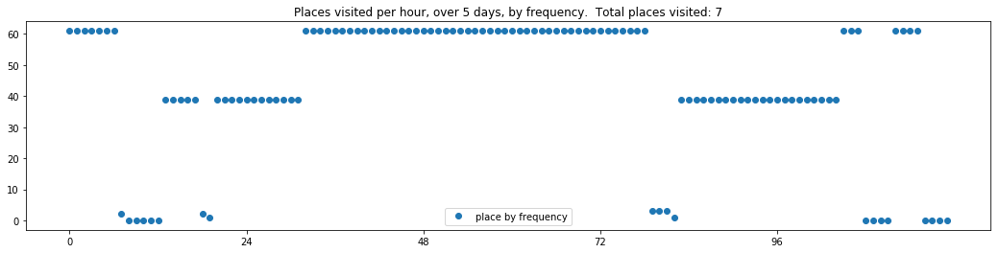

1
----- vector ----
prefix labels:  [7, 7]
[7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 0, 0, 0, 0, 0, 0, 7, 7]
[7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 0, 0, 0, 0, 0]
[0, 7, 7, 7, 7, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 7, 7]
[7, 7, 7, 7, 7, 7, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 7, 7, 7, 0, 0, 0, 0, 0, 0, 0, 0, 8, 0, 7, 9, 0, 7, 7, 0, 0]


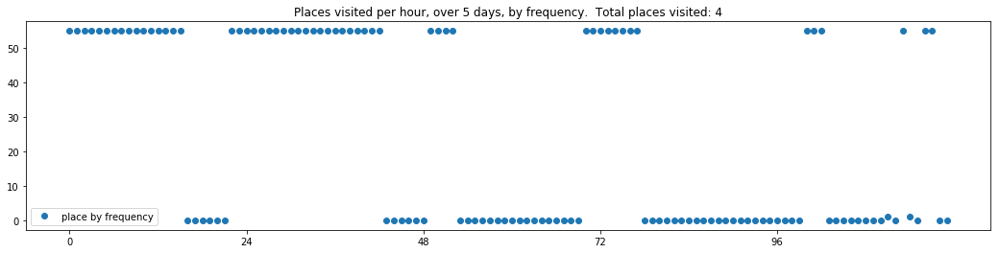

2
----- vector ----
prefix labels:  [10, 12]
[10, 11, 11, 11, 11, 11, 12, 12, 12, 13, 12, 12, 0, 12, 12, 11, 11, 11, 14, 14, 14, 14, 14, 14]
[14, 14, 14, 14, 11, 11, 0, 12, 12, 12, 12, 12, 12, 12, 12, 0, 10, 10, 10, 15, 10, 10, 10, 11]
[11, 11, 11, 11, 11, 11, 12, 12, 12, 12, 12, 13, 12, 12, 11, 11, 11, 11, 0, 16, 17, 17, 17, 17]
[17, 17, 17, 0, 0, 12, 12, 12, 12, 12, 12, 12, 12, 11, 11, 11, 11, 11, 0, 10, 10, 10, 10, 10]
[10, 10, 10, 10, 11, 11, 12, 12, 13, 12, 13, 18, 12, 12, 12, 12, 10, 10, 10, 10, 10, 10, 10, 10]


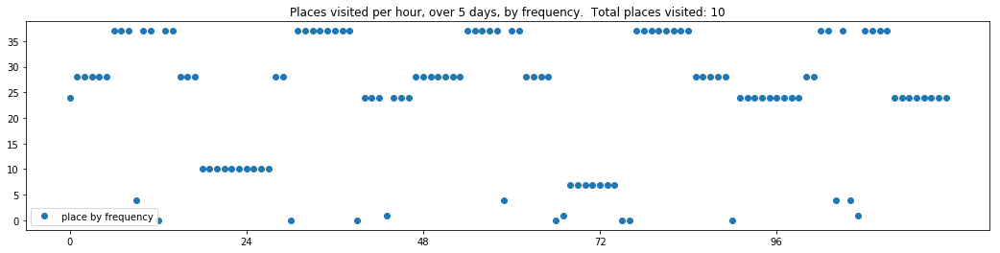

3
----- vector ----
prefix labels:  [19, 19]
[19, 19, 0, 0, 19, 19, 19, 19, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19]
[19, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20, 20, 20, 20, 20, 0]
[0, 0, 0, 0, 0, 0, 0, 19, 21, 21, 21, 21, 21, 21, 21, 0, 0, 19, 19, 19, 19, 19, 19, 22]


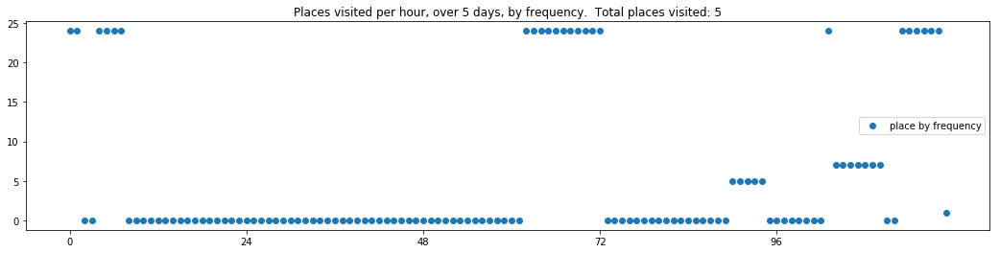

4
----- vector ----
prefix labels:  [23, 24]
[23, 23, 23, 23, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 24, 24, 24, 24, 24, 24, 0, 0, 23, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 23]
[23, 23, 23, 23, 23, 23, 23, 23, 0, 25, 0, 0, 0, 24, 0, 0, 0, 0, 0, 26, 0, 0, 0, 0]


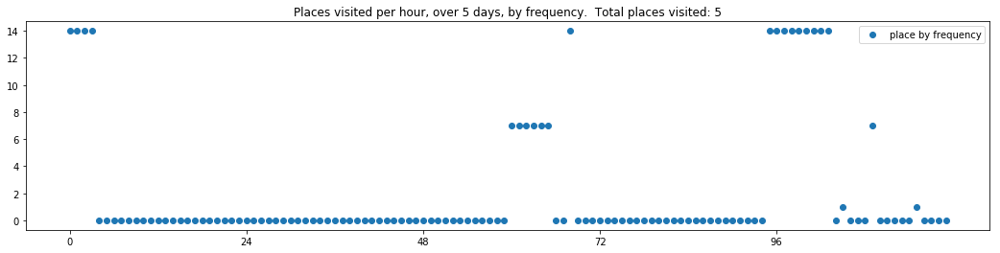

5
----- vector ----
prefix labels:  [27, 27]
[27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 0, 0, 0, 0, 0, 0, 0, 20, 20, 27]
[27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 21, 0, 0, 0, 0, 0, 0, 20, 20, 20]
[27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 21, 0, 0, 0, 0, 0, 0, 20, 20, 20]
[27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 0, 0, 0, 0, 0, 0, 0, 20, 20, 20]
[27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 0, 0, 0, 0, 0, 0, 0, 0, 20, 28, 27]


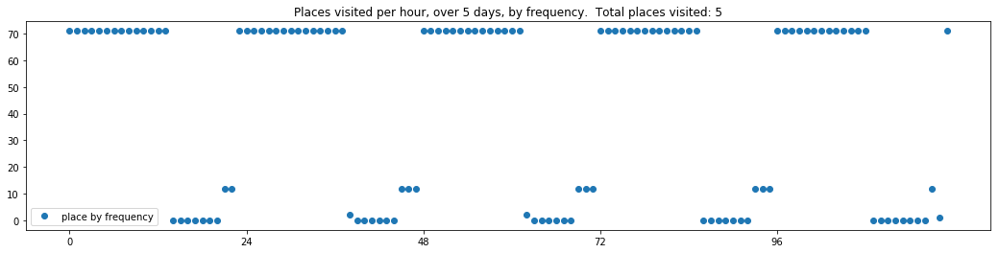

6
----- vector ----
prefix labels:  [29, 29]
[29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 30, 31, 31, 32, 32, 29, 0, 0, 33, 29, 29, 29, 29, 29]
[29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 34, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29]
[29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29]
[29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 0, 35, 29, 29, 29, 29, 29, 29, 32, 29, 29, 29]
[29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 36, 36, 0, 29, 29, 29, 29, 29, 29, 29, 0, 0, 0, 29]


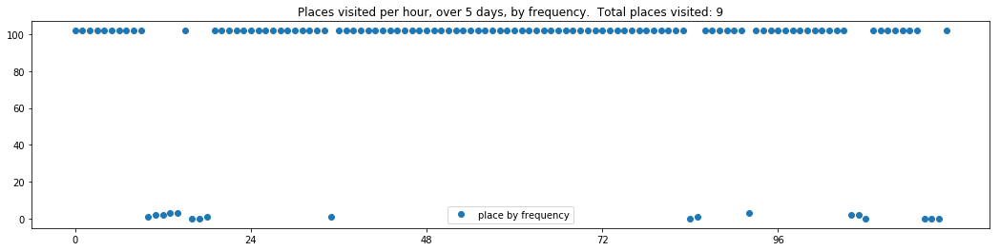

7
----- vector ----
prefix labels:  [37, 38]
[37, 37, 37, 37, 37, 37, 37, 37, 37, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 37, 37]
[37, 37, 37, 37, 37, 37, 38, 38, 38, 38, 38, 38, 38, 38, 0, 0, 0, 0, 0, 0, 39, 39, 39, 39]
[0, 0, 0, 0, 0, 0, 0, 37, 0, 0, 0, 0, 0, 0, 38, 38, 38, 38, 38, 38, 38, 37, 37, 37]
[37, 37, 37, 37, 37, 37, 37, 37, 37, 0, 38, 38, 38, 38, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39]
[37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 0, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39]


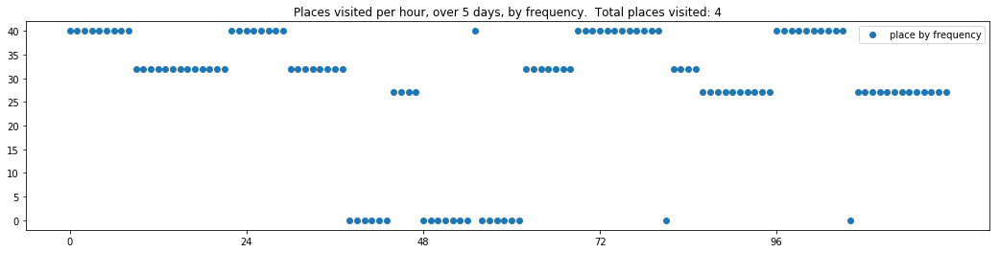

8
----- vector ----
prefix labels:  [41, 41]
[40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 20, 20, 20, 20, 20, 20, 40, 40, 40, 40, 40]
[40, 40, 40, 40, 40, 40, 0, 20, 20, 20, 0, 0, 0, 0, 0, 0, 0, 0, 40, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20, 0, 0, 0, 0, 0, 41, 41, 41, 41, 41]
[41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41]
[41, 41, 41, 41, 41, 41, 41, 40, 40, 40, 40, 40, 0, 0, 40, 40, 41, 41, 0, 42, 41, 41, 41, 41]


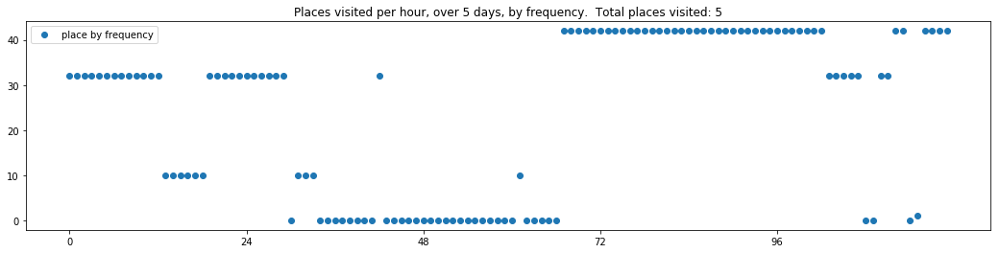

9
----- vector ----
prefix labels:  [43, 43]
[43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43]
[43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 44, 0, 0, 43, 43, 43, 43, 0, 0, 43, 43, 43]
[43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 0, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43]
[43, 43, 43, 43, 43, 43, 43, 43, 43, 0, 0, 0, 43, 43, 43, 43, 43, 43, 43, 0, 0, 0, 43, 43]
[43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 0, 0, 0, 0, 0]


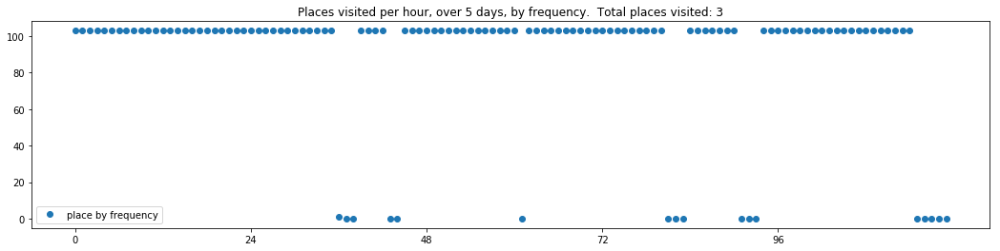

10
----- vector ----
prefix labels:  [45, 45]
[45, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 45, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 46, 0, 0, 0, 0]
[0, 45, 45, 45, 45, 45, 45, 0, 0, 0, 45, 0, 0, 0, 0, 0, 0, 0, 45, 0, 0, 47, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 48, 0, 0, 45, 45, 45, 0, 0, 0, 45, 0, 0]


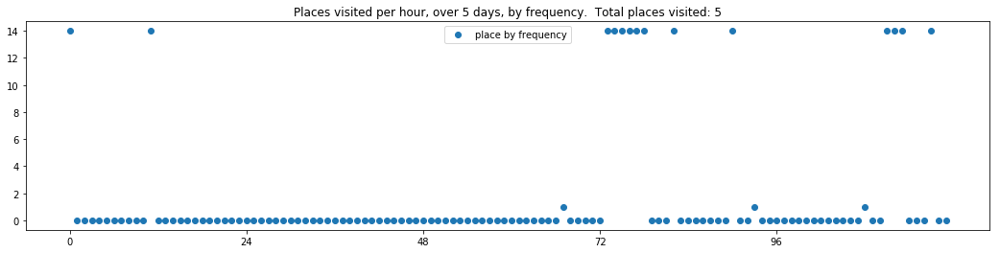

11
----- vector ----
prefix labels:  [49, 49]
[20, 0, 20, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 20, 50, 50, 51, 0, 20, 0, 0, 0]
[20, 0, 0, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 20, 20, 0, 52, 0, 22, 20, 53, 20]
[20, 0, 49, 49, 0, 0, 0, 0, 0, 0, 49, 49, 49, 20, 0, 54, 0, 0, 49, 20, 0, 0, 0, 55]
[20, 0, 0, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 56, 0, 57, 22, 20, 0, 0]
[0, 20, 20, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 58, 59, 59, 0, 58, 58, 49, 49, 20, 0, 20]


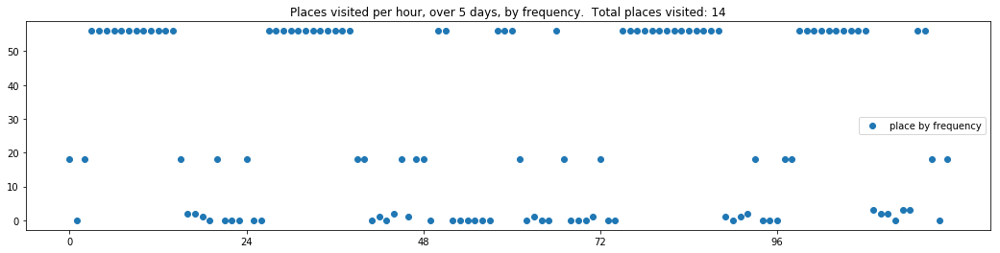

12
----- vector ----
prefix labels:  [60, 0]
[60, 60, 0, 0, 60, 60, 0, 61, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 62, 62, 62, 62, 62, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 60, 60]
[60, 60, 60, 60, 60, 60, 60, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 60]
[60, 60, 60, 60, 60, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 60]


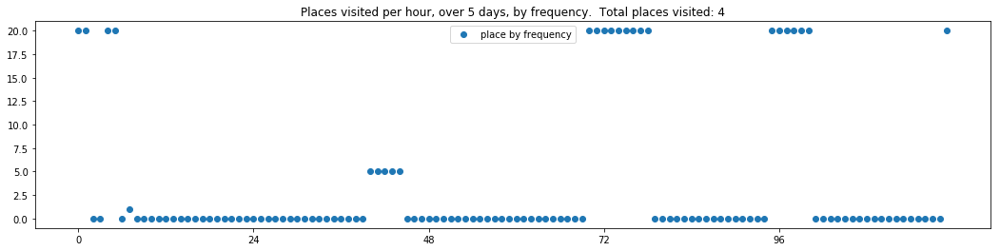

13
----- vector ----
prefix labels:  [64, 65]
[63, 63, 0, 0, 0, 64, 64, 64, 65, 65, 65, 65, 65, 65, 65, 64, 64, 64, 64, 64, 64, 64, 64, 64]
[64, 64, 64, 64, 64, 64, 64, 64, 66, 65, 65, 65, 65, 65, 65, 31, 31, 67, 31, 31, 64, 64, 64, 64]
[64, 64, 64, 64, 64, 64, 64, 64, 64, 0, 65, 65, 65, 65, 65, 66, 64, 64, 64, 64, 68, 64, 64, 64]
[64, 64, 64, 64, 64, 64, 64, 64, 64, 65, 65, 65, 65, 65, 65, 64, 64, 64, 64, 69, 31, 31, 64, 64]
[64, 64, 64, 64, 64, 64, 64, 64, 65, 65, 65, 65, 31, 31, 31, 0, 0, 66, 66, 64, 64, 64, 64, 64]


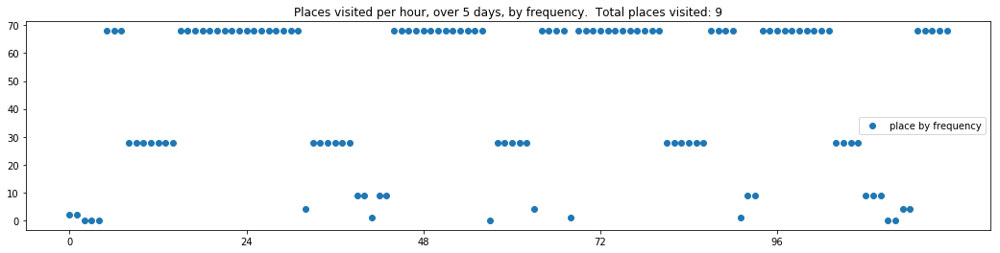

14
----- vector ----
prefix labels:  [70, 71]
[70, 70, 70, 70, 70, 70, 70, 71, 71, 71, 71, 71, 71, 71, 71, 71, 70, 70, 70, 70, 70, 70, 70, 70]
[0, 70, 70, 70, 70, 70, 70, 71, 71, 71, 0, 0, 0, 0, 70, 70, 70, 70, 70, 70, 70, 70, 70, 21]
[70, 70, 70, 70, 70, 70, 70, 71, 71, 71, 71, 71, 71, 71, 71, 72, 70, 70, 70, 70, 70, 70, 70, 70]
[70, 70, 70, 70, 70, 70, 70, 71, 71, 71, 71, 71, 71, 71, 71, 0, 70, 70, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 70, 70, 70, 0, 0, 0, 0, 0, 0, 0]


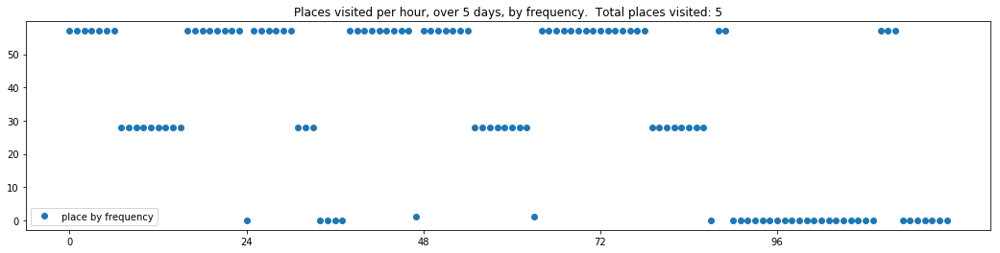

15
----- vector ----
prefix labels:  [15, 73]
[15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 73, 73, 73, 73, 73, 73, 73, 15, 15, 15, 15, 15, 15, 15]
[15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 0, 15, 73, 73, 73, 73, 73, 73, 73, 73, 73]
[15, 15, 15, 15, 15, 15, 15, 15, 15, 73, 73, 73, 73, 73, 73, 73, 73, 73, 15, 0, 15, 15, 52, 52]
[52, 52, 52, 52, 52, 52, 52, 52, 52, 52, 52, 52, 74, 74, 8, 8, 21, 21, 21, 21, 52, 52, 52, 15]
[15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 0, 0, 0, 0, 0, 0, 0, 0]


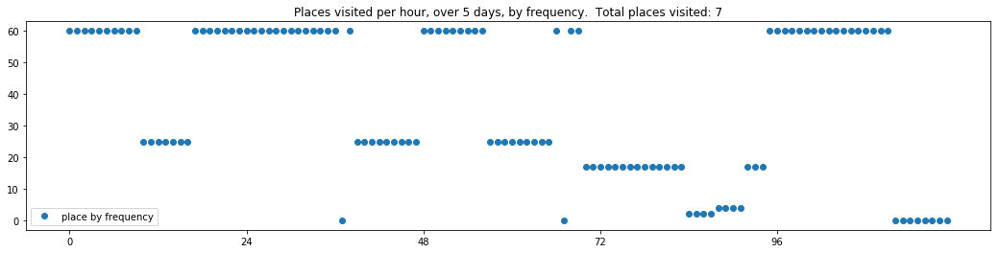

16
----- vector ----
prefix labels:  [75, 75]
[75, 75, 75, 75, 75, 75, 75, 76, 76, 76, 76, 0, 0, 77, 77, 77, 77, 77, 75, 75, 75, 75, 75, 75]
[75, 75, 75, 75, 75, 75, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 75, 75, 75, 75, 75, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 75, 75]
[75, 75, 75, 75, 75, 75, 75, 75, 75, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 75, 75, 75, 75, 75, 75, 75, 75, 75, 75, 75, 75]


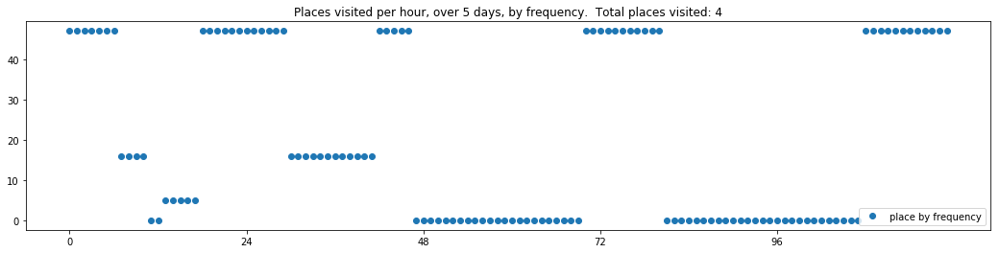

17
----- vector ----
prefix labels:  [78, 31]
[78, 78, 78, 78, 31, 79, 79, 80, 81, 31, 31, 13, 13, 34, 82, 83, 3, 31, 31, 78, 78, 20, 84, 78]
[78, 78, 78, 78, 31, 31, 31, 80, 82, 31, 31, 31, 31, 31, 35, 83, 0, 0, 0, 0, 78, 20, 84, 78]
[78, 78, 0, 78, 31, 31, 83, 83, 82, 31, 31, 31, 31, 31, 31, 85, 31, 31, 78, 78, 20, 20, 84, 78]
[78, 78, 78, 0, 0, 0, 80, 80, 82, 31, 31, 31, 31, 31, 82, 80, 35, 86, 78, 78, 20, 20, 84, 78]
[78, 78, 78, 78, 31, 31, 31, 80, 82, 31, 31, 31, 31, 31, 81, 80, 3, 85, 85, 78, 20, 53, 78, 78]


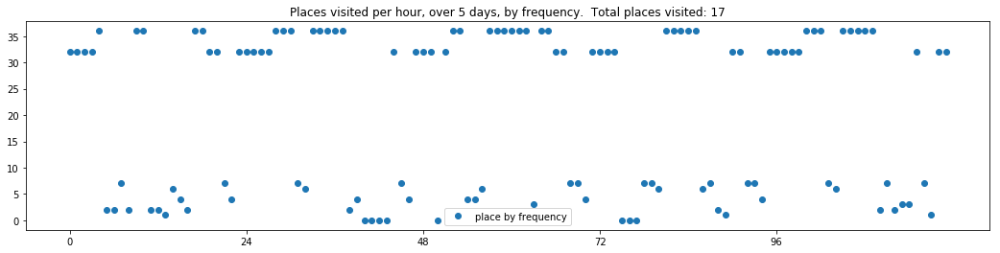

18
----- vector ----
prefix labels:  [87, 87]
[87, 87, 87, 87, 87, 87, 87, 87, 88, 89, 89, 89, 89, 89, 89, 89, 0, 89, 89, 0, 90, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 89, 0, 0, 0, 89, 89, 89, 89, 0, 0, 0, 87, 87, 87]
[87, 87, 87, 87, 87, 87, 87, 87, 87, 87, 87, 87, 87, 87, 87, 87, 87, 87, 91, 87, 87, 87, 87, 87]
[87, 87, 87, 87, 87, 87, 87, 87, 89, 89, 89, 87, 87, 87, 87, 87, 87, 87, 87, 0, 0, 0, 87, 87]
[87, 87, 87, 87, 87, 87, 87, 87, 87, 87, 87, 87, 87, 92, 0, 87, 87, 87, 0, 0, 0, 0, 0, 0]


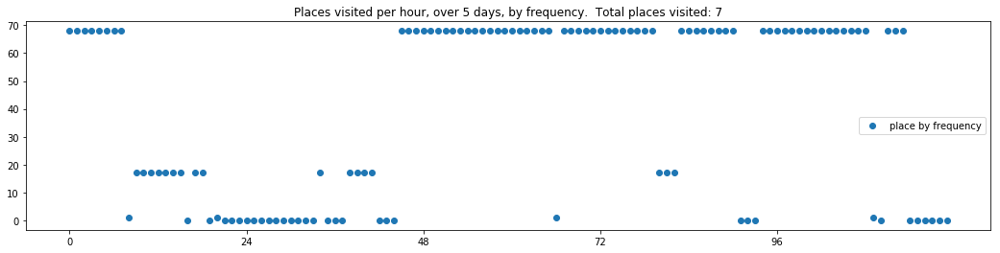

19
----- vector ----
prefix labels:  [93, 94]
[93, 93, 93, 93, 93, 93, 93, 93, 0, 0, 0, 0, 0, 0, 0, 94, 0, 93, 93, 93, 93, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 93, 93, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 94, 94, 94, 94, 94, 94, 0, 0, 95, 0, 0, 0, 0, 0, 93]
[93, 93, 93, 93, 93, 93, 93, 93, 0, 0, 94, 94, 94, 94, 94, 94, 94, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 93, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 4, 4, 4, 4]


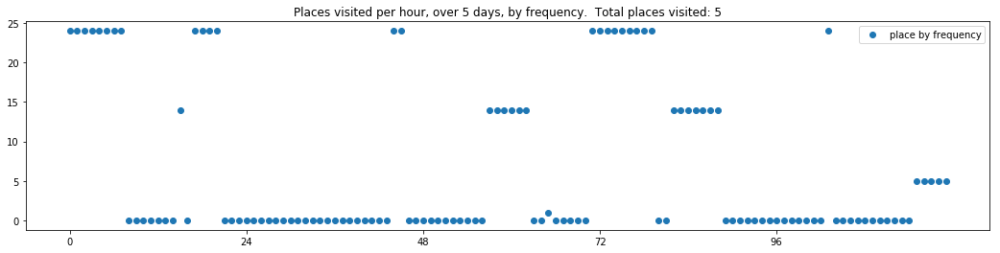

In [7]:
for t, tv in enumerate(real_trajectories[:20]):
    print(t)
    print_dwell_vector_by_days(tv)
    plot_trajectory_vector_frequencies(tv, by_frequency_order=False)

Evaluate the SeqGAN output

In [87]:
import re

def get_eval_files():
    filenames = {}
    # There are a bunch of evaluation files saved in the following directory
    seqgan_eval_files_dir = '/Users/aberke/projects/gan-hacking/SeqGAN/save/'
    for filename in os.listdir(seqgan_eval_files_dir):
        eval_num = re.findall(r'\d+', filename)
        if not (filename.startswith('eval_file_') and len(eval_num)):
            continue
        eval_num = int(eval_num[0])
        fullfilename = seqgan_eval_files_dir + filename
        filenames[eval_num] = fullfilename
    return filenames

eval_filenames = get_eval_files()


------
 0 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_0.txt 
------

----- vector ----
prefix labels:  [340, 340]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 340, 477, 477, 477, 0, 0, 0]
[0, 0, 0, 581, 367, 174, 174, 174, 174, 174, 0, 0, 0, 0, 0, 0, 174, 174, 174, 174, 174, 174, 174, 174]
[174, 174, 174, 174, 0, 0, 621, 242, 242, 242, 242, 0, 22, 21, 21, 21, 21, 21, 0, 0, 0, 0, 0, 0]
[0, 0, 21, 21, 21, 21, 21, 13, 13, 21, 21, 629, 629, 629, 272, 272, 454, 397, 0, 0, 20, 20, 41, 41]
[41, 0, 0, 0, 0, 0, 0, 0, 0, 0, 479, 444, 444, 41, 629, 0, 0, 629, 629, 629, 629, 629, 629, 629]


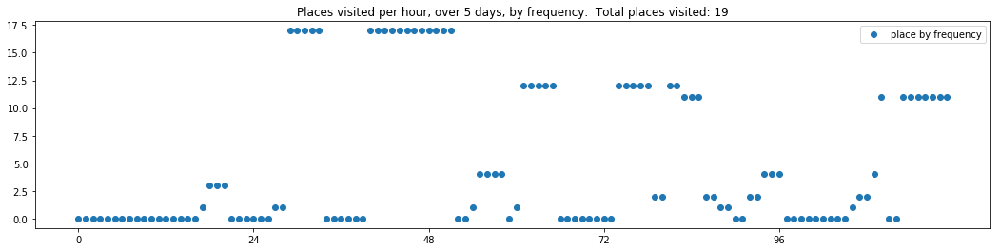

----- vector ----
prefix labels:  [581, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 398, 398, 0, 0, 0, 0, 163, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 55, 53]
[39, 39, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 482, 482, 0, 581, 581, 581, 581, 581]
[581, 581, 0, 0, 0, 0, 130, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 163, 163, 0, 0, 0, 0, 0, 130, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


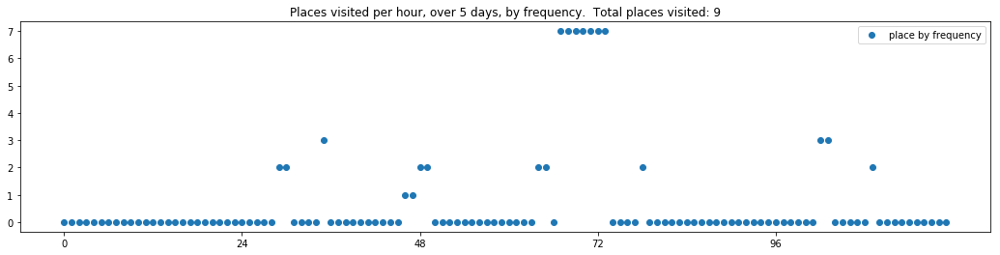

----- vector ----
prefix labels:  [568, 527]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20, 20, 20, 20, 20, 20, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20, 20, 20, 20, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


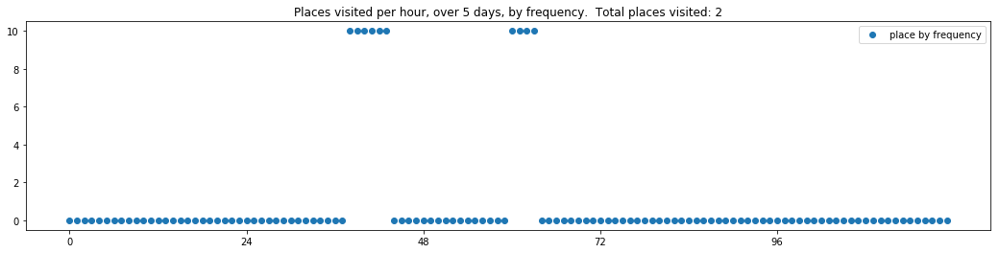

----- vector ----
prefix labels:  [411, 411]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 411, 411, 411, 411, 411, 411, 411, 411, 411, 411, 411, 411]
[411, 411, 411, 411, 411, 411, 411, 411, 411, 411, 411, 411, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 16]
[0, 0, 0, 0, 0, 0, 0, 271, 0, 0, 0, 0, 0, 0, 174, 411, 411, 411, 174, 193, 76, 76, 76, 76]


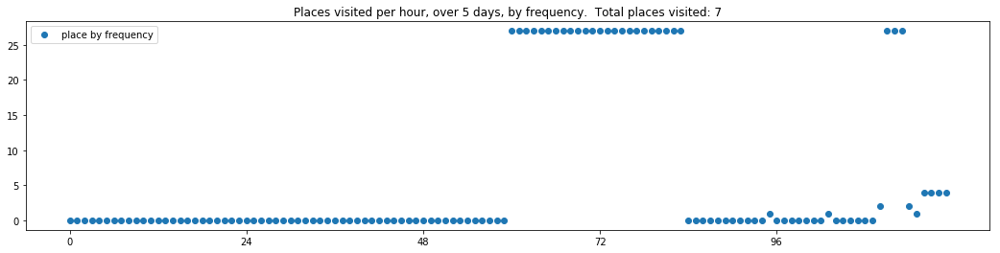

----- vector ----
prefix labels:  [165, 608]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 91, 0, 165, 165, 165, 165, 165, 165, 165, 165, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[493, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 311, 0, 311]
[311, 311, 311, 311, 608, 608, 608, 608, 608, 608, 608, 608, 608, 608, 608, 608, 608, 608, 608, 608, 608, 608, 608, 608]


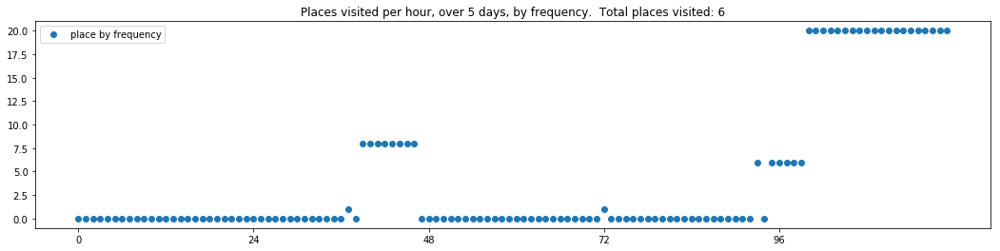

----- vector ----
prefix labels:  [417, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 55, 0, 0, 0, 0, 56, 178, 0, 0, 0, 0]
[374, 374, 0, 417, 417, 417, 417, 417, 417, 417, 417, 417, 21, 0, 451, 417, 417, 417, 417, 0, 0, 0, 0, 0]
[0, 0, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417]
[417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417]


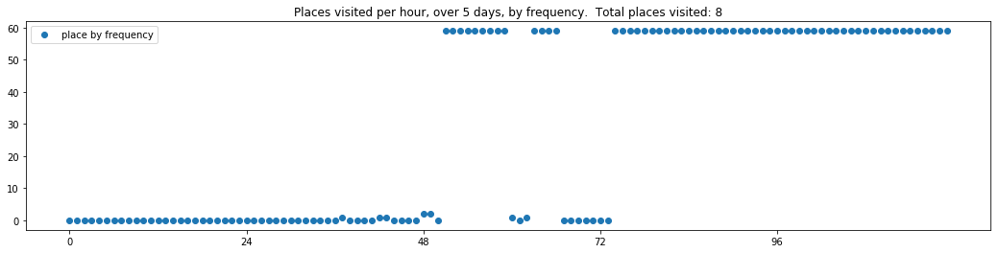

----- vector ----
prefix labels:  [76, 116]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 55, 55, 0]
[307, 473, 0, 0, 0, 116, 116, 116, 116, 116, 116, 116, 116, 116, 116, 116, 116, 116, 116, 116, 116, 116, 116, 0]
[364, 373, 373, 373, 373, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 8, 0, 0, 0, 0, 184, 184, 0, 0, 0, 0]


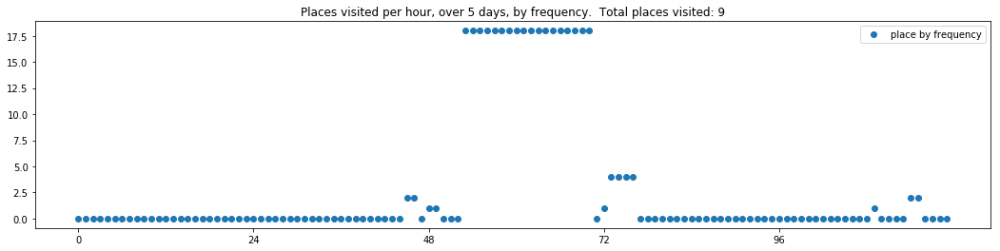

----- vector ----
prefix labels:  [433, 433]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[433, 433, 433, 433, 433, 433, 433, 433, 433, 433, 433, 433, 433, 433, 433, 433, 433, 433, 433, 433, 433, 433, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 433, 433, 433, 433, 433, 433, 433]
[433, 433, 433, 433, 433, 433, 433, 433, 433, 433, 433, 433, 433, 318, 223, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


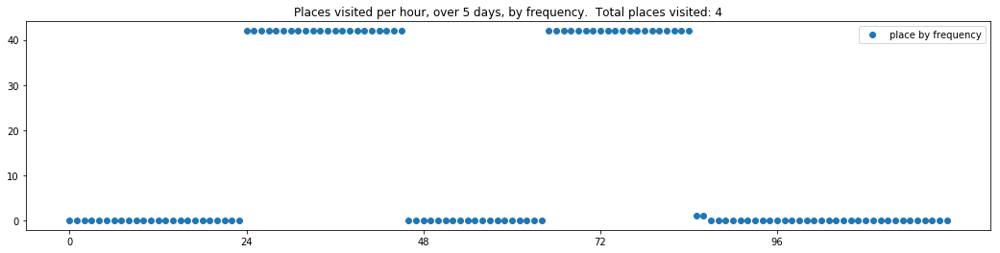

----- vector ----
prefix labels:  [108, 44]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44]
[44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 0, 0, 0, 0, 0, 44, 0, 44, 44, 44, 44, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 126, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 0, 44]


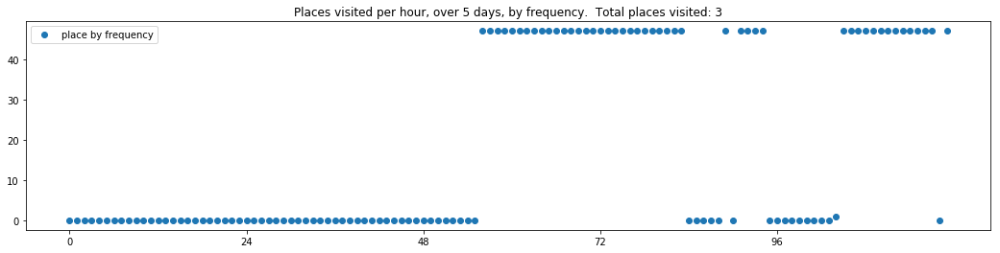

----- vector ----
prefix labels:  [85, 288]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 141, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[16, 181, 0, 0, 0, 0, 0, 87, 58, 58, 58, 58, 0, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36]
[36, 36, 36, 36, 36, 36, 36, 36, 393, 393, 51, 58, 58, 58, 58, 58, 58, 58, 58, 58, 58, 58, 58, 58]


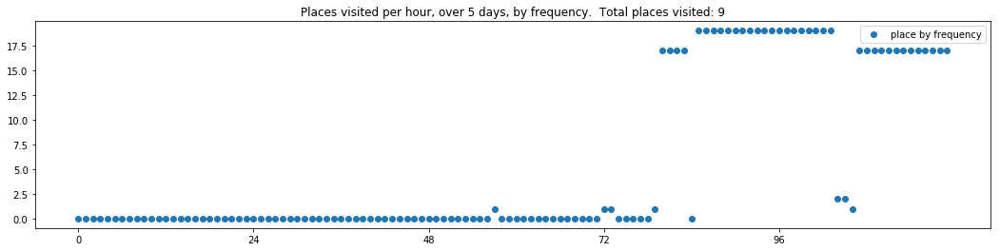


------
 5 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_5.txt 
------

----- vector ----
prefix labels:  [437, 437]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 437, 437, 437, 437, 437, 437, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 437, 437, 437, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 437]
[437, 437, 437, 437, 437, 437, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


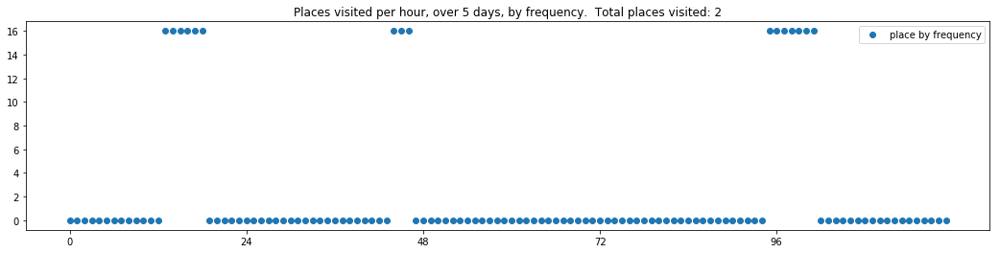

----- vector ----
prefix labels:  [511, 511]
[0, 0, 0, 0, 0, 0, 0, 0, 356, 356, 356, 356, 356, 356, 356, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 32, 0, 0, 84, 84, 84, 84, 84, 84, 84, 84, 84, 84, 84, 84, 84, 84, 84]
[84, 84, 84, 84, 84, 84, 84, 84, 84, 84, 84, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511]
[511, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511, 0]
[0, 0, 0, 225, 225, 225, 0, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511]


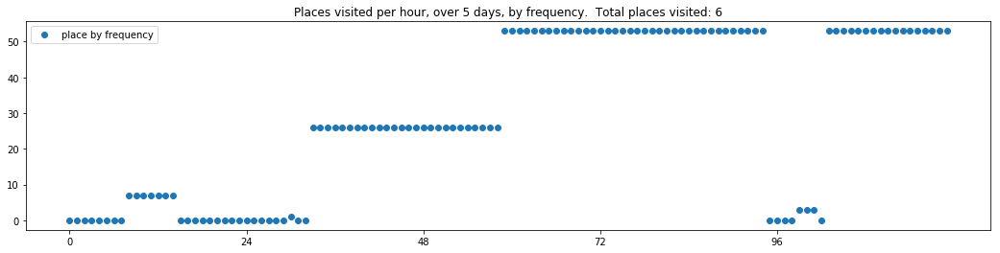

----- vector ----
prefix labels:  [195, 195]
[0, 0, 0, 0, 0, 195, 195, 195, 0, 0, 0, 195, 195, 195, 195, 195, 195, 195, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 195, 195, 195, 195, 195, 195, 0, 0, 0, 0, 0, 0, 0, 0, 195, 195, 195, 195, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 205, 205, 205, 195, 0, 195, 20, 0, 0]


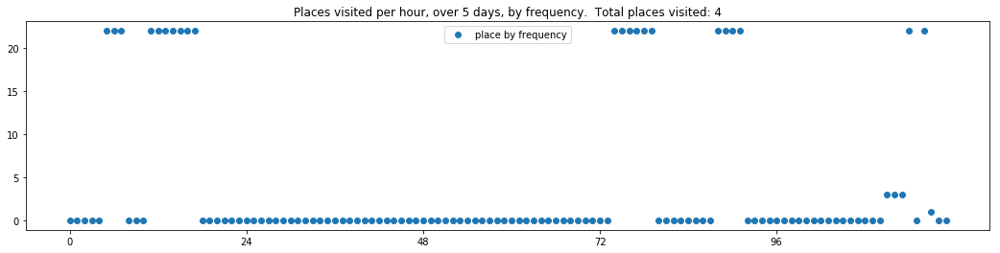

----- vector ----
prefix labels:  [388, 419]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 419, 419, 419, 419, 419, 419, 419, 71, 71, 71, 0, 0, 0, 0, 0, 0, 0, 0, 71, 0, 0, 0, 0]


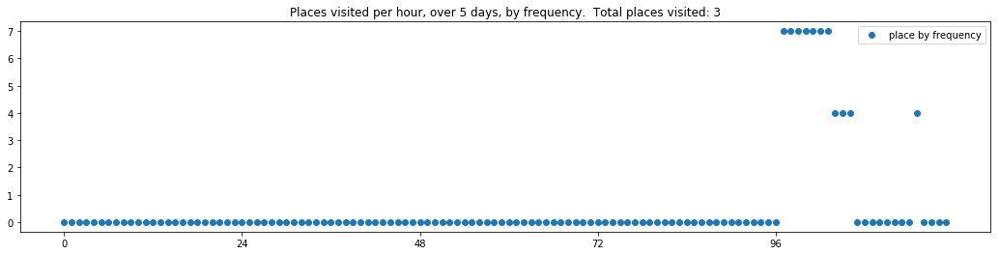

----- vector ----
prefix labels:  [44, 44]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 185, 74, 0, 0, 561, 561]
[561, 561, 0, 0, 0, 0, 0, 0, 0, 0, 0, 548, 508, 0, 295, 295, 147, 20, 10, 261, 261, 20, 20, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 360, 360, 360, 360, 0, 507, 5, 5, 5, 5, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 435, 435, 0, 0, 0, 0, 0, 0, 638, 0]
[0, 0, 0, 485, 0, 0, 0, 261, 261, 261, 261, 261, 261, 261, 261, 146, 146, 0, 2, 2, 2, 2, 2, 2]


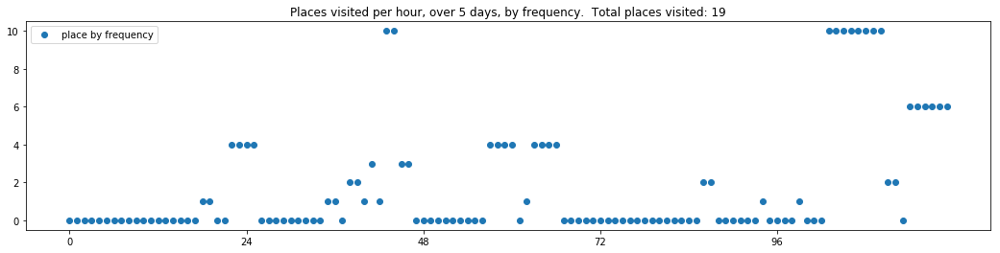

----- vector ----
prefix labels:  [154, 154]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 154, 154, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 112, 112, 112, 154, 154, 154, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 112, 112, 112, 112, 112, 593, 593, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 419, 419, 69, 154, 154, 112, 112, 112, 112, 0, 0, 0, 0, 112, 112, 154, 154, 154, 154, 154, 154]
[154, 154, 154, 154, 154, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 112, 112, 154, 154, 154]


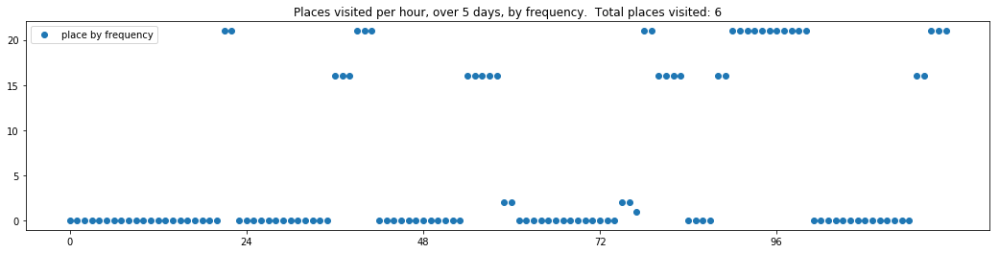

----- vector ----
prefix labels:  [39, 232]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 313, 313, 313, 313, 313, 313, 313, 313, 313]
[313, 313, 313, 313, 313, 313, 313, 313, 313, 313, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


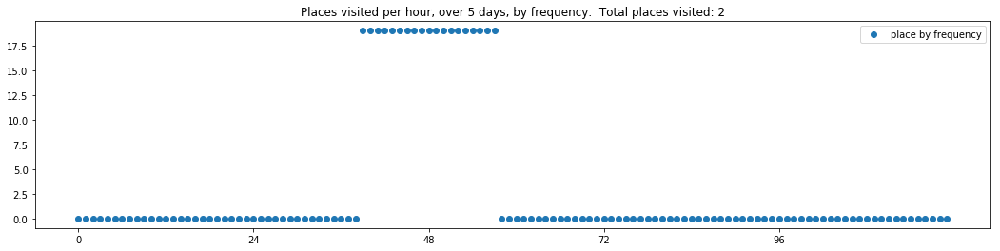

----- vector ----
prefix labels:  [22, 22]
[0, 0, 0, 0, 0, 0, 0, 22, 22, 0, 0, 0, 0, 0, 0, 0, 22, 22, 22, 22, 22, 22, 22, 22]
[22, 22, 22, 22, 22, 22, 22, 307, 307, 307, 307, 307, 307, 0, 0, 0, 0, 0, 0, 22, 22, 22, 22, 22]
[20, 20, 0, 0, 0, 0, 21, 0, 0, 0, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 22, 22, 271, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 162, 0, 0, 0, 0, 0, 0, 0, 0, 20, 22]


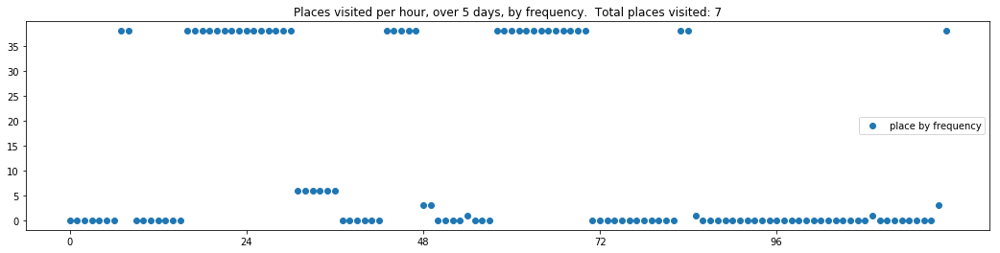

----- vector ----
prefix labels:  [122, 503]
[0, 0, 0, 25, 332, 332, 332, 332, 332, 332, 586, 586, 586, 586, 586, 586, 586, 523, 116, 116, 0, 0, 0, 503]
[503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503]
[503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503]
[503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503]
[503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 199, 199, 199, 199, 199, 199, 199, 199, 197]


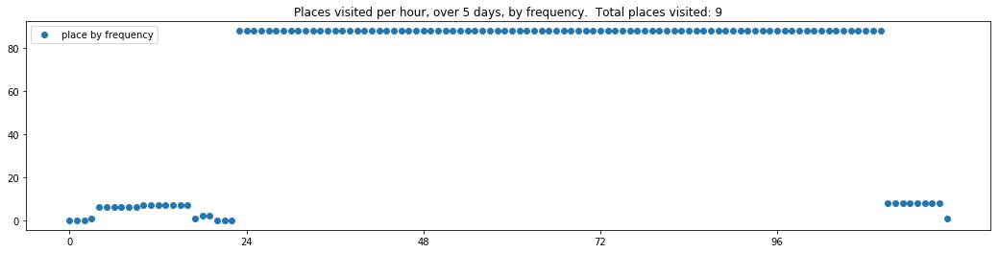

----- vector ----
prefix labels:  [183, 21]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 464, 3, 3, 261, 388, 388, 388, 388, 388]
[388, 388, 388, 388, 388, 388, 388, 388, 388, 388, 388, 388, 388, 0, 0, 0, 0, 573, 573, 574, 0, 0, 476, 330]
[330, 288, 393, 239, 239, 239, 239, 239, 84, 476, 0, 0, 388, 430, 430, 430, 0, 227, 227, 561, 227, 227, 227, 227]
[227, 227, 227, 227, 227, 561, 561, 561, 227, 0, 561, 561, 561, 561, 561, 561, 561, 561, 561, 561, 561, 561, 561, 561]
[561, 561, 561, 561, 561, 561, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 480, 480]


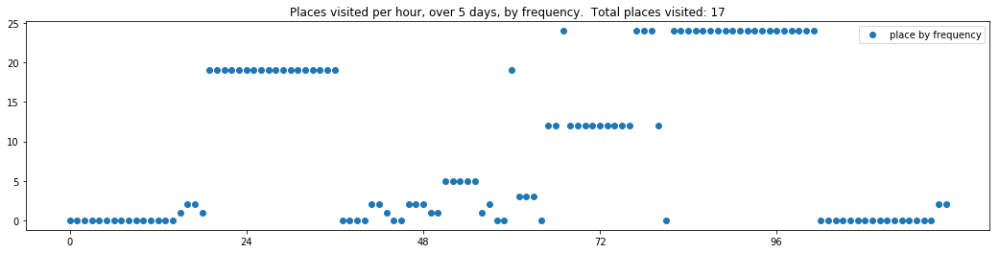


------
 10 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_10.txt 
------

----- vector ----
prefix labels:  [321, 321]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


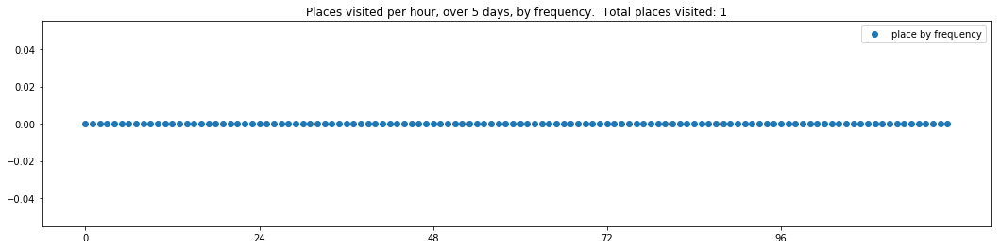

----- vector ----
prefix labels:  [618, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 618, 618, 618, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 385, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[336, 336, 336, 336, 336, 336, 336, 336, 336, 336, 336, 0, 0, 0, 0, 0, 0, 0, 0, 404, 404, 0, 0, 0]
[0, 0, 424, 424, 424, 424, 424, 424, 424, 424, 236, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 223, 0]


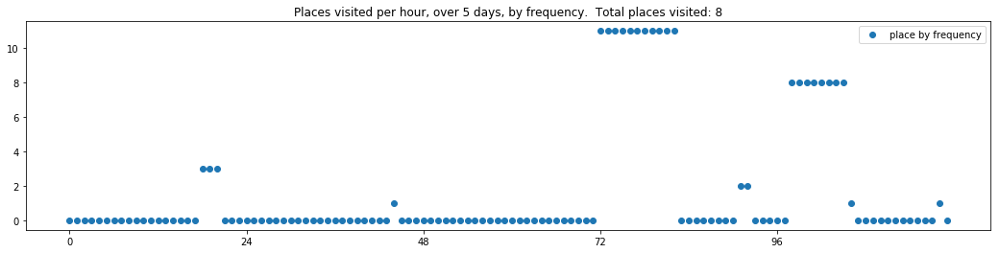

----- vector ----
prefix labels:  [22, 22]
[0, 0, 0, 0, 22, 22, 22, 162, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 22, 22, 22, 0, 0, 0, 0, 0, 0, 22, 22, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 342, 342]
[271, 271, 271, 271, 271, 271, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 0, 0]
[0, 0, 0, 0, 0, 0, 22, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 52, 52, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


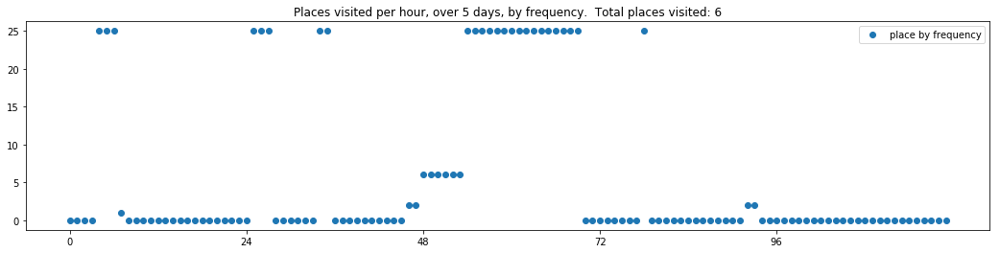

----- vector ----
prefix labels:  [46, 46]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 46, 46, 46, 46, 46, 46, 46]
[46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46]
[46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46]
[46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 0, 0, 0, 0, 0, 0, 46, 46, 46, 46, 46, 46, 46]


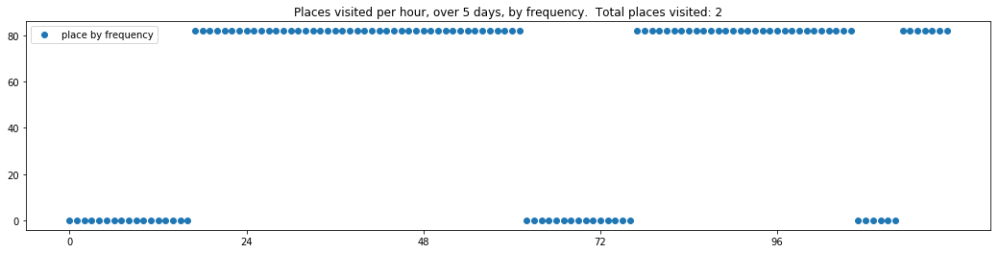

----- vector ----
prefix labels:  [350, 133]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 192, 59, 59, 133, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 541, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 374, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[162, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


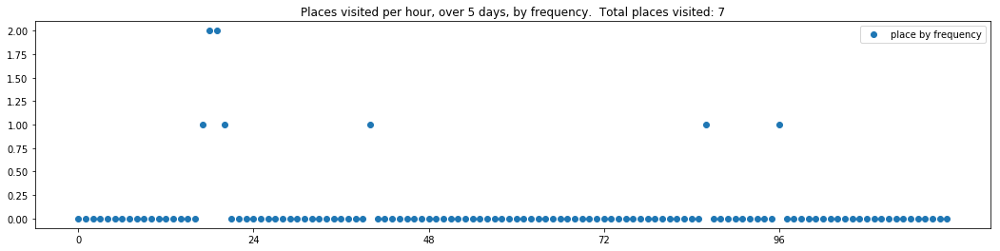

----- vector ----
prefix labels:  [92, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


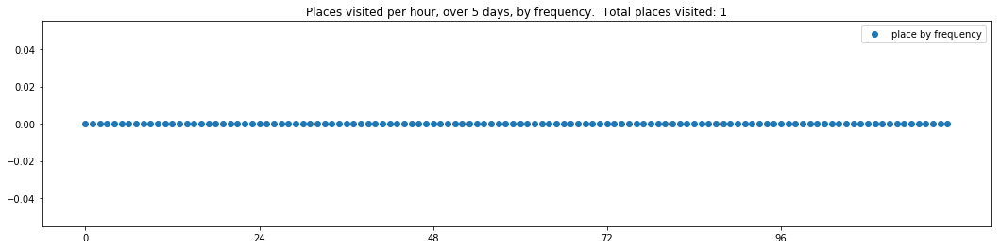

----- vector ----
prefix labels:  [323, 323]
[0, 0, 0, 0, 0, 0, 0, 0, 17, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 225, 225, 0, 225, 225, 225, 225, 225, 225, 225, 225, 225, 225, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 42, 42, 0, 0, 0, 0, 0, 0, 0, 0, 350, 350]
[350, 350, 350, 350, 350, 350, 350, 350, 350, 350, 350, 350, 350, 350, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 225, 225, 225, 225, 225]


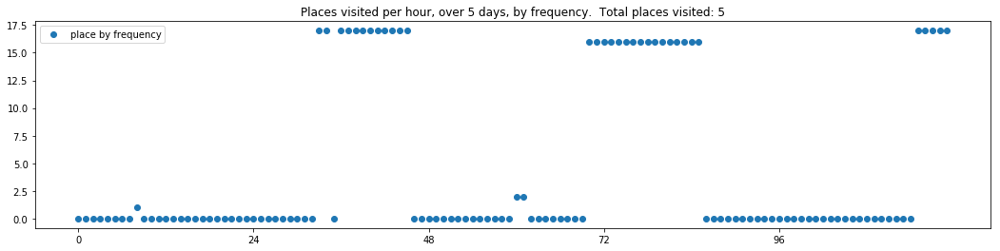

----- vector ----
prefix labels:  [494, 76]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[558, 0, 443, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 464, 464, 0, 464, 464, 464, 464, 464, 558]
[558, 558, 0, 0, 0, 0, 0, 0, 598, 598, 0, 0, 0, 0, 0, 0, 0, 4, 2, 2, 0, 2, 0, 0]
[0, 0, 0, 0, 598, 598, 598, 461, 461, 461, 0, 122, 122, 598, 0, 184, 184, 184, 0, 0, 0, 0, 0, 0]
[475, 116, 116, 116, 0, 0, 0, 0, 0, 0, 0, 0, 70, 612, 612, 0, 370, 370, 249, 257, 257, 257, 257, 257]


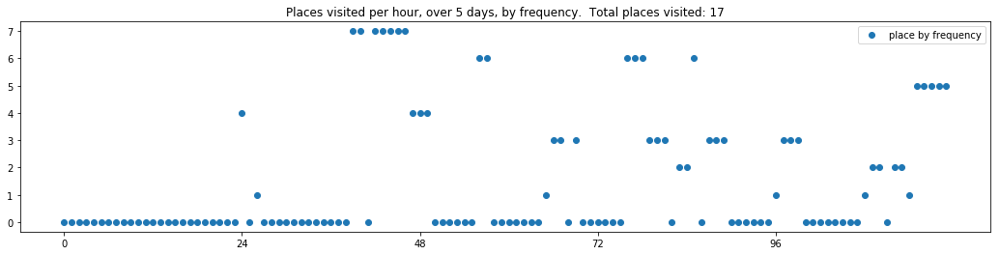

----- vector ----
prefix labels:  [21, 290]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 290, 290, 0, 0, 290, 290, 290, 290, 290, 290]
[290, 290, 290, 558, 558, 558, 558, 558, 558, 290, 290, 290, 290, 290, 290, 290, 290, 290, 556, 447, 76, 76, 22, 22]
[22, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 76, 29, 0, 0, 0, 0, 0, 0, 100, 0, 66]
[66, 66, 66, 0, 0, 0, 56, 143, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


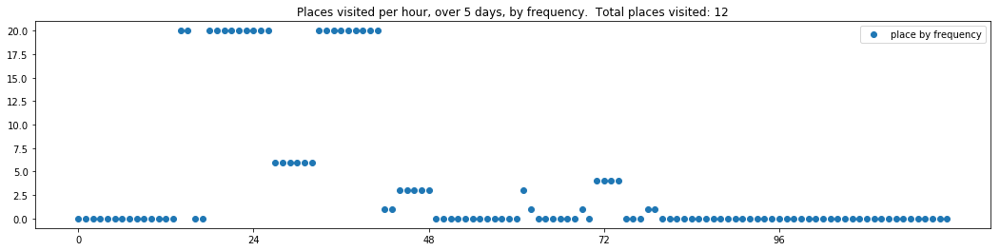

----- vector ----
prefix labels:  [184, 184]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 184, 184, 184]
[184, 184, 0, 0, 0, 0, 0, 0, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184]
[184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184]
[184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184]
[184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184]


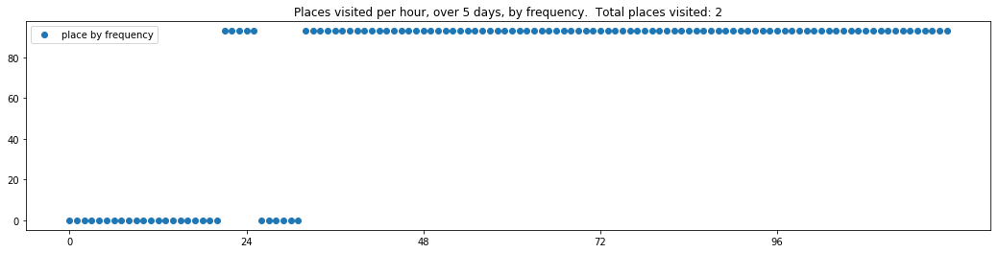


------
 15 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_15.txt 
------

----- vector ----
prefix labels:  [507, 488]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 568, 0, 0, 0, 235, 235, 541, 541, 541, 0, 0, 488, 488, 488, 488, 488, 488, 488, 488, 488, 488]
[488, 488, 488, 488, 488, 488, 488, 488, 488, 45, 45, 488, 488, 488, 488, 488, 488, 488, 488, 488, 488, 0, 0, 507]
[492, 492, 492, 0, 507, 507, 507, 507, 568, 568, 568, 488, 488, 488, 488, 488, 488, 488, 488, 488, 488, 488, 488, 488]
[488, 488, 488, 488, 488, 488, 488, 286, 488, 488, 488, 488, 488, 488, 488, 488, 488, 488, 507, 507, 507, 507, 488, 488]


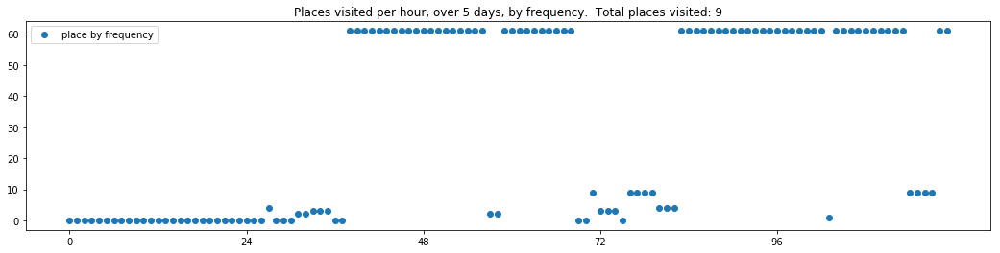

----- vector ----
prefix labels:  [190, 190]
[190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190]
[190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190]
[190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 392, 392, 392]
[392, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190]
[190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 0, 485, 485, 485, 382, 0, 0, 0, 0, 0, 0, 0, 0, 0]


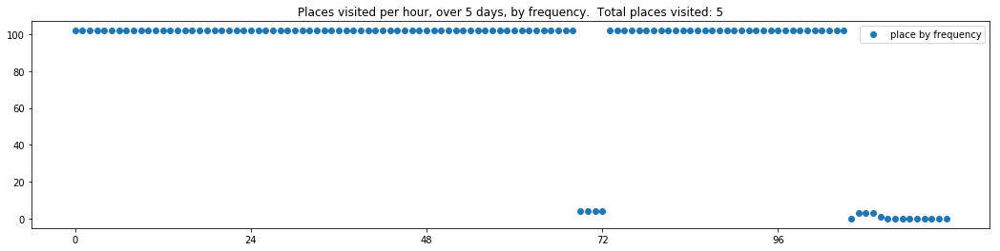

----- vector ----
prefix labels:  [78, 20]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 406, 406, 406, 406, 406, 406, 406, 406]
[406, 406, 406, 406, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


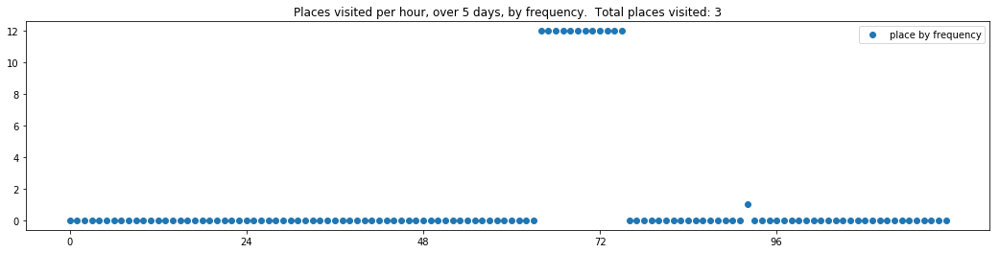

----- vector ----
prefix labels:  [448, 480]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 284, 284, 284, 0, 0, 0, 65, 65, 0, 0, 0, 0, 0, 0, 0, 640, 640, 640, 640]
[640, 640, 640, 640, 640, 640, 640, 640, 640, 640, 640, 640, 0, 0, 0, 0, 0, 0, 0, 0, 0, 640, 640, 640]
[640, 640, 640, 0, 0, 0, 0, 640, 640, 640, 0, 0, 640, 640, 640, 640, 640, 640, 640, 640, 640, 640, 640, 640]


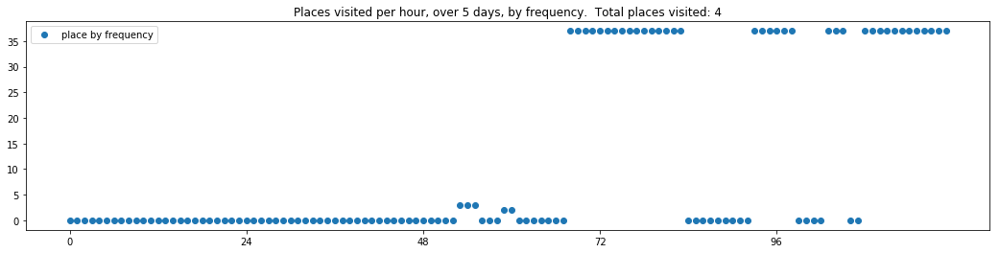

----- vector ----
prefix labels:  [39, 39]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 71, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 39, 39, 187, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39]
[39, 39, 39, 39, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378]
[378, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378]


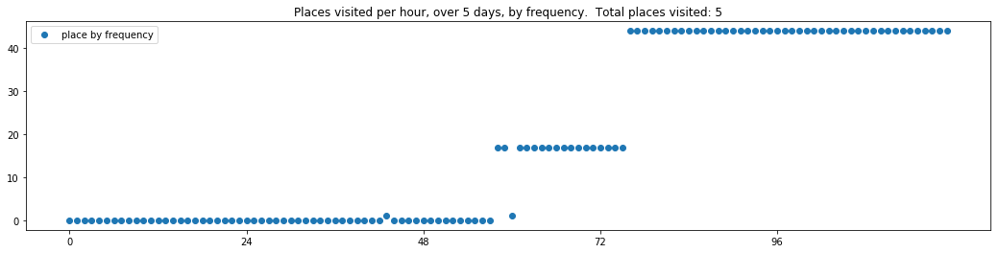

----- vector ----
prefix labels:  [357, 357]
[0, 357, 357, 357, 372, 0, 357, 357, 357, 357, 357, 357, 0, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357]
[357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357]
[357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357]
[357, 357, 357, 400, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 248, 0, 0, 0, 0, 0, 0, 0, 0]


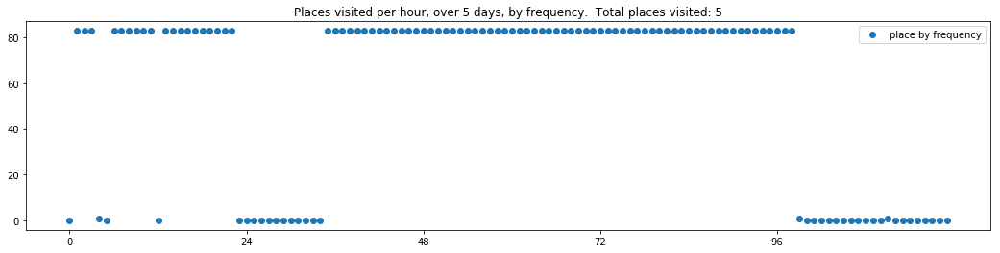

----- vector ----
prefix labels:  [237, 237]
[0, 0, 0, 487, 0, 108, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 46, 46, 46, 46, 46, 46, 502, 502, 502, 502, 502, 0, 108, 0, 502]
[502, 502, 502, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 502, 0, 0, 0, 0, 46, 46, 46, 46]
[46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 0, 46]


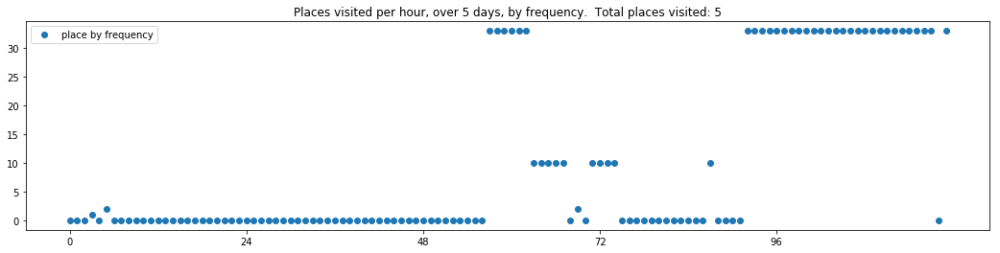

----- vector ----
prefix labels:  [368, 636]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 126, 0, 0, 0, 209, 209, 636, 636, 636, 636]
[636, 636, 429, 429, 0, 429, 429, 429, 334, 334, 334, 57, 57, 57, 57, 0, 0, 0, 0, 0, 0, 0, 8, 8]
[276, 276, 276, 276, 276, 276, 276, 160, 218, 122, 122, 400, 400, 400, 209, 209, 209, 457, 209, 458, 458, 209, 209, 209]
[209, 0, 0, 0, 636, 636, 636, 636, 636, 636, 636, 636, 636, 506, 636, 636, 636, 636, 636, 636, 636, 636, 636, 0]


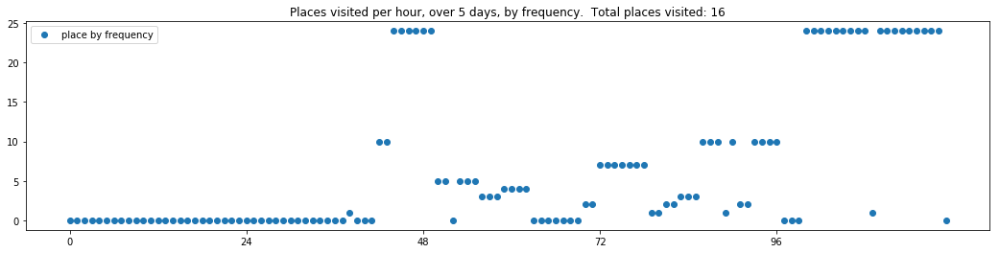

----- vector ----
prefix labels:  [604, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 604, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 244, 244, 0, 0, 0, 0, 0, 187]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[187, 604, 604, 604, 0, 0, 0, 0, 0, 0, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 0, 0, 0]


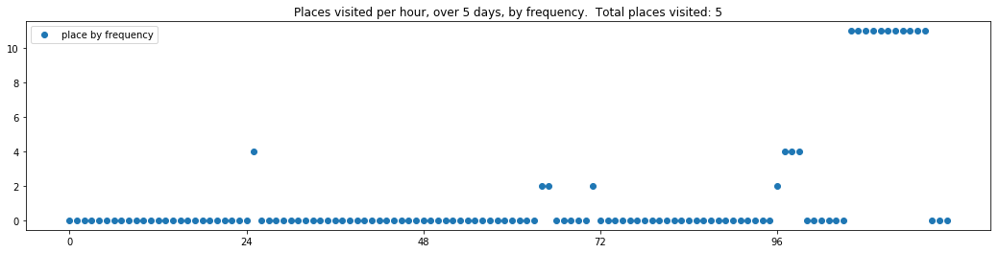

----- vector ----
prefix labels:  [268, 268]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 268, 268, 268, 268, 268, 268, 268, 268]
[268, 268, 268, 268, 0, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 21, 21, 21, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 32, 0, 268, 268, 268, 268, 268]
[268, 268, 268, 0, 0, 0, 0, 0, 0, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 503, 503]


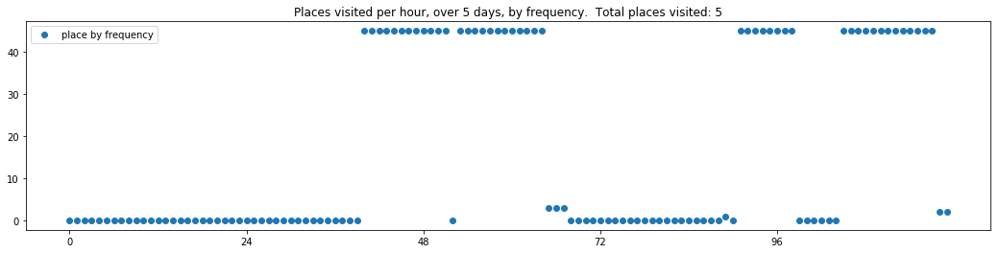


------
 20 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_20.txt 
------

----- vector ----
prefix labels:  [221, 221]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 221, 221, 0, 0, 0, 0, 0, 0, 0, 221, 221, 221, 221, 221, 221]
[221, 221, 221, 221, 221, 221, 221, 221, 221, 221, 221, 221, 221, 221, 221, 221, 221, 221, 221, 221, 221, 221, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 221, 221, 221, 221, 384, 384, 384, 384]
[221, 221, 0, 276, 364, 364, 364, 364, 364, 364, 364, 364, 364, 284, 93, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 116, 116, 116, 116, 116, 116, 116, 116, 116, 116, 116, 116]


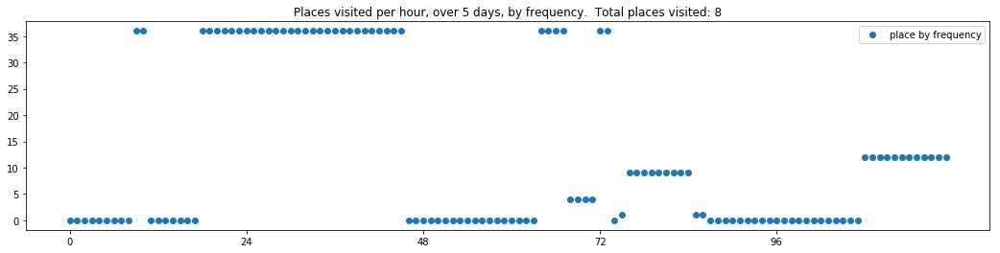

----- vector ----
prefix labels:  [76, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 76, 76, 0, 0, 0, 0, 0, 0, 4, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


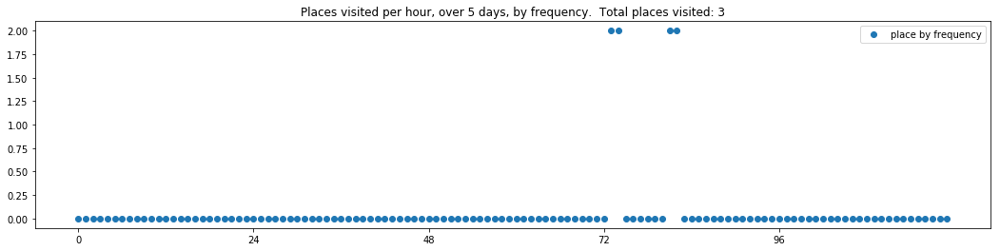

----- vector ----
prefix labels:  [167, 318]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 165, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 110, 110, 110, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 562, 562, 562, 562, 562, 562, 562, 562, 562, 0]
[32, 0, 0, 562, 562, 562, 562, 0, 165, 0, 0, 562, 562, 562, 562, 0, 0, 0, 391, 391, 391, 391, 0, 0]


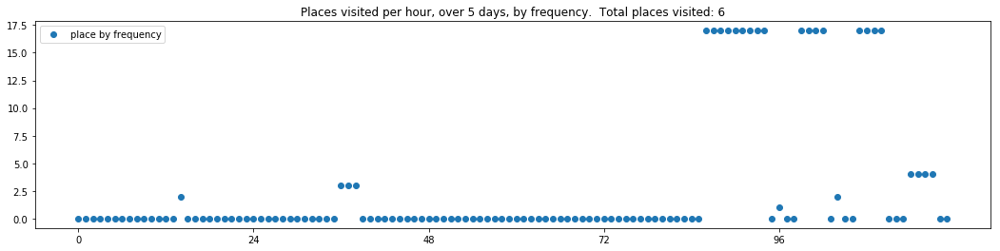

----- vector ----
prefix labels:  [437, 437]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 437, 437, 0, 0, 0, 0, 0, 0, 0]
[437, 437, 437, 437, 437, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 259]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


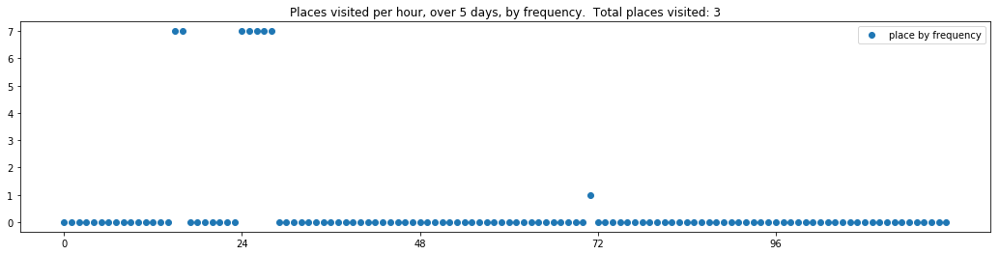

----- vector ----
prefix labels:  [415, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 415, 415, 415, 415, 415, 415, 415, 415, 415, 0, 415]
[415, 415, 415, 415, 415, 415, 415, 415, 415, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20, 0, 0, 0]


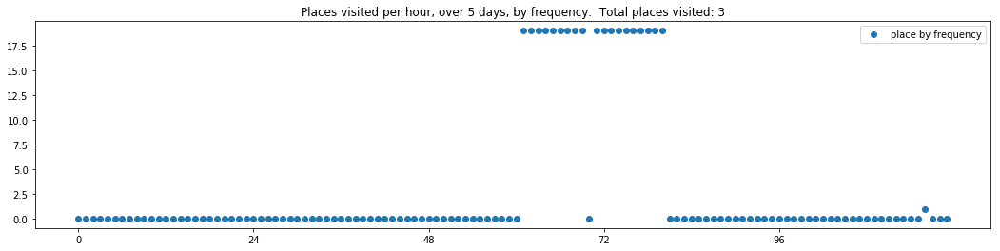

----- vector ----
prefix labels:  [26, 26]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 26, 26, 0, 391, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


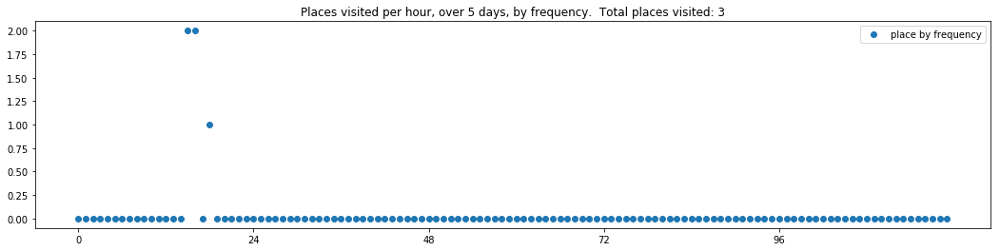

----- vector ----
prefix labels:  [163, 71]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 163, 71, 71, 71, 71, 0, 0, 71, 71, 71, 71, 71, 71, 71, 71, 71]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 71, 71, 0, 0, 0, 0, 0, 151, 151, 151, 71]
[0, 0, 0, 0, 0, 0, 0, 473, 0, 0, 0, 0, 0, 215, 0, 71, 71, 71, 71, 71, 0, 0, 0, 0]
[0, 0, 71, 71, 71, 71, 71, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 71]


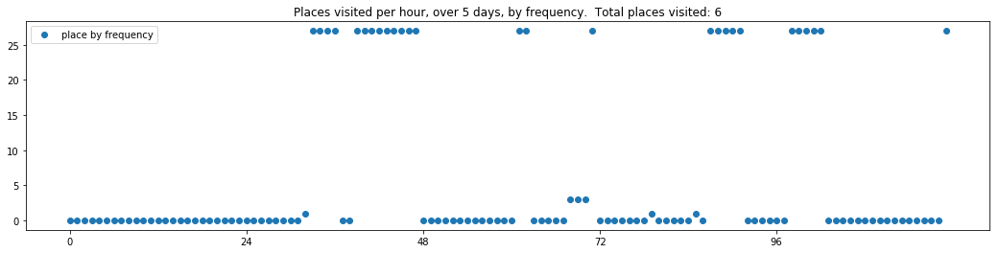

----- vector ----
prefix labels:  [76, 434]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 434, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 32, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 434, 434, 434, 0, 271, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434]
[434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


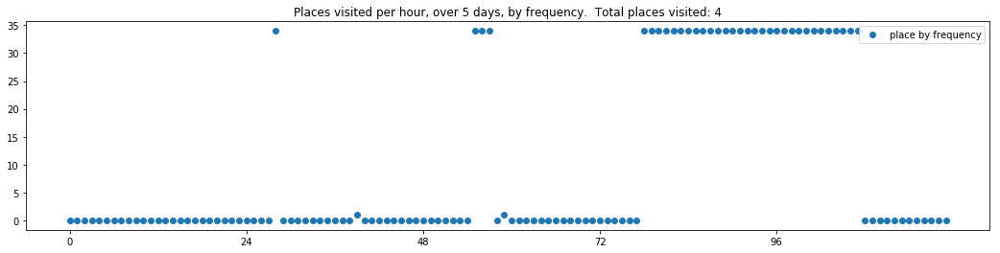

----- vector ----
prefix labels:  [69, 69]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69]
[69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 199, 199, 0, 0, 0, 0, 0]


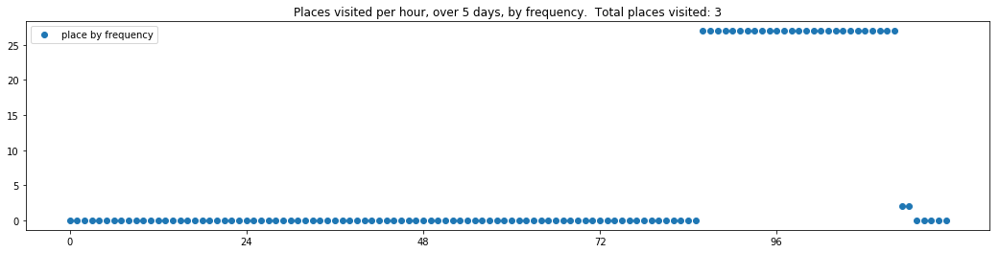

----- vector ----
prefix labels:  [605, 605]
[0, 0, 0, 0, 0, 524, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 248]
[0, 0, 0, 0, 327, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 533]


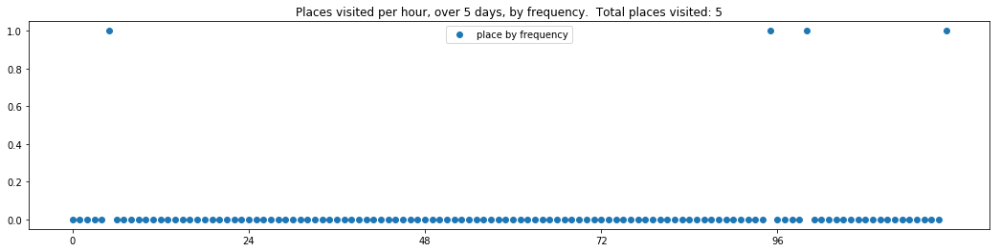


------
 25 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_25.txt 
------

----- vector ----
prefix labels:  [117, 117]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 117, 117, 117, 117, 117, 117, 117, 117, 117, 117, 117, 0]
[0, 0, 0, 0, 0, 0, 0, 117, 117, 117, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 82, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 117, 117]
[0, 32, 306, 0, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434]
[434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 0, 434, 434, 434, 434, 434, 434, 434, 434]


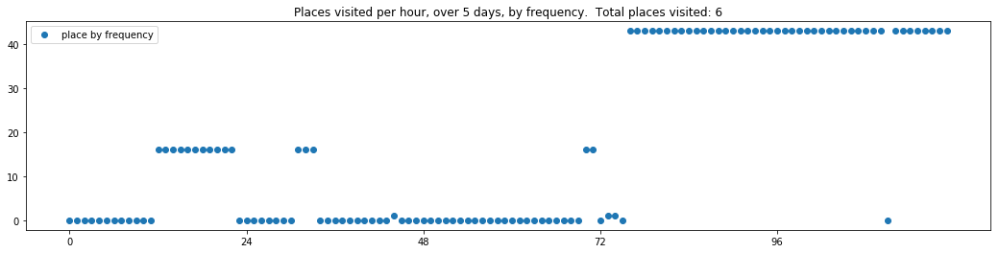

----- vector ----
prefix labels:  [41, 84]
[0, 0, 0, 0, 0, 84, 84, 84, 84, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 84, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 84, 84, 41, 41, 41, 41, 41, 41, 41, 41, 41]
[41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41]
[41, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 177, 177, 177, 0, 0, 0, 0, 0]
[0, 554, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 105, 374, 374, 0, 177, 177, 0, 0, 41]


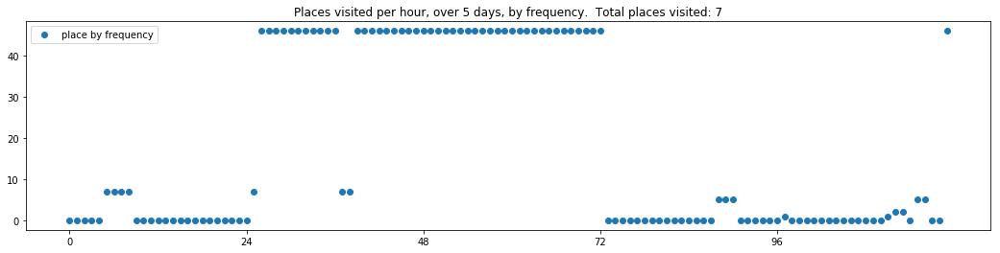

----- vector ----
prefix labels:  [437, 437]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 437, 0, 0, 437, 437, 437, 437, 0, 0, 0, 0, 0, 0, 0, 0, 437, 437, 437, 437]
[437, 437, 437, 437, 437, 0, 0, 0, 437, 437, 437, 437, 162, 0, 0, 0, 0, 0, 0, 0, 0, 437, 437, 437]


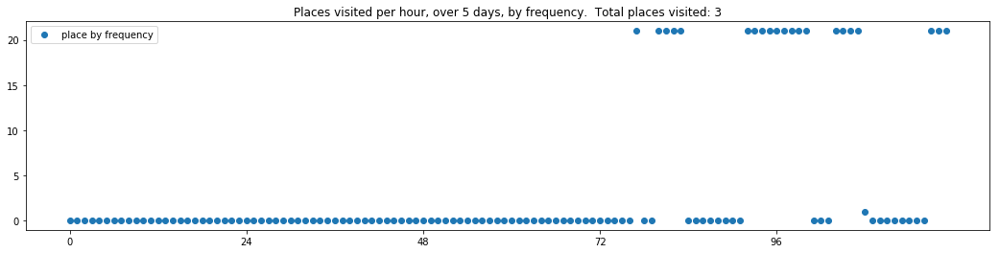

----- vector ----
prefix labels:  [604, 339]
[0, 0, 0, 0, 0, 339, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


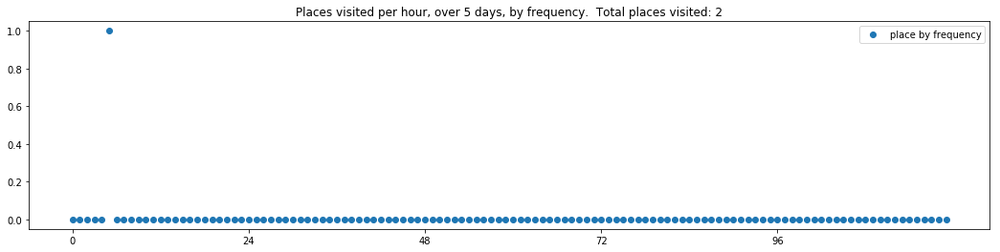

----- vector ----
prefix labels:  [437, 437]
[0, 0, 0, 0, 0, 437, 437, 437, 437, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 437, 437, 437, 437, 437, 437, 437, 437, 437, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 437, 0, 0, 0, 0, 0, 0, 437, 0, 0, 0, 0, 0, 0, 0, 0, 0, 437, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 437, 0, 0, 0, 437, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


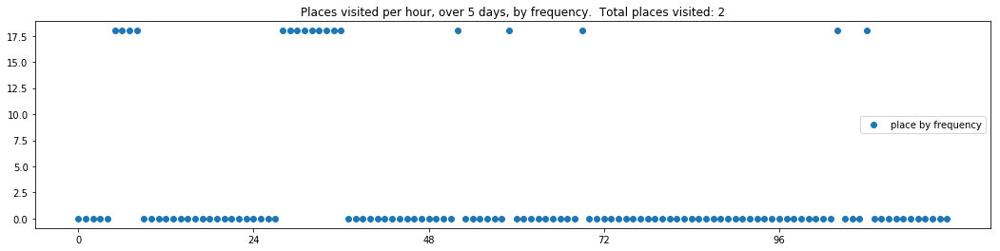

----- vector ----
prefix labels:  [434, 434]
[0, 0, 0, 0, 0, 0, 0, 0, 434, 434, 434, 0, 0, 0, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434]
[434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 0]
[0, 0, 0, 0, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434]
[434, 434, 434, 434, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 434, 434, 434, 434, 434, 434, 0, 0]
[0, 0, 0, 0, 0, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 0, 0, 0]


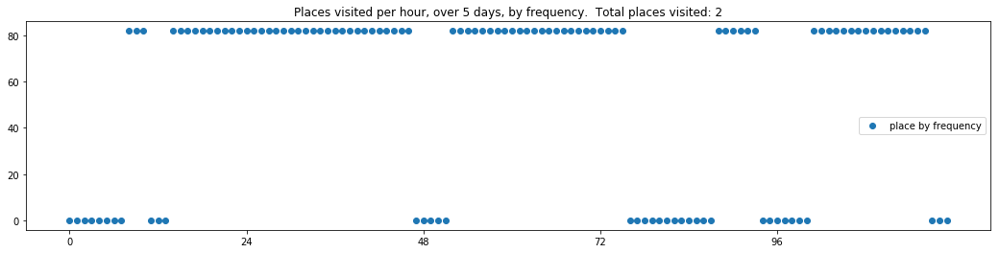

----- vector ----
prefix labels:  [118, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


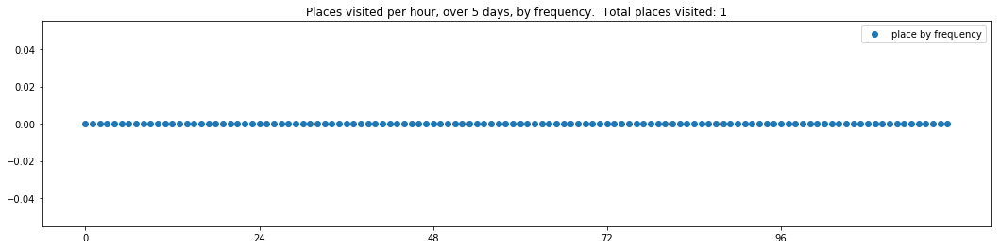

----- vector ----
prefix labels:  [248, 483]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 483, 483, 483, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 320, 320, 320, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 73, 158, 158, 503, 503, 503, 503, 503, 0, 0, 0, 0, 220, 0, 361, 361]


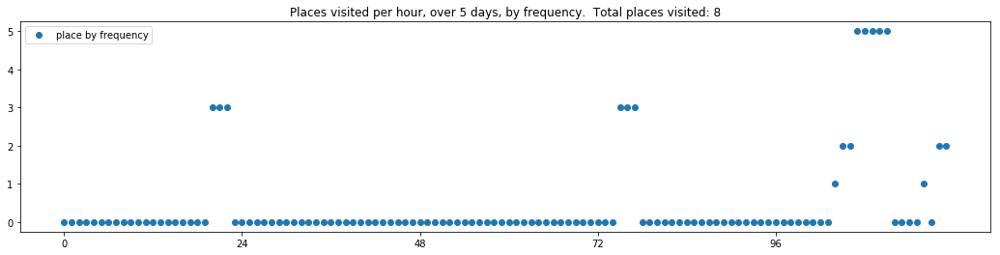

----- vector ----
prefix labels:  [20, 20]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20, 20, 239, 239, 271, 424, 424, 0, 0, 0, 0]
[0, 0, 62, 0, 0, 0, 0, 0, 382, 0, 0, 0, 0, 0, 0, 0, 0, 76, 0, 0, 0, 0, 0, 0]


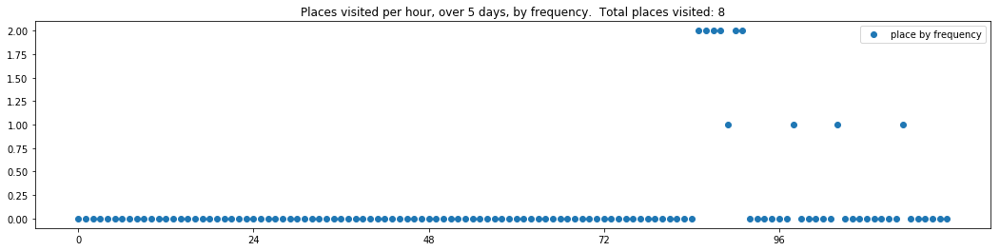

----- vector ----
prefix labels:  [223, 223]
[0, 0, 0, 0, 0, 205, 223, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 223, 223, 223, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


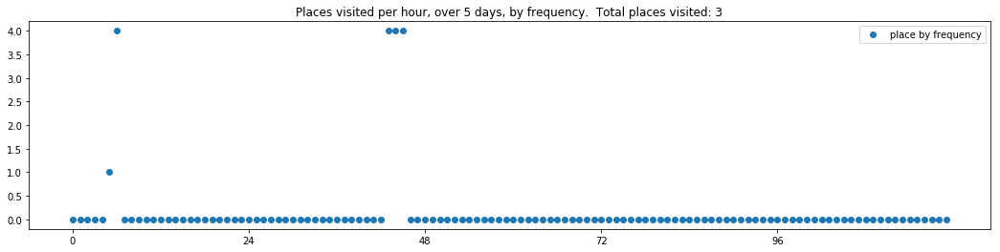


------
 30 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_30.txt 
------

----- vector ----
prefix labels:  [286, 508]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 508, 508, 508, 508, 508, 508]
[508, 508, 508, 508, 508, 508, 0, 0, 0, 0, 0, 568, 568, 568, 568, 568, 568, 568, 568, 568, 568, 568, 568, 568]
[568, 568, 568, 568, 0, 568, 568, 568, 568, 568, 568, 568, 568, 568, 568, 124, 0, 0, 205, 205, 205, 205, 507, 507]
[205, 205, 103, 563, 563, 563, 0, 205, 205, 205, 205, 205, 205, 286, 22, 22, 0, 0, 618, 618, 618, 618, 618, 618]
[618, 618, 618, 618, 618, 618, 147, 508, 508, 508, 508, 508, 563, 563, 568, 568, 568, 568, 568, 568, 568, 568, 568, 568]


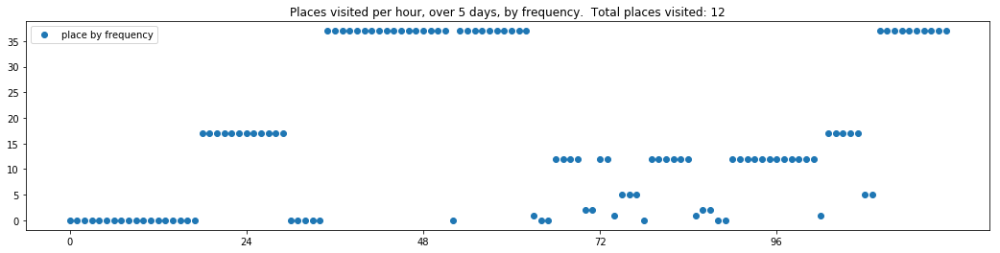

----- vector ----
prefix labels:  [413, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 413]
[413, 0, 112, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 413, 413, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 186, 0, 412, 412, 412, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


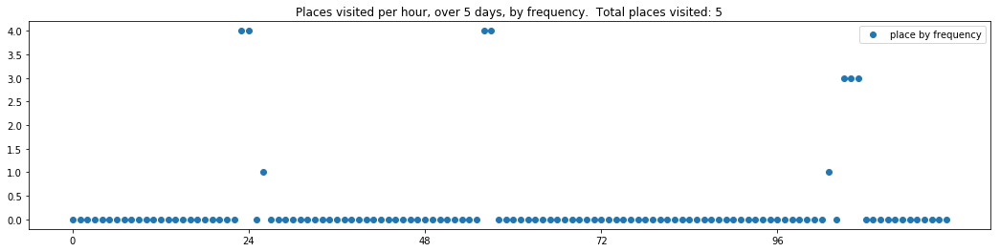

----- vector ----
prefix labels:  [312, 312]
[0, 0, 0, 0, 0, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312]
[312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312]
[312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312]
[312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312]
[312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312]


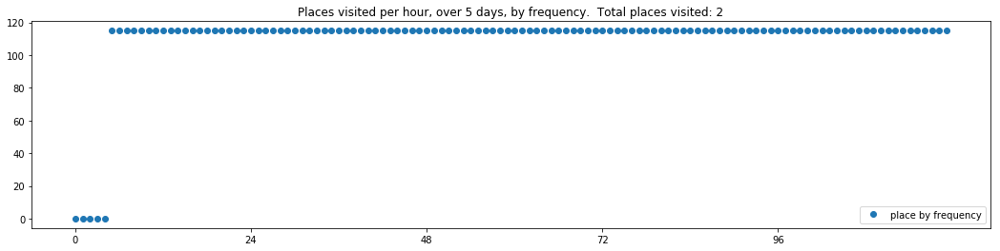

----- vector ----
prefix labels:  [358, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 358, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 358, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 126, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20, 0, 0, 0, 0, 0]


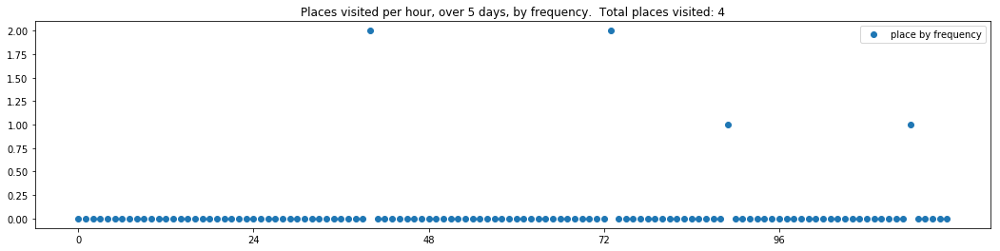

----- vector ----
prefix labels:  [167, 167]
[0, 0, 0, 255, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 429, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 165, 165, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


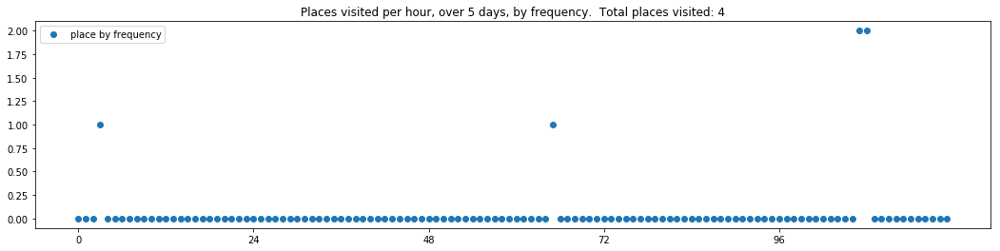

----- vector ----
prefix labels:  [626, 122]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 252, 71, 0, 0, 493, 0, 23, 220, 0, 0, 0, 187]
[187, 378, 378, 378, 0, 596, 0, 187, 71, 0, 187, 370, 144, 144, 144, 0, 136, 0, 0, 0, 0, 0, 0, 0]
[142, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 122, 122, 122, 122, 122, 122, 122]
[122, 122, 122, 122, 122, 122, 248, 231, 0, 0, 0, 0, 0, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69]
[69, 69, 69, 69, 0, 0, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 0, 0, 187, 0, 0, 0, 0, 0]


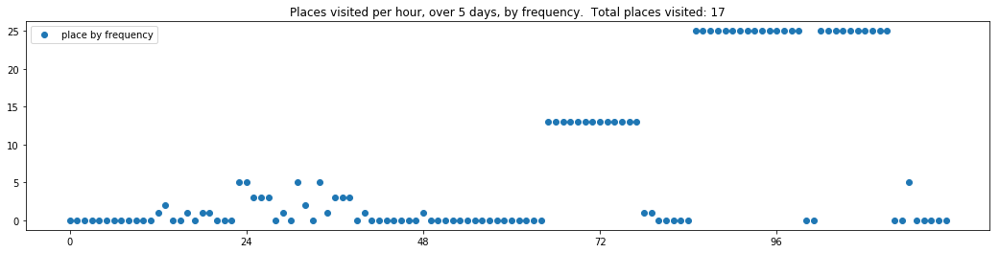

----- vector ----
prefix labels:  [523, 523]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 523, 523, 523, 523, 523, 0, 0, 0, 523, 523, 523, 523, 523, 523, 523]
[523, 523, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 388, 388, 388]
[388, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 242, 242, 242, 242, 242, 242, 242, 242, 242]
[242, 242, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


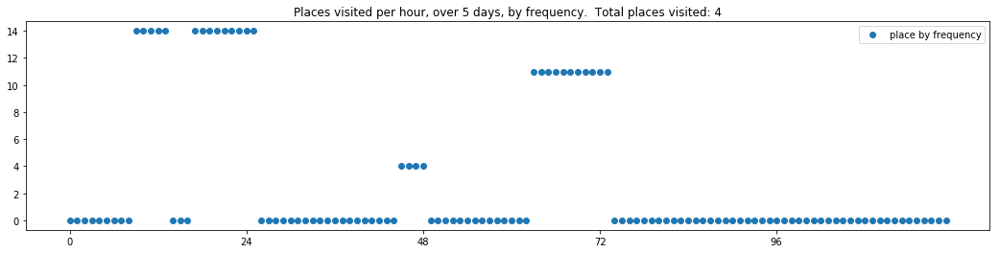

----- vector ----
prefix labels:  [238, 94]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 238, 238, 238, 238, 238, 238, 238, 238, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 471, 471, 0, 0, 69, 69, 8, 0, 0, 0, 238, 69, 69, 69, 69, 69, 69, 69, 69, 69]
[0, 0, 0, 0, 0, 0, 0, 0, 346, 0, 516, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 69]


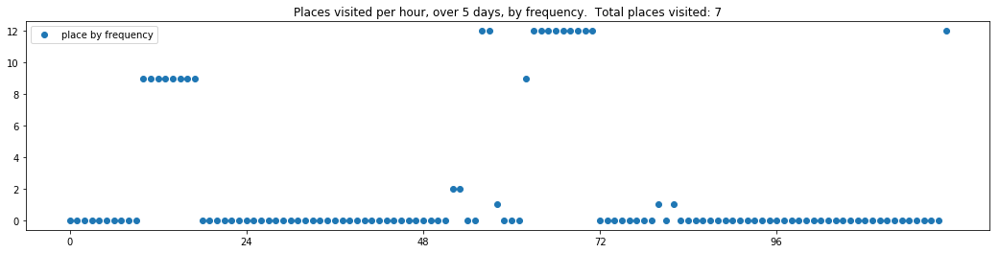

----- vector ----
prefix labels:  [309, 309]
[0, 0, 0, 0, 0, 0, 0, 309, 309, 309, 433, 433, 433, 433, 433, 0, 0, 0, 0, 0, 0, 23, 304, 304]
[304, 0, 0, 0, 205, 0, 433, 433, 433, 433, 433, 433, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 296, 0, 0, 0, 0, 309, 309, 0, 0, 0, 0, 620, 620, 309, 309, 309, 309, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 309, 309, 309, 309, 309, 309, 313, 313, 313, 313, 0, 309, 309, 309, 309, 0, 0, 0, 0]
[309, 309, 309, 309, 309, 309, 0, 0, 0, 0, 102, 102, 205, 205, 205, 205, 0, 0, 0, 0, 0, 0, 309, 309]


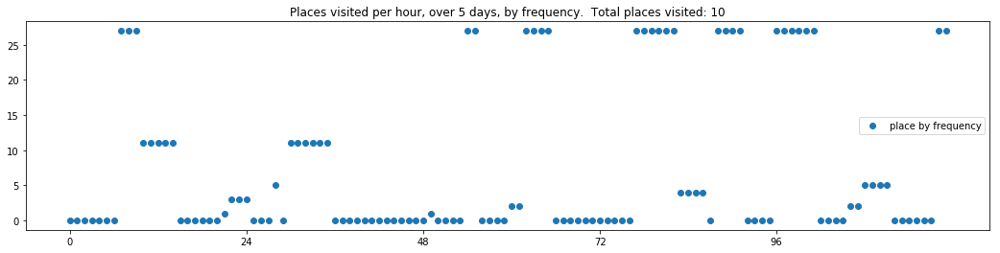

----- vector ----
prefix labels:  [215, 215]
[0, 0, 0, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215]
[215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215]
[215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215]
[215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215]
[215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215]


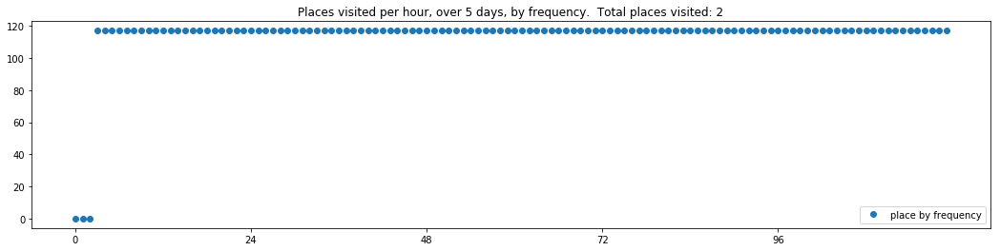


------
 35 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_35.txt 
------

----- vector ----
prefix labels:  [596, 596]
[0, 0, 0, 0, 596, 596, 0, 0, 0, 0, 0, 0, 0, 0, 0, 596, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 596, 0, 596, 596, 596, 0, 0, 596, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


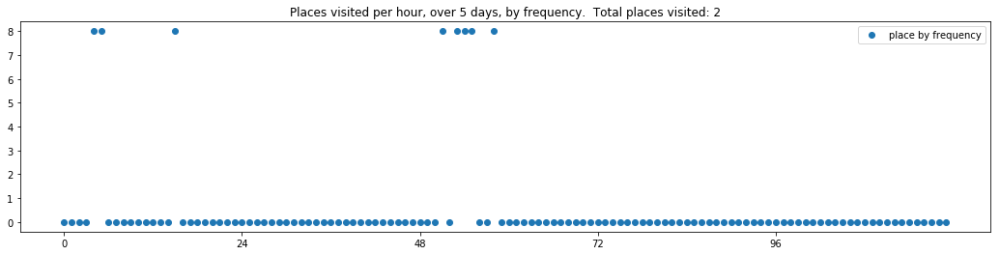

----- vector ----
prefix labels:  [108, 320]
[0, 0, 0, 0, 0, 0, 0, 0, 47, 246, 548, 0, 22, 47, 47, 47, 47, 47, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 47, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 434, 0, 0, 0, 46, 0, 400, 0, 0, 0, 0, 0, 126, 126, 126, 126, 126, 126, 126]
[126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126]
[126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126]


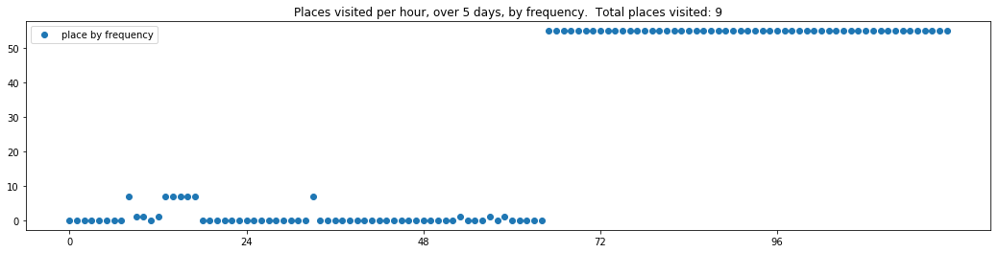

----- vector ----
prefix labels:  [328, 328]
[0, 0, 0, 0, 328, 328, 0, 0, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328]
[328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 0, 0, 0, 328, 328, 328, 328, 328]
[328, 328, 328, 328, 0, 0, 0, 0, 0, 0, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328]


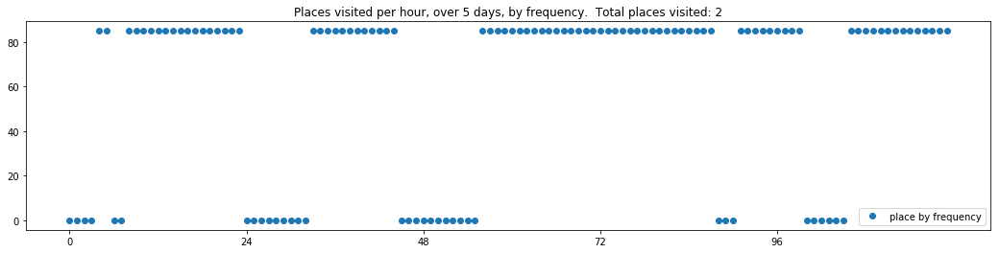

----- vector ----
prefix labels:  [32, 370]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20, 0, 72, 0, 0, 0, 0]
[332, 332, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 38, 38, 38, 38, 38]


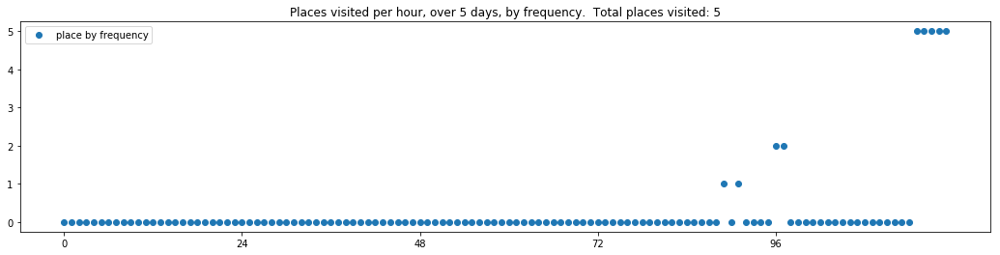

----- vector ----
prefix labels:  [69, 69]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 69, 69, 69, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 69, 69, 0, 185, 69, 69, 69, 69, 69, 69, 69, 69]
[69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69]
[69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69]


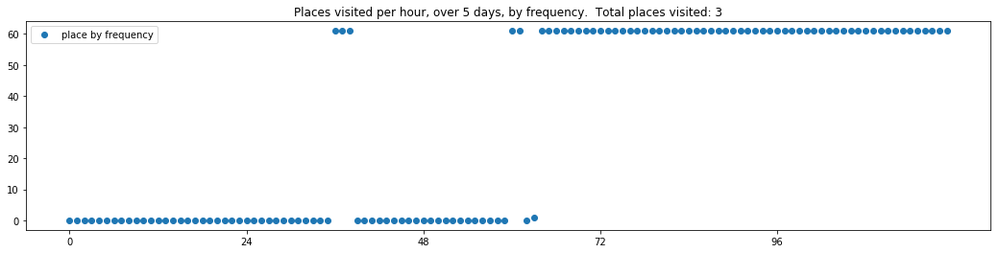

----- vector ----
prefix labels:  [183, 183]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 183, 183, 183]
[183, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545]
[545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545]


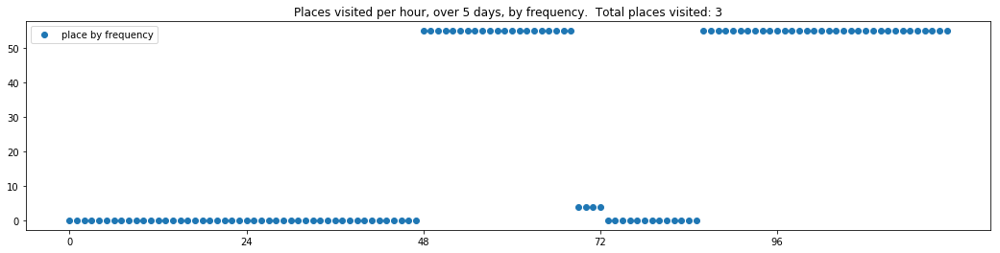

----- vector ----
prefix labels:  [231, 231]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 231, 231, 0, 60, 0, 0, 434, 434, 434, 434, 434, 434]
[434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 0, 0]
[140, 140, 140, 293, 293, 72, 72, 72, 72, 182, 182, 203, 203, 203, 203, 203, 427, 31, 32, 32, 32, 32, 32, 32]
[32, 371, 371, 259, 203, 203, 203, 140, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 0, 412]
[412, 412, 412, 248, 248, 2, 0, 0, 0, 0, 0, 0, 0, 0, 259, 0, 0, 0, 0, 568, 0, 0, 0, 0]


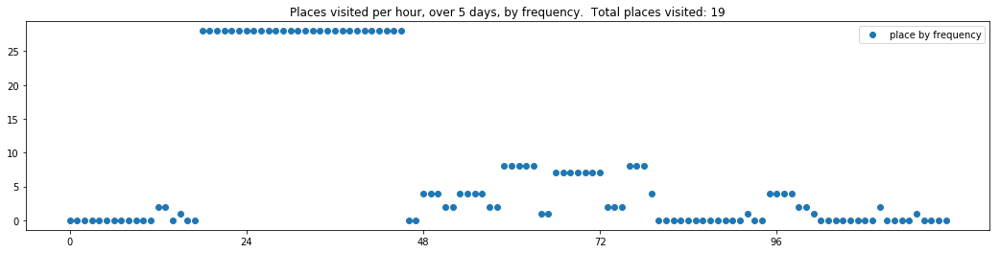

----- vector ----
prefix labels:  [226, 226]
[226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 226, 181, 226, 226, 226, 226, 226]
[226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 418, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226]


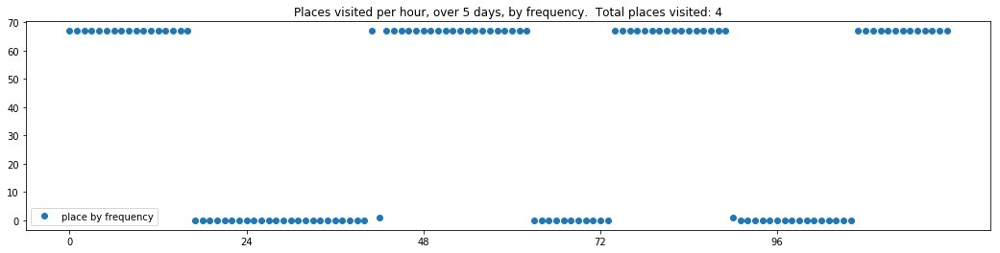

----- vector ----
prefix labels:  [280, 278]
[0, 0, 0, 0, 0, 0, 0, 398, 398, 398, 398, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278]
[278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278]
[278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278]
[278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278]


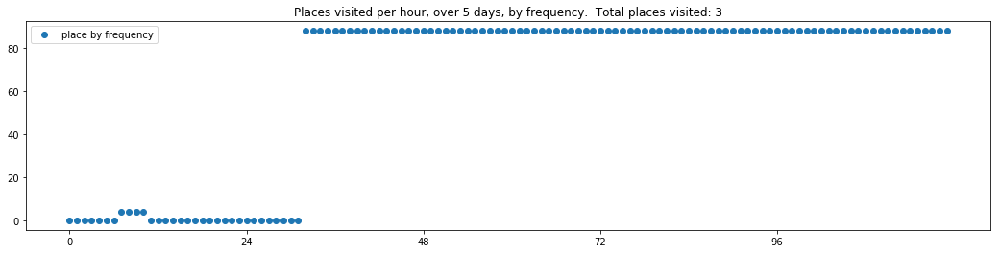

----- vector ----
prefix labels:  [232, 0]
[0, 0, 336, 0, 288, 0, 271, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 446]
[446, 446, 446, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 30, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 66, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[81, 81, 81, 81, 81, 81, 81, 81, 81, 81, 81, 75, 75, 75, 75, 0, 0, 278, 278, 278, 278, 278, 278, 278]
[278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278]


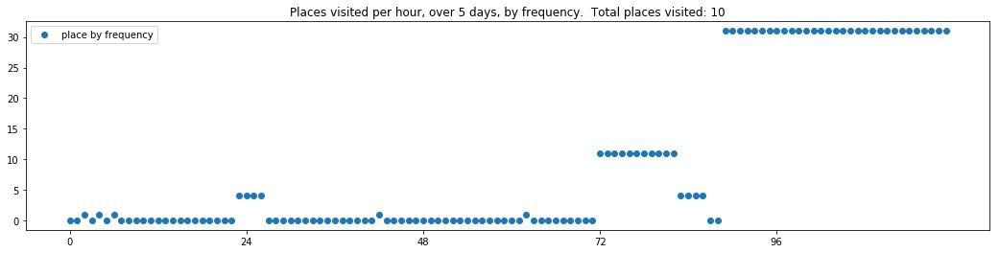


------
 40 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_40.txt 
------

----- vector ----
prefix labels:  [532, 532]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 100, 271, 471, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 208, 388, 388, 388, 388, 388, 388, 388, 388, 388, 388, 388, 388, 388, 388, 388, 388, 0, 0, 0, 270]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 322, 322, 322, 322, 322, 322, 225, 225]


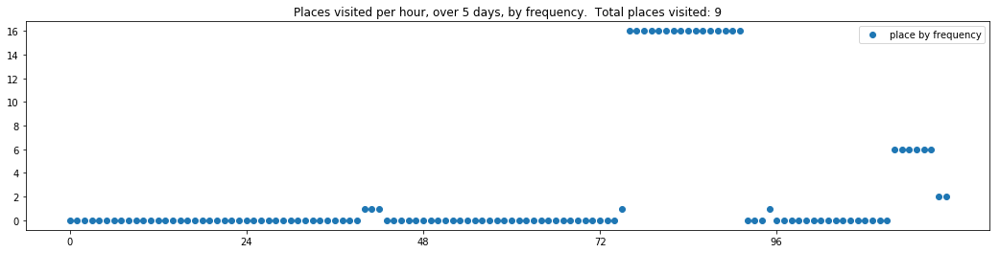

----- vector ----
prefix labels:  [4, 4]
[0, 0, 0, 0, 0, 0, 0, 0, 4, 4, 0, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4]
[4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4]
[4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 93, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4]
[93, 93, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 93, 93, 4, 4, 4, 4, 4, 4]
[4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4]


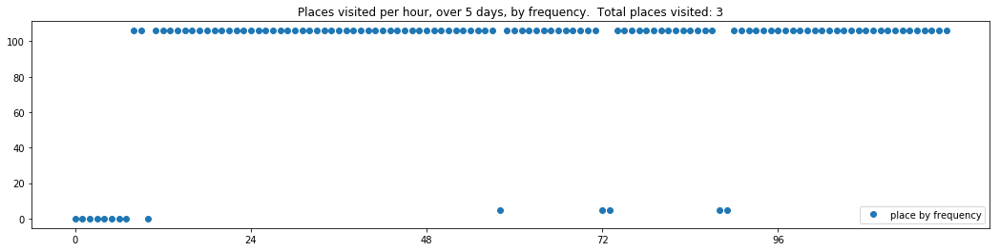

----- vector ----
prefix labels:  [333, 333]
[0, 0, 0, 333, 333, 333, 333, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 334]
[334, 0, 0, 0, 0, 0, 0, 0, 0, 0, 333, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 333, 333]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


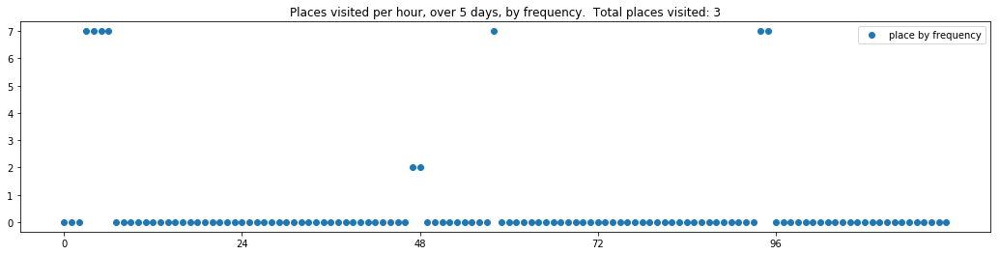

----- vector ----
prefix labels:  [99, 99]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 342, 342, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 40, 40, 40, 40, 40, 40, 40, 40, 40]
[40, 144, 74, 74, 0, 33, 0, 0, 0, 424, 424, 503, 503, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


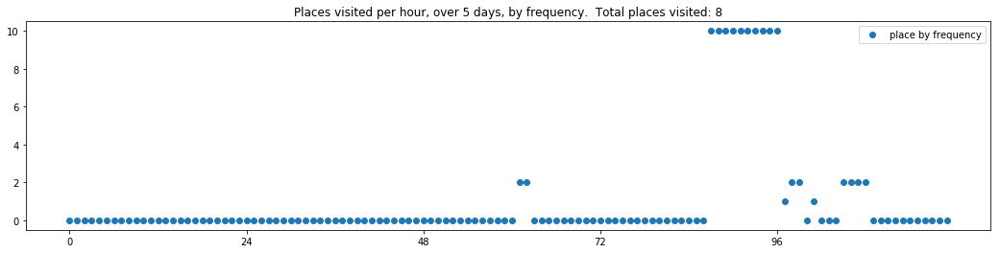

----- vector ----
prefix labels:  [93, 93]
[0, 0, 0, 0, 0, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 4, 4, 4, 93, 93, 93, 93, 93, 93]
[93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93]
[93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 542, 542, 542, 542, 542, 93, 93, 93]
[93, 93, 93, 0, 0, 515, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93]
[93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93]


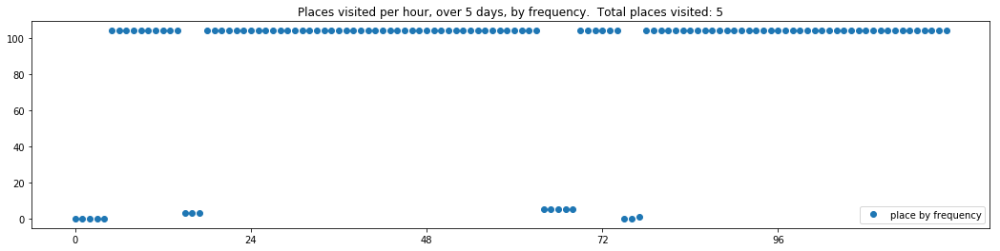

----- vector ----
prefix labels:  [369, 369]
[0, 0, 0, 0, 195, 218, 218, 545, 545, 545, 545, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 252, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 369, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


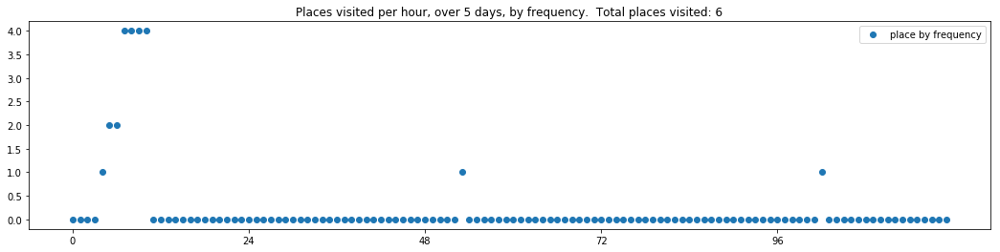

----- vector ----
prefix labels:  [498, 227]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 284, 284, 0, 0, 0, 0, 0]


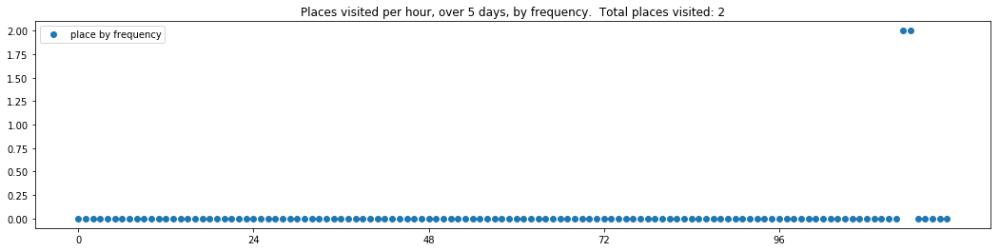

----- vector ----
prefix labels:  [134, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 439, 0, 0, 0, 0, 0, 0, 0, 0, 134, 134]
[134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134]
[134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 303, 0, 0, 0, 0, 0, 0, 0, 0]


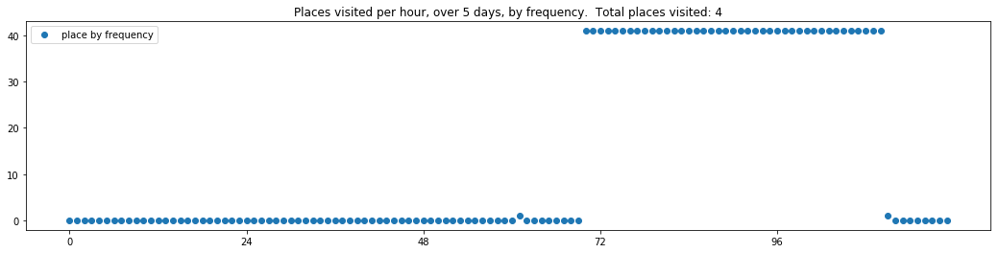

----- vector ----
prefix labels:  [563, 298]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 205, 0, 189, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 205, 205, 205, 205, 205, 205, 205, 205, 205, 205, 205, 205, 205, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 205, 205, 205, 205, 205, 563, 205, 508, 508, 508, 508, 508, 508, 508, 508]
[508, 508, 508, 508, 508, 508, 508, 508, 0, 303, 195, 195, 0, 0, 0, 0, 0, 205, 563, 563, 392, 392, 392, 341]


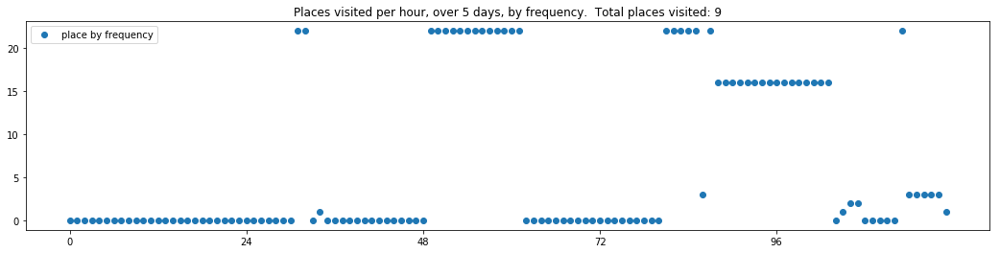

----- vector ----
prefix labels:  [11, 11]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11]
[11, 11, 11, 0, 0, 0, 0, 0, 0, 0, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285]
[285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285]
[285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 0, 0]
[0, 0, 0, 0, 0, 0, 130, 130, 0, 435, 0, 0, 0, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285]


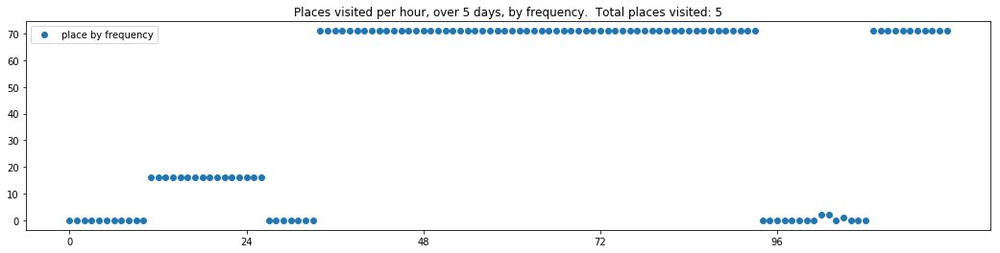


------
 45 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_45.txt 
------

----- vector ----
prefix labels:  [298, 40]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 304, 304, 195, 195, 364, 364, 364, 77, 77, 77, 77, 77, 212, 0, 0]
[0, 0, 279, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 336, 336, 336, 336, 336, 336, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 334, 222, 0, 0, 0, 0, 0, 0, 0, 0, 0]


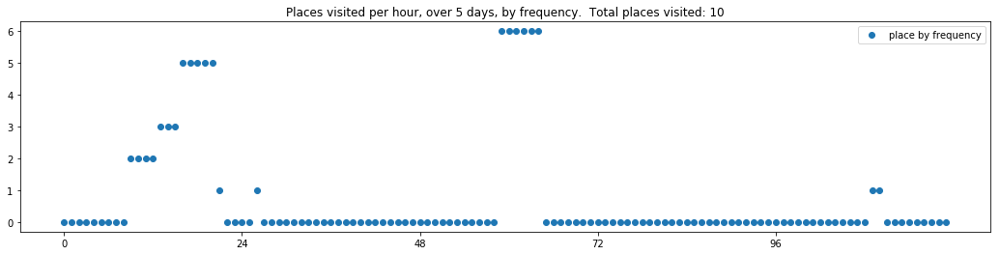

----- vector ----
prefix labels:  [26, 26]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 26, 26, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 26, 26, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 26, 0, 0, 0, 0, 0, 0, 0]


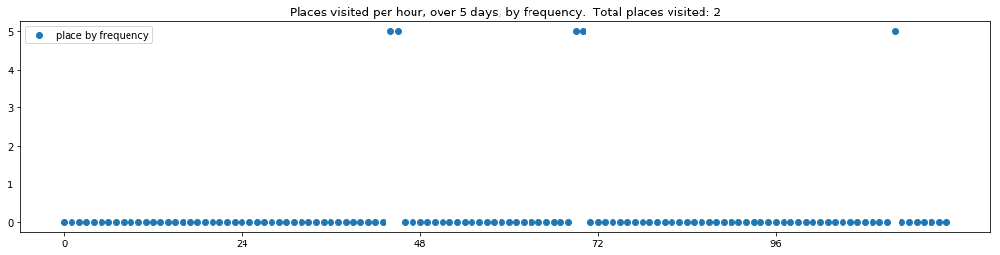

----- vector ----
prefix labels:  [296, 189]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 205, 205, 205, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 4, 0, 0, 195, 195, 195, 195, 195]
[95, 95, 95, 95, 95, 95, 95, 4, 4, 4, 4, 4, 341, 620, 0, 453, 453, 453, 0, 184, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 296, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 130, 0, 0, 0, 0, 0, 0]


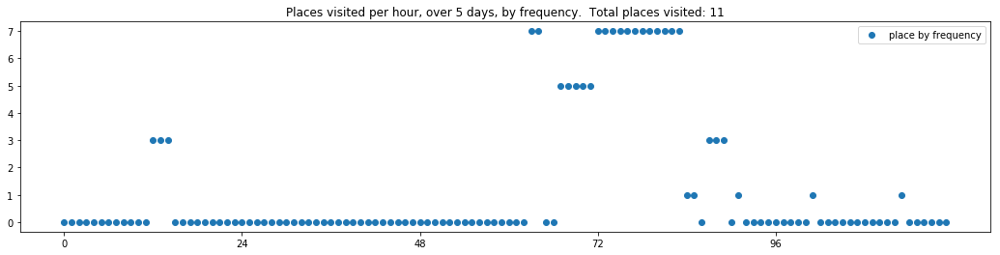

----- vector ----
prefix labels:  [420, 420]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 420, 0, 0, 0, 0, 0, 0, 420, 420, 420, 420, 420]
[420, 420, 0, 0, 0, 0, 420, 0, 0, 0, 0, 0, 0, 420, 420, 420, 420, 420, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 420, 420, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 71, 71, 71, 71, 71, 71, 71, 71, 71, 71, 71, 0, 0, 0]
[357, 267, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 414, 22, 0, 0, 0, 0, 0, 0, 0, 0]


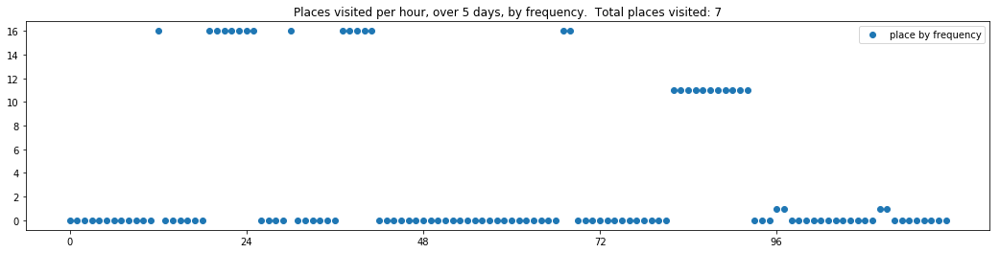

----- vector ----
prefix labels:  [448, 266]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 304, 304, 304, 304, 304]
[304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 413, 304, 304, 304, 304, 304, 304]
[304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304]
[304, 304, 304, 304, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 304, 304, 304, 0, 0, 413, 0, 413, 413]
[413, 413, 413, 413, 0, 434, 434, 434, 434, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 434]


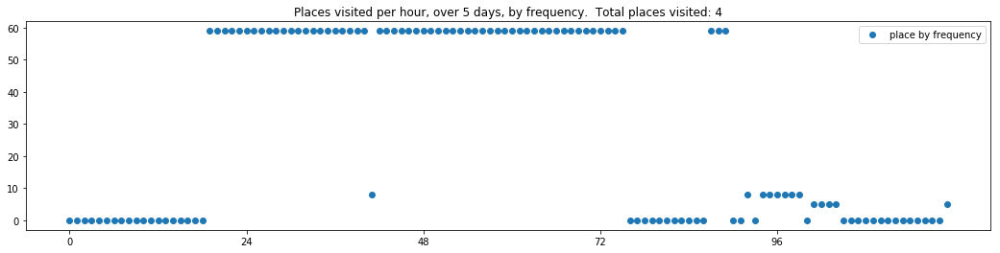

----- vector ----
prefix labels:  [423, 423]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 10, 10, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


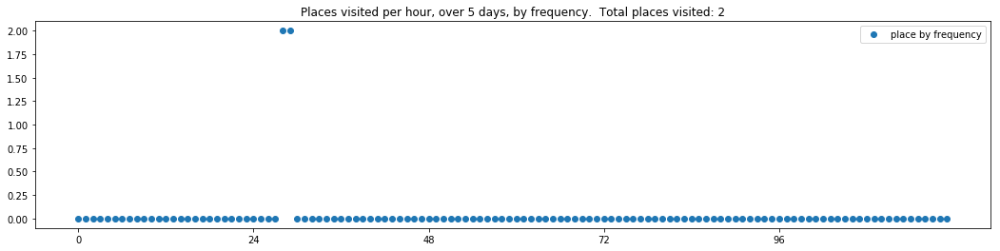

----- vector ----
prefix labels:  [391, 391]
[0, 0, 0, 0, 0, 0, 0, 0, 390, 0, 0, 0, 0, 0, 390, 102, 390, 390, 390, 0, 391, 391, 391, 391]
[391, 391, 391, 391, 391, 391, 391, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 390, 390, 0, 391]
[391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391]
[391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391]
[391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391]


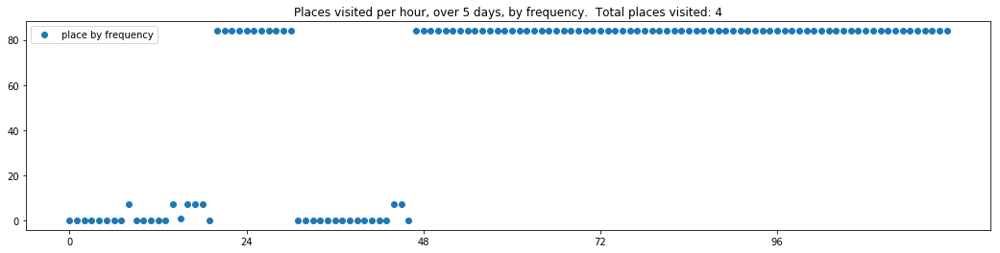

----- vector ----
prefix labels:  [227, 21]
[0, 0, 0, 144, 144, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 21, 21, 21, 21, 21, 21, 21, 21, 0, 0, 0, 0, 21, 0, 21, 0, 0, 21, 21, 21]
[0, 227, 227, 227, 0, 0, 0, 0, 0, 0, 0, 0, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 0, 0]
[0, 0, 0, 0, 0, 0, 21, 0, 21, 21, 21, 21, 21, 21, 21, 21, 0, 0, 0, 0, 0, 0, 0, 0]


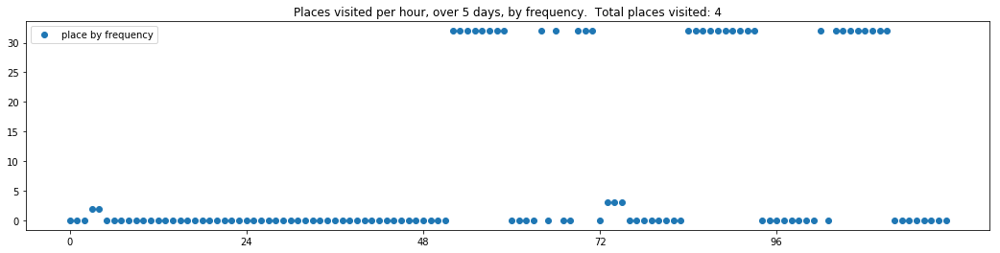

----- vector ----
prefix labels:  [161, 161]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161]
[161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161]
[161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161]
[161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161]
[161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161]


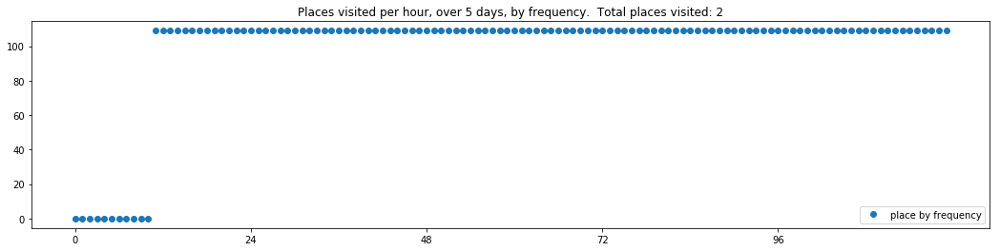

----- vector ----
prefix labels:  [32, 32]
[0, 0, 0, 0, 0, 32, 32, 32, 32, 32, 32, 32, 32, 0, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32]
[32, 32, 0, 32, 32, 32, 32, 32, 32, 32, 32, 32, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 32, 32, 32, 32, 0, 0, 0, 0, 0, 0, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32]
[32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 0, 0, 0, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32]
[32, 32, 32, 32, 32, 32, 32, 32, 32, 0, 32, 32, 32, 32, 32, 0, 32, 32, 32, 32, 32, 0, 0, 0]


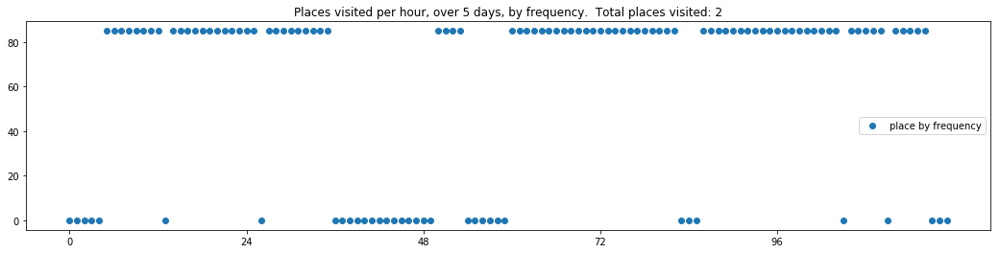


------
 50 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_50.txt 
------

----- vector ----
prefix labels:  [192, 192]
[0, 0, 0, 0, 0, 0, 0, 0, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192]
[192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192]
[192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192]
[192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192]
[192, 192, 192, 192, 192, 192, 0, 0, 0, 0, 0, 0, 0, 0, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192]


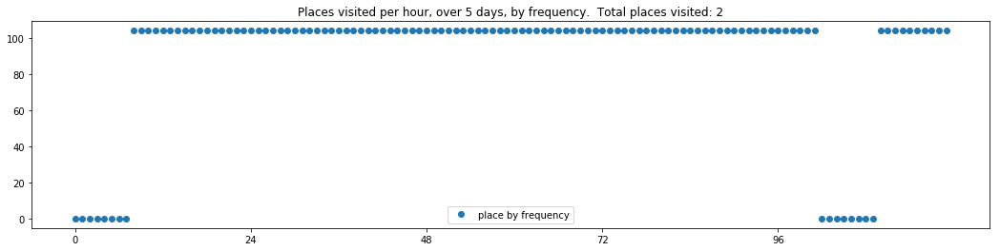

----- vector ----
prefix labels:  [8, 8]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 8, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 8, 0, 0, 0, 0, 0, 0, 0, 0, 0]


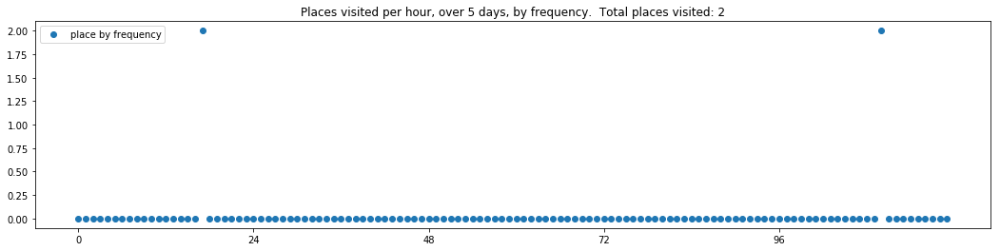

----- vector ----
prefix labels:  [320, 320]
[0, 0, 0, 0, 0, 0, 0, 0, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320]
[320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 0, 0, 0]
[0, 320, 320, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 458, 0, 0, 0, 320]
[320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320]


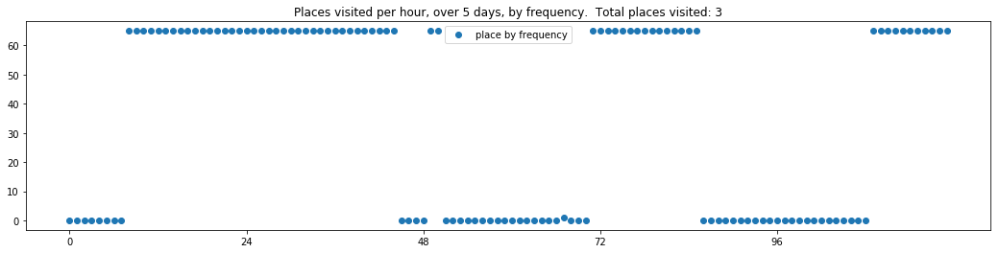

----- vector ----
prefix labels:  [507, 507]
[0, 0, 0, 0, 0, 507, 0, 0, 0, 0, 507, 507, 507, 0, 0, 0, 0, 507, 507, 507, 0, 507, 0, 0]
[0, 0, 0, 0, 507, 507, 507, 507, 507, 507, 0, 507, 507, 507, 0, 507, 0, 507, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 507, 507, 0, 0, 507, 507, 0, 507, 507, 507, 507, 507, 507, 0, 0, 0, 0, 0, 507, 0]
[507, 507, 507, 507, 507, 0, 507, 507, 507, 0, 0, 507, 507, 507, 507, 0, 0, 507, 507, 507, 507, 507, 507, 507]
[0, 507, 507, 0, 0, 507, 507, 507, 507, 507, 507, 507, 507, 507, 507, 0, 507, 507, 507, 507, 507, 0, 0, 0]


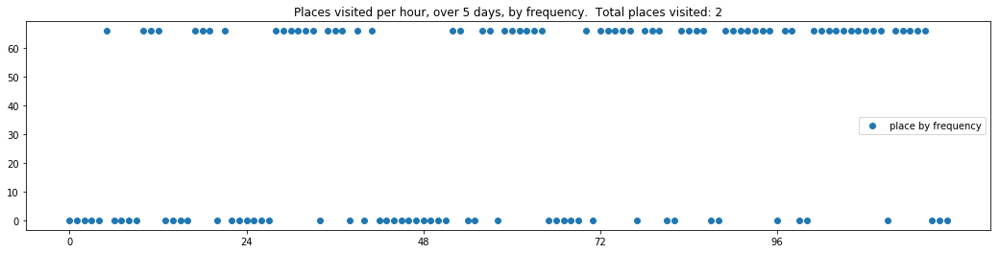

----- vector ----
prefix labels:  [123, 245]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 245, 245, 245, 245, 245, 245, 130, 130, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[199, 199, 199, 245, 245, 245, 245, 245, 245, 245, 245, 245, 245, 245, 245, 245, 245, 245, 245, 245, 245, 0, 162, 0]
[0, 0, 0, 0, 357, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 52, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 133, 133, 133, 133]


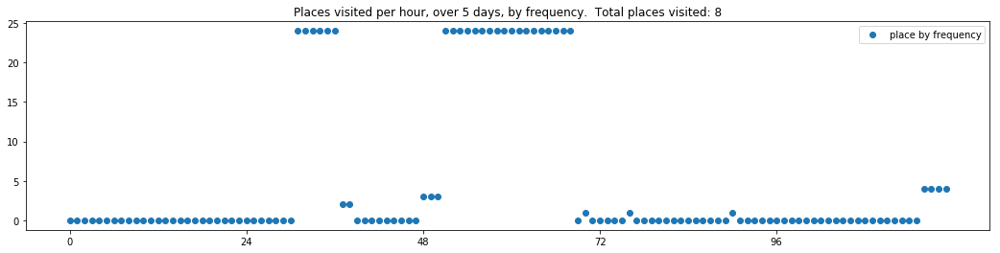

----- vector ----
prefix labels:  [227, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 193, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 388, 388, 388, 388, 388, 388, 388, 388, 388, 388, 388, 388, 388, 388, 388, 388, 388, 388, 388, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 239, 0, 0, 0, 0, 0, 555, 555, 555, 555, 555, 555, 555, 240, 0, 0, 0, 0, 0, 0, 0]


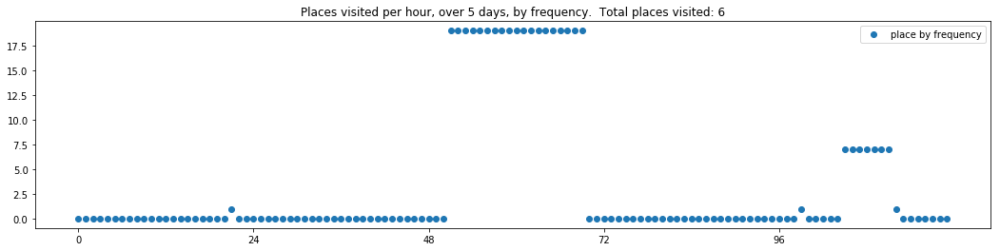

----- vector ----
prefix labels:  [167, 76]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 195, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[444, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 303, 303, 303, 303, 303, 303, 303, 134, 134, 134, 134, 134, 134]
[134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 0, 0, 0, 0, 0, 0, 0, 0, 0, 134, 134, 134, 134, 134]
[134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134]


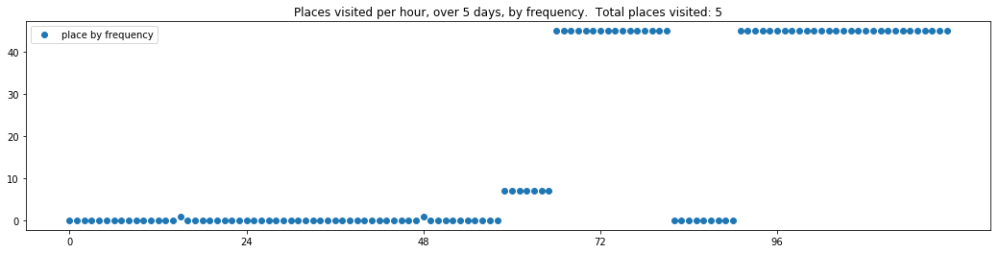

----- vector ----
prefix labels:  [140, 140]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[140, 140, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 140, 0]


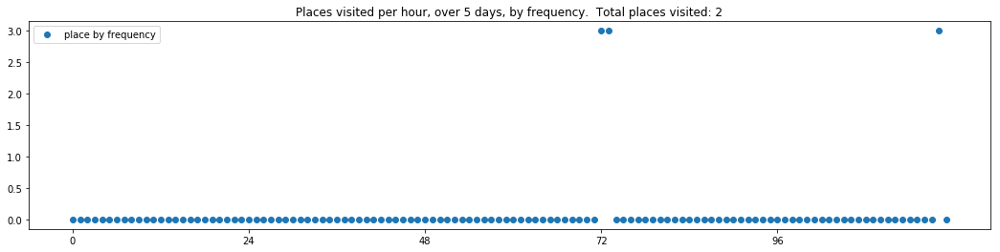

----- vector ----
prefix labels:  [4, 4]
[0, 0, 0, 0, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 0, 4, 4, 4, 4]
[4, 4, 4, 4, 4, 0, 0, 0, 0, 0, 4, 4, 4, 4, 4, 0, 0, 0, 0, 0, 0, 0, 0, 4]
[4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 4, 0, 4]
[4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


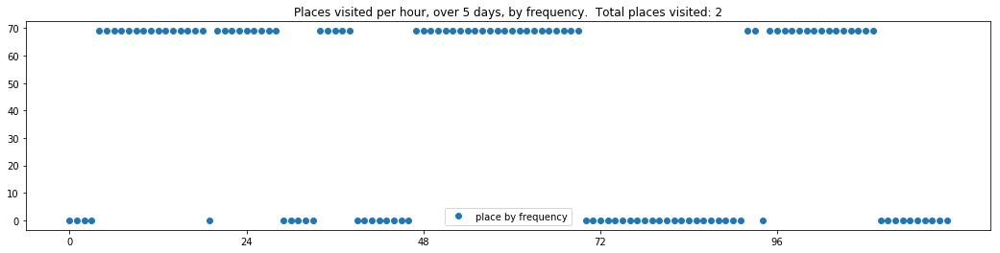

----- vector ----
prefix labels:  [21, 21]
[0, 21, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 41, 41, 388, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[21, 0, 0, 0, 551, 551, 551, 551, 551, 551, 551, 551, 551, 551, 551, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 21, 21, 21, 21, 21]
[21, 21, 0, 21, 0, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 0, 0, 0, 388, 388, 149, 21, 21]


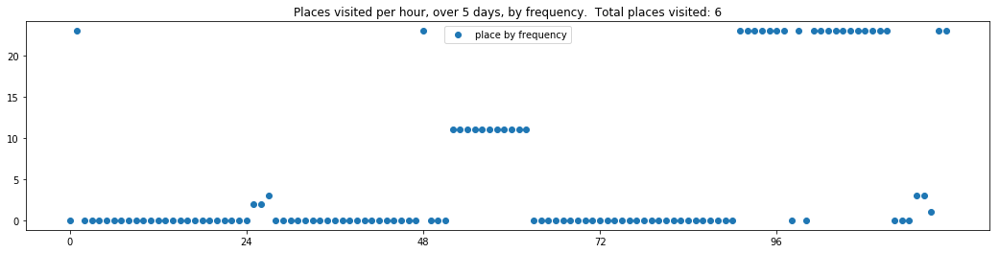


------
 55 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_55.txt 
------

----- vector ----
prefix labels:  [8, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 591, 591]
[591, 591, 591, 591, 0, 21, 21, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4]


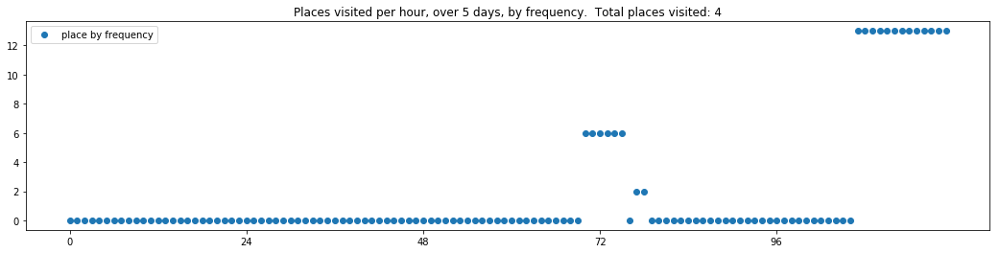

----- vector ----
prefix labels:  [349, 349]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 349, 423, 349, 349, 349, 349, 349, 349]
[349, 349, 349, 349, 349, 349, 349, 349, 349, 349, 349, 349, 349, 349, 349, 349, 349, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 424, 424, 424, 424, 0, 0, 0, 0, 0, 0, 0, 423, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 423, 423, 423, 423, 57, 57, 57, 57, 57, 57, 57, 57, 57, 57, 57, 57, 57, 57]


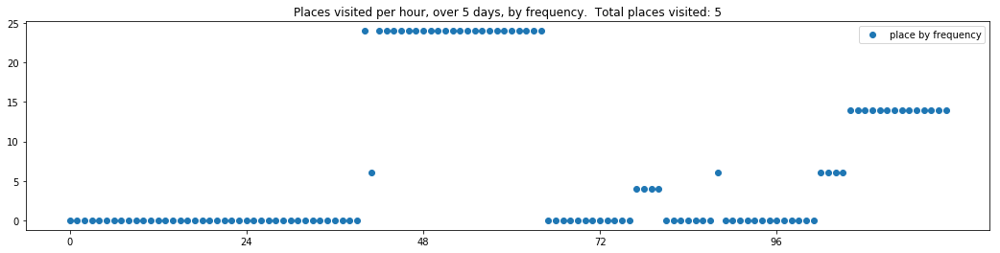

----- vector ----
prefix labels:  [286, 0]
[0, 0, 0, 0, 0, 286, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 46, 46, 46, 46, 46, 46]
[46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46]
[46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46]
[46, 46, 46, 46, 46, 46, 46, 94, 94, 94, 94, 94, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


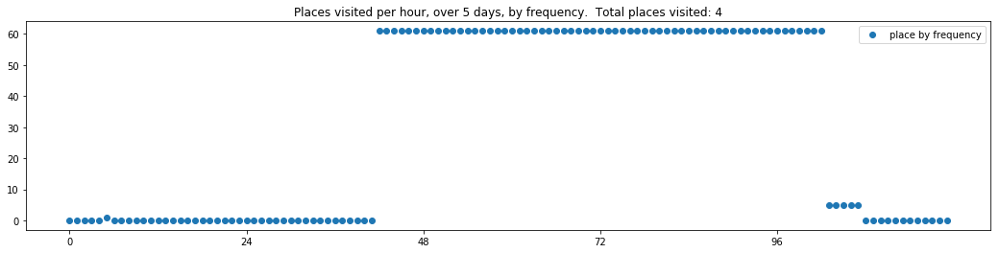

----- vector ----
prefix labels:  [439, 439]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 439, 439, 439, 439, 439, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[439, 439, 439, 439, 439, 439, 439, 439, 439, 0, 0, 0, 0, 0, 0, 439, 439, 0, 385, 385, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 439, 439, 439, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


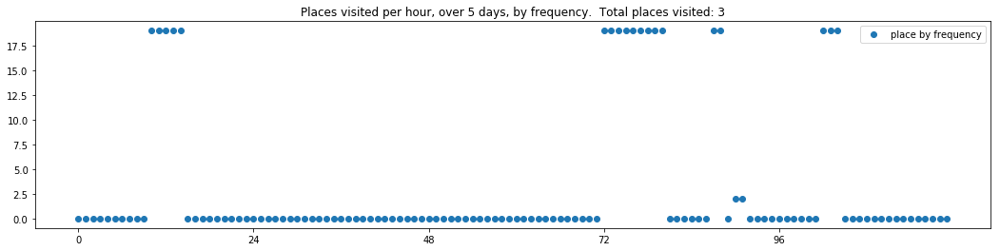

----- vector ----
prefix labels:  [21, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 21, 21, 21, 21, 0, 0, 0, 0, 0]
[0, 0, 0, 21, 0, 0, 21, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 21, 21, 21, 21, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 21, 21, 21, 21, 21, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[72, 72, 72, 72, 72, 72, 72, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


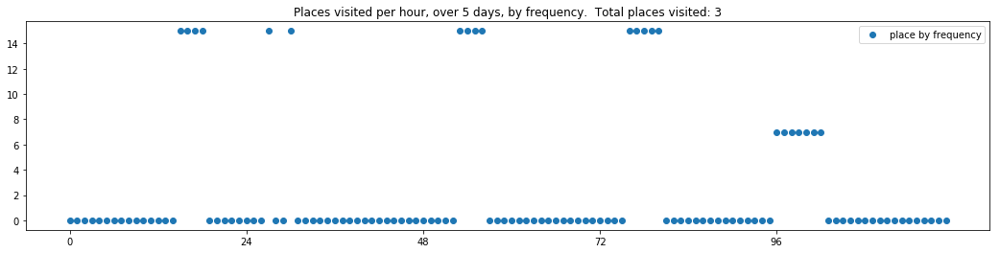

----- vector ----
prefix labels:  [246, 246]
[0, 0, 0, 0, 0, 0, 0, 0, 246, 246, 246, 246, 246, 246, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 246, 246, 246, 246, 246, 246, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246]
[246, 246, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 246]
[246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246]


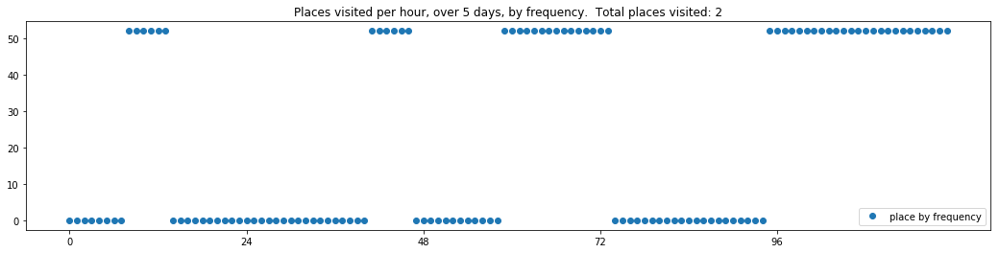

----- vector ----
prefix labels:  [142, 142]
[0, 0, 0, 0, 0, 0, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142]
[142, 142, 142, 142, 142, 142, 142, 142, 0, 0, 0, 0, 0, 0, 0, 142, 142, 142, 0, 0, 0, 0, 0, 0]
[0, 0, 142, 142, 142, 142, 142, 142, 142, 142, 142, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 142]
[142, 0, 142, 142, 142, 142, 142, 142, 142, 142, 142, 0, 0, 0, 0, 0, 0, 21, 0, 0, 0, 0, 0, 0]
[0, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 0, 0, 0, 0]


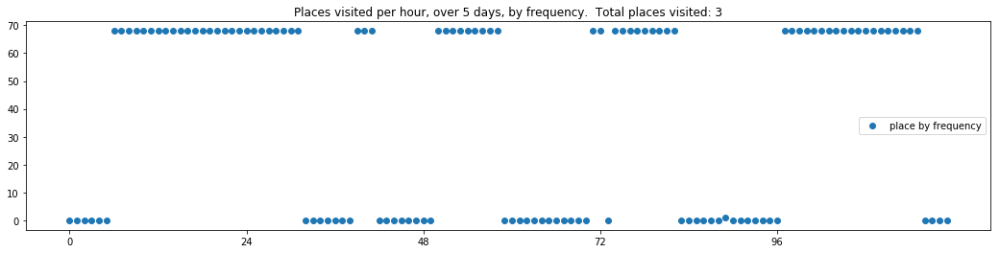

----- vector ----
prefix labels:  [612, 21]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 21, 21, 0, 0, 0]
[21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 0, 0, 0, 0, 0, 0, 21, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 21, 21, 21]
[21, 21, 21, 21, 0, 0, 0, 0, 0, 0, 0, 0, 21, 21, 0, 21, 21, 21, 0, 0, 21, 21, 21, 21]
[21, 21, 21, 21, 21, 21, 21, 0, 21, 21, 0, 0, 0, 0, 4, 4, 4, 4, 0, 0, 0, 0, 0, 0]


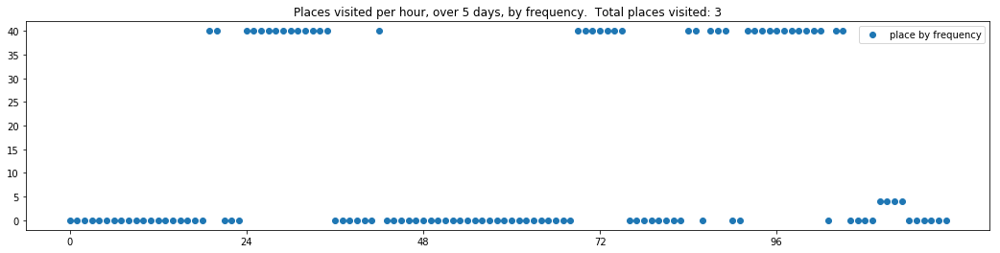

----- vector ----
prefix labels:  [391, 391]
[0, 0, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 0, 391, 391, 391, 391, 391, 391]
[391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391]
[391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 311, 311, 311, 311, 391, 391, 391, 391, 391, 391, 391, 391, 391]
[391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391]
[391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391]


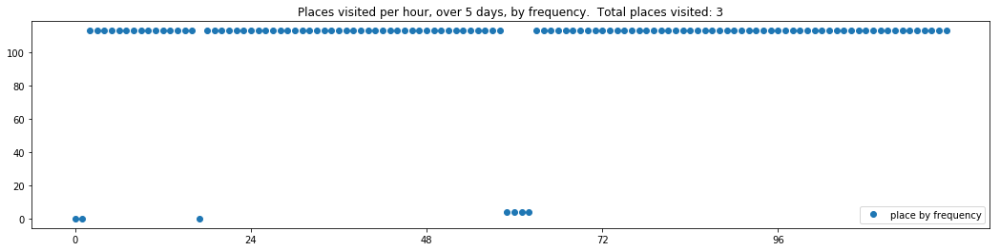

----- vector ----
prefix labels:  [341, 341]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 341, 341, 341, 341, 341, 341, 341, 341, 341, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 341, 341, 341, 341, 341, 341, 341, 341]
[341, 341, 341, 341, 341, 341, 341, 341, 463, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 341, 341, 341, 341, 341, 341, 341, 341, 341, 341, 0, 0, 434, 434, 434, 434, 434, 434, 434, 434, 434]
[434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434]


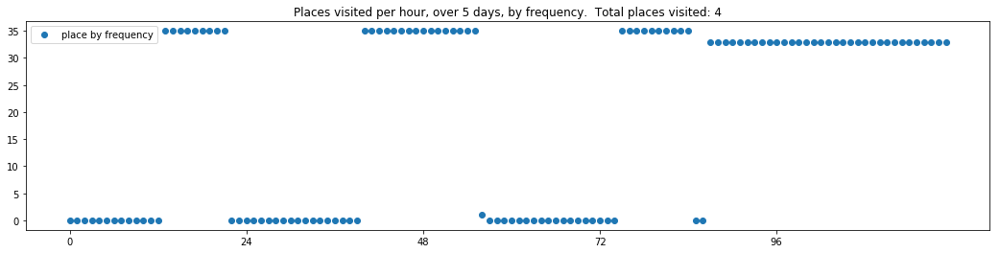


------
 60 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_60.txt 
------

----- vector ----
prefix labels:  [108, 108]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 562, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


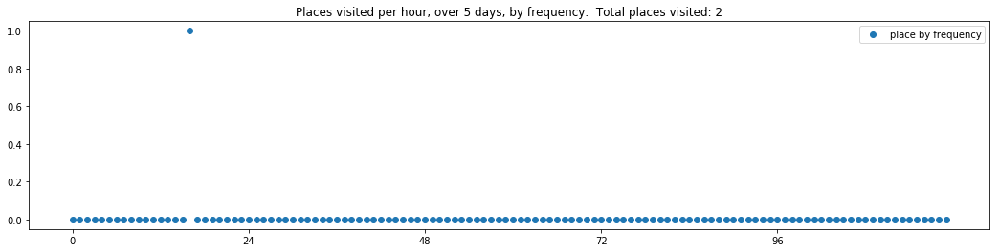

----- vector ----
prefix labels:  [312, 573]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 573]
[573, 573, 573, 0, 0, 0, 0, 0, 0, 194, 573, 573, 573, 0, 464, 269, 269, 0, 0, 0, 0, 168, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 84, 84, 0, 311, 311, 311, 311, 311, 311, 311]


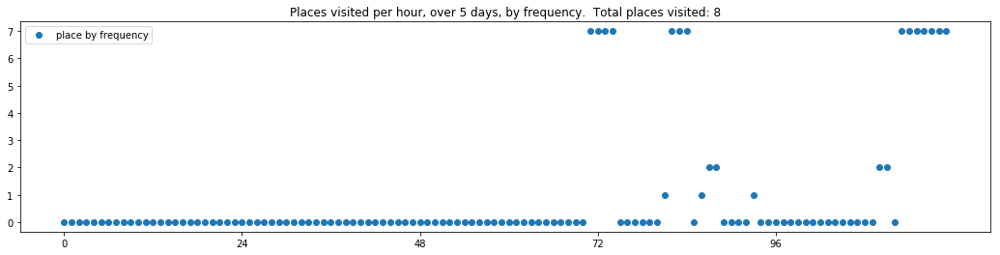

----- vector ----
prefix labels:  [526, 400]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 400, 0, 0, 0, 456, 526, 400, 400, 0, 254, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 209, 0, 0, 0, 0]
[0, 0, 0, 319, 319, 319, 319, 0, 0, 0, 0, 0, 0, 0, 0, 0, 271, 271, 271, 271, 271, 271, 271, 271]
[0, 0, 0, 0, 162, 162, 162, 162, 162, 162, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 0, 0, 0, 0, 0]


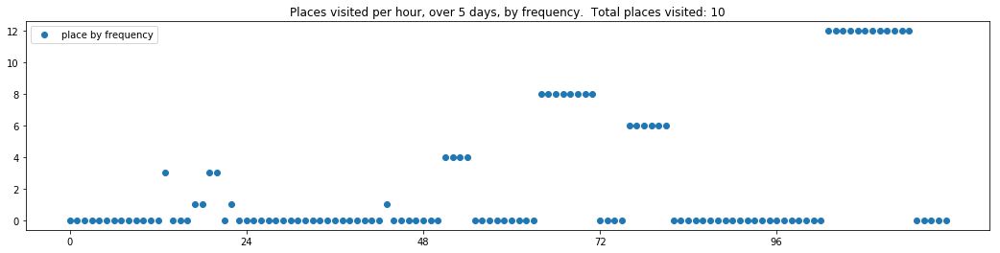

----- vector ----
prefix labels:  [23, 487]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 120, 0, 0, 487, 567, 567, 0, 567]
[567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 0, 0, 23, 567, 567, 567, 487, 487]
[487, 487, 487, 487, 487, 0, 23, 487, 23, 487, 487, 487, 487, 487, 487, 0, 0, 0, 23, 567, 567, 567, 567, 567]
[567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567]
[567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 23, 487, 487, 487]


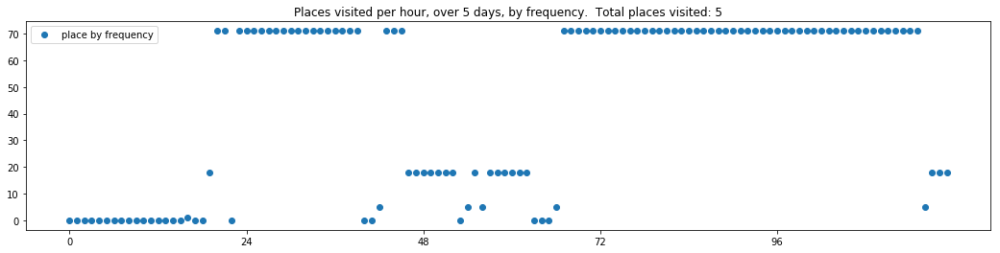

----- vector ----
prefix labels:  [2, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 335, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


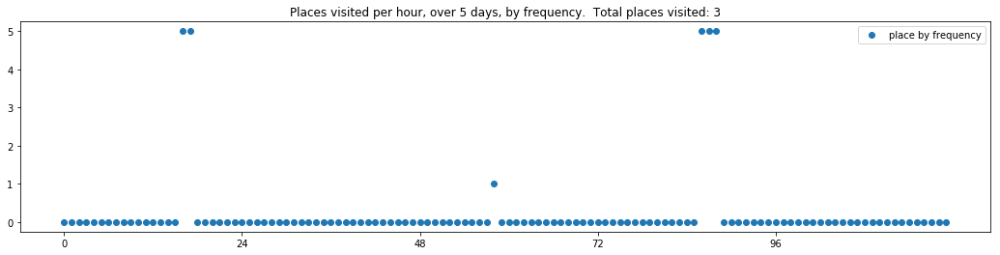

----- vector ----
prefix labels:  [439, 439]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 439, 439, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 439, 0]
[0, 0, 439, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 439, 439, 439, 439, 0, 0, 0, 439, 439, 439, 439]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


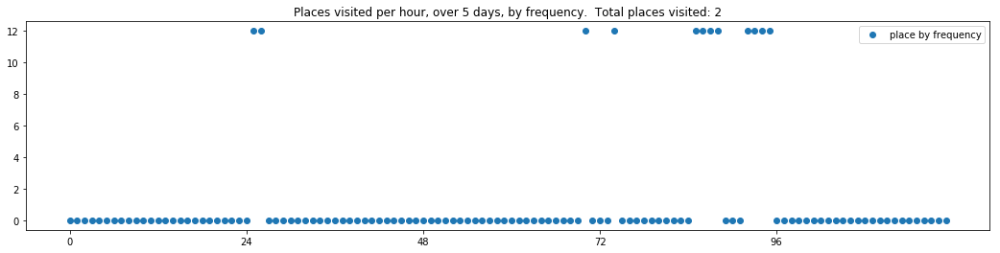

----- vector ----
prefix labels:  [162, 235]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


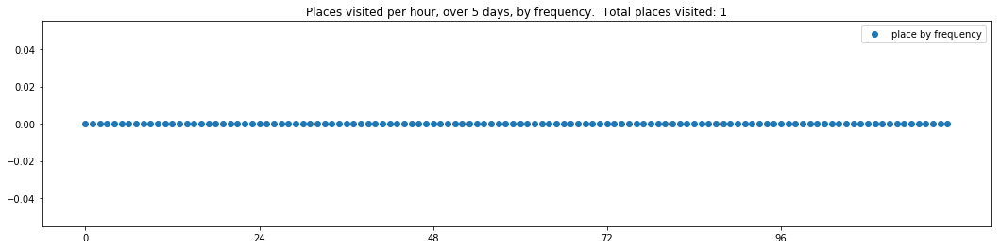

----- vector ----
prefix labels:  [102, 588]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 165, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 165, 390, 390, 390, 390, 0, 0, 0, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 390, 390, 390]
[390, 390, 0, 390, 522, 522, 522, 522, 0, 611, 611, 0, 0, 390, 390, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 68, 0, 0, 0, 0, 0, 0, 0, 0, 453, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611]


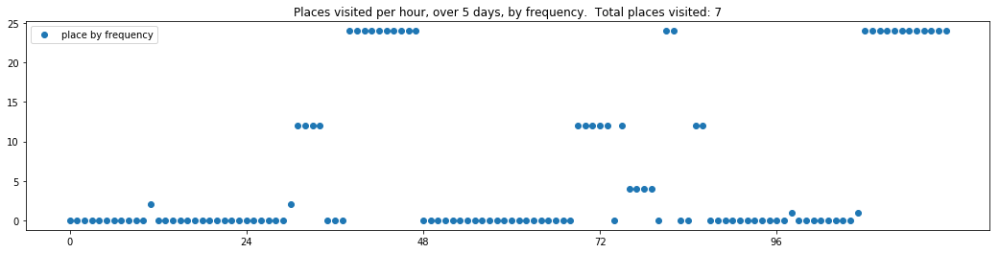

----- vector ----
prefix labels:  [588, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 588, 0, 0, 0, 0, 0, 0, 22, 22, 22, 22, 22]
[22, 22, 22, 0, 0, 98, 0, 0, 588, 588, 588, 588, 0, 0, 0, 0, 588, 588, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390]


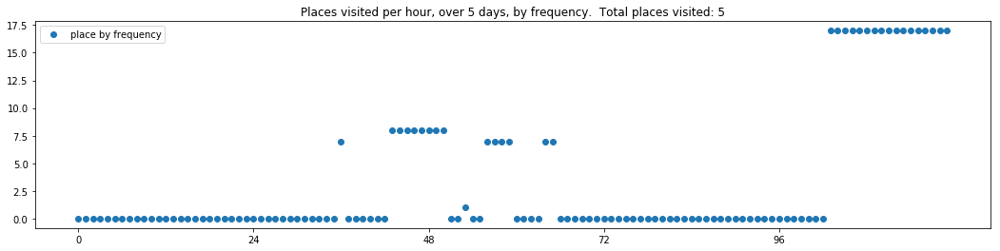

----- vector ----
prefix labels:  [87, 87]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[87, 87, 0, 87, 87, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 146, 146, 94, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 542, 0, 0, 0, 0]


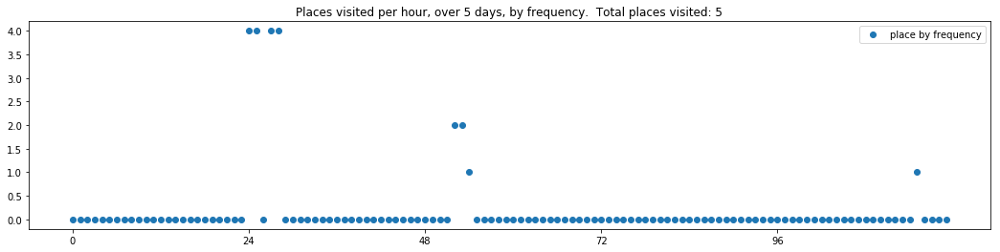


------
 65 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_65.txt 
------

----- vector ----
prefix labels:  [31, 31]
[0, 0, 0, 0, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31]
[31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31]
[31, 31, 31, 31, 31, 31, 0, 0, 447, 0, 0, 0, 0, 0, 0, 0, 0, 31, 31, 31, 31, 31, 0, 0]
[0, 0, 0, 0, 0, 0, 516, 204, 204, 204, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31]
[0, 0, 119, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 31, 31, 31, 31, 31, 31, 31, 31, 31]


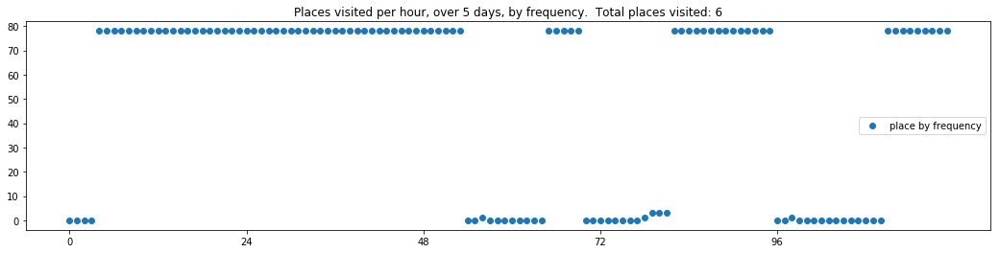

----- vector ----
prefix labels:  [386, 386]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 386, 386, 386, 386, 386, 386, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 386, 386, 386, 386, 76, 76, 386, 386, 386, 386, 386, 386, 386, 386, 386, 386]
[386, 386, 386, 0, 0, 0, 0, 478, 451, 0, 0, 0, 0, 0, 0, 478, 478, 478, 0, 478, 478, 478, 478, 478]
[478, 0, 0, 0, 340, 0, 0, 0, 0, 0, 0, 0, 0, 0, 451, 171, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 478, 478, 0, 0, 21, 21, 0, 231, 0, 478, 478, 478, 478]


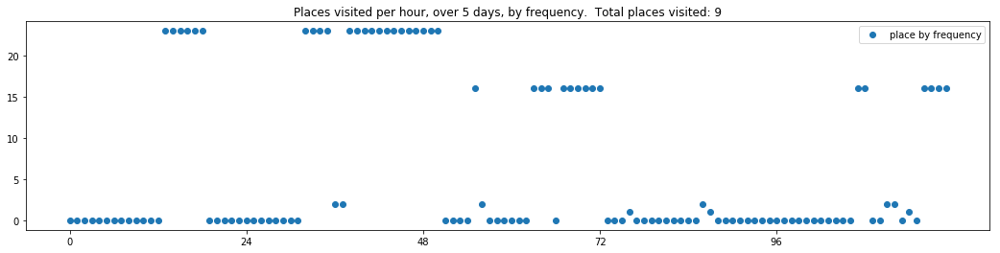

----- vector ----
prefix labels:  [314, 314]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 320, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 19, 0, 165, 314, 314, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 314, 0, 0, 0, 0, 0, 314, 314, 0, 0, 0, 0, 0, 0, 0, 0, 0]


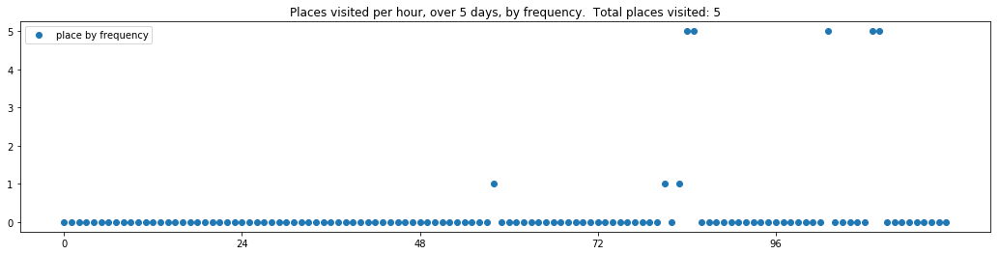

----- vector ----
prefix labels:  [260, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 260, 260, 260, 260, 260, 260, 260]
[260, 260, 260, 260, 260, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 260, 260, 260, 260]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 260, 260, 260, 260, 260, 260, 260, 260, 260]


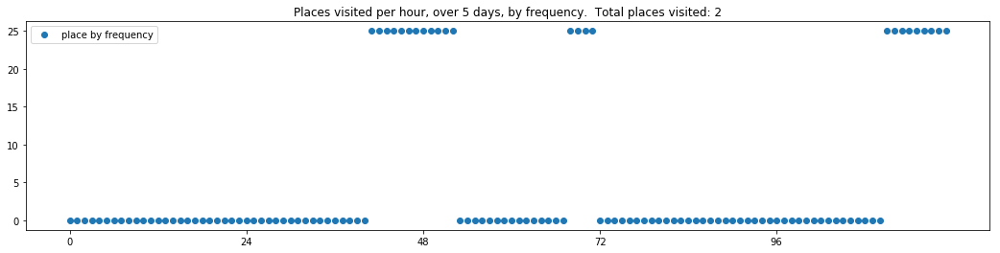

----- vector ----
prefix labels:  [314, 304]
[0, 0, 0, 0, 0, 0, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304]
[304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304]
[304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 311]
[311, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 313, 304, 304, 304, 304, 304]


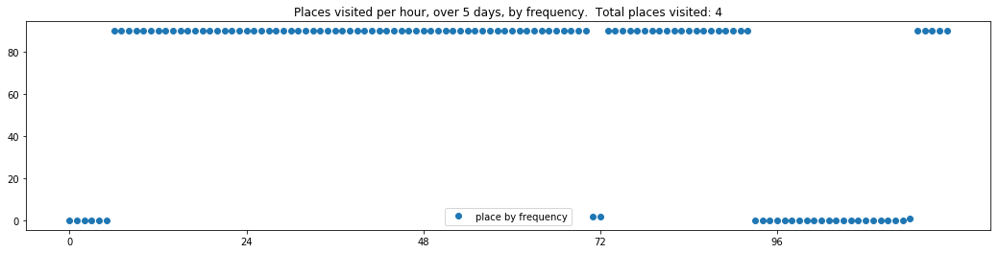

----- vector ----
prefix labels:  [282, 145]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 282, 282, 282, 282, 282, 282, 282]
[282, 282, 282, 282, 282, 282, 282, 282, 282, 282, 282, 282, 282, 282, 282, 282, 267, 56, 56, 56, 282, 282, 282, 282]
[282, 282, 282, 282, 162, 435, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 282, 282, 282, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 486, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


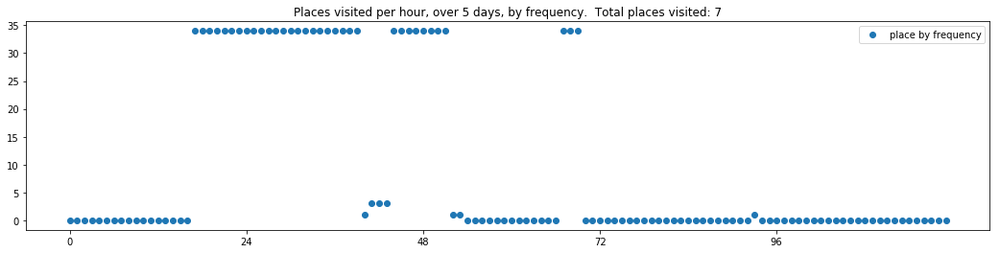

----- vector ----
prefix labels:  [611, 611]
[0, 0, 0, 0, 0, 0, 0, 0, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611]
[611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 0]
[611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611]
[611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611]
[611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611]


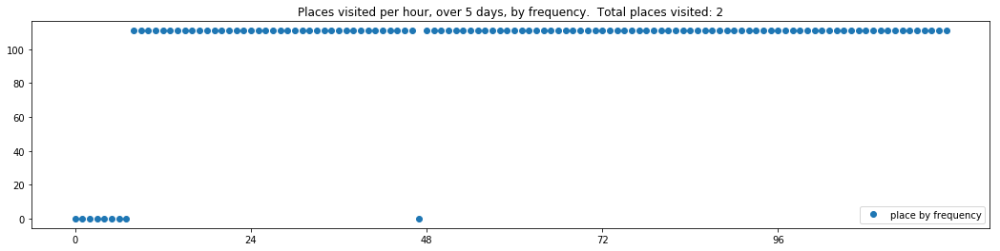

----- vector ----
prefix labels:  [34, 69]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 69, 0, 0, 0, 0, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34]
[34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34]
[34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34]
[34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 151]
[151, 0, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 0, 34, 34, 34, 34, 34, 34, 34, 34, 34]


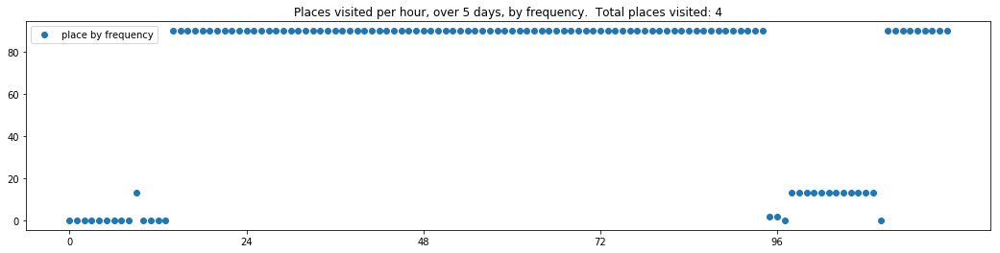

----- vector ----
prefix labels:  [83, 2]
[0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 239, 0, 239, 239, 239, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 239, 239, 226, 357, 357, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 271]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 239, 239, 239, 0, 0, 0, 0, 0, 0, 0]


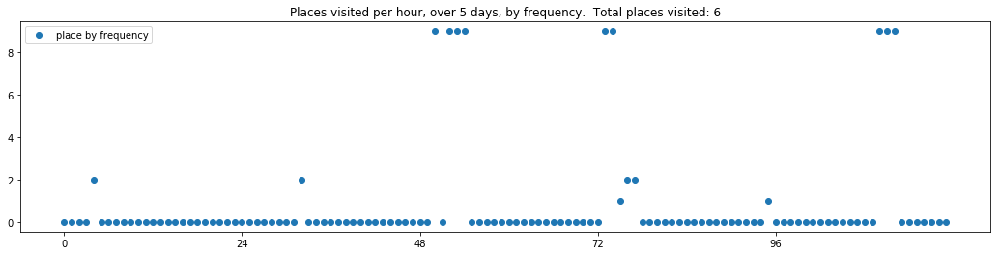

----- vector ----
prefix labels:  [384, 384]
[0, 0, 0, 0, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384]
[384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384]
[384, 384, 384, 384, 384, 384, 384, 384, 384, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 384, 384, 384, 384]
[384, 384, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


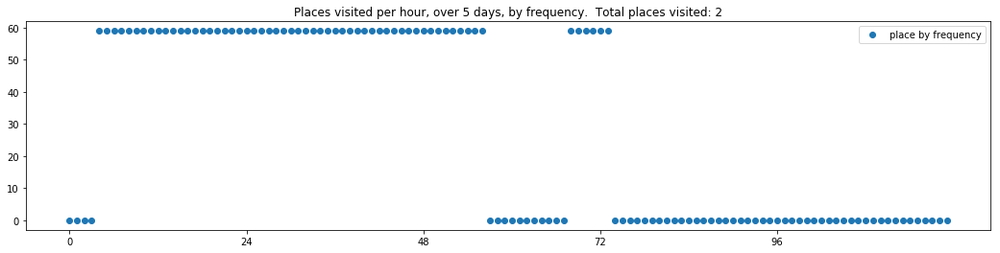


------
 70 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_70.txt 
------

----- vector ----
prefix labels:  [181, 76]
[0, 644, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 439, 439, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 212, 212, 212]
[212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212]
[212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212]


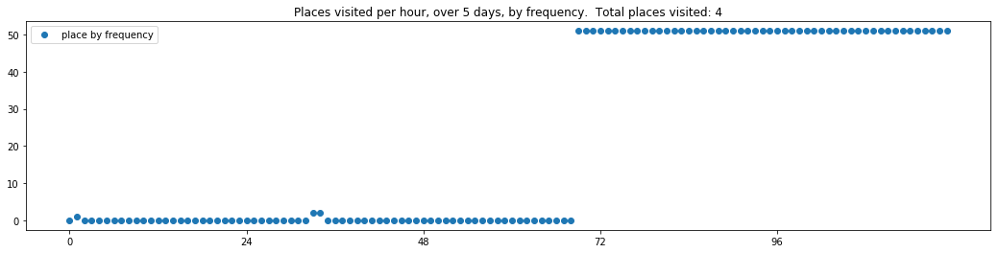

----- vector ----
prefix labels:  [184, 184]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 184, 184, 184, 184, 184, 184, 0, 0, 0, 0, 0, 0, 0, 0, 0, 184]
[184, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


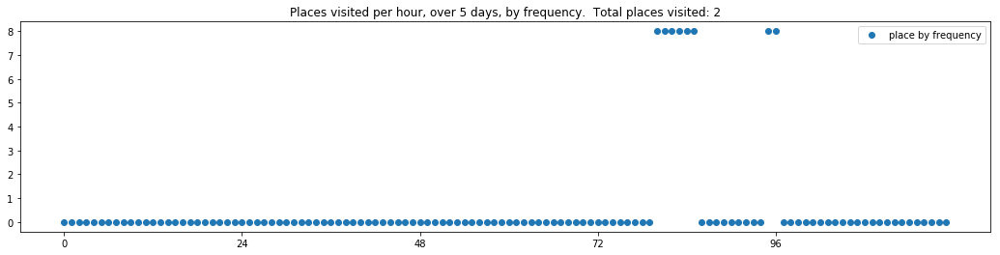

----- vector ----
prefix labels:  [328, 328]
[0, 0, 0, 0, 0, 0, 0, 0, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 0, 328]
[328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 0, 328]
[328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328]
[328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328]
[328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


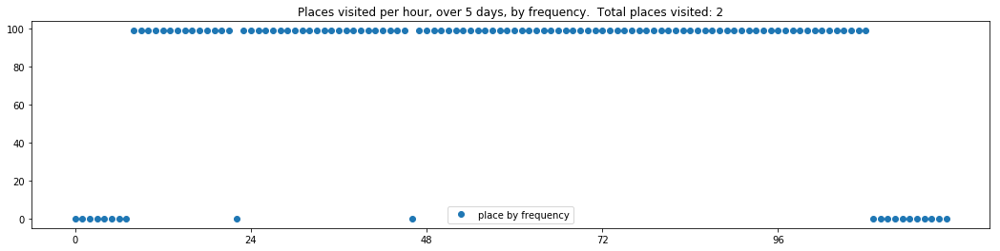

----- vector ----
prefix labels:  [50, 50]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[20, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 183, 20, 20, 20, 20, 20, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 396, 396, 396, 396, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


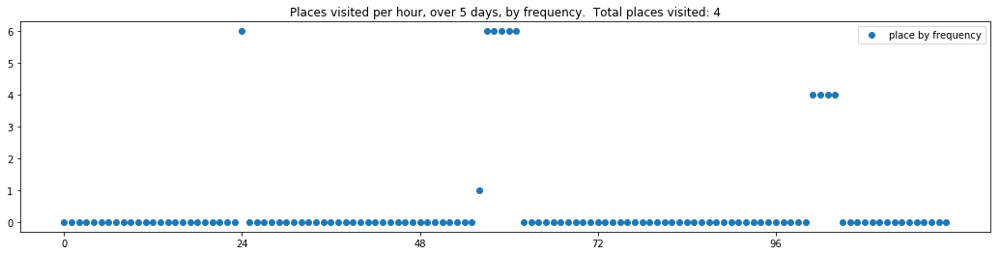

----- vector ----
prefix labels:  [65, 65]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65]
[65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 22, 22, 22]
[22, 22, 22, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 0, 65, 65, 65, 65, 65, 65]
[65, 65, 65, 22, 0, 22, 65, 65, 22, 65, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65]


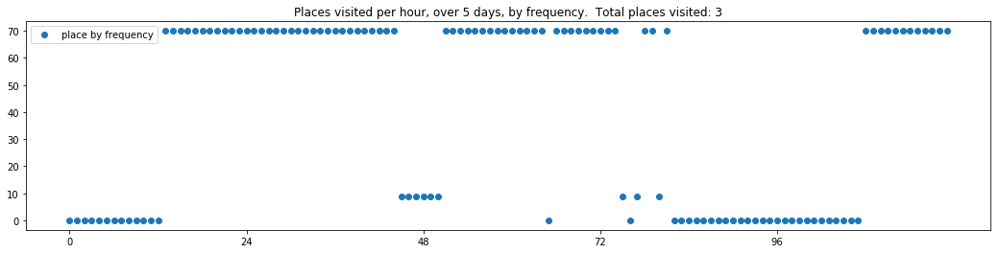

----- vector ----
prefix labels:  [611, 611]
[0, 0, 0, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611]
[611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611]
[611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611]
[611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611]
[611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611]


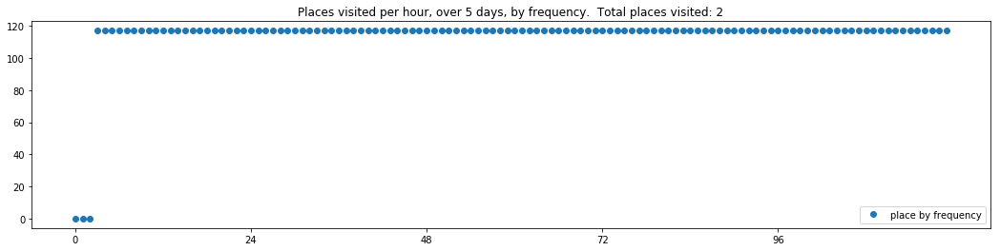

----- vector ----
prefix labels:  [133, 133]
[478, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69]
[69, 69, 69, 69, 69, 0, 0, 0, 0, 0, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69]
[144, 144, 144, 144, 144, 144, 0, 0, 69, 69, 0, 0, 0, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69]
[69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 0, 0, 0, 0, 0, 0, 372, 0, 0, 0, 0, 0]
[144, 144, 144, 144, 0, 0, 0, 0, 69, 0, 241, 0, 1, 7, 0, 0, 0, 0, 0, 0, 39, 323, 323, 323]


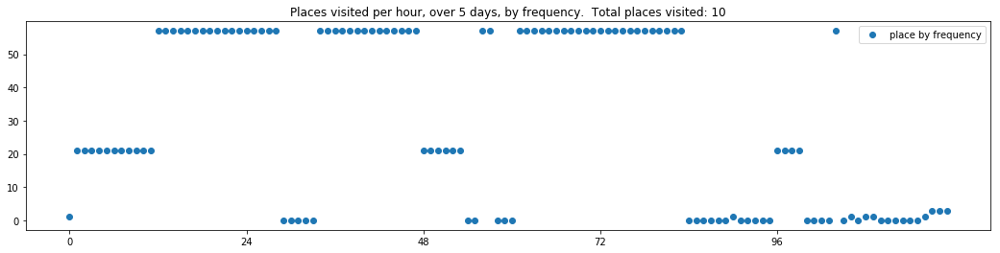

----- vector ----
prefix labels:  [87, 69]
[0, 0, 0, 0, 0, 55, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 69]
[0, 0, 0, 0, 0, 0, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 0, 0, 0, 69, 69, 69, 69]
[0, 0, 0, 0, 0, 0, 69, 69, 0, 0, 410, 0, 0, 0, 69, 69, 69, 69, 69, 69, 87, 87, 87, 87]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


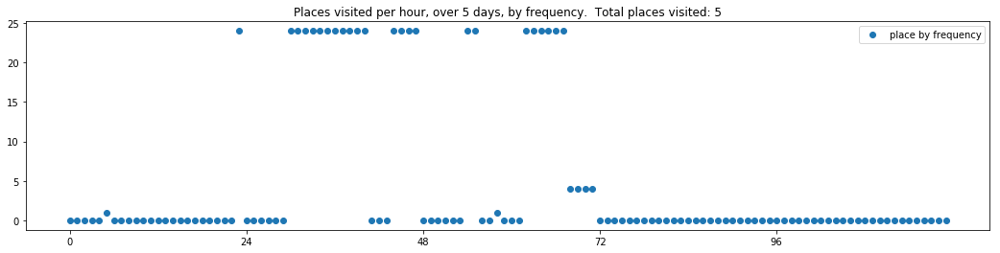

----- vector ----
prefix labels:  [533, 0]
[0, 0, 0, 0, 533, 533, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 533, 533, 533, 533, 533, 533, 533, 533, 533, 533, 533, 533, 533, 533, 533, 533, 533, 533, 533, 533]
[533, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


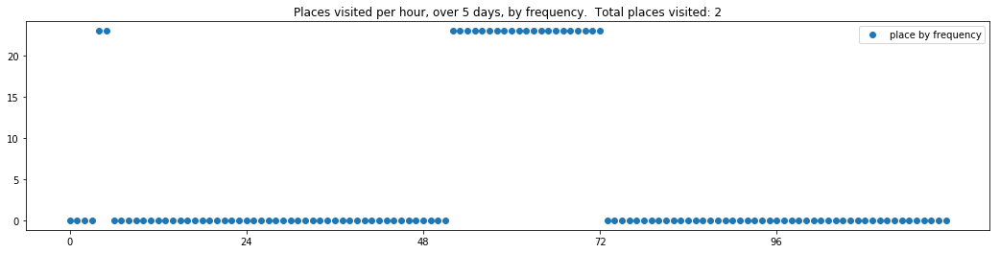

----- vector ----
prefix labels:  [334, 334]
[334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334]
[334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334]
[334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334]
[334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334]
[334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334]


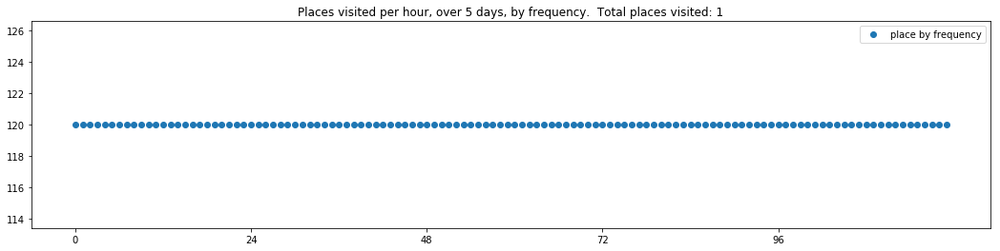


------
 75 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_75.txt 
------

----- vector ----
prefix labels:  [590, 415]
[0, 0, 328, 328, 328, 328, 328, 107, 107, 107, 107, 107, 107, 107, 107, 107, 107, 107, 107, 107, 107, 107, 107, 107]
[107, 107, 107, 107, 107, 107, 107, 107, 107, 107, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415]
[415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 0, 0, 0, 0, 328, 453]
[0, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 0, 415, 415, 415, 415, 415, 415, 415, 415]
[415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415]


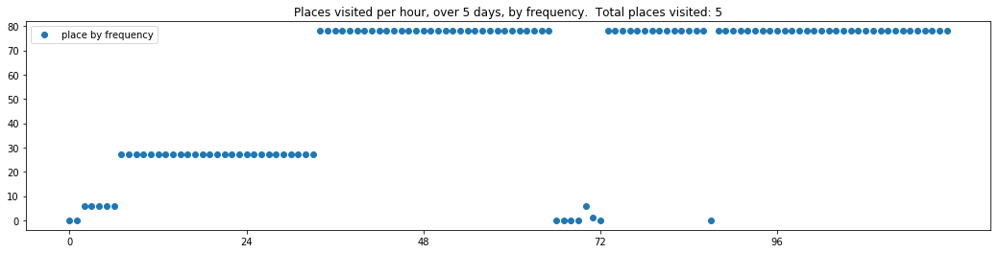

----- vector ----
prefix labels:  [427, 427]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 427, 427, 427, 0, 0, 0, 0, 0, 0, 0, 0, 427, 427, 427, 427, 427, 427, 427, 427, 427, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 427, 284, 284, 284, 284, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 239, 239, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


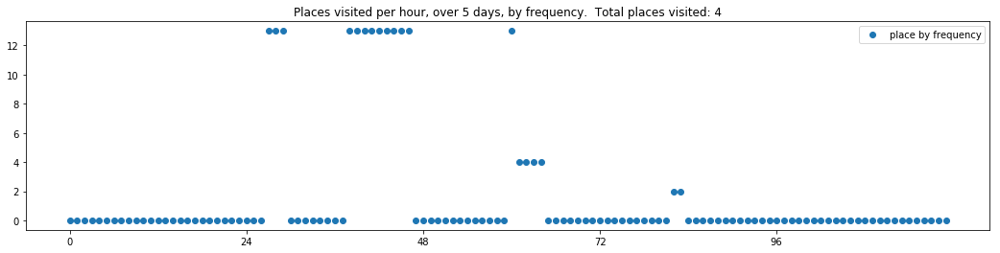

----- vector ----
prefix labels:  [97, 97]
[0, 0, 0, 0, 0, 410, 410, 410, 410, 410, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545]
[545, 97, 97, 97, 97, 97, 97, 97, 97, 97, 97, 97, 97, 97, 97, 97, 97, 97, 97, 97, 97, 97, 97, 97]
[97, 97, 97, 97, 97, 97, 97, 97, 97, 97, 0, 0, 0, 0, 0, 0, 0, 644, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 224, 0, 0, 0, 0, 0, 147, 147, 147, 147, 147, 147, 147, 147, 147, 147, 147, 147, 147]


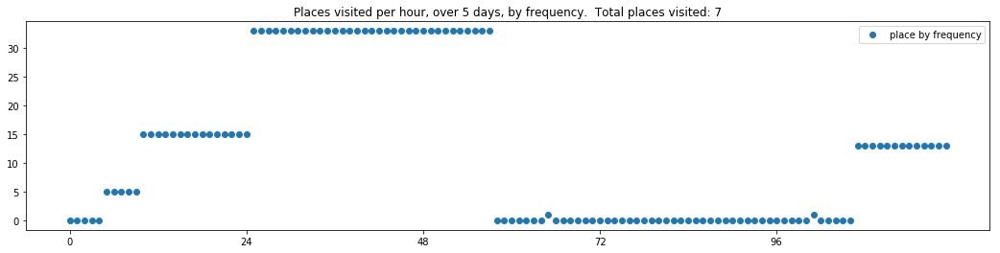

----- vector ----
prefix labels:  [437, 437]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 437, 437, 437, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 437, 437, 437, 437, 437, 437, 0, 0, 0, 0, 0, 0, 0, 437, 437, 437, 437, 437]
[437, 437, 437, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 437, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 437, 437]


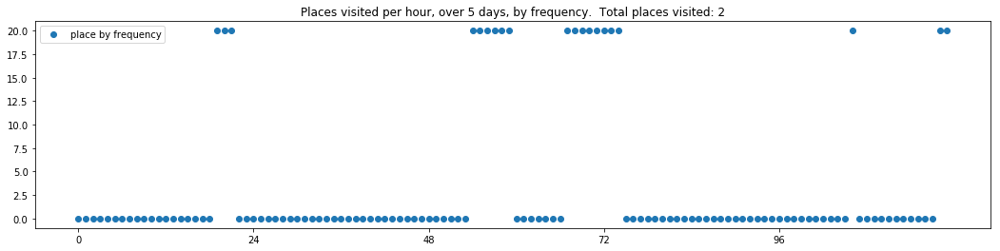

----- vector ----
prefix labels:  [515, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 32, 32, 32, 32, 32, 32, 32, 32, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 164]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 214, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[637, 0, 0, 0, 0, 0, 278, 0, 0, 0, 0, 0, 0, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278]


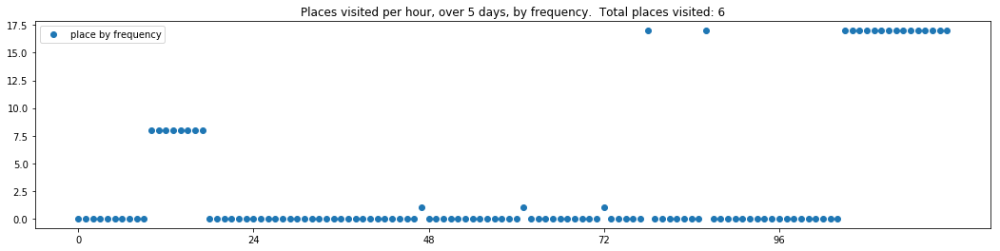

----- vector ----
prefix labels:  [637, 637]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 544, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 544, 544, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 38, 38, 38, 38, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


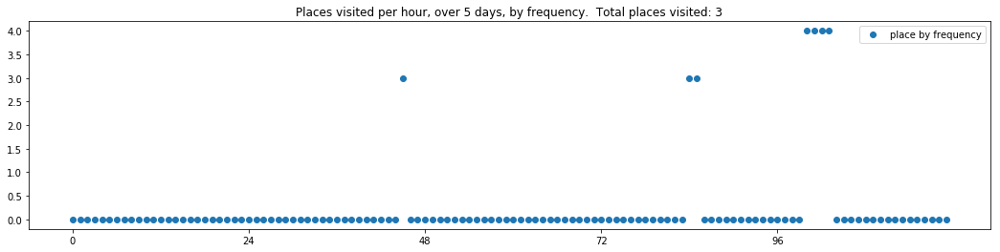

----- vector ----
prefix labels:  [404, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


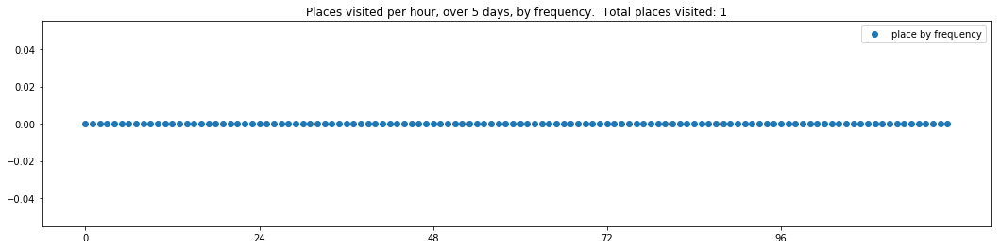

----- vector ----
prefix labels:  [392, 392]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 0, 0, 0]
[0, 0, 0, 0, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392]
[392, 392, 392, 392, 392, 392, 392, 392, 392, 0, 0, 0, 0, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392]
[392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392]


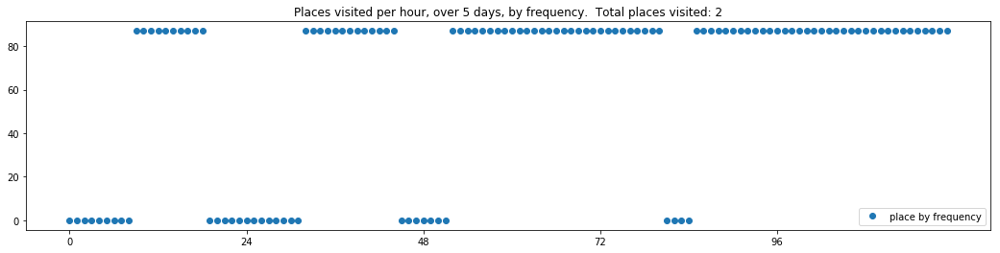

----- vector ----
prefix labels:  [11, 11]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 21, 21, 21]
[0, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 71, 21, 21, 21, 21, 21, 21]
[21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 0, 0, 0, 0, 0, 0, 0, 0, 0, 21, 21, 21]
[11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11]
[11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11]


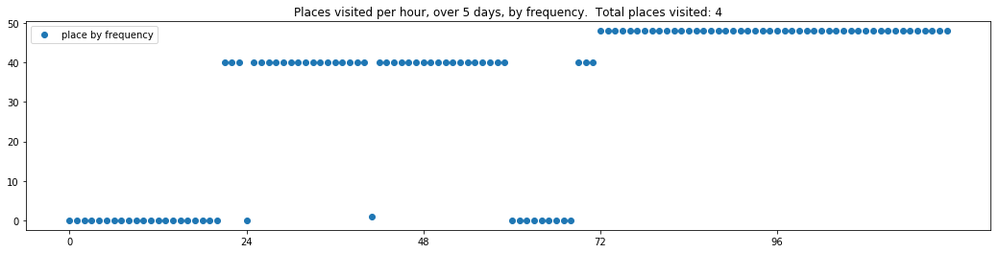

----- vector ----
prefix labels:  [341, 462]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 194, 0, 0, 0, 0, 341, 341, 341, 341, 341, 311, 311, 311]
[311, 311, 0, 0, 0, 0, 0, 0, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 0, 341, 311, 311, 311, 311]
[0, 341, 341, 341, 341, 311, 311, 311, 311, 311, 311, 311, 311, 0, 0, 0, 0, 0, 341, 341, 0, 194, 194, 341]
[0, 19, 56, 56, 56, 56, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 341, 462]
[462, 462, 462, 462, 462, 462, 522, 522, 390, 390, 390, 390, 390, 390, 390, 341, 341, 341, 311, 311, 507, 507, 507, 311]


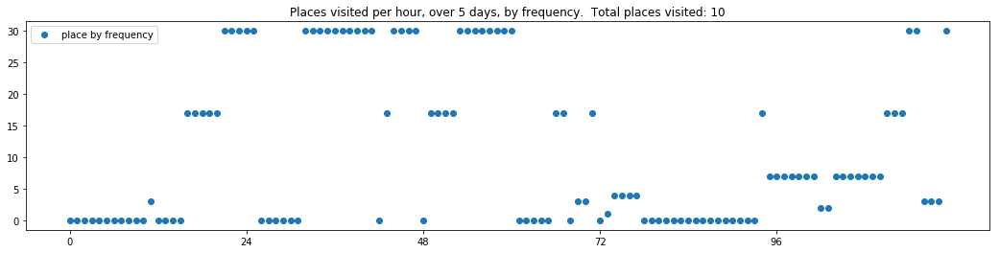


------
 80 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_80.txt 
------

----- vector ----
prefix labels:  [152, 353]
[0, 0, 0, 0, 0, 0, 0, 0, 130, 21, 21, 21, 21, 0, 0, 353, 353, 353, 353, 353, 353, 353, 353, 353]
[353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353]
[353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 0, 0, 0, 353]
[353, 353, 353, 353, 353, 353, 353, 353, 353, 0, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 130, 130]
[130, 130, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353]


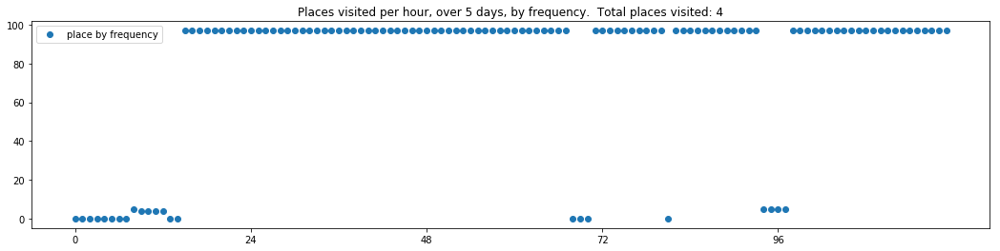

----- vector ----
prefix labels:  [44, 0]
[0, 0, 0, 0, 0, 0, 0, 44, 44, 44, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 80, 80, 80, 80, 80, 80, 80, 80, 80]
[0, 0, 0, 0, 0, 0, 0, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334]


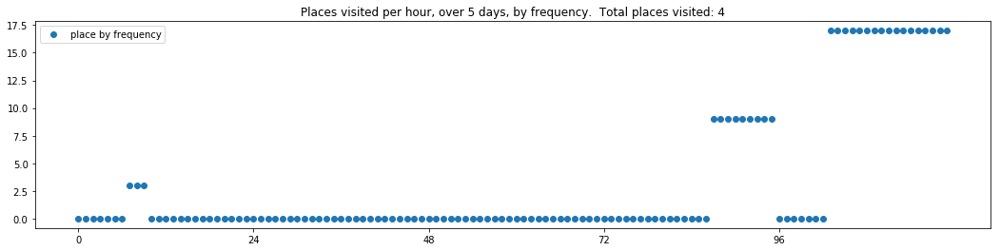

----- vector ----
prefix labels:  [177, 177]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 177, 177, 177, 177, 177, 0, 0, 0, 0, 177]
[177, 177, 84, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 177, 177, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 177, 0, 0, 0, 0, 0, 0, 16, 432, 76, 76, 76, 76, 76]
[76, 76, 76, 76, 76, 0, 0, 0, 0, 0, 0, 0, 0, 177, 177, 177, 177, 177, 177, 177, 177, 177, 177, 177]
[177, 177, 177, 177, 177, 117, 117, 0, 0, 0, 0, 0, 0, 552, 100, 0, 177, 177, 177, 0, 0, 0, 177, 177]


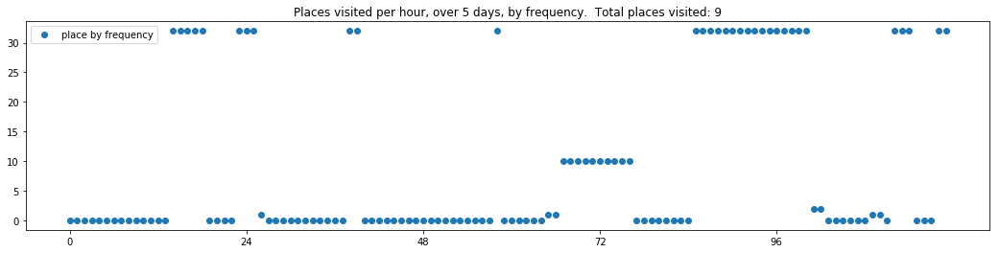

----- vector ----
prefix labels:  [180, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 180, 0, 40, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 40, 0, 180, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


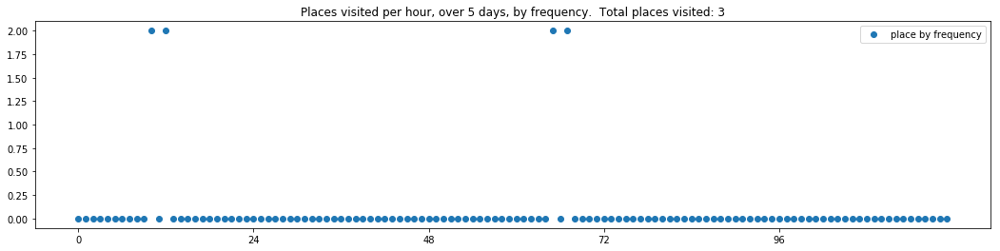

----- vector ----
prefix labels:  [271, 271]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 271, 271, 271, 271, 271, 271, 271]
[0, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 0, 0, 271, 271, 271, 271, 271, 271, 271, 271]
[271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271]
[271, 271, 271, 271, 0, 0, 0, 0, 0, 0, 0, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271]
[271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271]


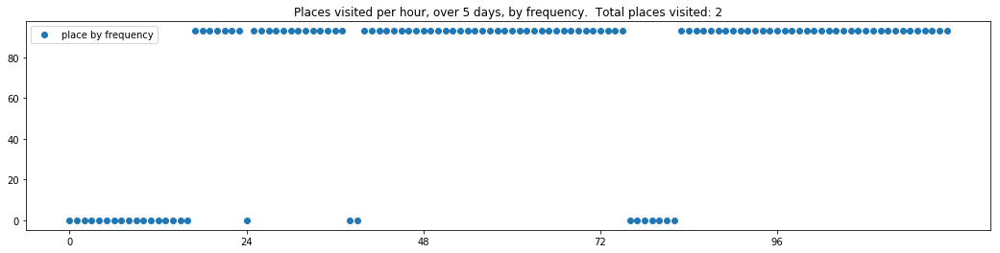

----- vector ----
prefix labels:  [431, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 431, 431, 431, 431, 431, 431, 431, 431, 431, 431]
[431, 431, 431, 431, 431, 0, 0, 0, 308, 0, 0, 0, 0, 0, 0, 0, 0, 0, 590, 590, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 22, 22, 22, 0, 0, 0, 0, 0, 22, 22, 0, 0, 0, 0, 0, 0]
[460, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 351, 0, 0, 0, 0, 0, 0, 0]


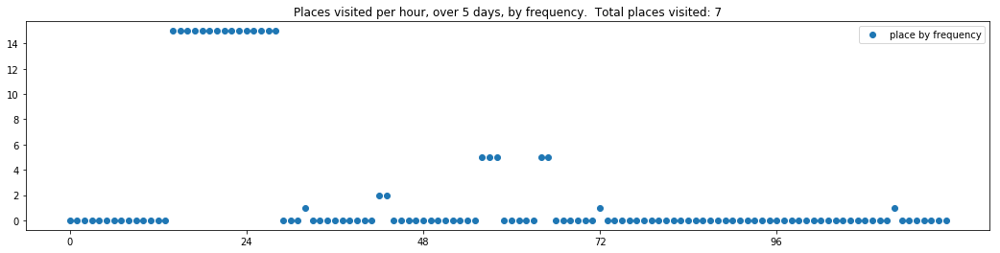

----- vector ----
prefix labels:  [78, 78]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 395, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 78, 0, 214, 214, 214, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 202, 202, 202, 0, 0, 0, 0, 0, 0, 239, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 214, 214, 214, 214, 214, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 214, 214]


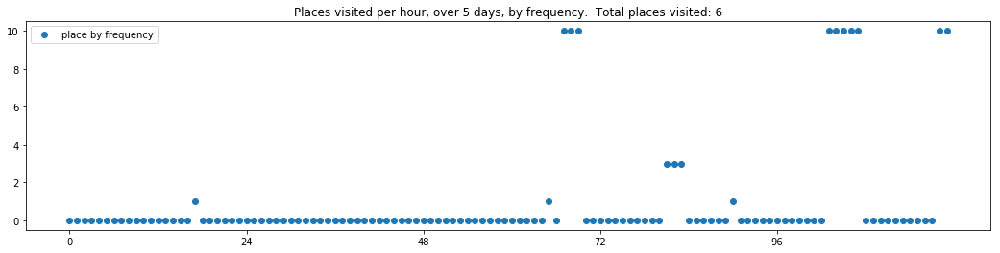

----- vector ----
prefix labels:  [487, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 487, 487, 487, 487, 487, 487, 487]
[487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487]
[487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 0, 0, 0, 0]


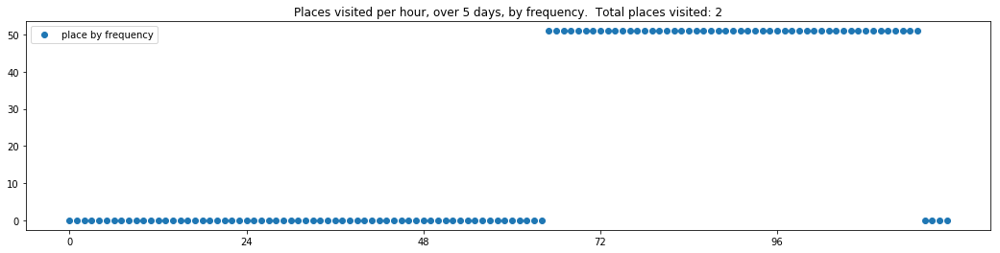

----- vector ----
prefix labels:  [365, 271]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 288, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 317, 317, 317, 317]


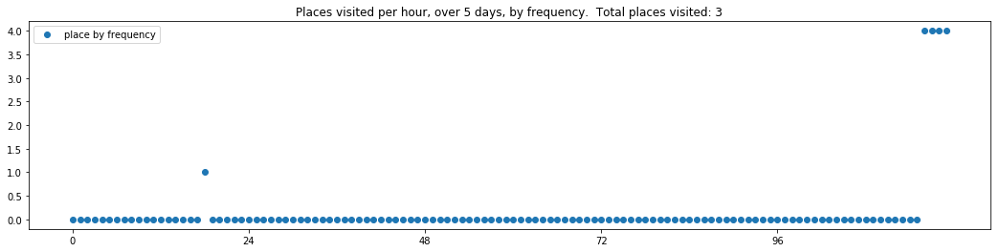

----- vector ----
prefix labels:  [384, 214]
[0, 0, 0, 0, 0, 0, 0, 29, 0, 0, 0, 0, 0, 177, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 214, 0, 8, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 214, 214, 214, 214, 214, 214, 214, 214, 214]


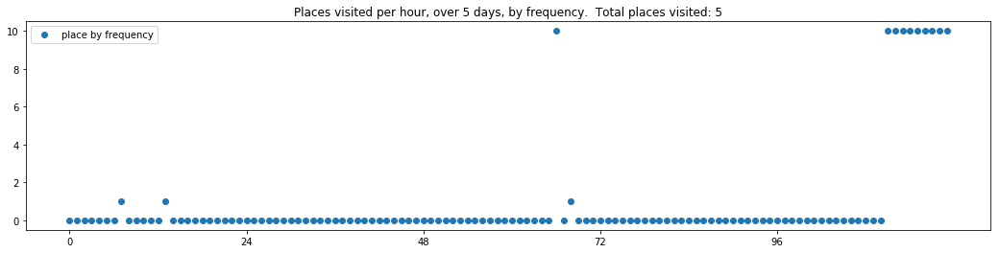


------
 85 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_85.txt 
------

----- vector ----
prefix labels:  [568, 568]
[0, 195, 195, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 568, 568, 568, 568, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 457]
[0, 0, 0, 0, 0, 0, 0, 568, 568, 568, 568, 568, 0, 0, 0, 0, 0, 0, 0, 568, 568, 568, 568, 568]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 568, 568, 568, 568]


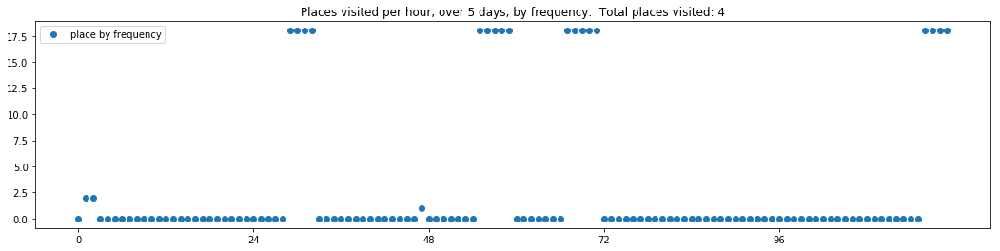

----- vector ----
prefix labels:  [15, 197]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 197, 197, 0, 0, 197, 260, 361]
[361, 199, 199, 199, 199, 199, 199, 199, 199, 199, 197, 85, 523, 580, 580, 580, 580, 580, 580, 580, 580, 580, 580, 580]
[580, 580, 575, 575, 575, 465, 0, 575, 0, 0, 575, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 144]
[144, 144, 144, 144, 144, 144, 144, 144, 144, 199, 199, 270, 270, 270, 270, 270, 270, 270, 270, 270, 270, 270, 270, 270]
[270, 270, 270, 270, 270, 270, 270, 270, 270, 270, 270, 270, 270, 270, 270, 270, 0, 270, 270, 270, 270, 270, 270, 270]


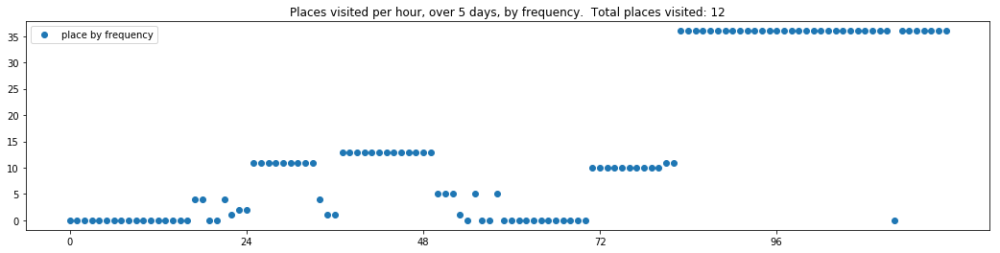

----- vector ----
prefix labels:  [215, 215]
[0, 0, 0, 0, 270, 270, 270, 270, 270, 270, 270, 270, 270, 270, 270, 270, 270, 270, 270, 270, 270, 270, 270, 270]
[270, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 52, 0, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144]
[144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144]
[144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144]


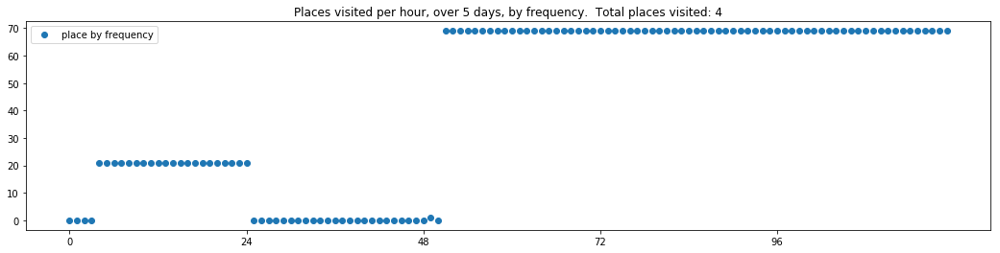

----- vector ----
prefix labels:  [130, 130]
[0, 0, 0, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130]
[130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 0, 130, 0, 0, 0, 130, 0, 0, 0, 0, 0, 130, 130]
[0, 0, 0, 0, 0, 0, 0, 130, 130, 130, 130, 130, 130, 130, 130, 130, 0, 130, 130, 130, 130, 130, 130, 0]
[130, 130, 130, 130, 0, 130, 130, 0, 0, 0, 130, 0, 130, 130, 0, 0, 0, 0, 130, 130, 130, 130, 130, 84]
[84, 84, 130, 130, 0, 0, 0, 0, 130, 130, 130, 130, 130, 130, 0, 130, 130, 130, 130, 0, 130, 130, 130, 130]


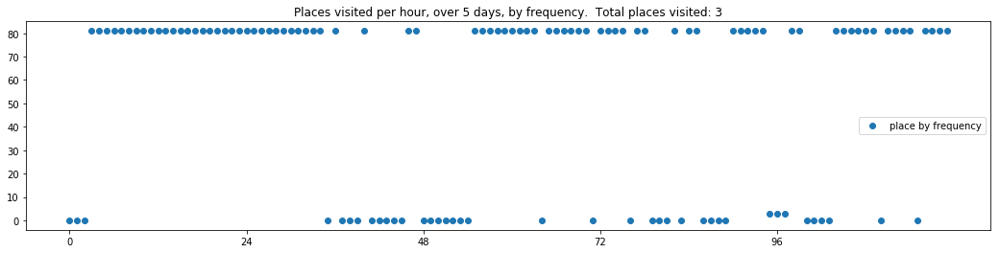

----- vector ----
prefix labels:  [87, 87]
[0, 0, 0, 0, 87, 87, 87, 0, 87, 0, 0, 0, 0, 0, 0, 0, 391, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 162, 162, 162, 162, 162, 0, 0]
[0, 0, 0, 0, 271, 0, 0, 0, 0, 0, 0, 0, 87, 87, 0, 0, 0, 0, 0, 271, 271, 271, 271, 271]
[271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 448, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271]
[271, 271, 271, 271, 271, 0, 271, 271, 271, 271, 271, 271, 271, 266, 0, 87, 87, 87, 87, 87, 87, 87, 0, 0]


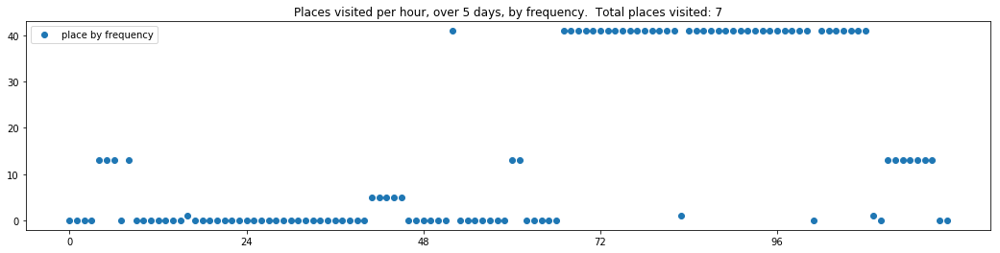

----- vector ----
prefix labels:  [293, 183]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 276, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 276, 0, 0, 0, 0]


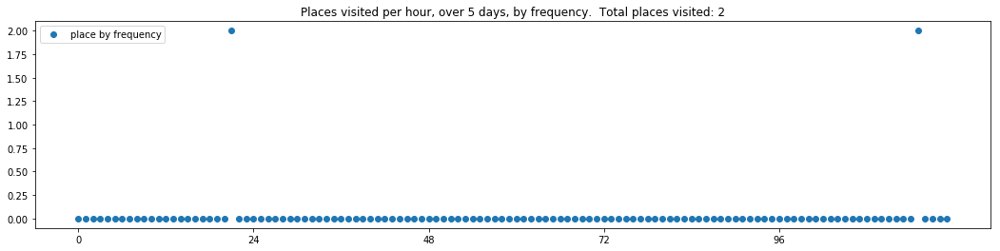

----- vector ----
prefix labels:  [430, 571]
[0, 0, 0, 0, 0, 0, 0, 0, 176, 176, 176, 176, 176, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 439, 0, 176, 176, 176, 176, 176, 176, 176, 176, 176, 176, 176, 176, 176, 176, 176, 176, 176, 176]
[176, 176, 176, 176, 176, 176, 0, 0, 0, 0, 0, 0, 403, 41, 41, 41, 41, 176, 176, 354, 176, 176, 176, 176]
[176, 176, 176, 176, 176, 176, 176, 176, 176, 176, 176, 21, 486, 486, 486, 486, 486, 486, 486, 126, 126, 126, 126, 126]
[126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126]


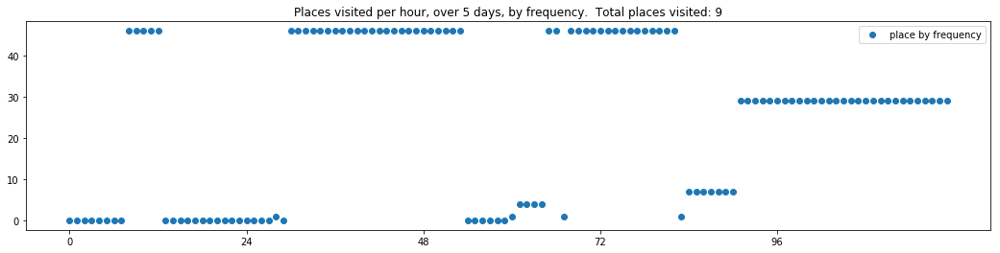

----- vector ----
prefix labels:  [372, 372]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 372, 0, 372, 372, 0, 0, 0, 0, 0, 0, 0, 0, 0, 257]
[0, 257, 257, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4]
[4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 0, 71, 71, 71, 71, 71, 71, 71, 71, 70, 70, 372, 372]
[372, 372, 372, 372, 372, 372, 372, 372, 0, 0, 0, 0, 0, 0, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104]
[104, 104, 104, 104, 104, 104, 104, 150, 150, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104]


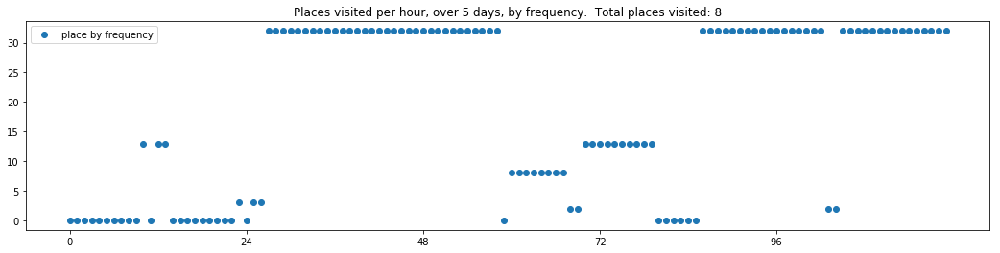

----- vector ----
prefix labels:  [78, 78]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[78, 78, 203, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 78, 78, 0, 0, 0, 0, 0, 0, 0]
[0, 538, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 78, 78, 0, 417, 92, 220, 0, 0, 0, 0, 0, 0, 0, 0, 0, 130, 0, 0, 0, 0, 0, 0, 0]


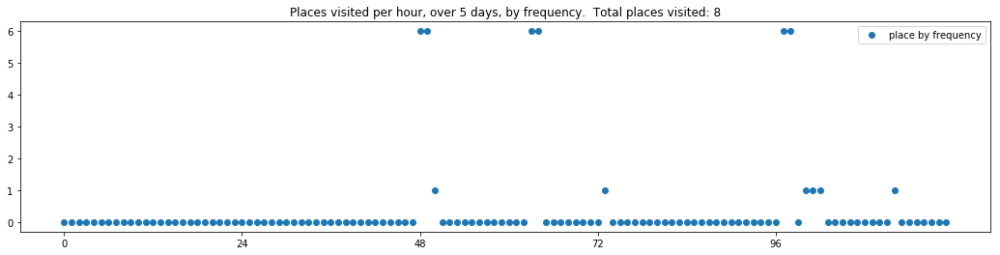

----- vector ----
prefix labels:  [117, 117]
[0, 0, 0, 0, 0, 117, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 268, 268, 268, 268]
[268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268]
[268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268]
[268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268]
[268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268]


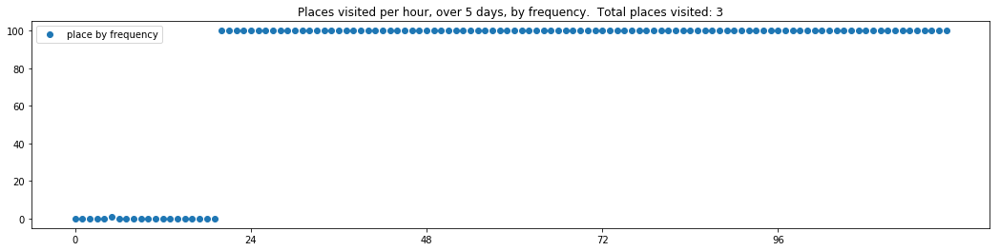


------
 90 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_90.txt 
------

----- vector ----
prefix labels:  [251, 251]
[0, 0, 0, 0, 251, 251, 251, 251, 251, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 251, 251, 251, 251, 251, 251, 251, 251, 251, 251, 251, 251, 251, 251, 251, 251, 251, 251, 251, 251, 251, 251]
[251, 251, 251, 251, 251, 251, 32, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 251, 251, 251, 251, 251, 251, 251, 251, 251, 251, 251, 251, 251]


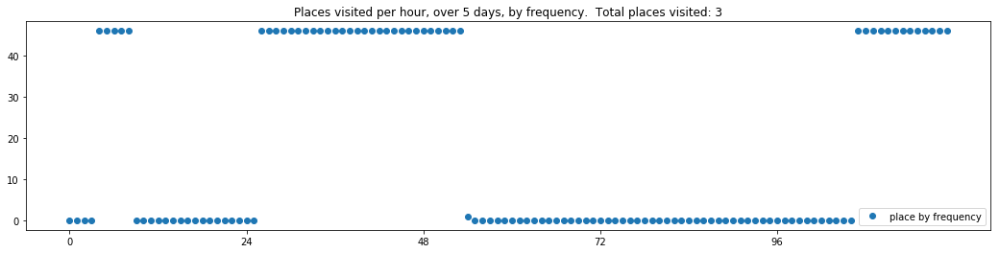

----- vector ----
prefix labels:  [29, 29]
[0, 0, 0, 0, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 277, 0, 0, 0, 29, 29, 29, 29]
[29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29]
[29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29]
[29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29]
[29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29]


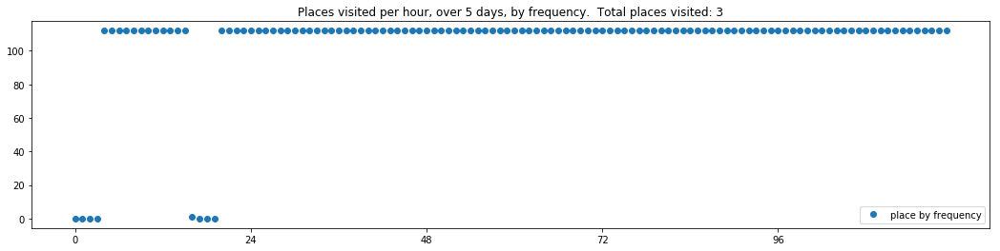

----- vector ----
prefix labels:  [529, 459]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 24, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 459, 0, 0, 0, 0]


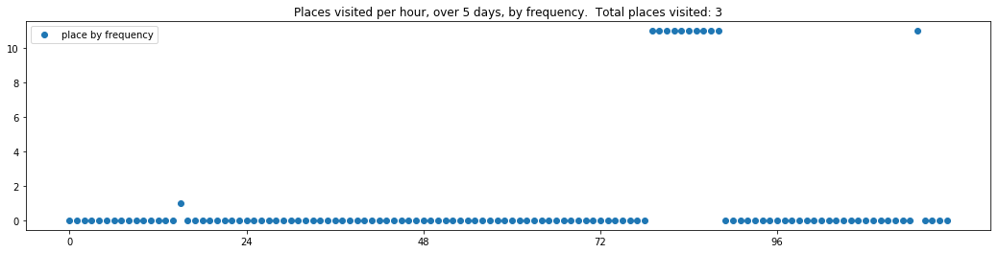

----- vector ----
prefix labels:  [395, 395]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 84, 0, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395]
[395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 84, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395]
[395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395]
[271, 271, 271, 371, 371, 371, 371, 371, 371, 186, 186, 186, 186, 186, 186, 186, 186, 186, 186, 186, 4, 4, 0, 379]
[0, 140, 338, 338, 338, 0, 151, 338, 338, 338, 338, 0, 186, 186, 186, 186, 186, 186, 186, 186, 140, 140, 186, 0]


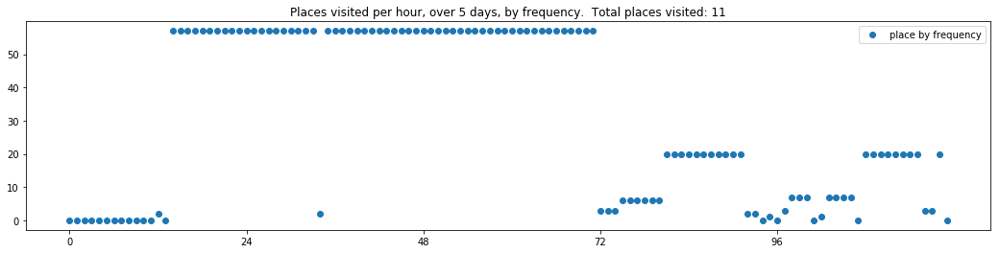

----- vector ----
prefix labels:  [26, 26]
[0, 0, 0, 0, 0, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26]
[26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26]
[26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26]
[26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26]
[26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26]


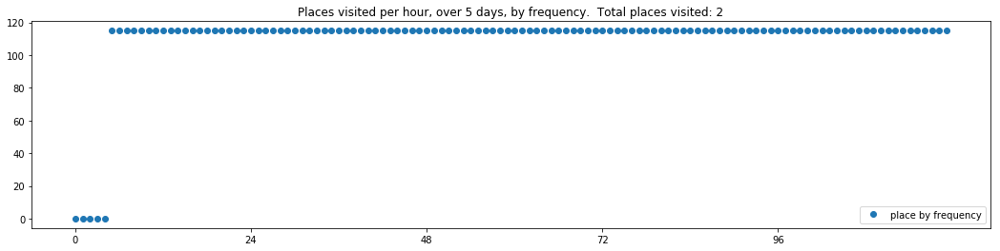

----- vector ----
prefix labels:  [246, 246]
[0, 0, 0, 0, 0, 0, 246, 246, 246, 246, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 246, 246, 246, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 246, 246, 246, 246, 246, 246, 246, 246]


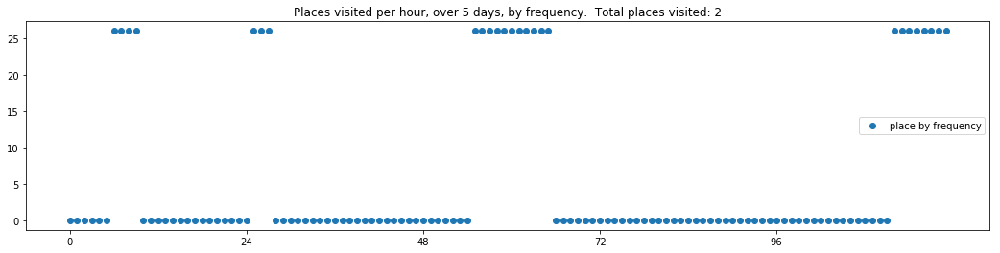

----- vector ----
prefix labels:  [246, 246]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 246, 246, 246, 246, 246, 246, 246, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 48, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 109, 0]


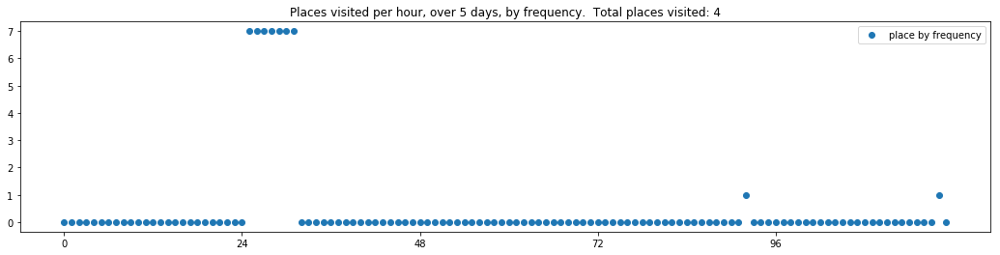

----- vector ----
prefix labels:  [311, 311]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311]
[311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311]
[311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311]
[311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311]
[311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311]


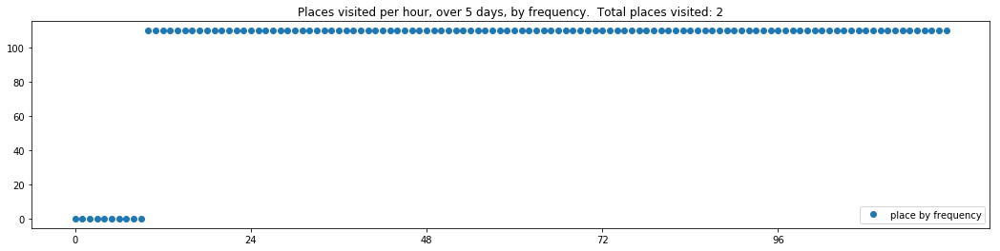

----- vector ----
prefix labels:  [130, 130]
[0, 0, 0, 0, 0, 0, 0, 0, 130, 130, 34, 34, 0, 0, 0, 0, 130, 130, 130, 130, 130, 130, 130, 130]
[130, 130, 130, 130, 0, 130, 130, 130, 130, 130, 130, 130, 0, 130, 34, 0, 0, 0, 0, 0, 0, 0, 130, 130]
[130, 0, 130, 130, 130, 130, 130, 130, 130, 0, 130, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69]
[69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69]
[69, 69, 69, 69, 69, 69, 69, 69, 69, 0, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130]


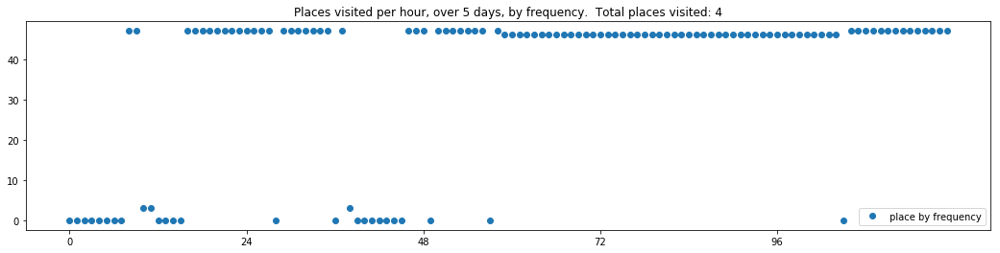

----- vector ----
prefix labels:  [153, 8]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 203, 116, 116, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[116, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 39, 0, 0, 0, 8, 0, 21, 0, 0, 0, 0, 0, 0, 0, 0, 21, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 21, 364, 364, 364, 364, 253, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126]


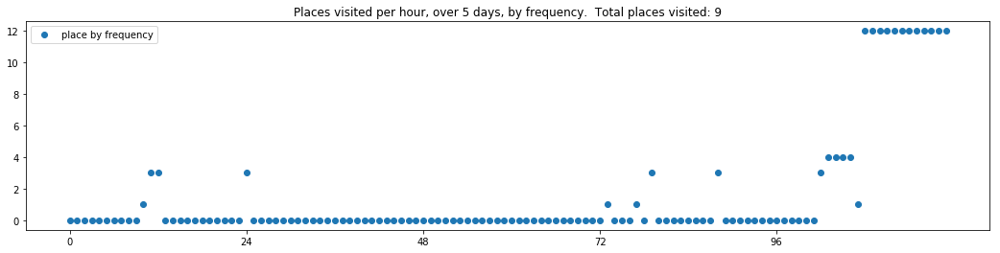


------
 95 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_95.txt 
------

----- vector ----
prefix labels:  [0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


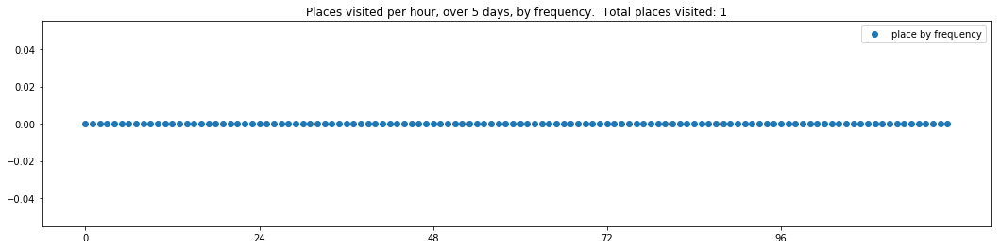

----- vector ----
prefix labels:  [352, 352]
[0, 0, 0, 0, 0, 70, 0, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352]
[352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352]
[352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352]
[352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352]
[352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352]


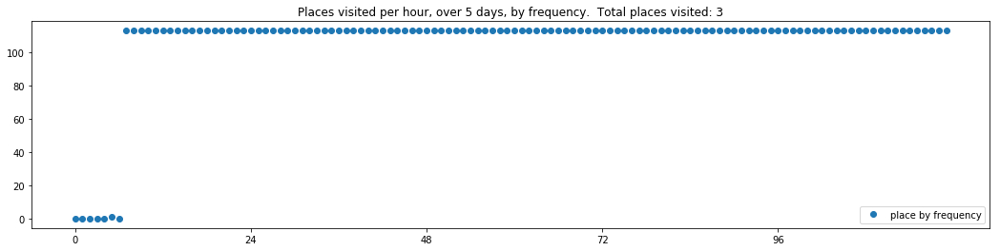

----- vector ----
prefix labels:  [392, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 392, 392, 392, 392, 392]
[392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392]
[392, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 570, 570, 374, 374, 374, 374, 374, 374, 374, 374, 374, 374, 374, 374, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 309, 0, 0, 0, 0, 0, 0, 0, 0, 165, 304, 165, 165, 0, 0, 0]


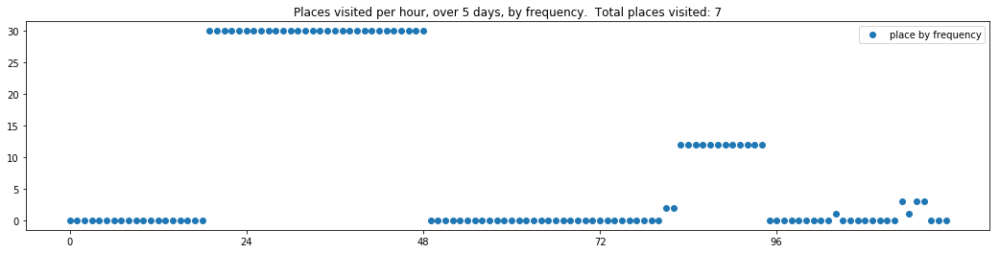

----- vector ----
prefix labels:  [392, 392]
[0, 0, 0, 0, 0, 0, 0, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392]
[392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392]
[392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392]
[392, 392, 392, 392, 392, 392, 392, 392, 0, 0, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392]
[392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 0, 392, 392, 392, 392, 392, 392, 392, 392, 392]


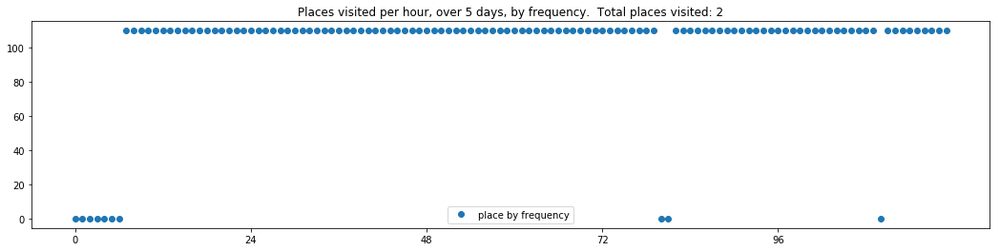

----- vector ----
prefix labels:  [339, 339]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339]
[339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339]
[339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339]
[339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339]
[339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339]


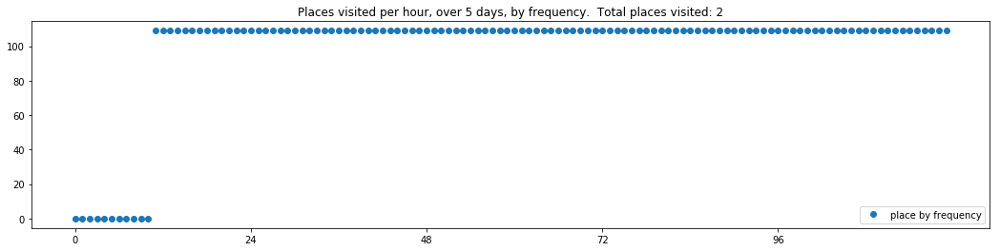

----- vector ----
prefix labels:  [109, 109]
[0, 0, 0, 0, 0, 109, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 109, 109, 109, 109]
[109, 109, 109, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 412, 412, 412, 412, 412]
[412, 412, 412, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 412, 412, 0, 0, 0, 0, 0, 0, 0, 412, 412, 247, 0, 0, 0, 109, 109, 109]


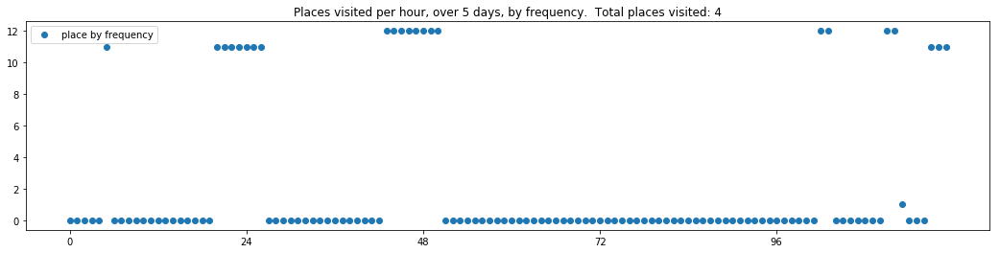

----- vector ----
prefix labels:  [216, 125]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 203, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216]
[216, 216, 216, 0, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216]
[216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216]
[216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216]


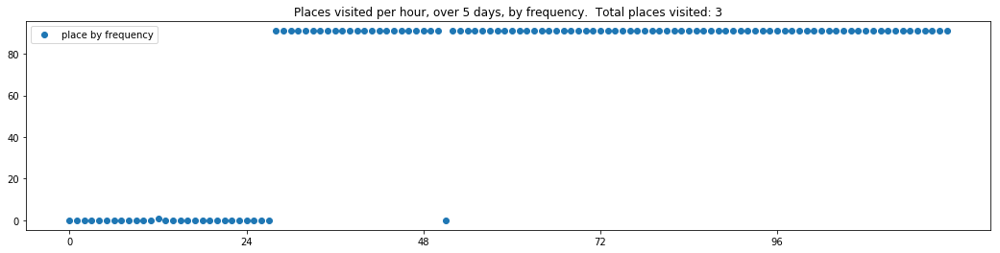

----- vector ----
prefix labels:  [486, 486]
[486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486]
[486, 0, 0, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486]
[486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486]
[486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486]
[486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486]


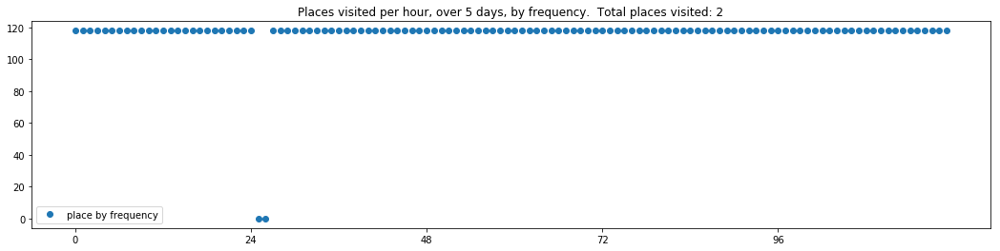

----- vector ----
prefix labels:  [104, 104]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 104, 104, 104, 104, 104]
[104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104]
[104, 0, 0, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104]
[104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104]
[104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104]


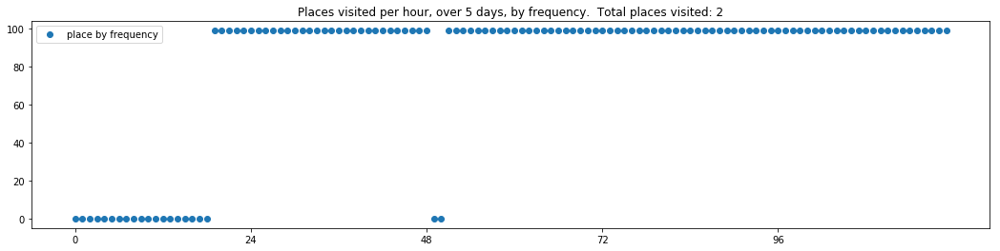

----- vector ----
prefix labels:  [22, 22]
[0, 0, 0, 0, 0, 0, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22]
[77, 77, 0, 22, 22, 22, 22, 22, 22, 22, 22, 0, 0, 0, 0, 77, 77, 77, 77, 77, 77, 77, 77, 77]
[77, 77, 77, 77, 77, 77, 77, 77, 270, 270, 270, 270, 270, 270, 270, 270, 270, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 65, 65, 65, 65, 65, 68, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


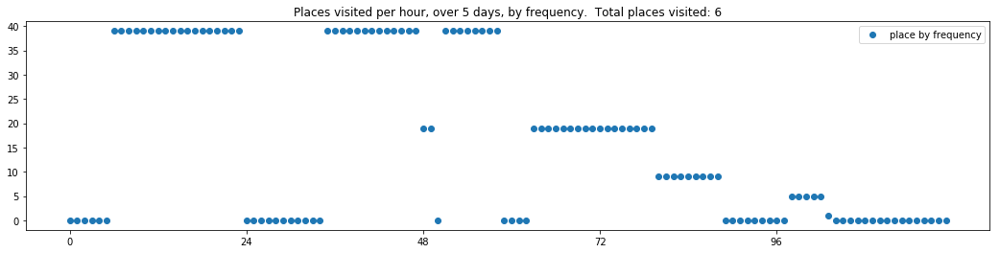


------
 110 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_110.txt 
------

----- vector ----
prefix labels:  [435, 353]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 142, 213, 213, 213, 213, 213]
[213, 0, 0, 0, 0, 0, 0, 0, 0, 435, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 478, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 339, 0, 0, 0, 0, 0, 0, 0]


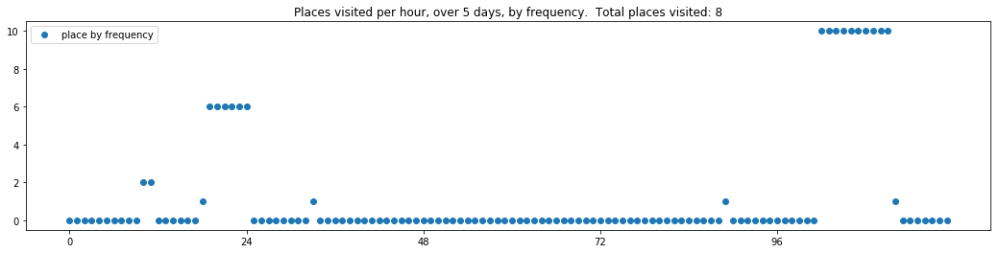

----- vector ----
prefix labels:  [26, 26]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 26, 0, 413, 0]
[0, 0, 0, 0, 0, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 0, 0, 26, 26, 26, 26, 26]
[26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26]
[26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26]


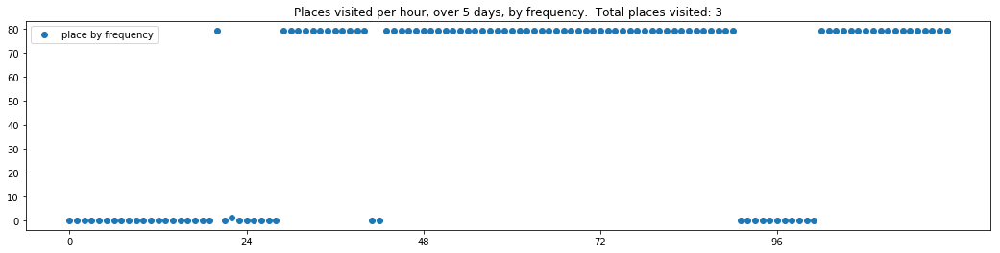

----- vector ----
prefix labels:  [146, 146]
[0, 0, 0, 0, 0, 0, 200, 0, 0, 0, 0, 0, 0, 0, 146, 146, 146, 146, 146, 146, 146, 146, 146, 146]
[146, 146, 222, 146, 146, 146, 146, 146, 146, 146, 146, 146, 0, 0, 0, 222, 222, 146, 146, 559, 559, 0, 0, 0]
[374, 146, 146, 146, 146, 146, 146, 559, 559, 559, 559, 146, 146, 559, 559, 559, 0, 0, 0, 0, 0, 0, 559, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 559, 0, 0, 146, 146, 0, 146, 146, 146, 146]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 146, 0, 0, 0, 0, 0, 0, 146, 0, 0, 0, 0]


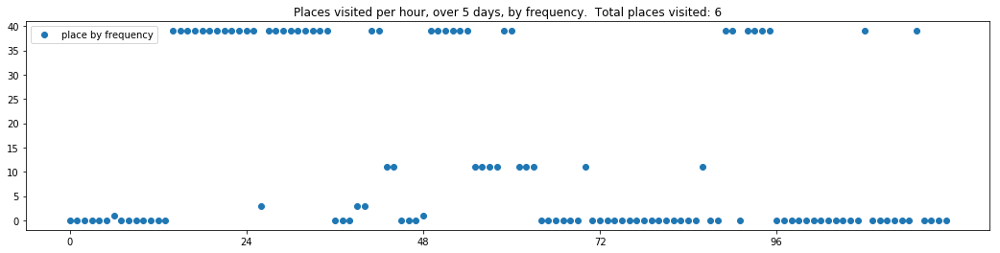

----- vector ----
prefix labels:  [16, 266]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 16, 16, 101]
[0, 0, 0, 0, 0, 411, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 479, 479]
[479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479]
[479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479]
[479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479]


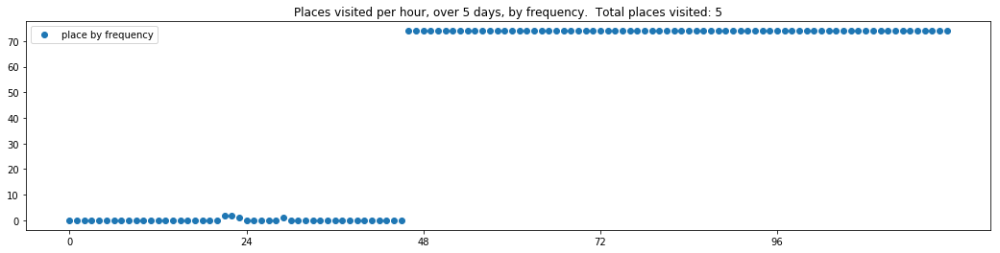

----- vector ----
prefix labels:  [162, 162]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 448, 448, 448, 448, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 245, 0, 0, 0, 0, 0, 0, 0, 162, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


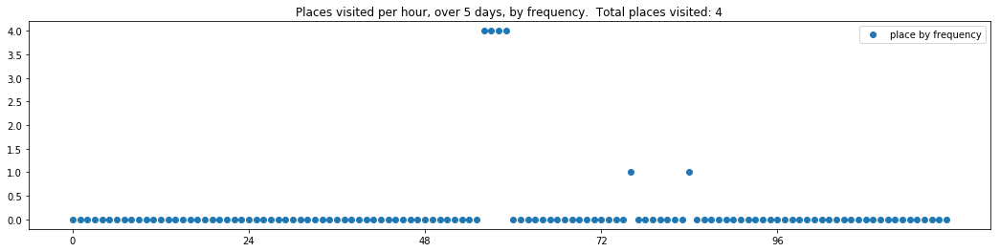

----- vector ----
prefix labels:  [391, 391]
[391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391]
[391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391]
[391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391]
[391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391]
[391, 391, 391, 391, 391, 391, 195, 195, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391]


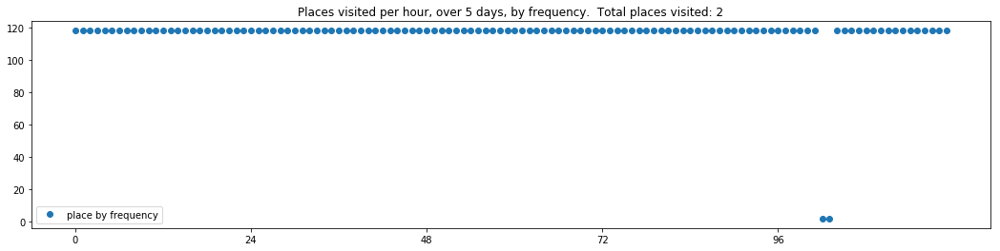

----- vector ----
prefix labels:  [4, 4]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 4, 0, 4]
[4, 4, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


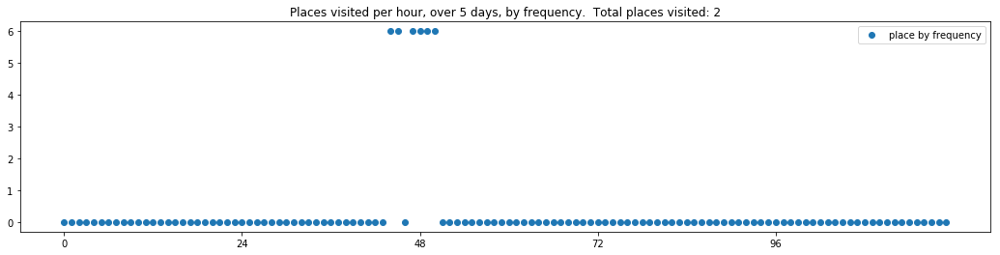

----- vector ----
prefix labels:  [5, 5]
[0, 0, 0, 0, 0, 209, 209, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
[5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
[5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
[5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


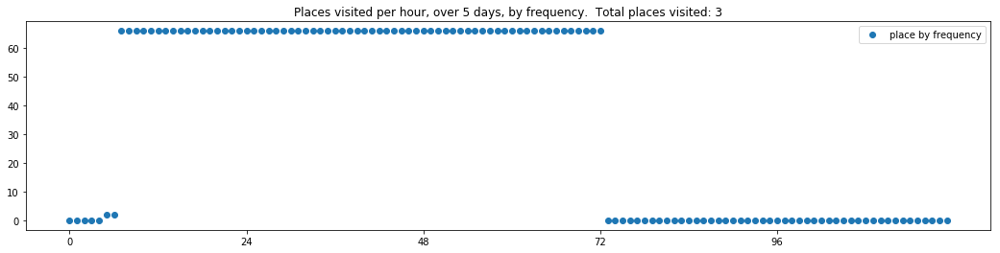

----- vector ----
prefix labels:  [223, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 20, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 68, 0, 0, 0, 216, 216, 216, 216]
[216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216]


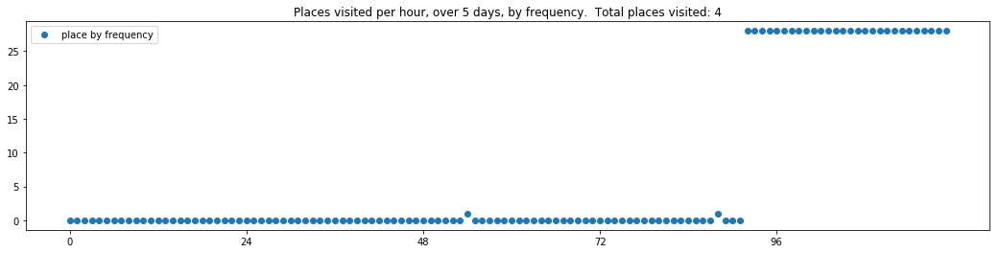

----- vector ----
prefix labels:  [401, 401]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401]
[401, 401, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 0, 0, 0, 0]


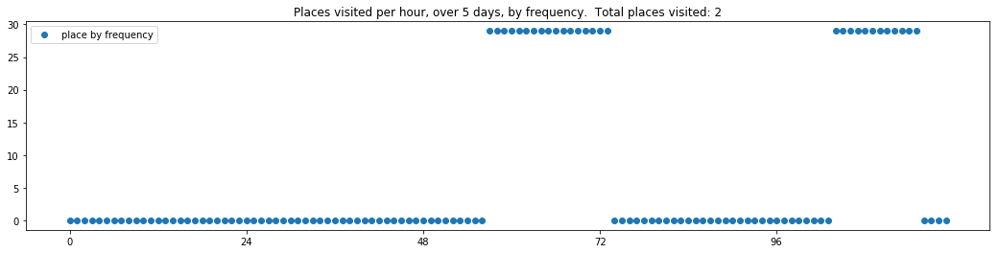


------
 115 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_115.txt 
------

----- vector ----
prefix labels:  [0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


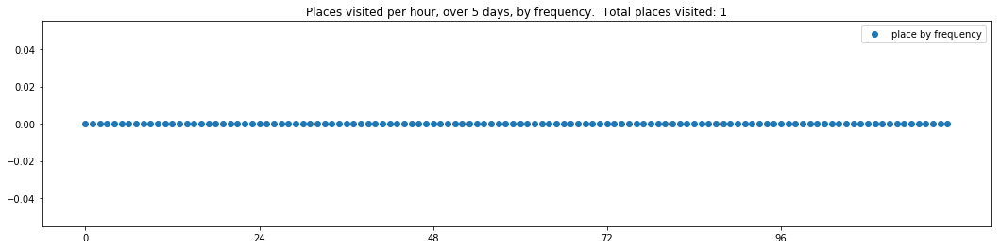

----- vector ----
prefix labels:  [437, 437]
[0, 0, 0, 0, 0, 437, 0, 0, 0, 0, 0, 437, 437, 437, 437, 0, 0, 0, 0, 437, 437, 437, 437, 437]
[437, 437, 437, 437, 437, 437, 437, 437, 437, 437, 437, 437, 437, 437, 0, 0, 0, 0, 437, 437, 437, 437, 437, 437]
[437, 437, 437, 437, 437, 437, 437, 437, 437, 437, 437, 437, 437, 437, 437, 437, 437, 0, 437, 437, 437, 437, 437, 437]
[437, 437, 437, 437, 437, 437, 437, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 437, 437, 437, 437, 437, 437]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 437, 437, 437, 437, 437]


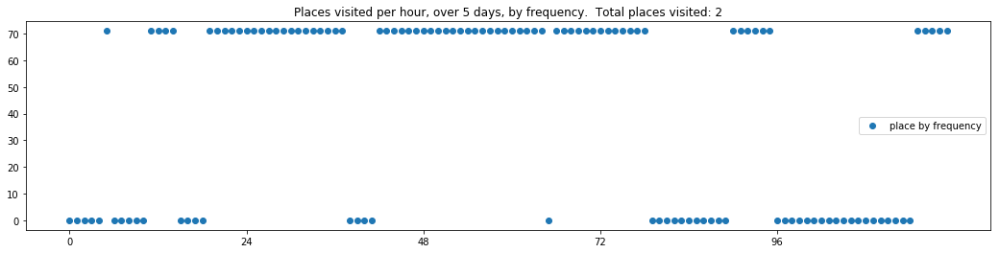

----- vector ----
prefix labels:  [3, 507]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 341, 341, 341, 341, 341, 341, 341, 341, 0, 341, 341, 341, 0, 0, 0, 0, 453]
[453, 0, 0, 0, 0, 0, 0, 0, 453, 453, 453, 453, 453, 341, 341, 341, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 341, 0, 0, 0, 0, 0, 0, 0, 341, 341, 0, 0, 0, 0, 0]
[586, 586, 586, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 87, 87, 87, 87, 87, 87, 87, 87, 0, 0, 0]


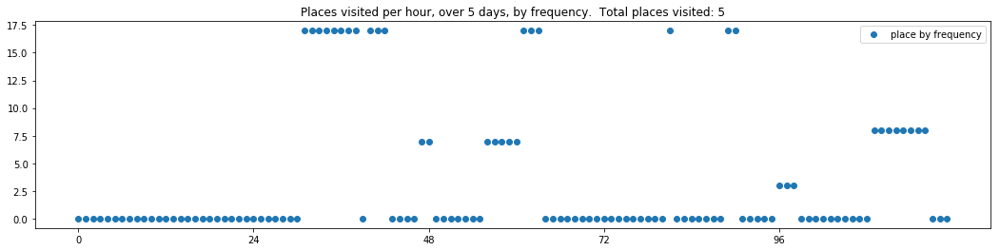

----- vector ----
prefix labels:  [111, 21]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


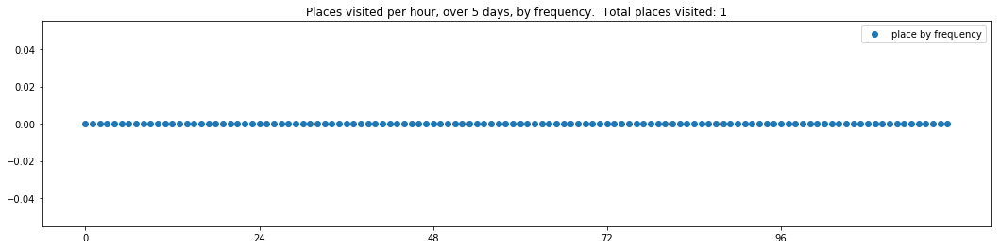

----- vector ----
prefix labels:  [477, 477]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 629, 629, 629, 629, 629, 629]
[629, 629, 629, 629, 629, 629, 629, 629, 629, 629, 629, 629, 629, 629, 629, 629, 629, 629, 629, 629, 629, 629, 629, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 629, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 629, 629, 629, 629, 629, 629, 629, 629, 629, 629, 629, 629, 629, 629]


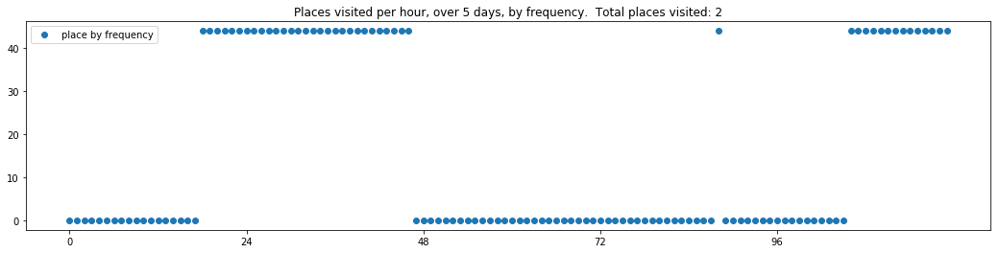

----- vector ----
prefix labels:  [187, 76]
[0, 0, 0, 0, 0, 0, 0, 76, 76, 76, 76, 76, 76, 76, 21, 0, 187, 187, 187, 187, 187, 187, 187, 187]
[187, 187, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 187, 187, 187, 187, 76, 76, 76, 76, 76, 76, 76, 76]
[76, 0, 0, 0, 187, 0, 0, 0, 0, 0, 0, 0, 0, 187, 187, 187, 76, 76, 76, 76, 76, 76, 76, 76]
[76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 640, 640]
[640, 640, 640, 640, 640, 640, 640, 640, 640, 640, 640, 640, 640, 640, 640, 640, 640, 640, 640, 640, 640, 640, 640, 640]


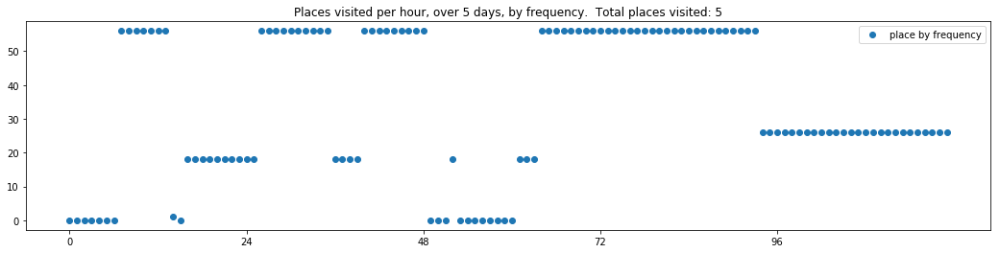

----- vector ----
prefix labels:  [179, 179]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 179, 179, 179, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


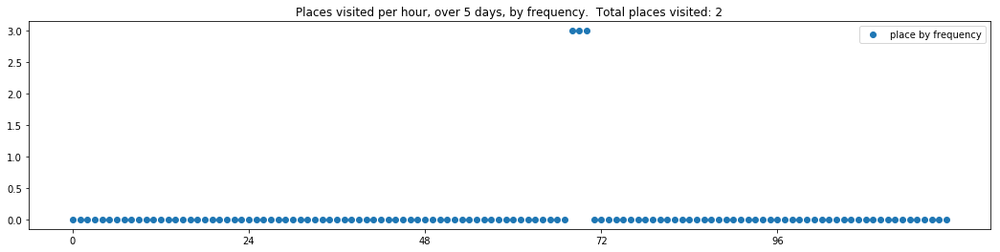

----- vector ----
prefix labels:  [84, 84]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 291, 225, 225, 225, 0, 84, 84]
[0, 0, 0, 0, 0, 0, 0, 0, 416, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 384, 384, 384, 384, 384]
[384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 0, 119, 119]
[119, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 202, 20, 0, 0, 0]


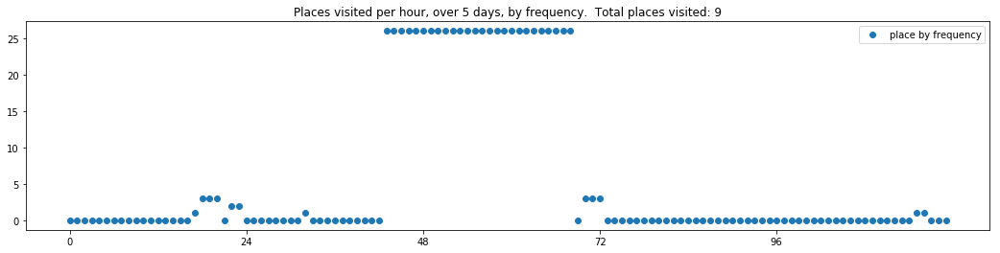

----- vector ----
prefix labels:  [435, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 147, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 204, 204, 204, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 478, 550, 401]


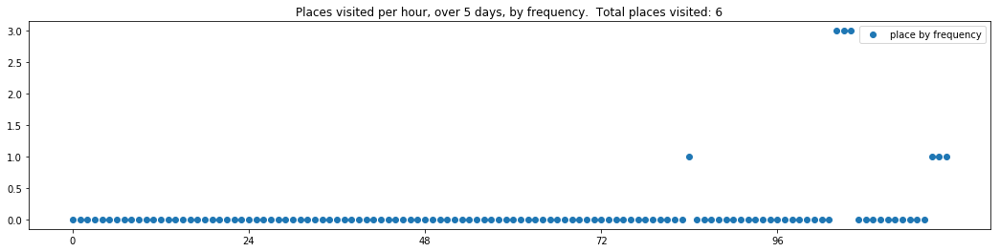

----- vector ----
prefix labels:  [267, 267]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 267, 267, 267, 267, 267, 267, 267]
[267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 20, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 267, 267, 267, 267, 267]
[267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267]


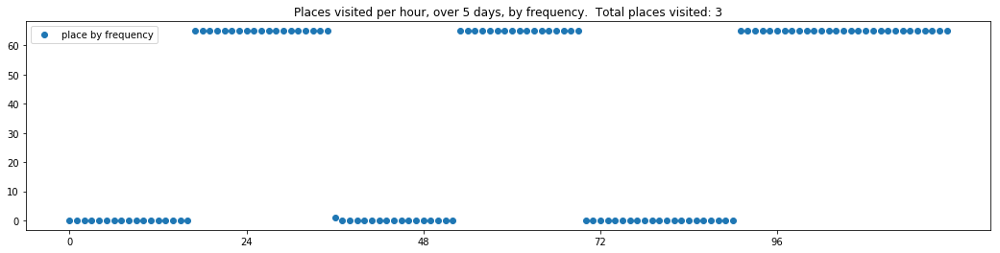


------
 120 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_120.txt 
------

----- vector ----
prefix labels:  [21, 21]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 21, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 560, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


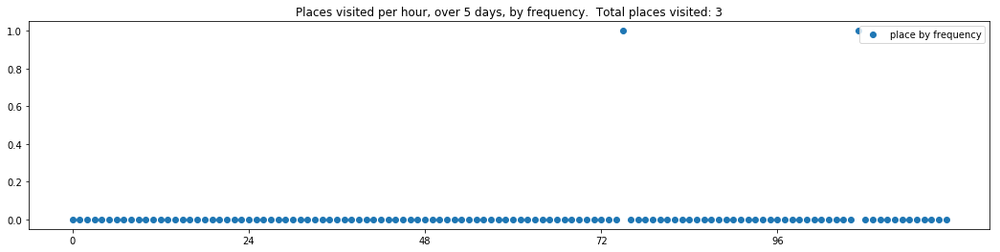

----- vector ----
prefix labels:  [226, 226]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226]
[226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 226, 226, 226, 0, 0, 0, 0, 0, 0, 226]
[226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 181, 226, 0, 0, 0, 0, 226]
[226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226]


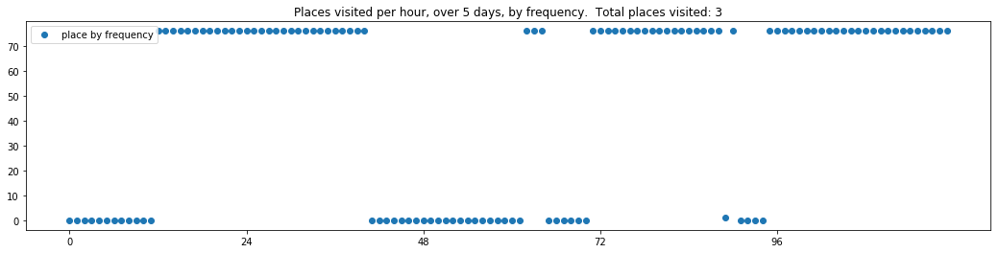

----- vector ----
prefix labels:  [222, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


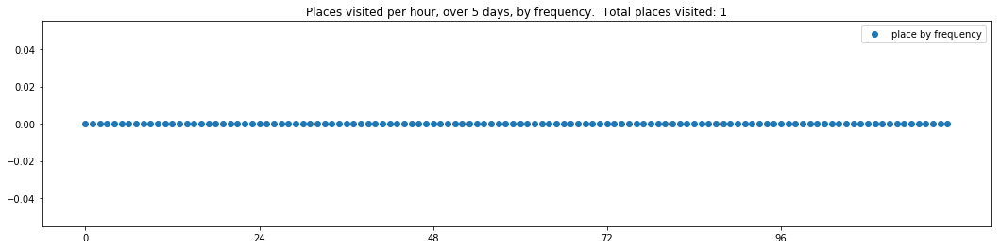

----- vector ----
prefix labels:  [635, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 95]
[95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95]
[95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 0, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22]


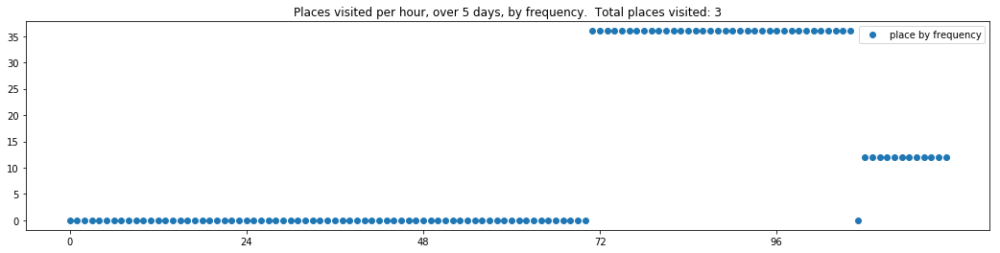

----- vector ----
prefix labels:  [40, 40]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40]
[40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40]
[40, 40, 40, 40, 40, 40, 0, 0, 0, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40]
[40, 40, 40, 40, 40, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 40, 40, 40, 40, 40, 40, 40]


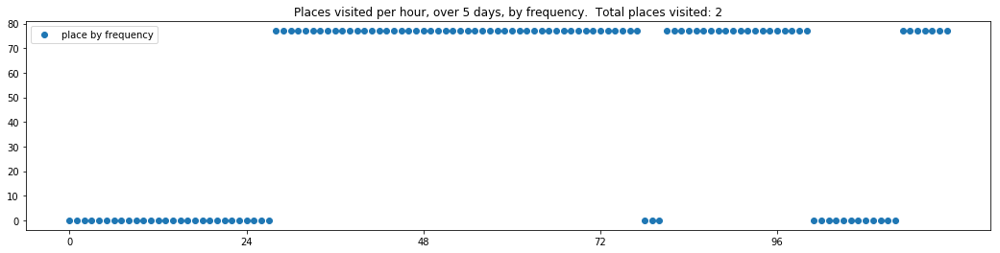

----- vector ----
prefix labels:  [47, 44]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 44, 44, 44, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 44, 44, 0, 0, 0, 0, 0, 0, 44, 0, 0, 0, 44, 0, 0, 0, 0, 0, 0]


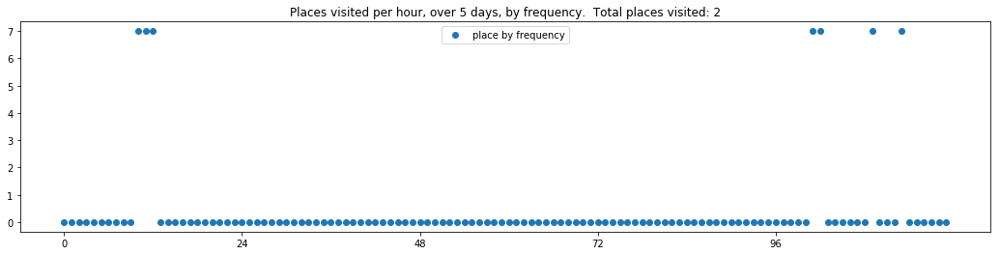

----- vector ----
prefix labels:  [133, 133]
[0, 0, 0, 0, 0, 0, 0, 133, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 94, 94, 94]
[94, 94, 94, 0, 0, 0, 0, 97, 97, 603, 603, 603, 603, 603, 603, 603, 146, 76, 76, 76, 519, 519, 519, 519]
[519, 519, 519, 519, 519, 519, 519, 519, 519, 519, 519, 519, 519, 519, 519, 519, 519, 519, 519, 519, 519, 519, 519, 0]


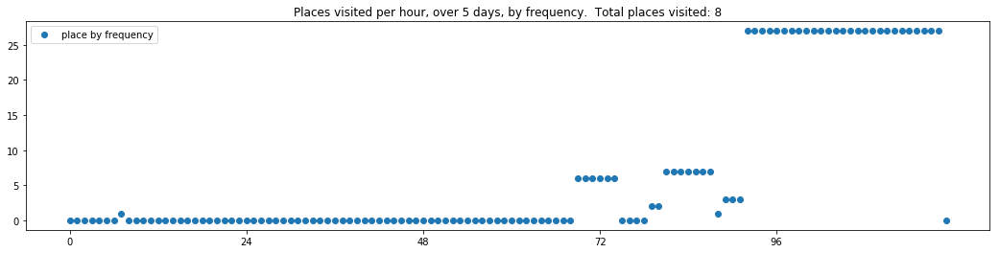

----- vector ----
prefix labels:  [0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 20, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


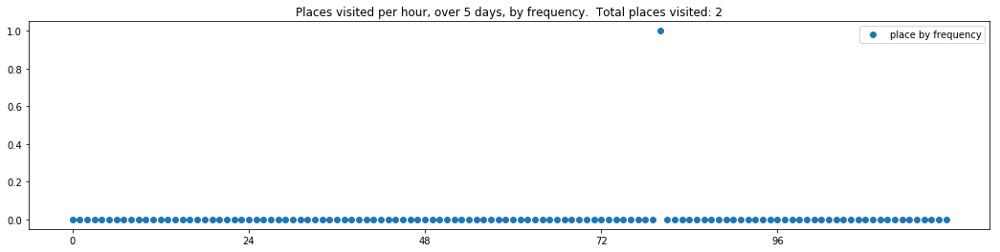

----- vector ----
prefix labels:  [26, 97]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 392, 392, 392, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 181, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 181, 192, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


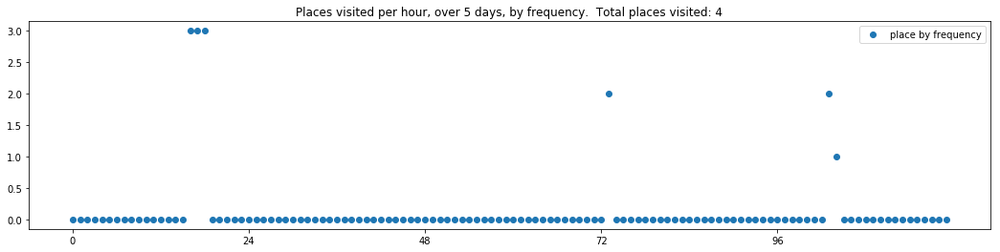

----- vector ----
prefix labels:  [199, 199]
[0, 0, 0, 0, 0, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199]
[199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 0, 199]
[199, 199, 199, 199, 199, 0, 0, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199]
[199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199]
[199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199]


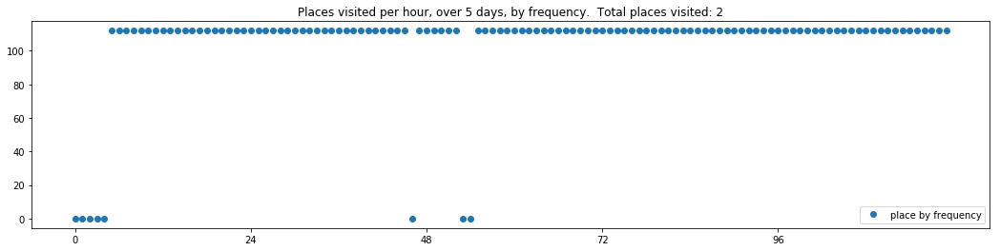


------
 125 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_125.txt 
------

----- vector ----
prefix labels:  [469, 71]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 275, 275, 275, 275, 275, 275, 275, 275, 275, 275, 275, 275]
[275, 275, 275, 275, 112, 0, 187, 0, 0, 0, 187, 469, 469, 469, 469, 469, 203, 469, 469, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 214, 0, 0, 0, 0, 0, 0, 469, 469, 469, 469, 0, 469, 469, 469, 469, 469]
[469, 469, 469, 469, 469, 469, 469, 469, 469, 469, 469, 469, 469, 469, 469, 469, 469, 469, 469, 469, 469, 213, 213, 213]
[213, 213, 213, 213, 213, 213, 213, 213, 213, 213, 213, 213, 213, 213, 213, 213, 213, 213, 213, 213, 213, 213, 213, 550]


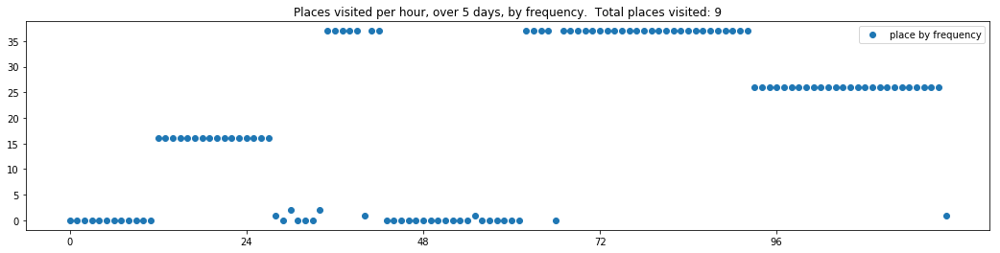

----- vector ----
prefix labels:  [2, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 151, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


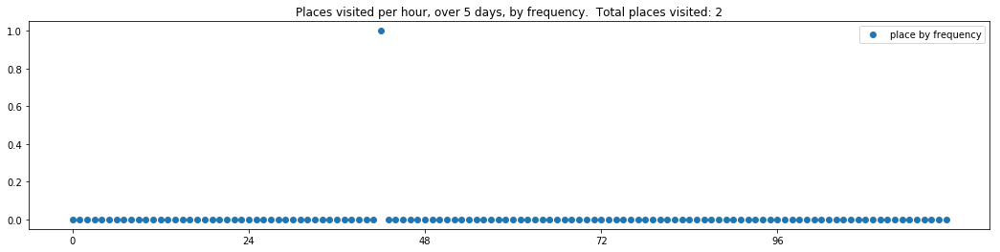

----- vector ----
prefix labels:  [248, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 26, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


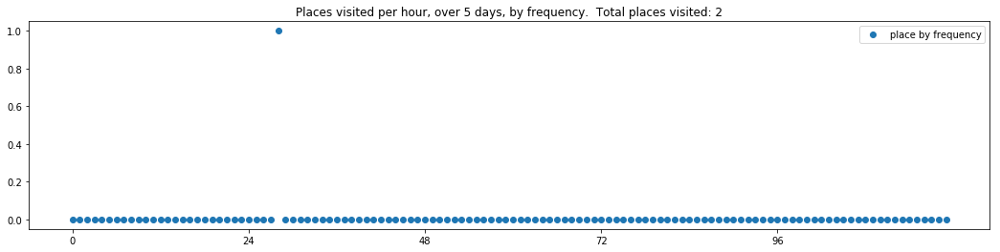

----- vector ----
prefix labels:  [289, 4]
[0, 0, 0, 0, 88, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 88, 289, 289, 289]
[289, 289, 289, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 289, 289, 289, 289, 289, 289, 289]


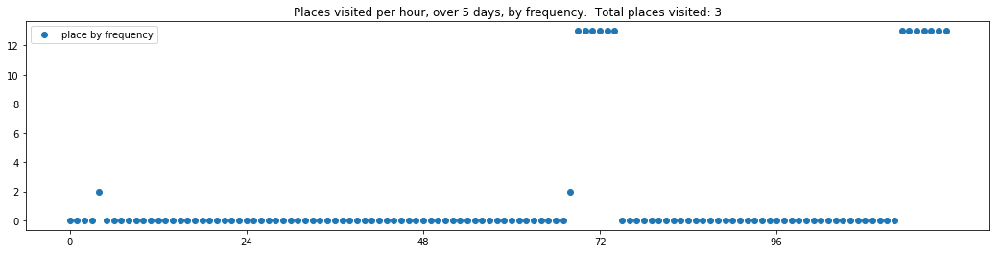

----- vector ----
prefix labels:  [115, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


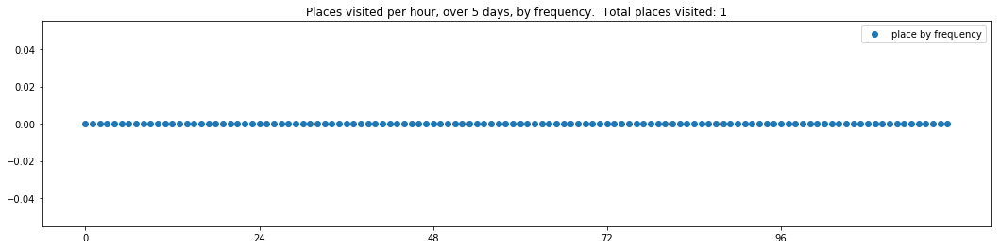

----- vector ----
prefix labels:  [586, 586]
[0, 0, 0, 0, 0, 0, 0, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586]
[586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586]
[586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586]
[586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586]
[586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 0, 586, 586, 586, 586, 586, 586]


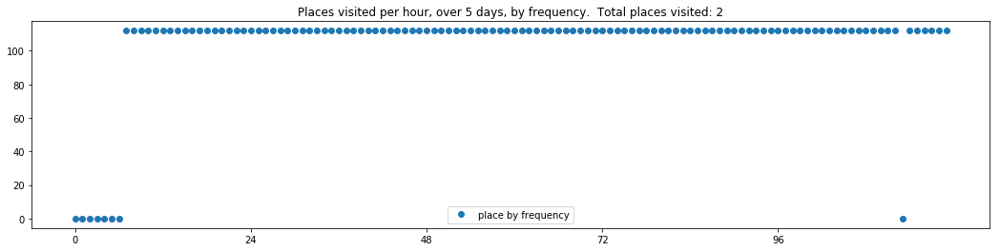

----- vector ----
prefix labels:  [263, 263]
[263, 263, 263, 263, 263, 263, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263]
[263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263]
[263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263]
[263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263]


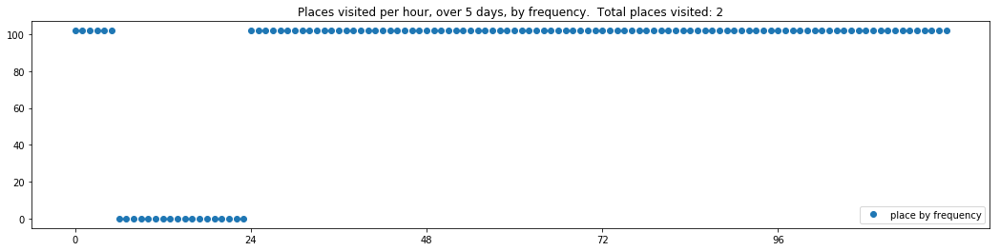

----- vector ----
prefix labels:  [90, 189]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 197, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 90]


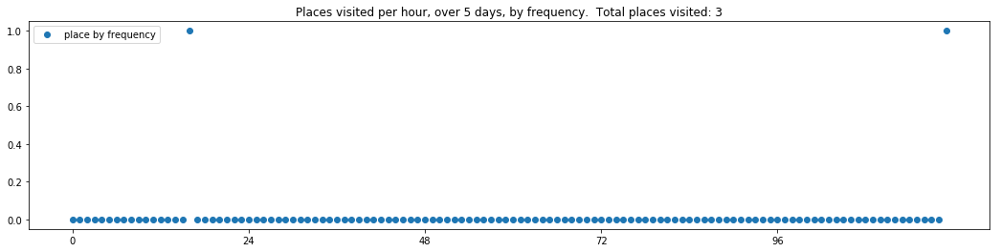

----- vector ----
prefix labels:  [293, 293]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


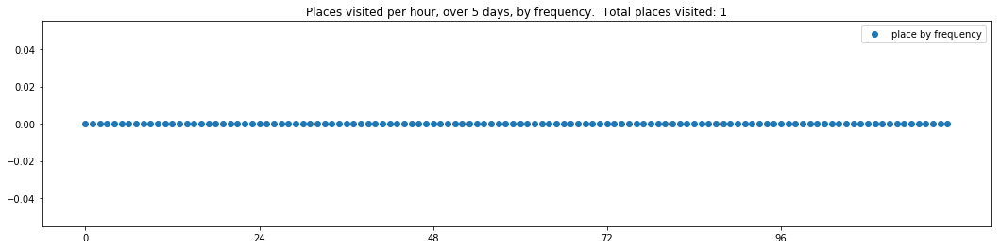

----- vector ----
prefix labels:  [143, 271]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271]
[271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 0, 0, 0, 271, 271, 271, 271, 271, 271, 271, 271, 271]
[271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 0, 271, 271, 271, 271, 271, 271, 33]
[271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 271, 271, 271, 271, 0, 0, 454, 0, 0]


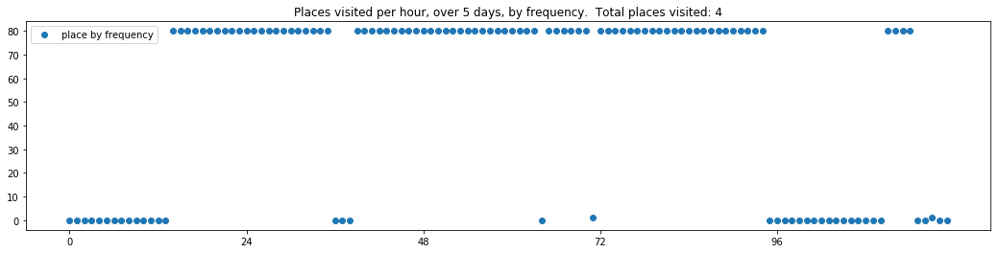


------
 130 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_130.txt 
------

----- vector ----
prefix labels:  [368, 56]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 375, 0]
[0, 0, 0, 0, 0, 100, 199, 199, 199, 503, 503, 503, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56]
[56, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199]
[199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 21, 0, 0, 0, 0, 0, 0, 0, 0]


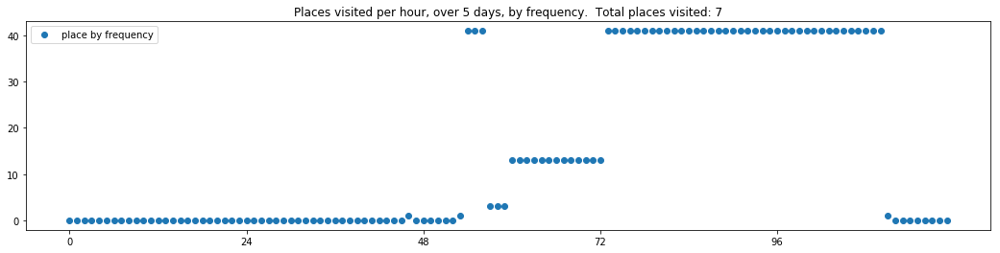

----- vector ----
prefix labels:  [542, 542]
[0, 0, 0, 0, 0, 0, 0, 542, 542, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271]
[271, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 542]


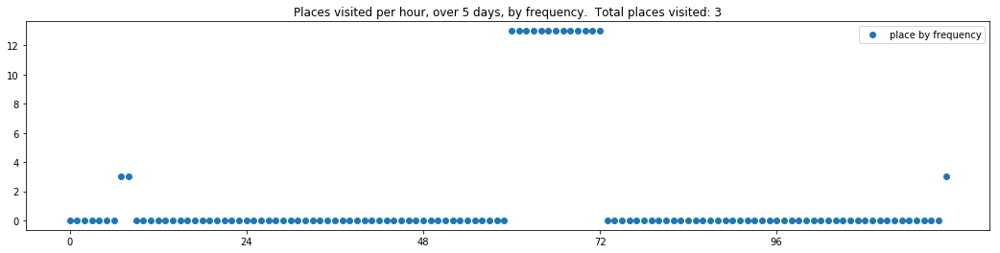

----- vector ----
prefix labels:  [586, 586]
[0, 0, 0, 0, 0, 0, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586]
[586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586]
[586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586]
[586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586]
[586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586]


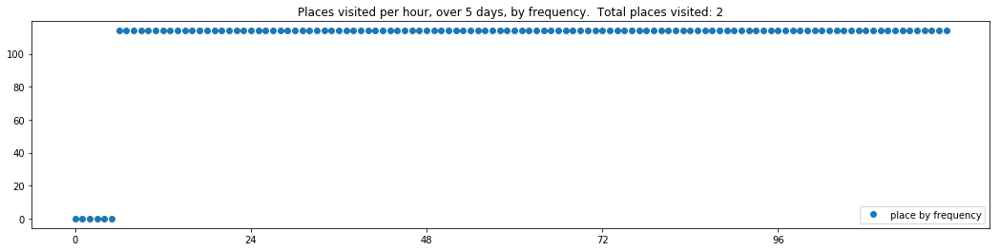

----- vector ----
prefix labels:  [595, 353]
[0, 0, 0, 0, 289, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


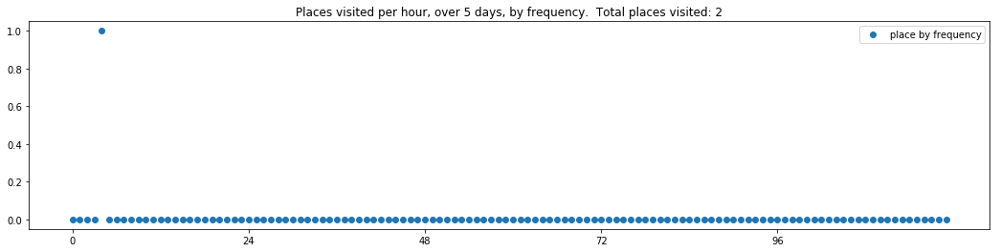

----- vector ----
prefix labels:  [99, 99]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 99, 99, 99, 99, 99, 99, 99, 99, 99]
[99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99]
[99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99]
[99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99]
[99, 99, 99, 99, 99, 99, 99, 99, 99, 551, 551, 551, 551, 551, 551, 0, 0, 0, 0, 438, 0, 0, 0, 0]


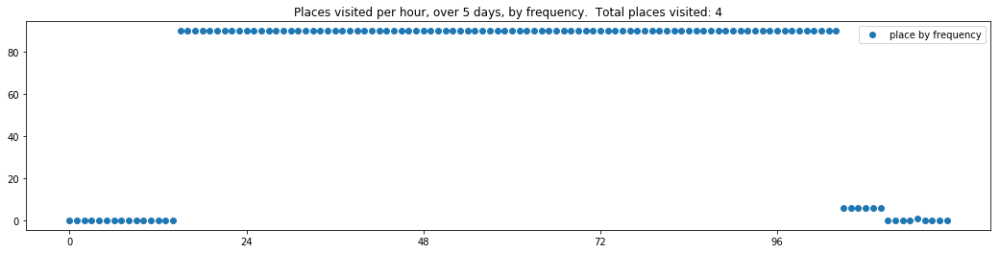

----- vector ----
prefix labels:  [21, 21]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 271, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 21, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 21, 0, 0, 0, 0, 0, 0, 0, 0, 21, 76, 76, 76, 0, 0]


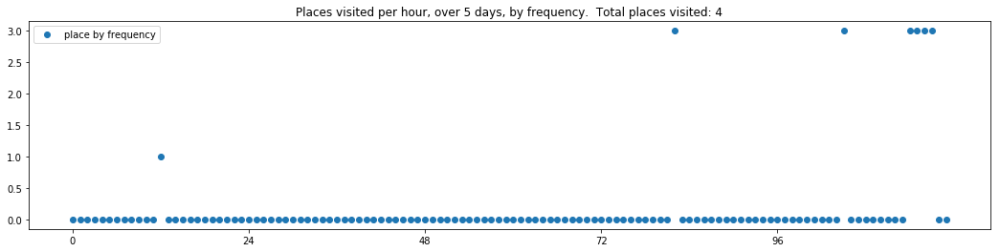

----- vector ----
prefix labels:  [29, 29]
[0, 0, 0, 0, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29]
[29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29]
[29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29]
[29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29]
[29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29]


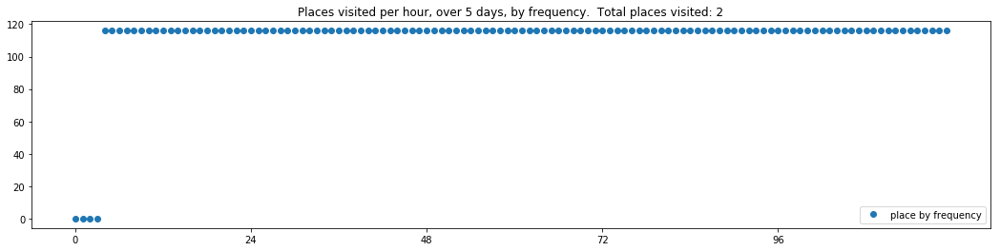

----- vector ----
prefix labels:  [271, 271]
[0, 0, 0, 0, 0, 0, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 0]
[0, 0, 271, 271, 271, 271, 271, 271, 271, 271, 271, 0, 0, 0, 0, 0, 271, 271, 271, 271, 271, 271, 271, 271]
[271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 0, 0, 271, 271, 271, 271, 271, 271, 271, 271, 271]
[271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271]
[271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 0, 0, 0, 271, 271, 271, 271, 271, 271, 271, 271]


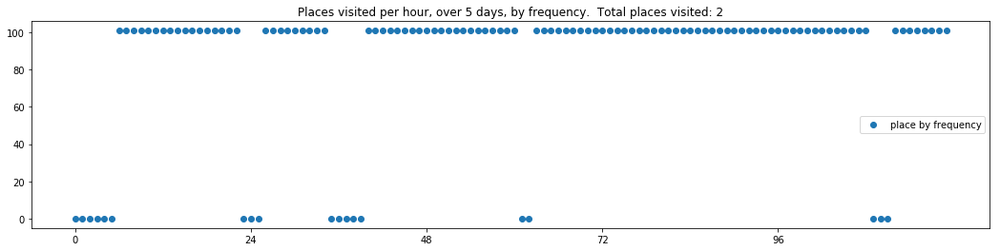

----- vector ----
prefix labels:  [247, 247]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 247, 45, 0, 0, 0, 0, 0, 0, 0, 0, 0, 47, 48, 247, 247, 247, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 247, 0, 0, 0, 0, 0, 0, 0, 0, 0, 247, 247]
[0, 0, 0, 0, 0, 0, 0, 0, 247, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


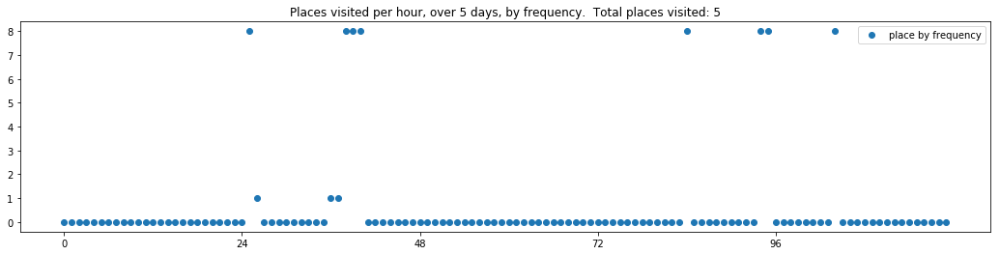

----- vector ----
prefix labels:  [281, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 214, 0, 140, 434, 434, 434, 434, 434, 0, 0, 140, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


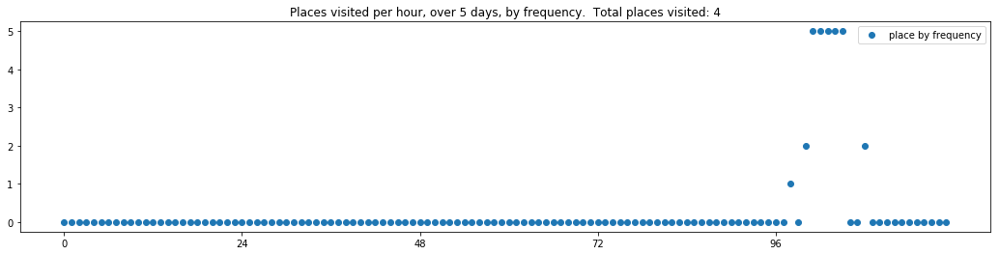

In [88]:
# Inspect the trajectories in these eval files

sample_size = 10

seqgan_generated = []

for eval_num in sorted(eval_filenames.keys()):
    filename = eval_filenames[eval_num]
    print('\n------\n',eval_num, filename, '\n------\n')
    seqgan_generated = read_trajectories_from_file(filename)
    for tv in seqgan_generated[:sample_size]:
        print_dwell_vector_by_days(tv)
        plot_trajectory_vector_frequencies(tv, by_frequency_order=False) 
        

Load and inspect trajectories generated by the textgenrnn model

In [12]:
sample_size = 50

showing sample of trajectories from output with temp 0.8
----- vector ----
prefix labels:  [392, 303]
[0, 0, 0, 0, 0, 0, 0, 0, 391, 0, 0, 0, 0, 0, 303, 303, 303, 303, 303, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 360, 0, 0, 0, 0, 0, 0, 0, 303, 303, 303, 303, 303, 303, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 303, 303, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


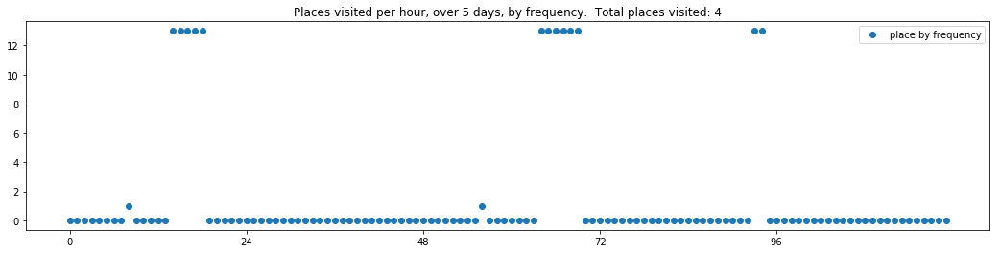

----- vector ----
prefix labels:  [375, 375]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375]
[375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375]
[375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375]
[375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375]
[375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375]


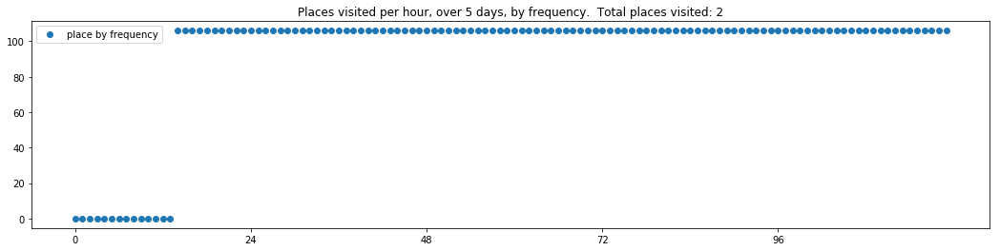

----- vector ----
prefix labels:  [69, 69]
[0, 0, 0, 0, 0, 0, 0, 0, 198, 198, 198, 198, 69, 0, 198, 198, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 69, 69, 69, 69, 69, 69, 69, 69, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 69, 69, 69, 69, 69, 69, 69, 69, 0, 0, 0, 0, 0, 0, 0, 0, 0]


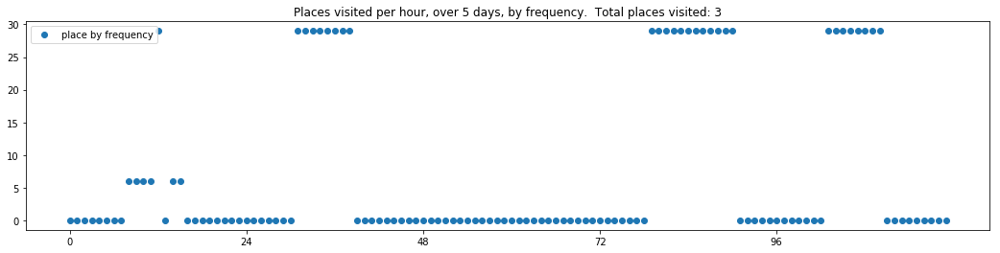

----- vector ----
prefix labels:  [191, 191]
[0, 0, 0, 0, 0, 0, 0, 191, 191, 191, 191, 191, 191, 191, 191, 191, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 191, 191, 191, 191, 191, 191, 191, 191, 191, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 191, 191, 191, 191, 191, 191, 191, 191, 191, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 191, 191, 191, 191, 191, 191, 191, 191, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 191, 191, 191, 191, 191, 191, 191, 191, 191, 191, 191, 191, 191, 191, 191, 191, 191]


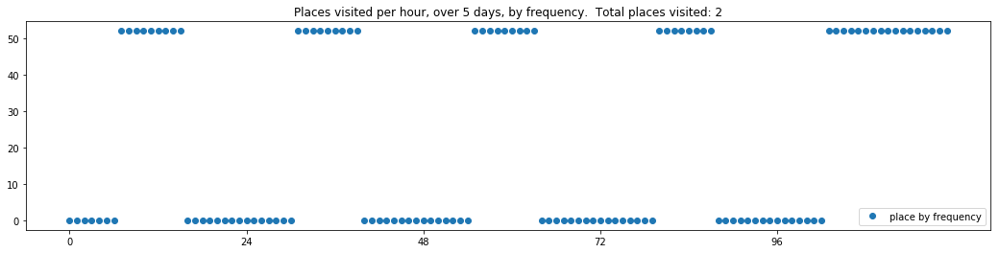

----- vector ----
prefix labels:  [181, 181]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 181, 181, 181, 181, 181, 181, 181, 181, 181, 181, 181, 181, 181, 181, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 181, 181, 181, 181, 0, 0, 181, 181, 181, 181, 181, 181, 181, 181]
[181, 181, 181, 181, 181, 181, 181, 181, 181, 181, 181, 181, 181, 181, 181, 181, 181, 181, 181, 181, 181, 181, 181, 181]


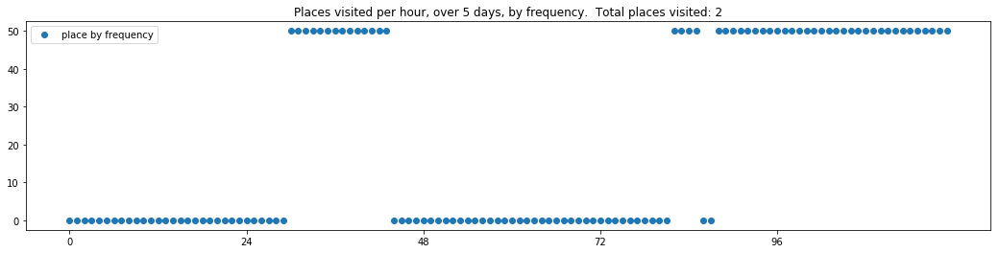

----- vector ----
prefix labels:  [321, 295]
[0, 0, 0, 0, 0, 0, 0, 0, 295, 295, 295, 295, 295, 295, 295, 295, 295, 295, 321, 321, 321, 321, 321, 321]
[321, 321, 321, 321, 321, 321, 321, 321, 295, 295, 295, 621, 295, 295, 295, 295, 295, 321, 321, 321, 321, 321, 321, 321]
[321, 321, 321, 321, 321, 321, 321, 321, 295, 295, 295, 295, 295, 295, 295, 295, 295, 295, 295, 321, 321, 321, 321, 321]
[321, 321, 321, 321, 321, 321, 321, 321, 295, 295, 295, 295, 295, 295, 295, 295, 295, 321, 321, 321, 321, 321, 321, 321]
[321, 321, 321, 321, 321, 321, 321, 321, 295, 295, 295, 295, 295, 295, 295, 295, 295, 295, 295, 321, 321, 321, 321, 321]


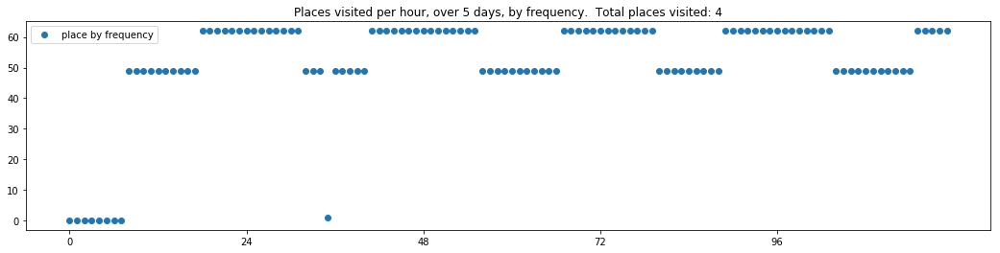

----- vector ----
prefix labels:  [645, 485]
[0, 0, 0, 0, 0, 0, 0, 0, 485, 485, 485, 485, 485, 485, 485, 485, 485, 485, 261, 261, 645, 645, 645, 645]
[645, 645, 645, 645, 645, 645, 645, 645, 485, 485, 485, 485, 485, 485, 485, 485, 485, 485, 645, 645, 645, 645, 645, 645]
[645, 645, 645, 645, 645, 645, 645, 645, 485, 485, 485, 485, 485, 485, 485, 485, 485, 485, 645, 261, 261, 645, 645, 645]
[645, 645, 645, 645, 645, 645, 645, 645, 485, 485, 485, 485, 485, 485, 485, 485, 485, 485, 485, 485, 485, 0, 645, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


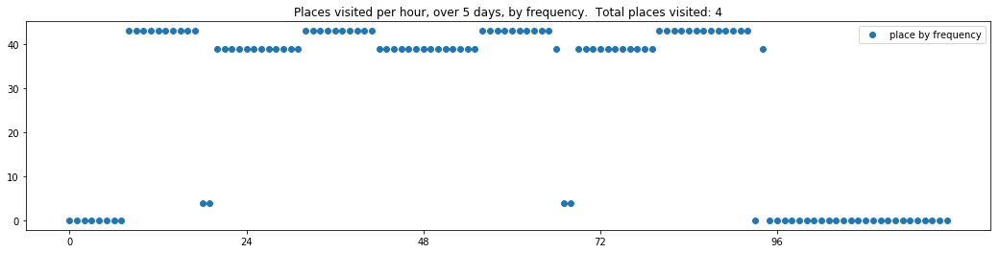

----- vector ----
prefix labels:  [386, 386]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 386, 386, 386, 386, 386, 386, 386, 386, 386, 22, 22, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 386, 386, 386, 386, 386, 386, 386, 386, 386, 20, 20, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


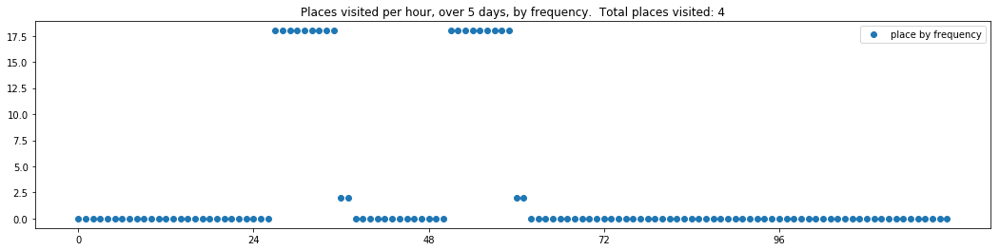

----- vector ----
prefix labels:  [86, 86]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86]
[86, 86, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86]
[86, 86, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


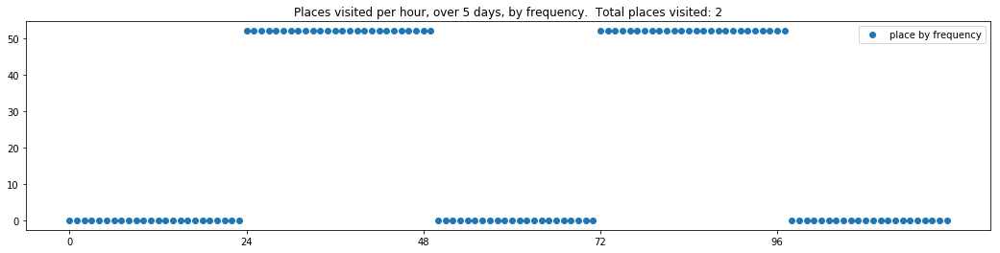

----- vector ----
prefix labels:  [65, 65]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 65, 65, 65, 65, 65, 65, 65, 0, 0, 0, 0]
[0, 0, 0, 0, 21, 21, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 0, 0, 0, 0, 0, 0]
[21, 21, 21, 21, 21, 21, 21, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 162, 162, 0, 0, 0, 0]


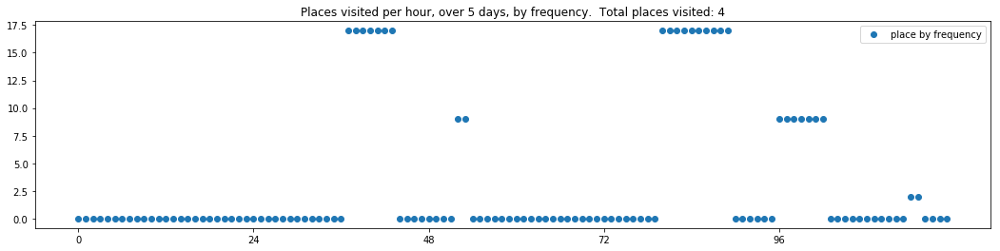

----- vector ----
prefix labels:  [6, 6]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6, 6, 6, 6, 6, 6, 6, 6]
[6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 0, 0, 0, 0, 0, 6, 6, 6, 6, 6, 6, 6, 6]
[6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 0, 6, 6, 0, 0, 0, 6, 6, 6, 6, 6, 6, 6]
[6, 6, 6, 6, 0, 0, 0, 0, 6, 0, 0, 0, 0, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 0, 0]


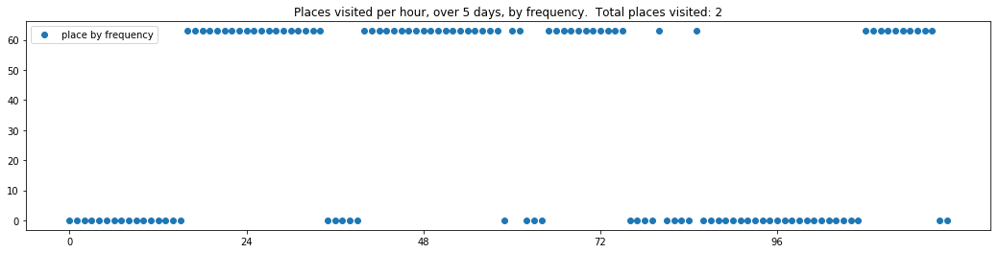

----- vector ----
prefix labels:  [306, 306]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


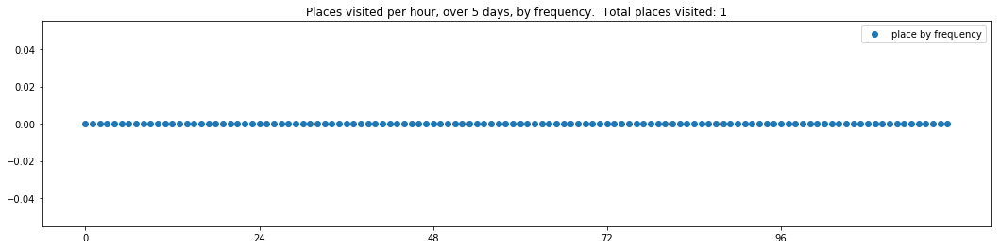

----- vector ----
prefix labels:  [185, 185]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 185, 185, 185, 185, 185, 185, 185, 185, 185, 185, 181, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 185, 185, 185, 185, 185, 185, 185, 185, 185, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 185, 185, 185, 185, 185, 185, 185, 185, 185, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 185, 185, 185, 185, 185, 185, 185, 185, 185, 0, 0, 0, 0, 0, 0]


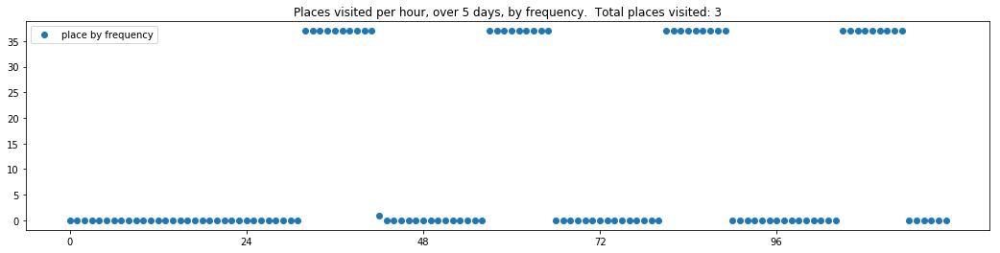

----- vector ----
prefix labels:  [269, 269]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 21, 0, 0, 0, 0, 0, 0, 0, 625, 0, 0, 269, 269, 269]
[269, 269, 269, 269, 269, 269, 269, 269, 269, 269, 269, 269, 0, 0, 8, 0, 0, 0, 0, 8, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 625, 625, 0, 8, 8, 8, 8, 8, 0, 8, 8, 0, 0, 269]
[269, 269, 0, 0, 0, 0, 0, 0, 0, 0, 269, 0, 0, 0, 0, 0, 0, 0, 0, 0, 269, 269, 269, 269]
[269, 269, 269, 269, 269, 269, 269, 269, 0, 0, 269, 269, 0, 0, 0, 0, 0, 0, 0, 8, 0, 0, 0, 0]


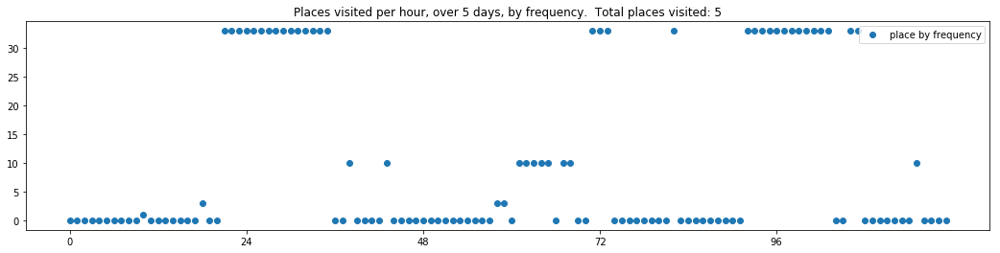

----- vector ----
prefix labels:  [378, 378]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


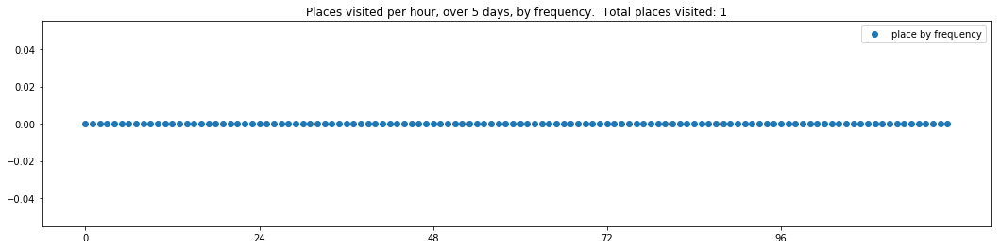

----- vector ----
prefix labels:  [578, 578]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 578, 578]
[578, 578, 578, 578, 578, 578, 578, 578, 578, 578, 578, 578, 578, 578, 578, 578, 578, 578, 578, 578, 578, 578, 578, 578]
[578, 578, 578, 578, 578, 578, 578, 578, 578, 578, 578, 578, 578, 578, 578, 578, 578, 578, 167, 0, 578, 578, 578, 578]
[578, 578, 578, 578, 578, 578, 578, 578, 391, 391, 391, 0, 578, 578, 578, 578, 578, 391, 391, 578, 578, 578, 578, 578]


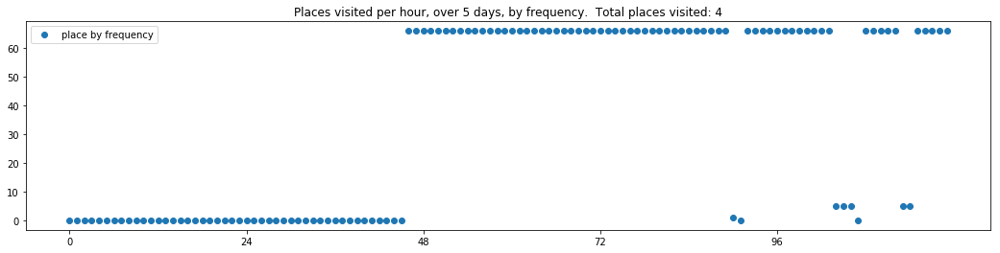

----- vector ----
prefix labels:  [237, 79]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 79, 79, 79, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 79, 79, 79, 79, 79, 79, 79, 79, 237, 237, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 79, 79, 79, 79, 79, 79, 79, 79, 79, 79, 89, 89]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 79, 79, 79, 79, 79, 79, 79, 79, 358, 89, 89]
[89, 89, 89, 89, 89, 89, 89, 89, 89, 89, 89, 89, 0, 79, 79, 79, 79, 79, 79, 79, 79, 0, 0, 0]


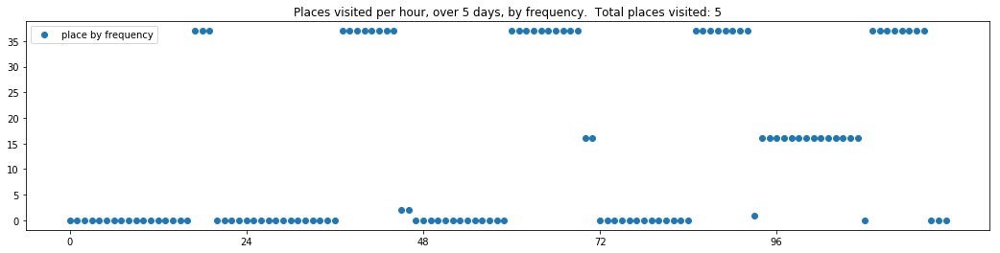

----- vector ----
prefix labels:  [390, 390]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 194, 0, 390, 390, 390, 390, 390]
[390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390]
[390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 0, 0, 0, 0, 0, 0, 0, 390, 390, 390, 390, 390]
[390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 0, 0, 0, 0, 271, 0, 0, 0, 0, 0, 0, 520]
[520, 520, 520, 520, 520, 520, 520, 520, 520, 520, 520, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 520]


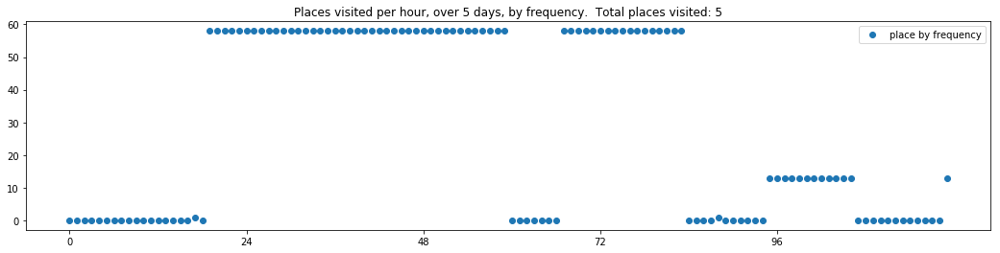

----- vector ----
prefix labels:  [101, 101]
[0, 0, 0, 0, 0, 0, 0, 101, 101, 101, 101, 179, 179, 179, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101]
[101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 0, 0, 101, 101, 101, 101, 101]
[101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 179, 101, 101, 101, 101, 101, 0, 0, 411, 0, 0, 0, 0]
[101, 101, 101, 101, 101, 101, 101, 101, 101, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


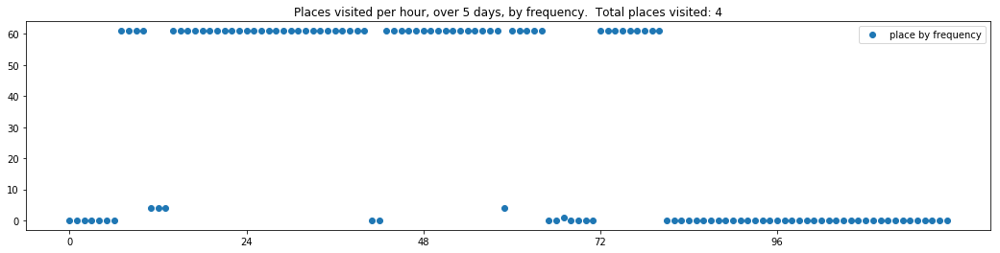

----- vector ----
prefix labels:  [47, 47]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 47, 47, 47, 47, 47, 47, 47, 47, 47]
[47, 47, 47, 47, 47, 47, 47, 47, 0, 0, 0, 0, 0, 0, 0, 0, 0, 47, 47, 47, 47, 47, 47, 47]
[47, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 47, 47, 47, 47, 47, 47, 47]
[47, 47, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 47, 47, 47, 47, 47, 47, 47]
[47, 47, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 47, 47, 47]


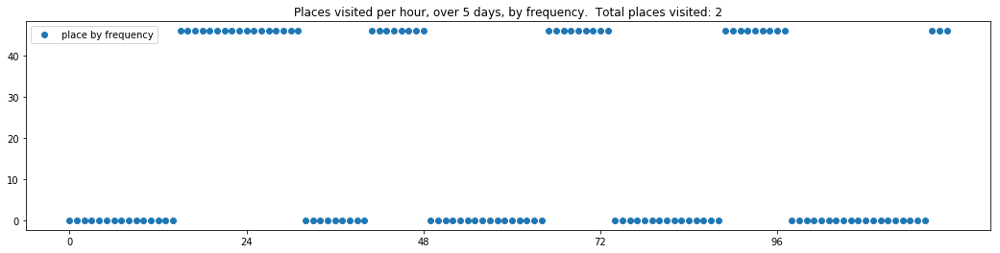

----- vector ----
prefix labels:  [31, 31]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20, 20, 20, 0]
[20, 20, 20, 20, 20, 20, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20, 20, 20, 20]
[20, 20, 20, 20, 20, 20, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20, 20, 20, 20]
[20, 20, 20, 20, 20, 20, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20, 20, 20, 20]


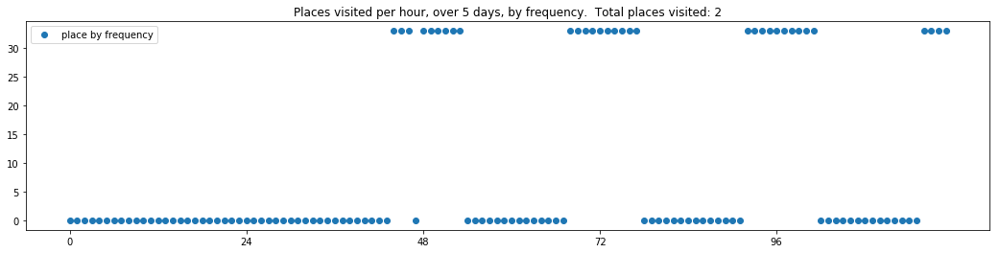

----- vector ----
prefix labels:  [507, 507]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 507, 507, 507, 507, 507, 507, 0, 0, 0, 0, 507, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 507, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 507, 507, 507, 507, 507, 507, 507, 507, 507, 507, 507, 507, 507, 507, 507, 507, 507]
[507, 507, 507, 507, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


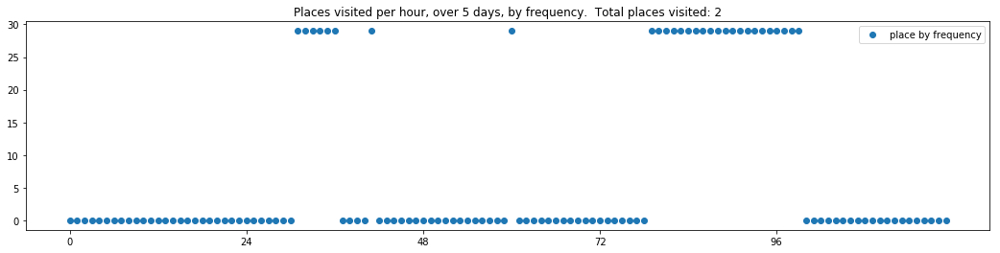

----- vector ----
prefix labels:  [618, 0]
[0, 0, 0, 0, 0, 0, 618, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 618, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


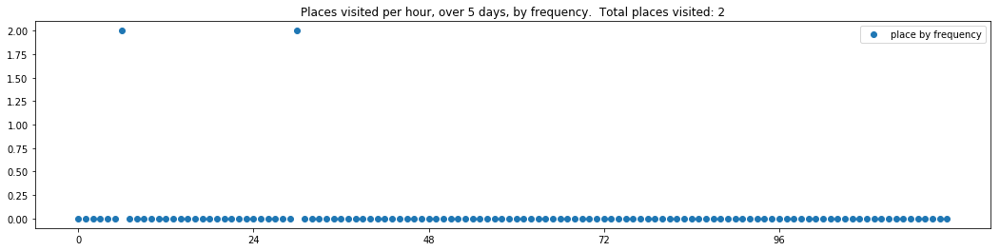

----- vector ----
prefix labels:  [595, 595]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 595, 595, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 595, 0, 595, 595, 595, 595, 595, 595, 595, 595, 595, 595, 595, 595, 595]
[595, 595, 595, 595, 595, 595, 595, 595, 595, 595, 595, 595, 595, 595, 595, 595, 595, 595, 595, 595, 595, 595, 595, 595]
[595, 595, 595, 595, 595, 595, 595, 595, 595, 595, 595, 595, 595, 595, 595, 595, 595, 595, 595, 595, 595, 595, 595, 595]


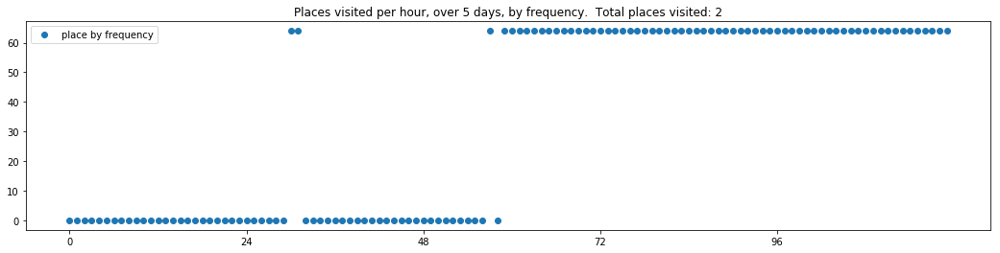

----- vector ----
prefix labels:  [557, 557]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 557, 557]
[557, 557, 557, 557, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 51, 51, 51, 51, 51, 51, 51, 51, 51, 51, 51, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 51, 51, 51, 51, 51, 51, 51, 51, 51, 51, 51, 51, 0, 0, 0, 0, 0, 0]


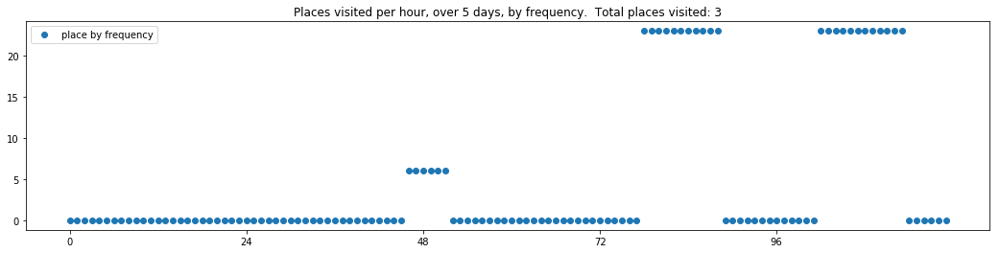

----- vector ----
prefix labels:  [120, 120]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


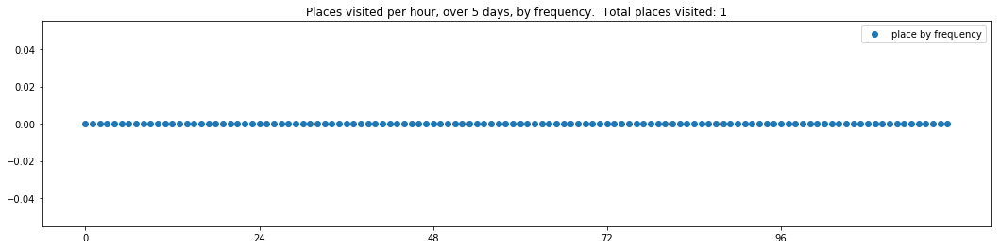

----- vector ----
prefix labels:  [599, 599]
[0, 0, 0, 0, 0, 0, 0, 599, 0, 0, 0, 0, 0, 0, 0, 0, 599, 599, 0, 0, 0, 0, 0, 599]
[599, 599, 599, 599, 599, 599, 599, 599, 599, 599, 599, 599, 599, 0, 0, 0, 0, 599, 0, 0, 0, 0, 599, 599]
[599, 599, 599, 599, 599, 599, 599, 599, 0, 0, 0, 0, 0, 0, 0, 599, 599, 599, 599, 599, 599, 599, 599, 599]
[599, 599, 599, 599, 599, 599, 599, 599, 0, 0, 0, 0, 0, 599, 599, 599, 599, 599, 599, 599, 599, 599, 599, 599]
[599, 599, 599, 599, 599, 599, 599, 599, 0, 599, 0, 599, 522, 0, 599, 599, 599, 599, 599, 599, 599, 599, 599, 599]


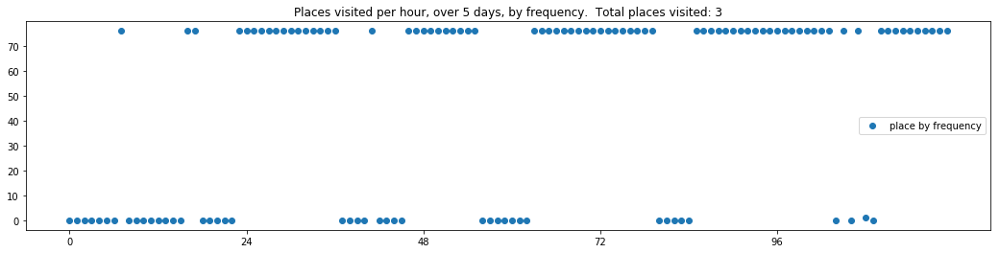

----- vector ----
prefix labels:  [605, 605]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 605, 605, 605, 605, 605, 605, 605, 605, 605, 605, 0, 0, 0, 0, 0, 0, 0, 0, 605, 0, 605, 605]
[605, 605, 605, 605, 605, 605, 605, 605, 605, 605, 605, 605, 605, 605, 605, 605, 605, 605, 605, 605, 605, 605, 605, 605]
[605, 605, 605, 605, 605, 605, 605, 605, 605, 605, 605, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 605, 605, 605, 605, 605, 605, 605, 605, 605, 605, 605, 605, 605, 605, 605, 605, 605, 605]


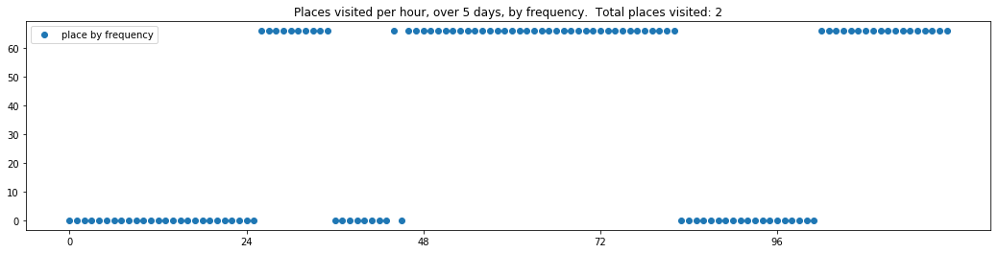

----- vector ----
prefix labels:  [513, 513]
[0, 0, 0, 0, 0, 0, 0, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513]
[513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513]
[513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513]
[513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513]
[513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513, 513]


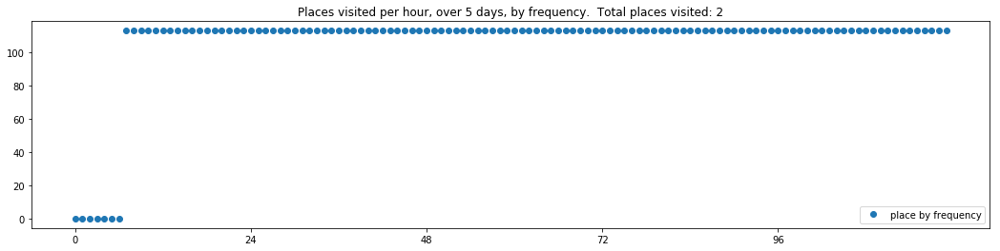

----- vector ----
prefix labels:  [256, 256]
[0, 0, 0, 0, 0, 0, 0, 0, 256, 256, 256, 256, 256, 256, 256, 256, 256, 256, 256, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 256, 256, 256, 256, 256, 256, 256, 256, 256, 256, 256, 256, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 256, 256, 256, 256, 256, 256, 256, 256, 256, 256, 256, 256, 256, 256, 0, 0]
[0, 256, 256, 0, 0, 256, 256, 256, 256, 256, 256, 256, 256, 256, 256, 256, 256, 256, 256, 256, 256, 256, 256, 256]
[256, 256, 0, 0, 0, 256, 256, 256, 256, 256, 256, 256, 256, 256, 256, 256, 256, 256, 256, 256, 256, 256, 256, 256]


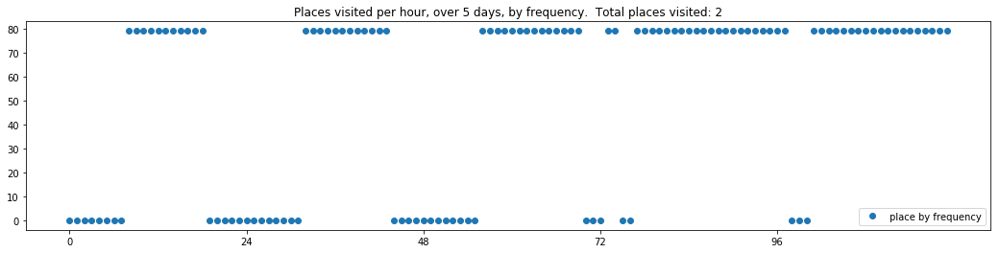

----- vector ----
prefix labels:  [278, 278]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20, 20, 0]
[278, 278, 0, 278, 278, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20, 20, 53, 53]
[53, 53, 53, 53, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[20, 20, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


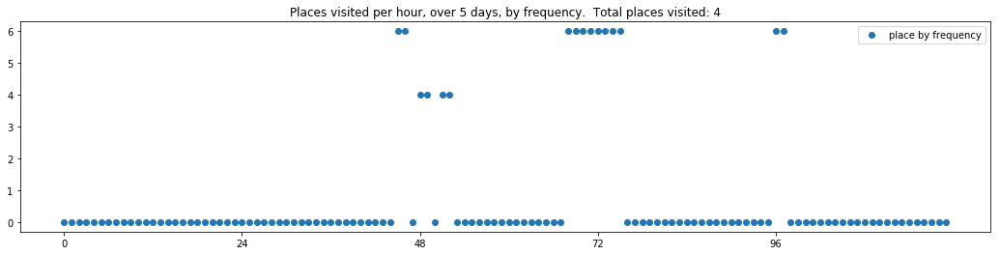

----- vector ----
prefix labels:  [29, 29]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 85, 262, 262, 262, 262, 262, 262, 29, 29, 29, 29, 29, 29, 29]
[29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 262, 262, 262, 262, 262, 262, 262, 29, 29, 29, 29, 29, 29]
[29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 262, 262, 262, 262, 262, 262, 262, 29, 29, 29, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 29, 29, 29, 29, 29, 29, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 29, 0, 0]


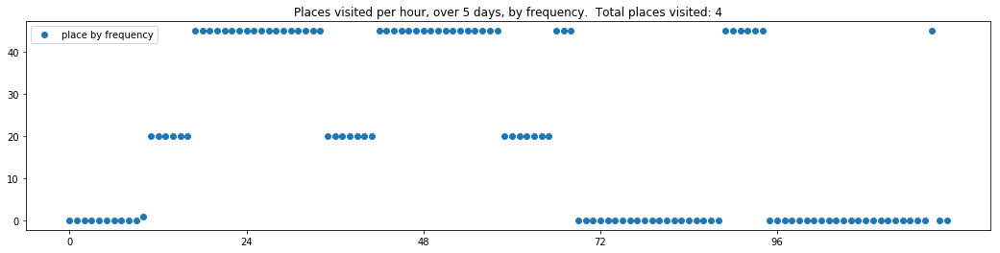

----- vector ----
prefix labels:  [164, 164]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 164, 164, 164, 164, 164, 164, 164, 164, 164]
[164, 164, 164, 164, 164, 164, 164, 164, 164, 164, 164, 164, 164, 164, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 164, 164, 164, 164, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


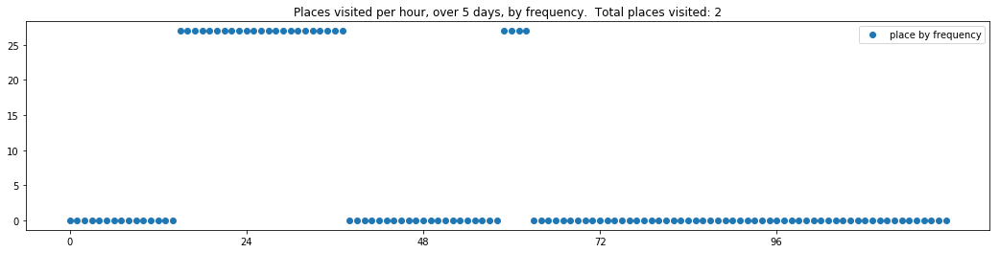

----- vector ----
prefix labels:  [182, 647]
[0, 0, 0, 0, 0, 0, 0, 182, 182, 182, 182, 182, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 182, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 182, 182, 182, 182, 182, 182, 182, 182, 182, 182, 182, 182, 182, 182, 182, 182]
[182, 182, 0, 0, 0, 182, 182, 182, 182, 182, 182, 182, 182, 182, 182, 182, 182, 182, 182, 182, 182, 182, 182, 182]


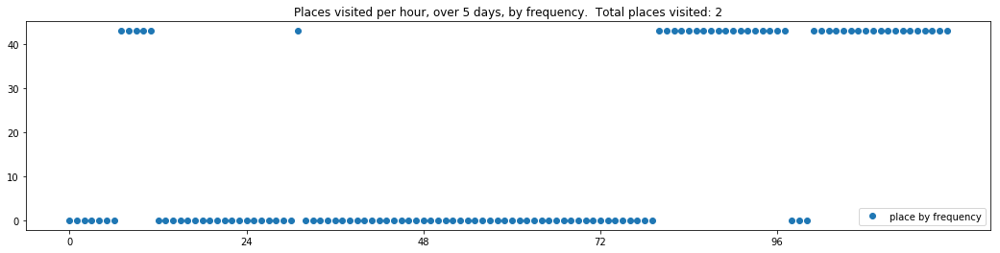

----- vector ----
prefix labels:  [642, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 642, 642, 642, 642]
[642, 642, 642, 642, 642, 642, 642, 642, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 294, 294, 294]
[294, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 294]
[294, 294, 294, 294, 294, 294, 294, 294, 294, 294, 294, 294, 294, 294, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 294, 294, 294, 294, 294]


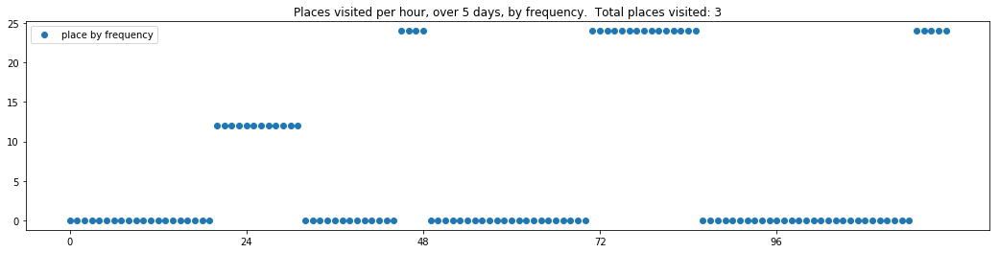

----- vector ----
prefix labels:  [522, 522]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 522, 522, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 522, 522, 522, 522]
[522, 522, 522, 522, 522, 522, 522, 522, 522, 522, 522, 0, 0, 0, 0, 0, 0, 0, 0, 0, 522, 522, 522, 522]
[522, 522, 0, 0, 0, 0, 0, 0, 0, 0, 0, 102, 0, 0, 0, 0, 0, 0, 522, 522, 522, 522, 522, 522]


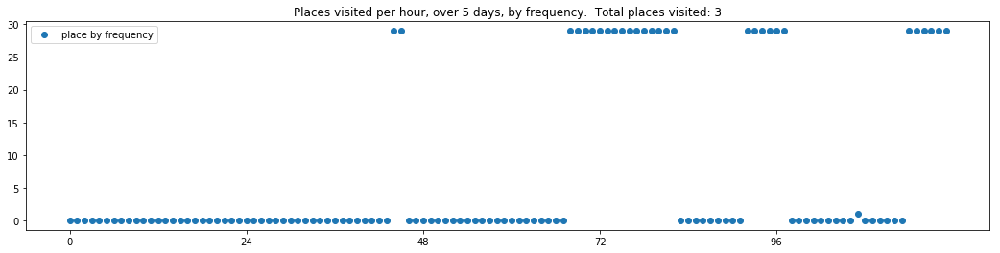

----- vector ----
prefix labels:  [358, 358]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 358, 358, 358, 358, 358, 401, 401, 401, 358]
[358, 358, 358, 358, 358, 358, 358, 358, 358, 358, 358, 0, 457, 0, 401, 358, 358, 358, 358, 358, 358, 358, 358, 358]
[358, 358, 358, 358, 358, 358, 358, 358, 358, 358, 358, 358, 358, 358, 358, 358, 358, 358, 358, 358, 358, 358, 358, 358]
[358, 358, 358, 358, 358, 358, 358, 358, 358, 358, 457, 457, 457, 358, 358, 358, 358, 358, 358, 358, 358, 358, 358, 358]


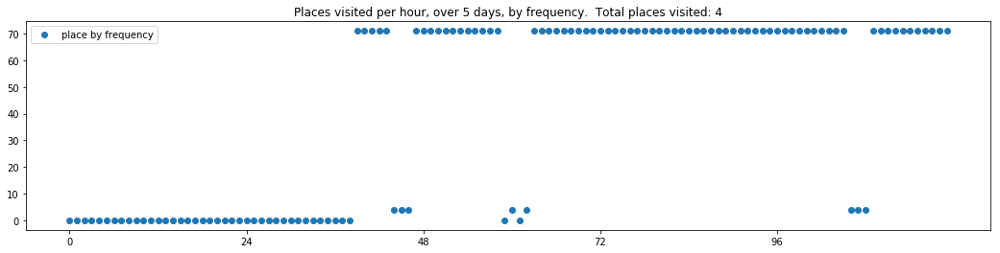

----- vector ----
prefix labels:  [22, 22]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


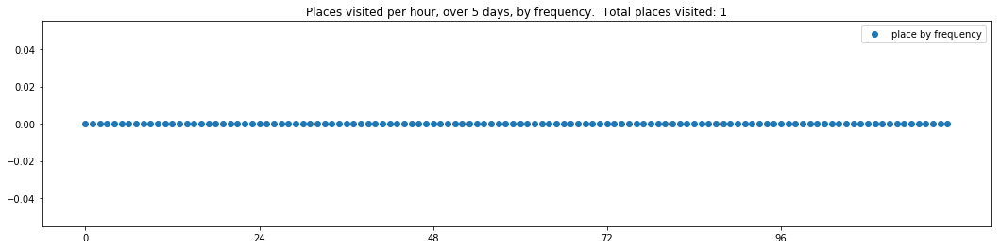

----- vector ----
prefix labels:  [179, 91]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 91, 91, 91, 179, 179, 0, 0, 179, 179, 179]
[179, 179, 179, 179, 179, 179, 179, 91, 91, 91, 91, 91, 91, 91, 91, 91, 91, 179, 179, 179, 0, 179, 179, 179]
[179, 179, 179, 179, 179, 179, 179, 91, 91, 91, 91, 91, 91, 91, 91, 91, 91, 91, 179, 179, 179, 179, 179, 179]
[179, 179, 179, 179, 179, 179, 179, 91, 91, 91, 91, 91, 91, 91, 91, 91, 91, 91, 179, 179, 179, 179, 179, 179]
[179, 179, 179, 179, 179, 179, 179, 91, 91, 91, 91, 91, 91, 91, 91, 91, 91, 91, 179, 179, 179, 179, 179, 179]


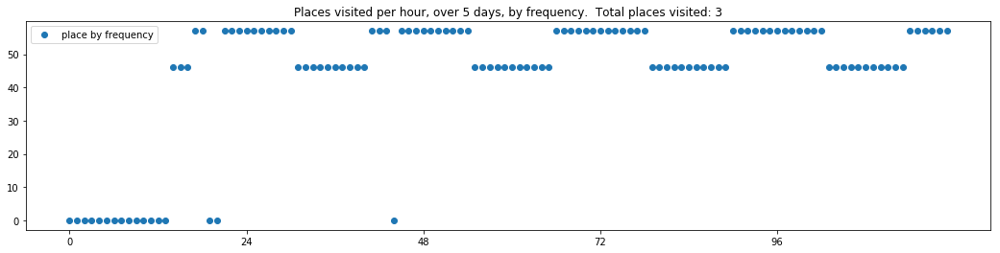

----- vector ----
prefix labels:  [117, 117]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 117, 117, 117]
[117, 117, 117, 117, 117, 117, 117, 117, 117, 117, 117, 117, 117, 117, 117, 117, 117, 117, 117, 0, 0, 0, 117, 117]
[117, 117, 117, 117, 117, 117, 117, 0, 117, 117, 117, 117, 117, 117, 117, 117, 117, 117, 117, 117, 0, 0, 117, 117]
[117, 117, 117, 117, 117, 117, 117, 117, 117, 117, 117, 117, 117, 117, 117, 117, 117, 117, 117, 117, 117, 0, 117, 117]
[105, 117, 117, 117, 117, 117, 117, 117, 117, 117, 117, 117, 117, 117, 117, 117, 117, 117, 117, 117, 117, 0, 0, 117]


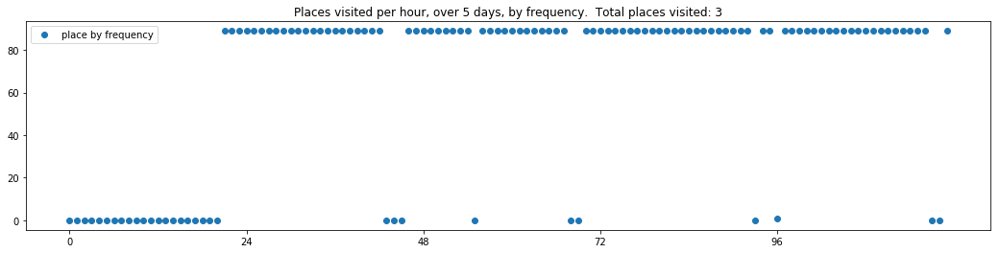

----- vector ----
prefix labels:  [87, 87]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 87, 87, 87, 87, 87, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 629, 0, 0, 240, 240, 382, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 240, 240, 240, 240, 240, 240, 240, 240, 240, 240, 0]
[240, 240, 240, 240, 240, 240, 240, 240, 240, 240, 240, 240, 240, 240, 240, 240, 240, 240, 240, 0, 0, 0, 0, 0]


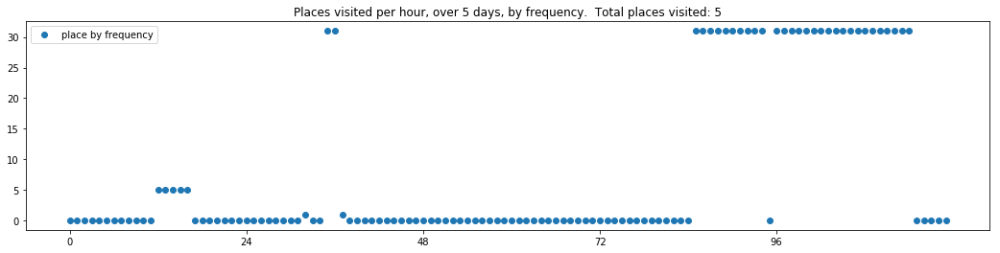

----- vector ----
prefix labels:  [61, 61]
[0, 0, 0, 0, 0, 0, 61, 61, 61, 61, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 61, 61, 61, 61, 61, 61, 61, 61, 61, 61, 61, 61, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 61, 61, 61, 61, 61, 61, 61, 61, 61, 61, 61, 61, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 61, 61, 61, 61, 61, 61, 61, 61, 61, 61, 61, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 61, 61, 61, 61, 61, 61, 61, 61, 61, 61, 61, 0, 0, 0, 0, 0, 0, 0]


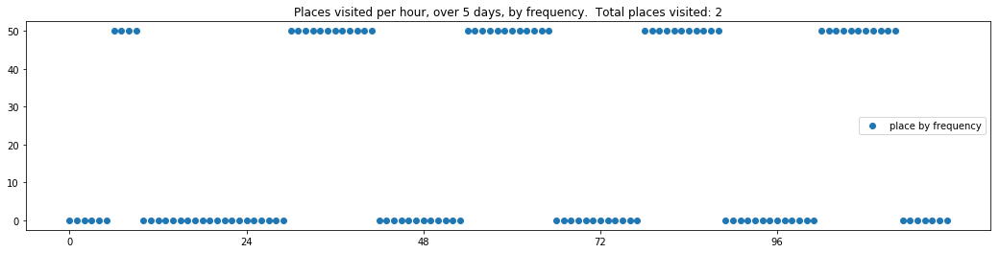

----- vector ----
prefix labels:  [5, 2]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 5, 5, 5]
[5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
[5, 5, 5, 5, 5, 5, 5, 5, 5, 560, 0, 0, 0, 0, 0, 0, 0, 5, 5, 5, 5, 5, 5, 5]
[5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 0, 0, 0]


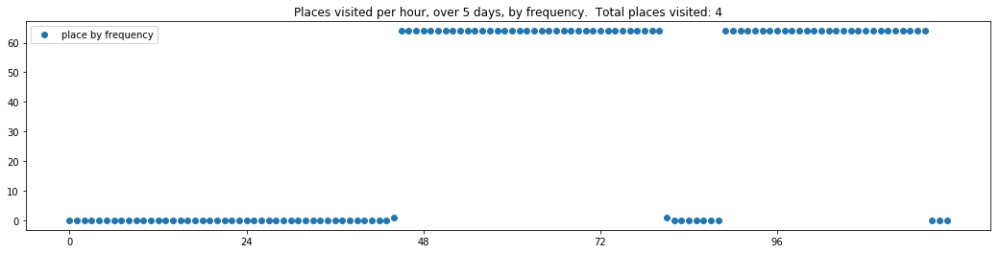

----- vector ----
prefix labels:  [358, 74]
[0, 0, 0, 0, 0, 74, 74, 74, 74, 74, 74, 74, 74, 74, 74, 0, 261, 261, 334, 358, 358, 358, 358, 358]
[358, 358, 358, 358, 358, 74, 74, 74, 74, 74, 74, 74, 74, 74, 74, 334, 334, 358, 358, 358, 358, 358, 358, 358]
[358, 358, 358, 358, 358, 74, 74, 74, 74, 74, 74, 74, 74, 74, 74, 261, 358, 358, 358, 358, 358, 358, 358, 358]
[358, 358, 358, 358, 74, 74, 74, 74, 74, 74, 74, 0, 74, 69, 358, 358, 358, 358, 358, 358, 358, 358, 358, 358]
[358, 358, 358, 358, 74, 74, 74, 74, 74, 74, 74, 74, 74, 358, 358, 358, 358, 358, 358, 358, 358, 358, 358, 358]


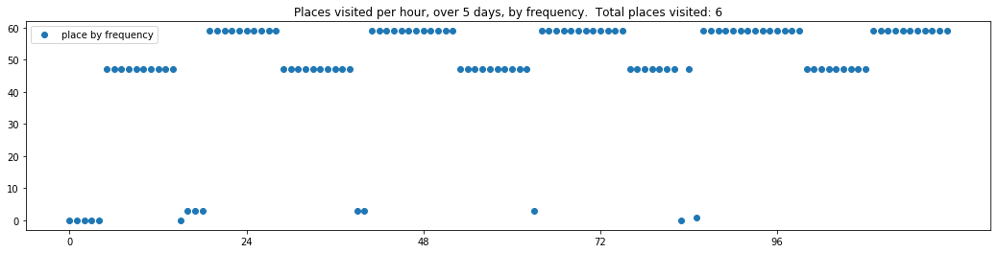

----- vector ----
prefix labels:  [562, 562]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 308, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


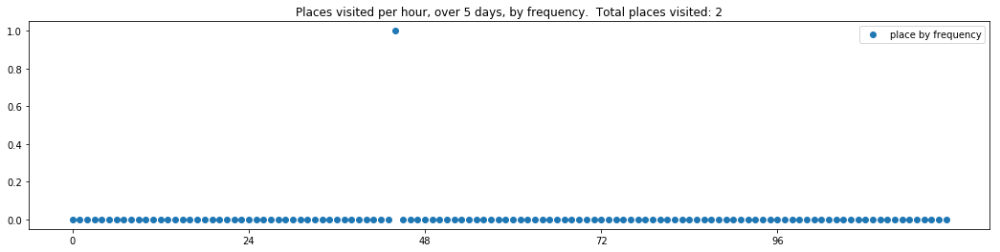

----- vector ----
prefix labels:  [168, 168]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 168, 168, 168, 168, 168, 168, 168, 168]
[168, 168, 168, 168, 168, 168, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 168, 168, 168, 168, 168, 168, 168]
[168, 168, 168, 168, 168, 168, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 168, 168, 168, 168, 168, 168, 168, 168]
[168, 168, 168, 168, 168, 168, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 168, 168, 168, 168, 168, 168, 168]
[168, 168, 168, 168, 168, 168, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 168, 168, 168, 168, 168, 168, 168]


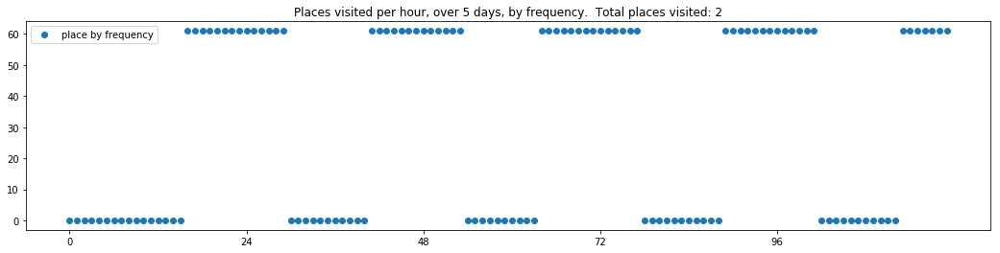

----- vector ----
prefix labels:  [528, 455]
[0, 0, 0, 0, 0, 0, 0, 455, 455, 455, 455, 455, 455, 455, 455, 455, 455, 455, 455, 535, 255, 528, 528, 528]
[528, 528, 528, 528, 528, 528, 528, 528, 455, 455, 455, 455, 455, 455, 455, 455, 455, 455, 455, 464, 528, 528, 528, 528]
[528, 528, 528, 528, 528, 528, 528, 528, 455, 455, 455, 455, 455, 455, 455, 455, 455, 455, 455, 528, 528, 528, 528, 528]
[528, 528, 528, 528, 528, 528, 528, 528, 528, 0, 0, 0, 0, 0, 455, 455, 455, 455, 455, 147, 528, 528, 528, 528]
[528, 528, 528, 528, 528, 528, 528, 528, 528, 455, 455, 455, 455, 455, 455, 455, 455, 455, 528, 528, 528, 528, 528, 455]


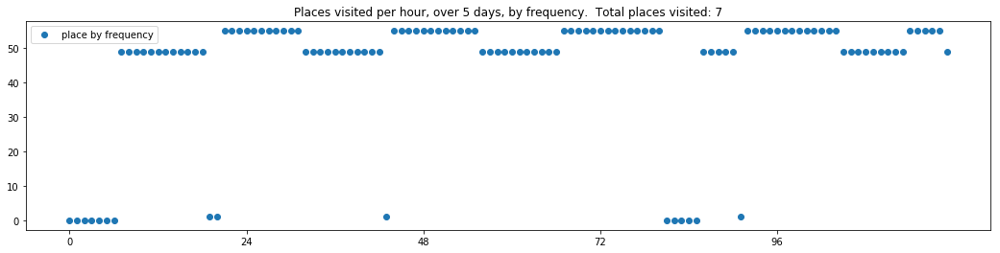

----- vector ----
prefix labels:  [383, 383]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 383, 383, 383, 383, 383, 383]
[383, 383, 383, 383, 383, 383, 383, 383, 383, 383, 383, 383, 383, 383, 383, 383, 383, 383, 383, 383, 383, 383, 383, 383]
[383, 383, 383, 383, 383, 383, 383, 406, 185, 185, 185, 185, 185, 185, 185, 185, 185, 177, 177, 177, 177, 177, 177, 383]
[383, 383, 383, 383, 383, 383, 383, 383, 383, 185, 185, 185, 185, 185, 185, 185, 185, 185, 284, 284, 284, 383, 383, 383]
[383, 383, 383, 383, 383, 383, 383, 383, 185, 185, 185, 185, 185, 185, 185, 185, 185, 177, 177, 177, 177, 177, 177, 177]


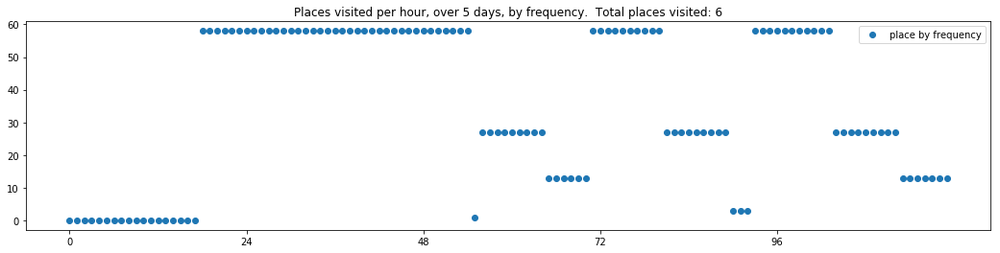

----- vector ----
prefix labels:  [560, 560]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 560, 560, 560, 560, 560, 560, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 560, 560, 560, 560, 560, 560, 560, 560, 560, 560, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 560, 560, 560, 560, 560, 560, 560, 560, 560, 560, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 560, 560, 560, 560, 560, 560, 560, 560, 560, 560, 560, 560, 560, 560, 560, 560, 560]
[0, 0, 0, 0, 0, 0, 0, 560, 560, 560, 560, 560, 560, 560, 560, 560, 560, 560, 560, 560, 560, 560, 560, 0]


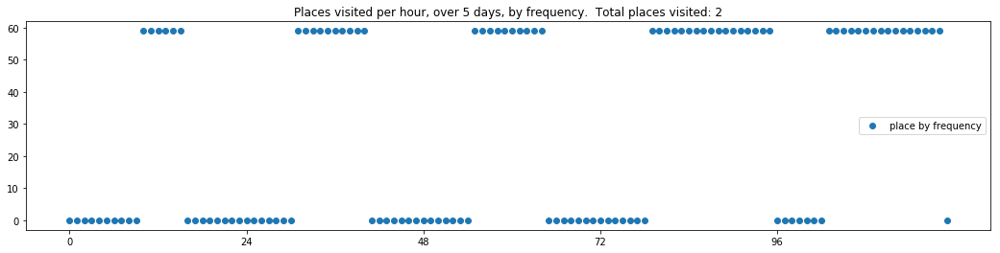

----- vector ----
prefix labels:  [140, 140]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 140, 140, 140, 140, 140, 140, 140, 140, 140, 140, 140, 140, 140, 140, 140, 140, 140]
[140, 140, 140, 140, 140, 140, 140, 140, 140, 140, 140, 140, 140, 140, 140, 140, 140, 140, 140, 140, 140, 140, 140, 140]
[140, 140, 140, 140, 140, 140, 140, 140, 140, 140, 140, 140, 140, 140, 140, 140, 140, 140, 140, 140, 140, 140, 140, 140]
[140, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 140, 140, 140, 140, 140, 140, 140, 140, 140]


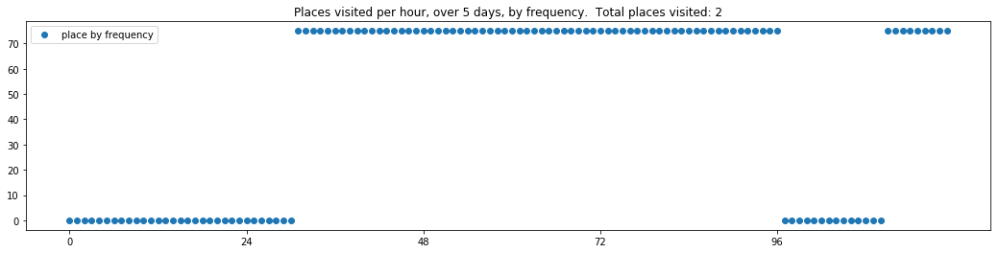

showing sample of trajectories from output with temp 0.9
----- vector ----
prefix labels:  [401, 401]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401]
[401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401]
[401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401]
[401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401]
[401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 0, 0, 0, 0, 0, 0, 0, 401, 401, 401, 401]


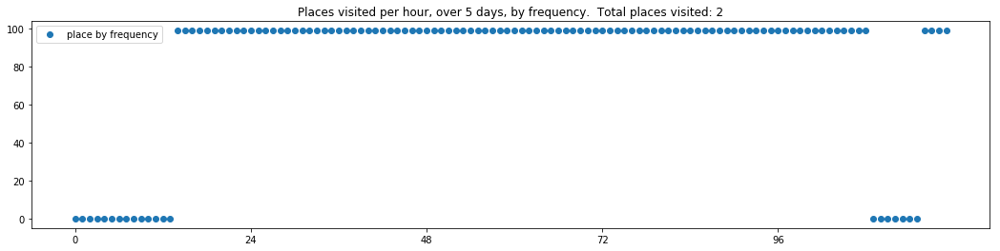

----- vector ----
prefix labels:  [401, 401]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 401, 401, 401, 401, 401, 401, 0, 0, 0, 401, 401, 401, 401]
[401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 401, 0, 401, 0, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401]
[401, 401, 401, 401, 401, 401, 0, 0, 0, 0, 401, 0, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401]
[401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401]


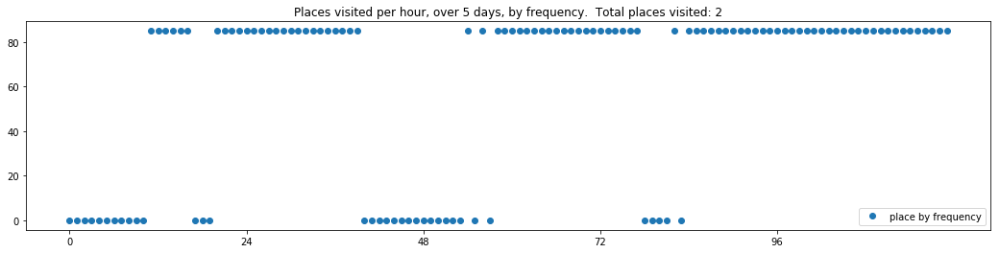

----- vector ----
prefix labels:  [372, 372]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 234, 234, 456, 456, 456, 527, 527, 527, 527, 527, 527, 527, 527, 527]


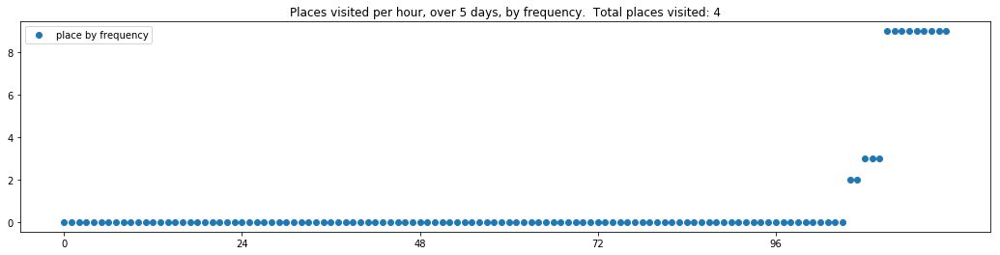

----- vector ----
prefix labels:  [14, 14]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 14, 14, 14, 14, 14, 14, 14, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14]
[14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 0, 14, 14, 14]
[14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 0, 0, 14, 14, 14]


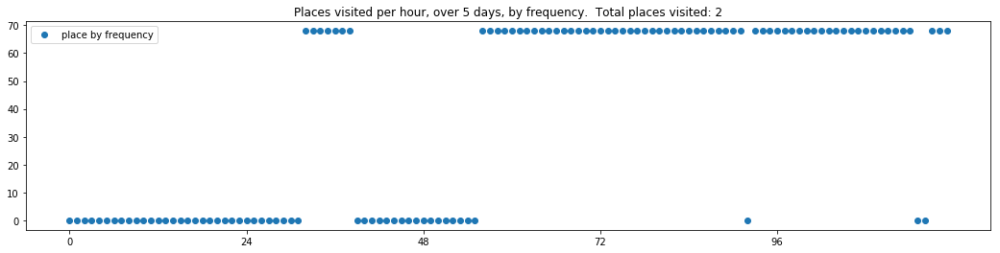

----- vector ----
prefix labels:  [583, 583]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 583, 583, 583, 583, 583]
[583, 583, 583, 583, 583, 583, 583, 583, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 535, 583, 583, 583]
[583, 583, 583, 583, 583, 583, 583, 583, 583, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 583, 583, 583, 583, 583]
[583, 583, 583, 583, 583, 583, 583, 583, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 583, 583, 0, 583]
[583, 583, 583, 583, 583, 583, 583, 583, 583, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 583, 583, 583, 583, 583]


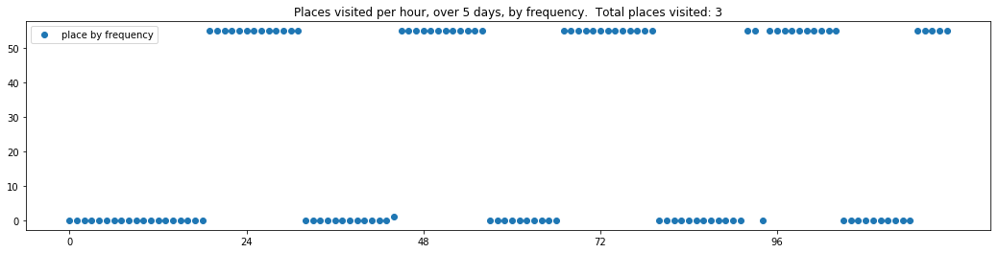

----- vector ----
prefix labels:  [78, 22]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 22, 22, 22, 78, 78, 78, 78, 78]
[78, 78, 78, 78, 78, 78, 0, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 78, 78, 78]
[78, 78, 78, 78, 78, 78, 0, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 0, 78, 78, 78, 78, 78]
[84, 84, 78, 78, 78, 78, 0, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 78, 78, 78, 78]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 78, 78, 78, 22, 22, 22, 22, 22, 22, 22, 22, 22, 78, 78, 395]


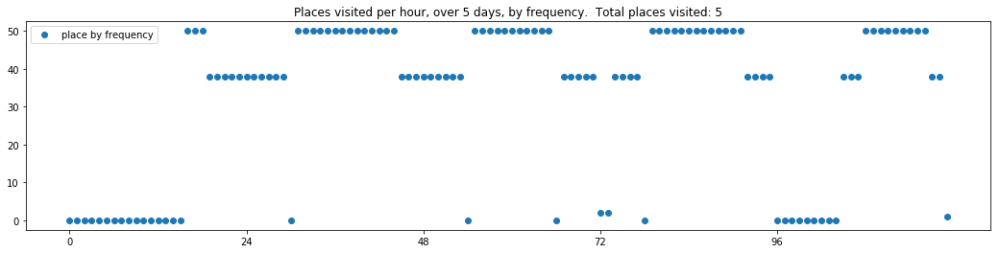

----- vector ----
prefix labels:  [474, 474]
[0, 0, 0, 0, 0, 0, 0, 474, 474, 474, 474, 474, 474, 474, 474, 474, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 120, 0, 0, 434, 434, 0, 0, 0, 120, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


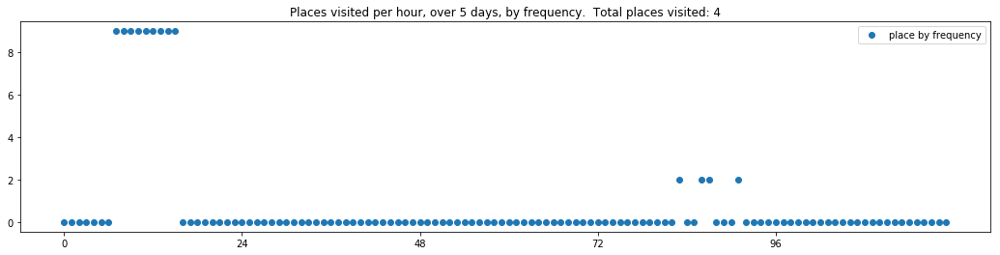

----- vector ----
prefix labels:  [341, 341]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 341, 341, 0, 0, 341, 341, 341, 341]
[341, 341, 341, 341, 341, 341, 341, 0, 0, 0, 0, 0, 0, 0, 0, 0, 341, 341, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 341, 341, 341, 341, 341, 341, 341, 341, 341]
[341, 341, 341, 341, 341, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


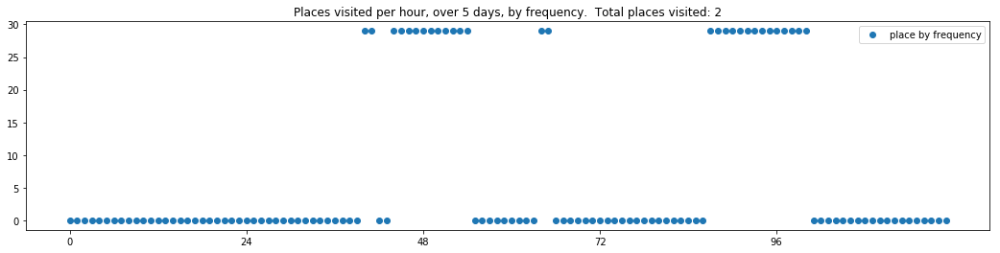

----- vector ----
prefix labels:  [4, 4]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 4]
[4, 4, 4, 4, 4, 4, 4, 50, 50, 178, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 0, 0, 334, 557, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4]
[4, 4, 4, 4, 4, 4, 4, 4, 4, 318, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


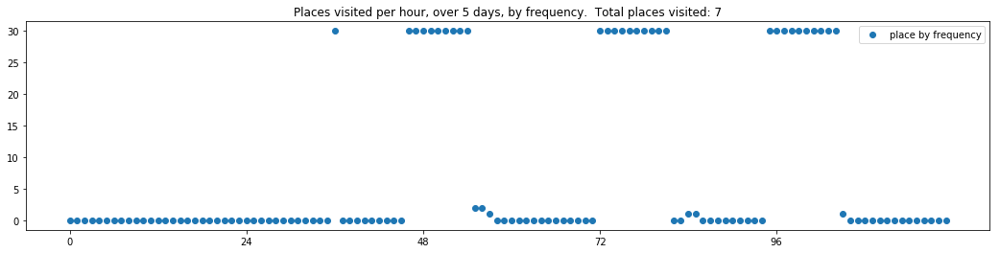

----- vector ----
prefix labels:  [393, 297]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 297, 297, 297, 297, 297, 297, 0, 0, 0, 0, 0, 393]
[393, 393, 393, 393, 393, 393, 393, 393, 393, 393, 393, 393, 393, 393, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[393, 393, 393, 393, 393, 393, 393, 393, 393, 393, 393, 393, 0, 0, 297, 297, 297, 0, 0, 0, 0, 482, 482, 359]
[393, 393, 393, 393, 393, 393, 393, 393, 393, 393, 393, 0, 393, 0, 0, 297, 297, 297, 297, 297, 297, 297, 297, 297]
[297, 0, 0, 0, 393, 0, 0, 0, 0, 0, 0, 0, 0, 297, 297, 297, 297, 0, 0, 0, 0, 0, 475, 612]


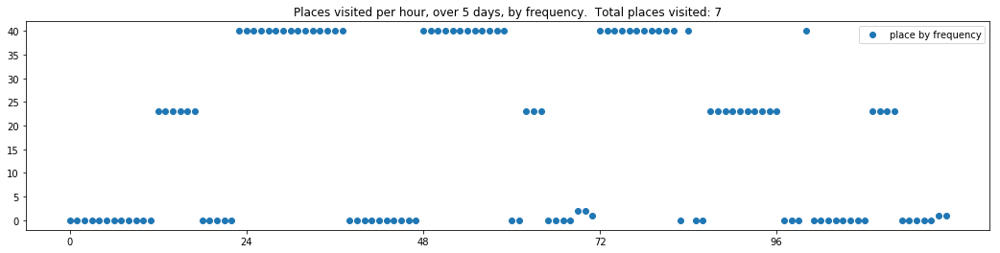

----- vector ----
prefix labels:  [373, 100]
[0, 0, 0, 0, 0, 0, 0, 0, 100, 100, 100, 100, 185, 185, 0, 0, 641, 641, 0, 0, 0, 373, 373, 0]
[0, 0, 0, 0, 0, 0, 0, 495, 0, 0, 0, 0, 100, 100, 100, 100, 100, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 185, 185, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 185, 185, 185, 185, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 185, 185, 0, 185, 185, 185, 185, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


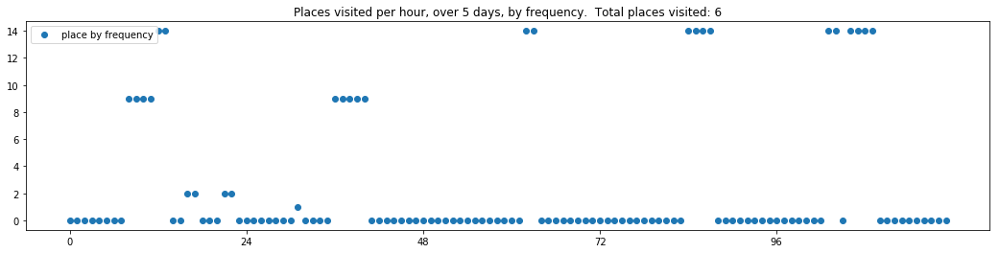

----- vector ----
prefix labels:  [16, 4]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 4, 4, 0, 0, 0, 0, 0, 0, 0, 0, 16, 16, 16, 16]
[16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 17, 17, 88, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 165, 0, 4, 4, 4, 151, 259, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 88, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 55, 55, 0, 0, 115, 0, 0, 590, 0, 0, 0, 0, 0, 0, 0]


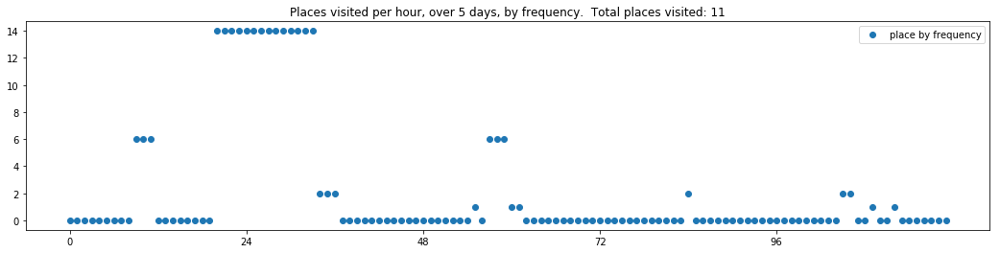

----- vector ----
prefix labels:  [225, 225]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


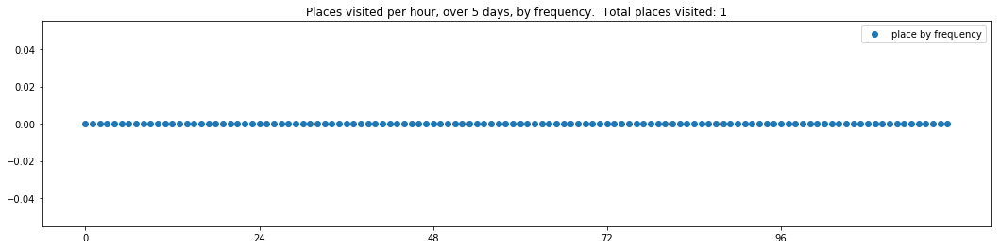

----- vector ----
prefix labels:  [548, 548]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 548, 548, 0, 0, 0, 0, 0, 0, 0, 548, 548]
[548, 548, 548, 548, 548, 548, 548, 548, 548, 548, 548, 548, 548, 0, 0, 0, 0, 0, 548, 0, 0, 548, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 548, 548, 548, 548, 548, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 548, 0, 0, 0, 0, 0, 0, 0, 548, 548, 548, 548, 548]


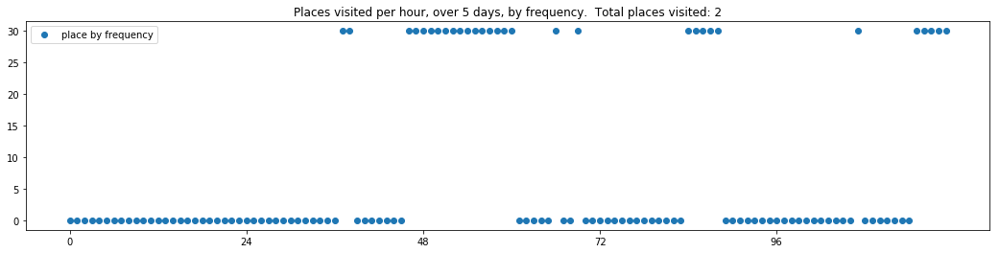

----- vector ----
prefix labels:  [45, 45]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 45, 45, 45, 45, 45, 45]
[45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45]
[45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45]
[45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45]
[45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 0, 0, 0, 0, 0, 0, 0, 0, 0]


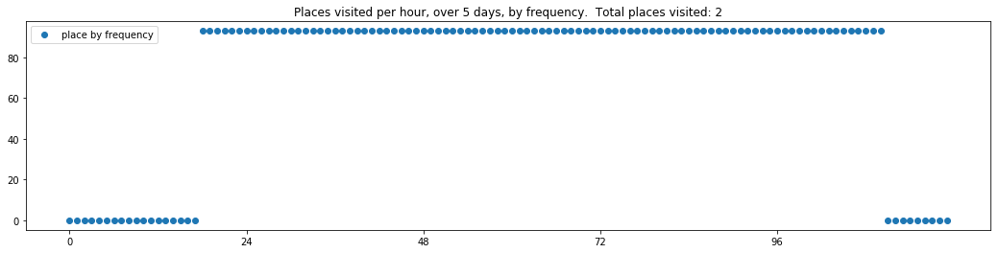

----- vector ----
prefix labels:  [161, 161]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 161, 161, 161, 161, 161, 161, 161]
[161, 161, 161, 161, 161, 161, 161, 0, 161, 0, 0, 0, 0, 0, 0, 0, 0, 161, 161, 161, 161, 161, 161, 161]
[161, 161, 161, 161, 161, 161, 161, 161, 161, 0, 0, 0, 0, 0, 0, 0, 0, 0, 161, 161, 161, 161, 161, 161]
[161, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161]
[161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161]


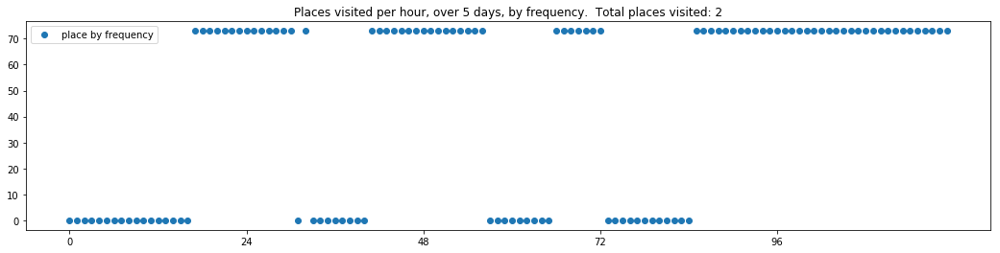

----- vector ----
prefix labels:  [422, 422]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 422, 422, 422, 422, 422]
[422, 422, 422, 422, 422, 422, 422, 422, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 422, 422]
[422, 0, 0, 0, 0, 0, 0, 0, 0, 423, 423, 423, 423, 423, 423, 423, 423, 0, 0, 422, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 422]
[422, 422, 0, 0, 422, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 422, 422, 422, 422, 422]


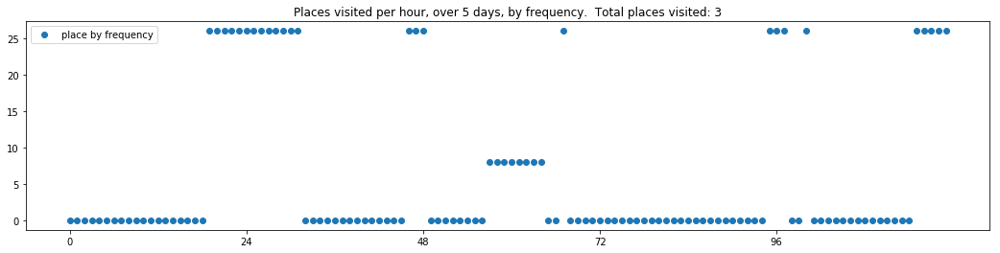

----- vector ----
prefix labels:  [47, 47]
[0, 0, 0, 0, 0, 0, 0, 47, 47, 47, 47, 47, 47, 47, 47, 47, 47, 47, 47, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 47, 47, 47, 47, 47, 47, 47, 47, 47, 47, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 47, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 47, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


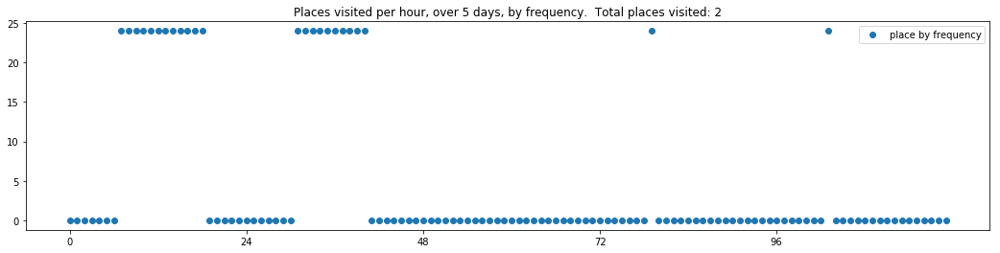

----- vector ----
prefix labels:  [577, 577]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 577, 577, 577, 577, 577, 577, 577, 577, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 577, 577, 577, 577, 577, 577, 577, 577, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 577, 577, 577, 577, 577, 577, 577, 577, 577, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


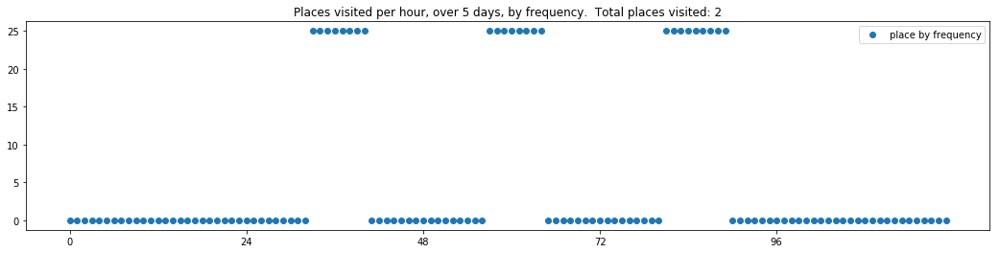

----- vector ----
prefix labels:  [546, 546]
[0, 0, 0, 0, 0, 0, 0, 546, 546, 546, 546, 546, 546, 546, 546, 546, 546, 546, 546, 546, 546, 546, 546, 546]
[546, 546, 546, 546, 546, 546, 546, 546, 546, 546, 546, 546, 546, 546, 546, 546, 546, 546, 0, 546, 546, 546, 546, 546]
[546, 546, 546, 546, 546, 546, 546, 546, 546, 546, 546, 546, 546, 546, 546, 0, 546, 546, 546, 0, 0, 546, 546, 546]
[546, 546, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 205, 0, 0, 0, 0, 0, 546, 546, 546, 546]


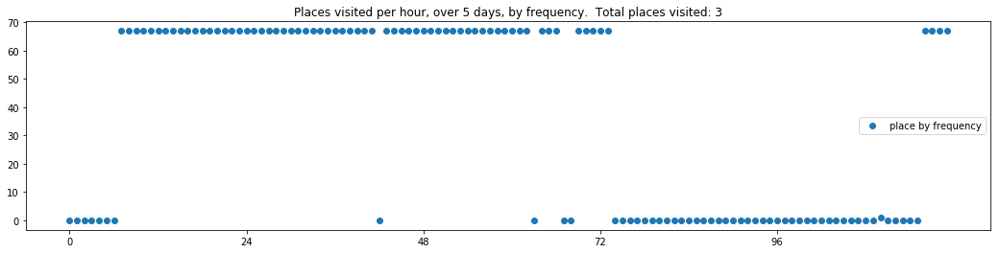

----- vector ----
prefix labels:  [189, 189]
[0, 0, 0, 0, 0, 0, 0, 0, 223, 189, 189, 189, 189, 189, 189, 189, 189, 189, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 189, 189, 189, 189, 189, 189, 189, 189, 189, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 189, 189, 189, 189, 189, 189, 189, 189, 189, 189, 189, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 189, 189, 189, 189, 189, 189, 189, 189, 189, 189, 189, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 189, 189, 189, 189, 189, 189, 189, 189, 189, 189, 189, 0, 0, 0, 0]


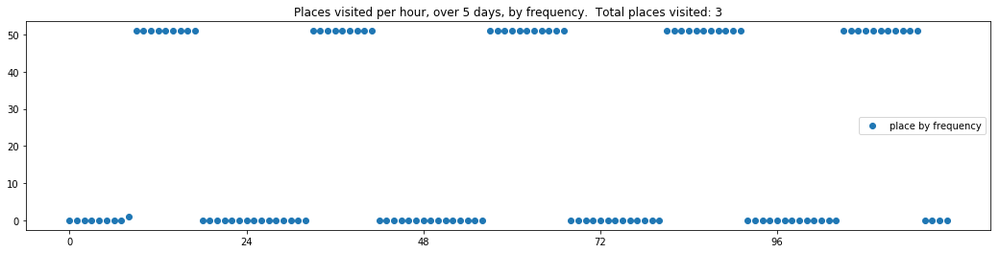

----- vector ----
prefix labels:  [259, 259]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 259, 259, 259, 259, 259, 259]
[259, 259, 259, 259, 259, 259, 259, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 259, 259, 259, 259, 259, 259, 259]
[259, 259, 259, 259, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 275, 275, 60, 60, 60, 60]
[60, 60, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 259, 259, 259, 259, 0, 0, 0]
[0, 0, 259, 259, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 259, 259, 0, 0, 0, 259, 259]


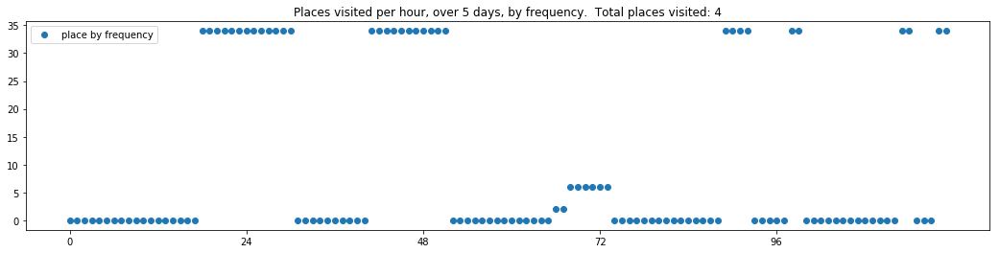

----- vector ----
prefix labels:  [66, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 136, 136, 136, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 66, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 231, 231, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 231, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 231, 231, 231, 231, 231, 231, 0, 0, 0]
[0, 0, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 0, 231, 231, 231, 231, 231, 0, 0]


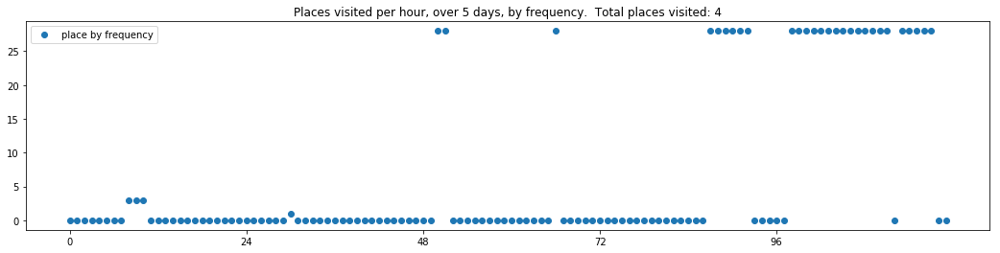

----- vector ----
prefix labels:  [7, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[7, 7, 7, 7, 7, 7, 7, 7, 0, 0, 0, 0, 0, 0, 0, 0, 7, 111, 437, 437, 7, 7, 7, 7]
[7, 7, 7, 7, 7, 7, 7, 7, 0, 0, 0, 0, 0, 0, 0, 0, 7, 7, 7, 7, 7, 7, 7, 7]
[7, 7, 7, 7, 7, 7, 7, 7, 0, 0, 0, 0, 0, 0, 0, 0, 0, 353, 11, 0, 7, 7, 7, 7]
[7, 7, 7, 7, 7, 7, 7, 7, 0, 0, 0, 0, 0, 0, 0, 0, 7, 7, 7, 7, 7, 7, 7, 7]


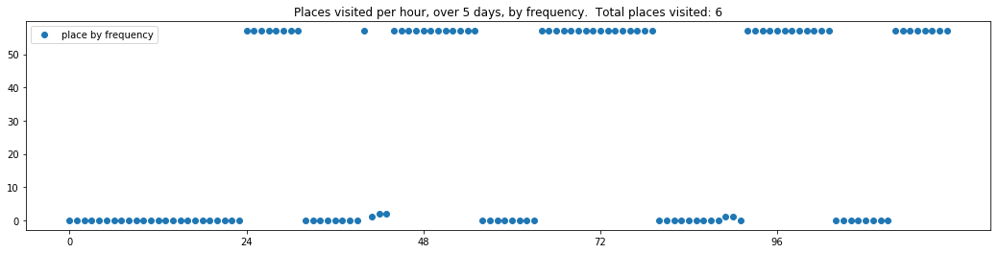

----- vector ----
prefix labels:  [107, 107]
[0, 0, 0, 0, 0, 0, 107, 107, 107, 107, 0, 0, 0, 0, 107, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 107, 107, 107, 107, 107, 107, 107, 107, 107, 107, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 107, 107, 107, 107, 107, 107, 107, 107, 107, 107, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 107, 107, 107, 107, 107, 107, 107, 107, 107, 107, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 107, 107, 107, 107, 107, 107, 107, 107, 107, 107, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


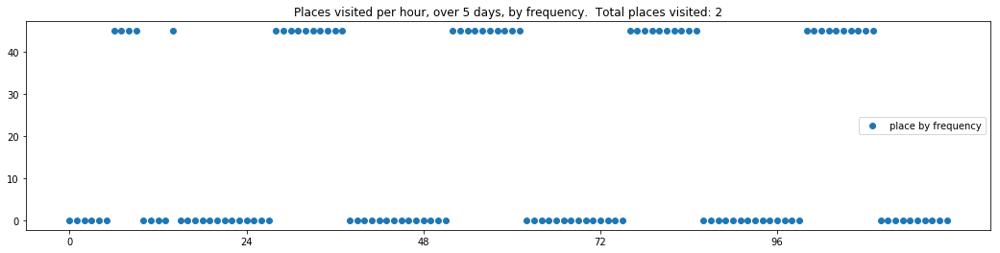

----- vector ----
prefix labels:  [194, 194]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 194, 194, 194, 578, 578, 578, 194]
[194, 194, 194, 194, 194, 194, 194, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 194, 194, 194, 194, 194, 194, 194]
[194, 194, 194, 194, 194, 194, 194, 0, 0, 0, 0, 0, 0, 0, 0, 0, 194, 194, 194, 194, 194, 0, 0, 0]
[0, 0, 0, 0, 194, 194, 194, 0, 0, 284, 284, 553, 553, 0, 0, 0, 0, 0, 0, 0, 194, 194, 194, 194]


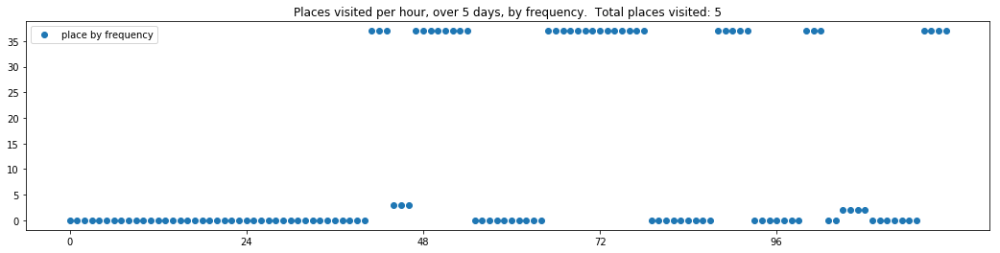

----- vector ----
prefix labels:  [587, 587]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 587, 587, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 587, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 587, 587, 587, 587, 587, 587]
[0, 0, 0, 0, 587, 587, 587, 587, 0, 0, 0, 0, 0, 0, 0, 0, 0, 587, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 587, 587, 587, 587, 0, 0, 0, 0, 0, 0, 587, 587, 587, 587, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 587, 587, 587, 587, 587, 587, 587, 587, 587, 587, 587, 587, 587, 0, 0, 0, 0, 0, 0]


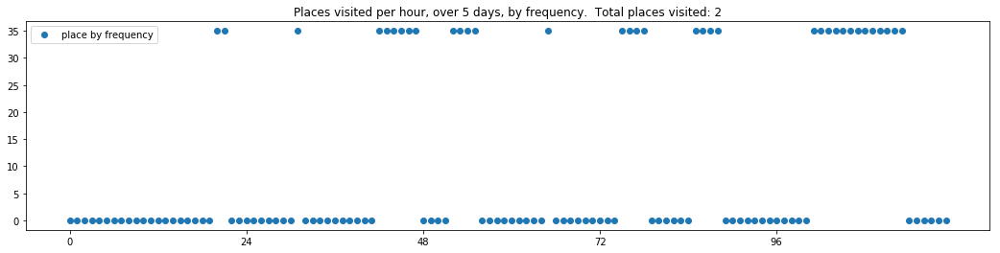

----- vector ----
prefix labels:  [434, 434]
[0, 0, 0, 0, 0, 0, 0, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 71, 434, 434, 434, 434, 434, 434, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 434, 434, 434, 434, 434, 434, 434, 434, 434, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 0, 0, 0, 0, 0, 0]


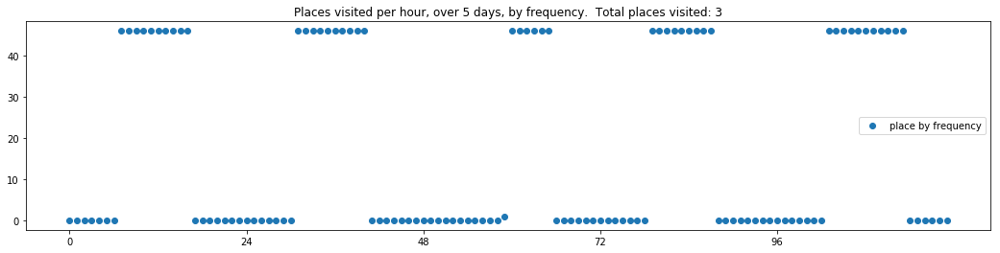

----- vector ----
prefix labels:  [116, 116]
[0, 0, 0, 0, 0, 0, 0, 116, 116, 0, 116, 0, 0, 0, 116, 116, 22, 0, 22, 0, 582, 116, 0, 0]
[0, 0, 0, 0, 0, 0, 582, 116, 0, 0, 0, 0, 612, 612, 0, 0, 0, 0, 513, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 116, 116, 116, 116, 116, 116, 116, 0, 0, 0, 0, 248, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 492, 492, 492, 492, 116, 186, 186, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 53]


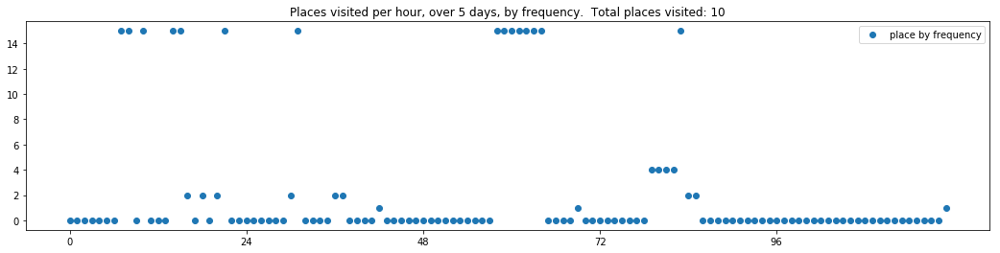

----- vector ----
prefix labels:  [518, 281]
[0, 0, 0, 0, 0, 0, 281, 281, 281, 281, 281, 281, 281, 281, 281, 518, 518, 518, 518, 518, 518, 518, 518, 518]
[518, 518, 518, 518, 518, 518, 518, 518, 281, 281, 281, 281, 434, 281, 281, 281, 281, 518, 518, 518, 518, 518, 518, 518]
[518, 518, 518, 518, 518, 518, 25, 281, 281, 281, 281, 281, 281, 281, 281, 518, 518, 518, 518, 518, 518, 518, 518, 518]
[518, 518, 518, 518, 518, 518, 518, 518, 518, 518, 518, 518, 518, 518, 518, 518, 518, 518, 518, 518, 518, 518, 518, 518]
[518, 518, 518, 518, 518, 518, 518, 518, 281, 281, 281, 281, 281, 281, 281, 281, 518, 518, 518, 518, 518, 518, 518, 518]


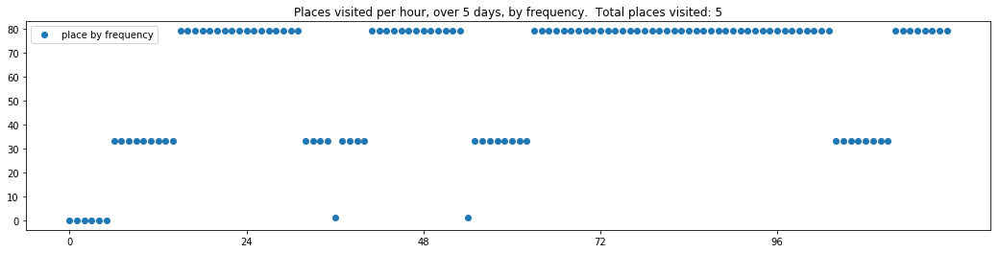

----- vector ----
prefix labels:  [48, 48]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 48, 48, 48, 48]
[48, 48, 48, 48, 48, 48, 48, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 48, 48, 48, 48, 48, 48]
[48, 48, 48, 48, 48, 48, 48, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 48, 48, 48, 48, 48, 48]
[48, 48, 48, 48, 48, 48, 48, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 48, 48, 48, 48, 48, 48]
[48, 48, 48, 48, 48, 48, 247, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 247, 48, 48, 48, 48, 48, 48]


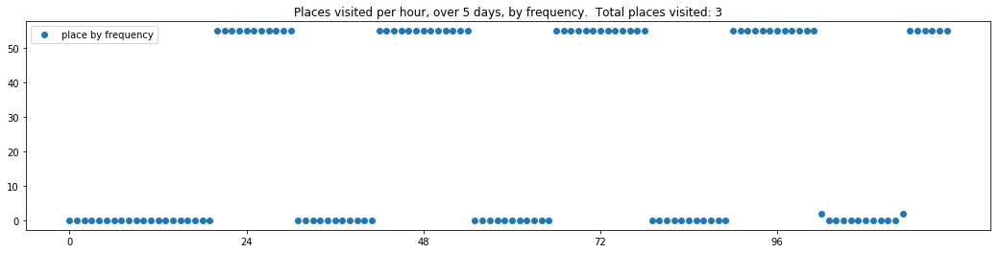

----- vector ----
prefix labels:  [90, 90]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 598, 598, 90, 90, 90, 90, 90]
[90, 90, 90, 90, 90, 90, 90, 0, 0, 0, 0, 0, 0, 0, 0, 0, 90, 90, 90, 90, 90, 90, 90, 90]
[90, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 90, 90, 90, 90, 90, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 90, 90, 90, 90, 90, 90, 90, 90, 90, 90, 90, 90, 90, 90, 90, 90, 90]


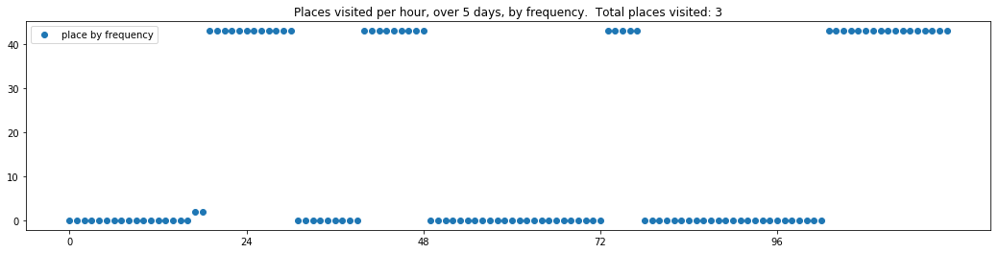

----- vector ----
prefix labels:  [241, 241]
[241, 241, 241, 241, 241, 241, 241, 241, 241, 241, 241, 241, 241, 241, 241, 0, 0, 0, 0, 0, 0, 0, 0, 241]
[241, 241, 241, 241, 241, 241, 241, 241, 241, 241, 241, 241, 241, 241, 241, 0, 0, 0, 0, 0, 0, 0, 0, 241]
[241, 241, 241, 241, 241, 241, 241, 241, 241, 241, 241, 241, 241, 241, 0, 0, 0, 0, 0, 0, 0, 0, 0, 241]
[241, 241, 241, 241, 241, 241, 241, 241, 241, 241, 241, 0, 0, 0, 0, 0, 0, 0, 344, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


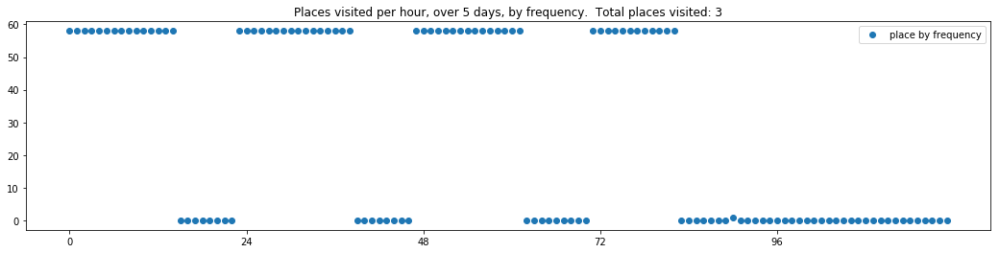

----- vector ----
prefix labels:  [312, 392]
[0, 0, 0, 0, 0, 0, 0, 0, 392, 392, 392, 392, 392, 392, 392, 392, 392, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 392, 392, 392, 392, 392, 392, 195, 0, 0, 611, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 392, 392, 392, 392, 392, 392, 392, 392, 392, 205, 205, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 0, 0, 0, 0, 0, 0]


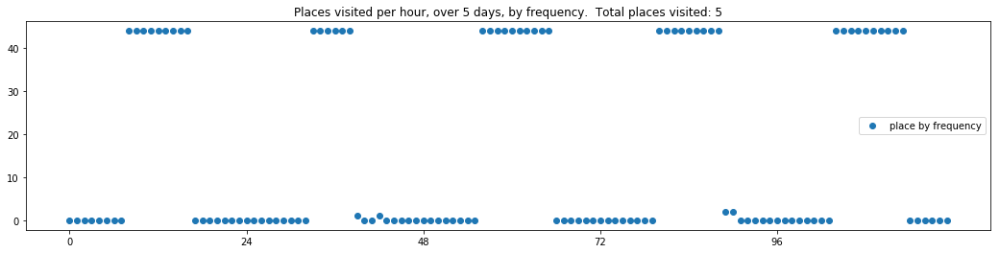

----- vector ----
prefix labels:  [280, 280]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 416, 416, 416, 416, 416, 416, 416, 416, 416, 416, 416, 416, 416, 416, 416, 416, 416, 416, 416, 416]


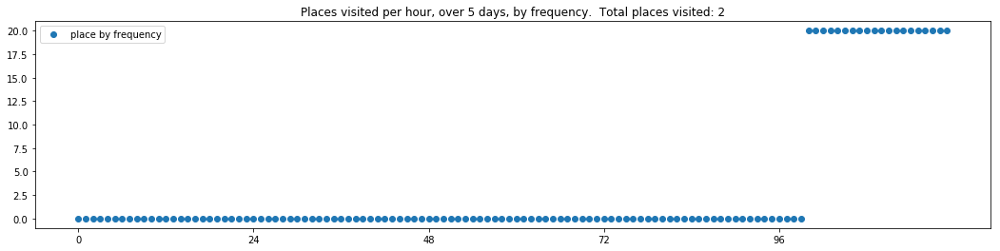

----- vector ----
prefix labels:  [10, 10]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 321, 321, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 10, 10, 10, 10, 10, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 11, 11, 11, 11, 11, 11, 11, 0, 299, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 54, 299, 299, 299, 299, 299, 299, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 54, 299, 299, 299, 299, 299, 299, 299, 299, 299, 299, 299, 299, 299, 299, 299, 299, 299, 299, 0, 0]


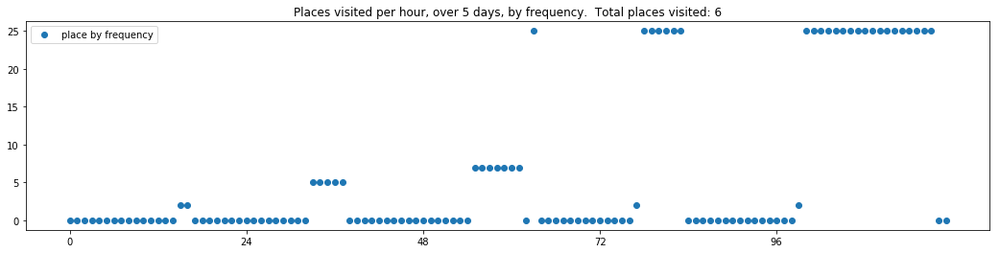

----- vector ----
prefix labels:  [562, 562]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 562, 562, 562, 562]
[562, 562, 562, 562, 562, 562, 165, 0, 0, 0, 0, 0, 0, 0, 0, 0, 562, 562, 562, 562, 562, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 391, 168, 562, 562, 0, 0, 0, 562, 0, 165, 562, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 165, 562, 0, 0, 0, 0, 562, 562, 562, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 165, 165, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


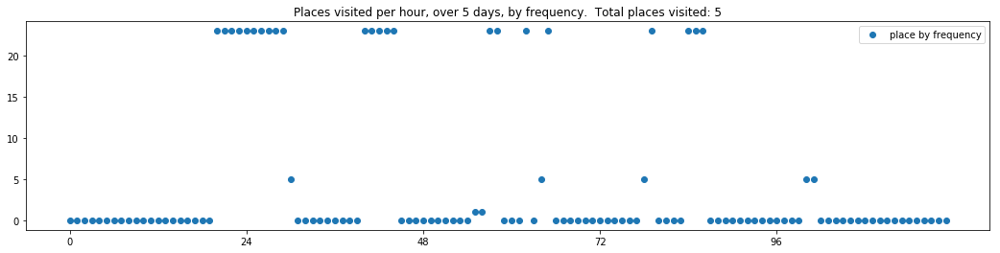

----- vector ----
prefix labels:  [255, 528]
[0, 0, 0, 0, 0, 0, 0, 528, 528, 528, 528, 0, 528, 528, 0, 0, 0, 0, 0, 0, 255, 255, 255, 255]
[255, 255, 255, 255, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 255, 255, 255, 255, 255]
[255, 255, 255, 255, 255, 255, 0, 0, 0, 0, 0, 528, 528, 0, 0, 0, 0, 0, 0, 0, 255, 255, 255, 255]
[255, 255, 255, 255, 255, 255, 528, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 255, 255, 0, 0, 0, 0, 0, 0, 528, 0, 0, 0, 0, 0, 0, 255, 0, 0, 0, 0, 0]


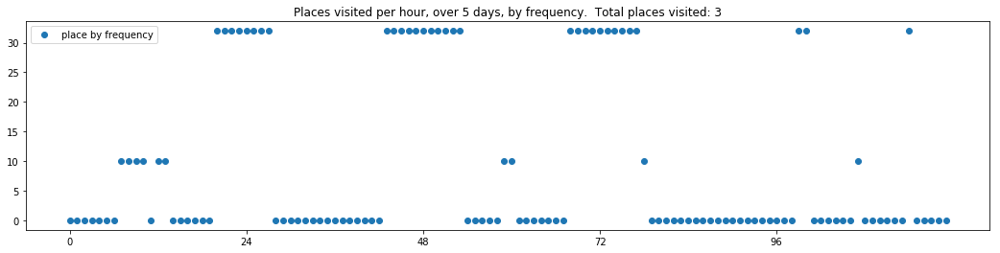

----- vector ----
prefix labels:  [560, 560]
[0, 0, 0, 0, 0, 0, 0, 0, 560, 560, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 20, 20, 20, 20, 20, 20, 20, 20, 20, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


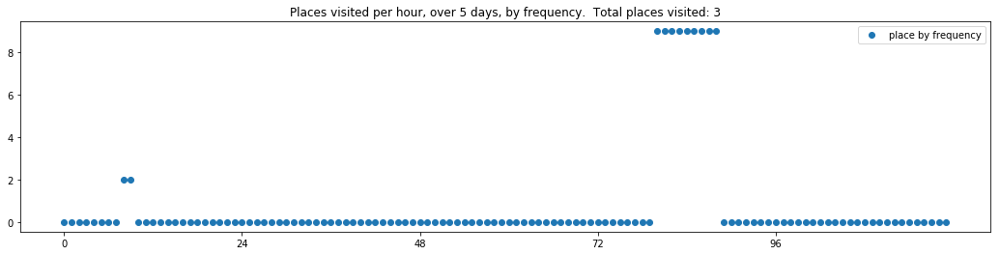

----- vector ----
prefix labels:  [39, 39]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 39, 39, 39, 39, 39, 39, 39, 39, 39, 370, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 39, 39, 0, 0, 0, 39, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 39, 39, 39, 39, 39, 39, 39, 39, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


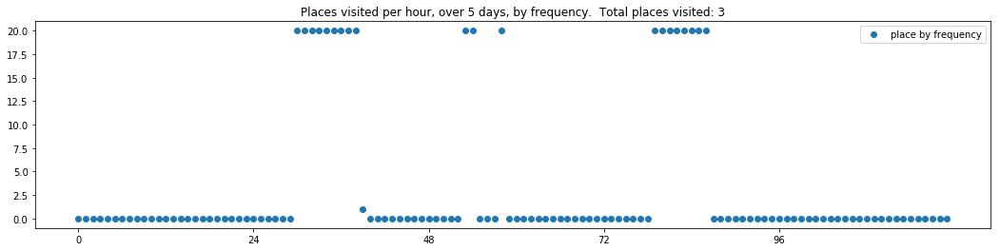

----- vector ----
prefix labels:  [547, 547]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 547, 547, 547, 547, 547, 547, 547, 547, 547, 547, 547, 547, 547]
[547, 547, 547, 547, 547, 547, 547, 547, 547, 547, 547, 547, 547, 547, 547, 547, 547, 0, 547, 547, 547, 547, 547, 547]
[547, 547, 547, 547, 0, 547, 547, 547, 547, 547, 547, 547, 547, 547, 547, 547, 547, 547, 547, 547, 547, 547, 547, 547]
[547, 547, 547, 547, 547, 547, 547, 547, 547, 547, 547, 547, 547, 547, 547, 547, 547, 547, 547, 547, 547, 547, 547, 547]
[547, 547, 547, 547, 547, 547, 547, 547, 547, 547, 0, 547, 547, 547, 547, 547, 547, 547, 547, 547, 547, 547, 547, 547]


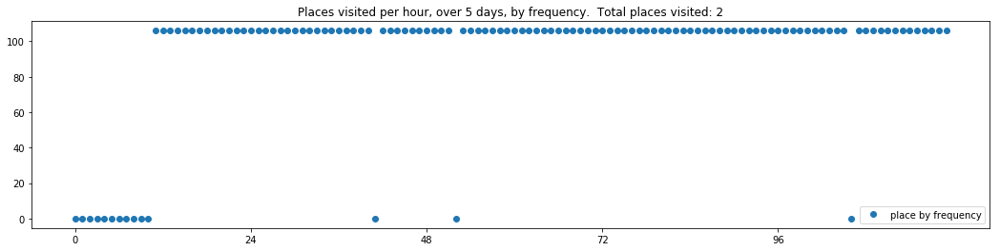

----- vector ----
prefix labels:  [70, 70]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 70, 70, 70, 70, 70, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 70, 70, 70, 70, 70, 70, 70, 70, 70, 39, 39, 39, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 70, 70, 70, 70, 70, 70, 70, 70, 70, 39, 39, 39, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 70, 70, 70, 70, 70, 39, 39, 39, 39, 0, 0, 0, 0, 0]


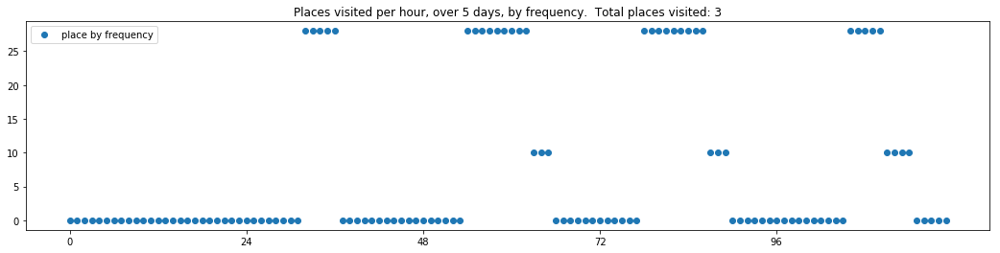

----- vector ----
prefix labels:  [611, 611]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611]
[611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611]
[611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611]
[611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611]
[611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611]


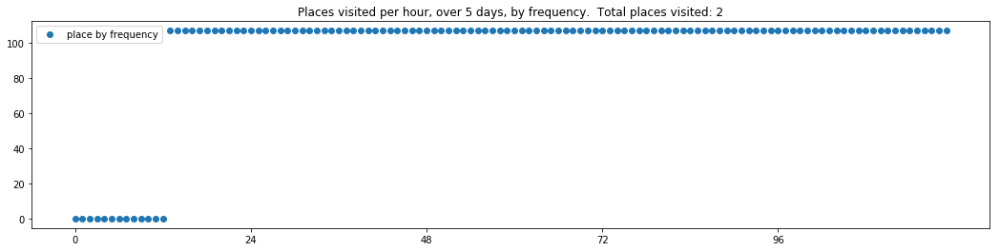

----- vector ----
prefix labels:  [79, 79]
[0, 0, 0, 0, 0, 0, 5, 5, 0, 79, 79, 79, 79, 79, 261, 261, 79, 358, 358, 79, 79, 79, 79, 79]
[79, 79, 79, 79, 79, 79, 79, 5, 79, 79, 79, 79, 79, 79, 79, 79, 79, 457, 334, 334, 457, 79, 79, 79]
[79, 79, 79, 79, 79, 79, 79, 5, 79, 79, 79, 79, 79, 79, 139, 139, 139, 139, 79, 79, 79, 79, 79, 79]
[79, 79, 79, 79, 79, 79, 79, 79, 79, 79, 79, 79, 79, 79, 139, 139, 139, 139, 79, 79, 79, 79, 79, 79]
[79, 139, 139, 139, 139, 139, 139, 139, 139, 139, 139, 139, 139, 139, 139, 139, 139, 139, 79, 79, 79, 79, 79, 79]


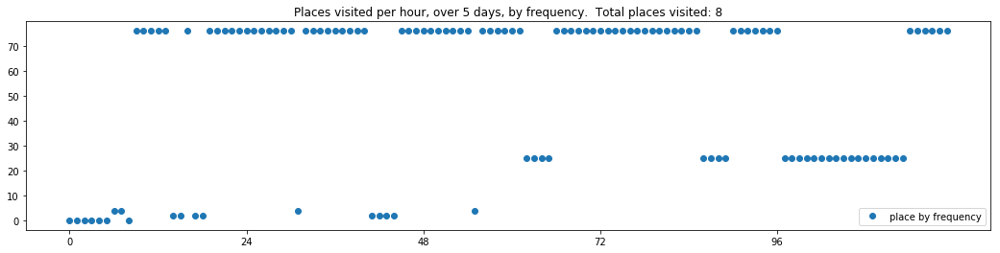

----- vector ----
prefix labels:  [222, 222]
[0, 0, 0, 0, 0, 0, 0, 69, 69, 69, 69, 69, 69, 69, 69, 69, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 600, 600]
[600, 600, 600, 600, 600, 600, 600, 600, 600, 600, 600, 0, 427, 427, 427, 427, 427, 427, 427, 0, 600, 600, 600, 600]


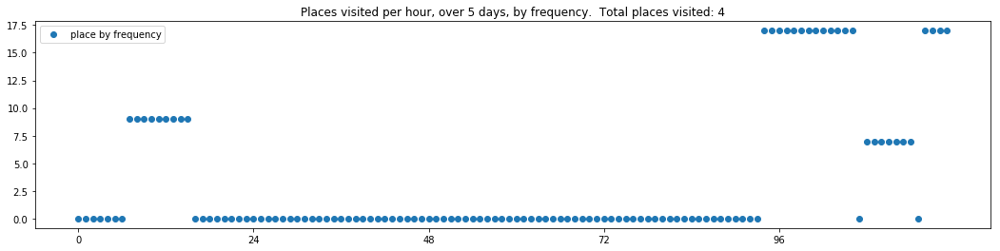

----- vector ----
prefix labels:  [24, 24]
[0, 0, 0, 0, 0, 0, 0, 0, 24, 24, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 162, 162, 7, 7, 204, 204, 204, 204, 204, 204, 204, 204, 204, 204, 204, 204, 204, 204, 204, 204, 204, 204, 204]
[204, 204, 353, 353, 204, 204, 204, 204, 204, 204, 204, 204, 204, 204, 204, 204, 0, 0, 0, 0, 0, 0, 0, 0]


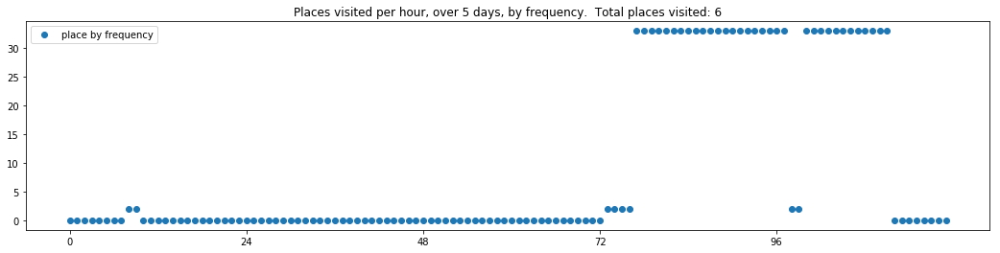

----- vector ----
prefix labels:  [6, 6]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6]
[6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6, 6, 6, 6, 6, 6, 6, 6, 6]
[0, 0, 0, 0, 0, 6, 6, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6, 6, 6, 6, 6, 6, 6]


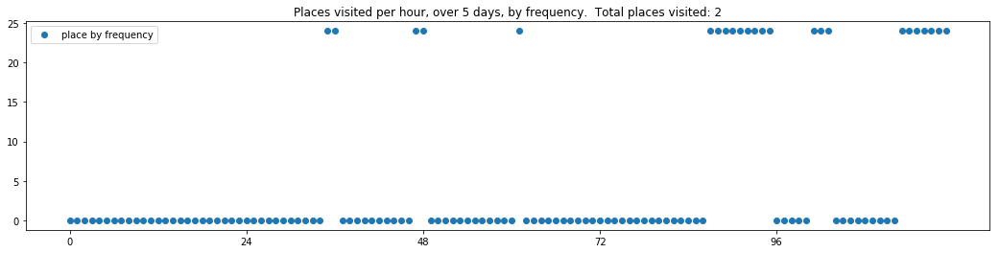

----- vector ----
prefix labels:  [496, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 496, 496, 496, 496]
[496, 496, 496, 496, 496, 496, 496, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 496, 496, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 496, 496, 496, 496]
[496, 496, 496, 496, 496, 496, 496, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 496, 0, 0]


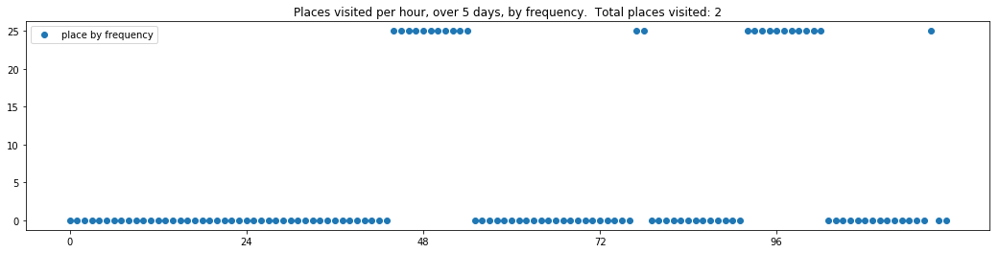

----- vector ----
prefix labels:  [395, 395]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 404, 0, 0, 0, 0, 0, 395, 395, 395, 395, 395, 395, 395, 0, 395, 395, 395]
[395, 0, 0, 162, 162, 0, 0, 0, 0, 0, 0, 395, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 395, 395, 0, 0, 0, 0, 395, 395, 395, 395, 395, 395, 395, 395, 395, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 84]


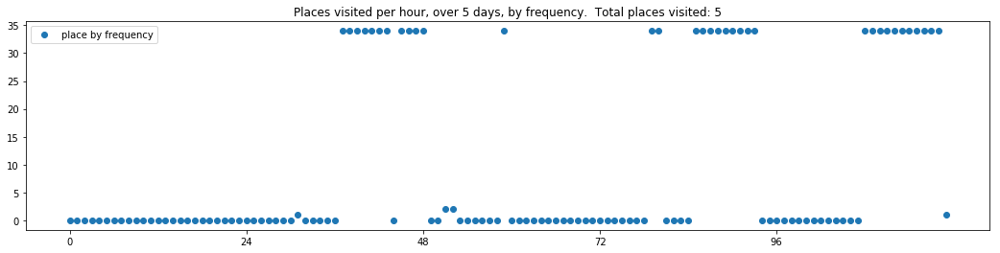

----- vector ----
prefix labels:  [22, 22]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 21, 21, 21, 21, 21, 21, 21, 21, 21, 0, 21, 469, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 21, 21, 21, 21, 21, 21, 21, 21, 21, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 21, 21, 21, 21, 21, 21, 21, 21, 21, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


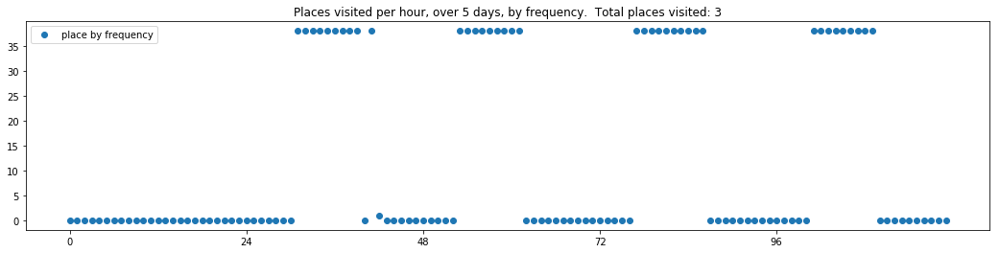

showing sample of trajectories from output with temp 1.0
----- vector ----
prefix labels:  [266, 266]
[0, 0, 0, 0, 0, 266, 266, 266, 266, 266, 266, 266, 266, 0, 0, 231, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 266, 266, 266, 266, 266, 266, 266, 266, 266, 266, 266, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 266, 266, 266, 266, 266, 266, 266, 266, 266, 266, 266, 266, 266, 266, 266]
[266, 266, 266, 266, 266, 0, 266, 266, 0, 0, 247, 0, 0, 266, 266, 266, 266, 266, 266, 266, 266, 266, 266, 266]
[266, 0, 0, 0, 0, 0, 553, 553, 553, 284, 284, 266, 266, 266, 266, 266, 266, 266, 266, 266, 266, 266, 266, 266]


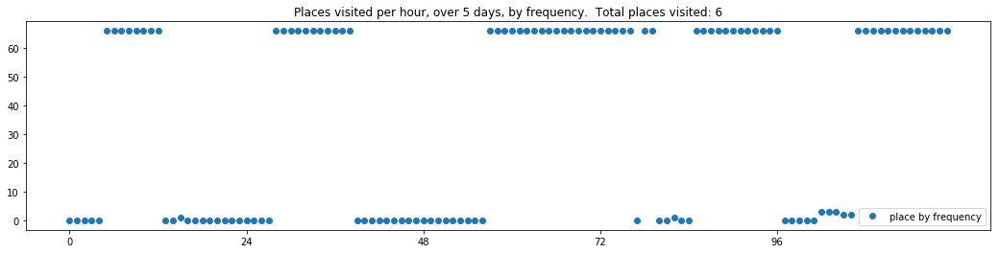

----- vector ----
prefix labels:  [158, 401]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 158, 160, 160, 158, 158, 158]
[158, 158, 158, 158, 158, 158, 158, 158, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 160, 158, 158]
[158, 158, 158, 158, 158, 158, 158, 158, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 158, 158, 158]
[158, 158, 158, 158, 158, 158, 158, 158, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 158, 158, 158, 158, 158, 158, 158, 158, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 158, 158, 158]


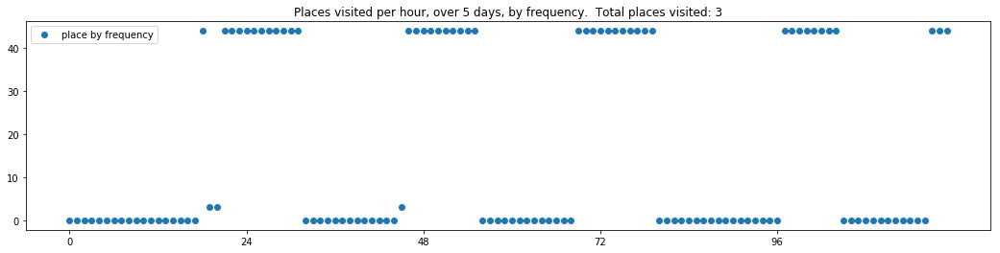

----- vector ----
prefix labels:  [229, 229]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 229, 229, 229, 114, 114, 271, 271, 271, 271, 271, 271]
[271, 271, 271, 271, 271, 271, 271, 114, 114, 114, 114, 229, 229, 229, 229, 229, 229, 229, 271, 271, 271, 271, 271, 271]
[271, 271, 271, 271, 271, 0, 0, 0, 114, 114, 114, 114, 114, 114, 0, 0, 0, 0, 271, 271, 271, 271, 271, 271]
[271, 271, 271, 271, 271, 271, 271, 0, 0, 0, 0, 0, 0, 0, 0, 114, 114, 114, 271, 288, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 114, 114, 114, 0, 0, 0, 271, 271, 307, 271, 271, 271, 271, 271, 271, 271, 271]


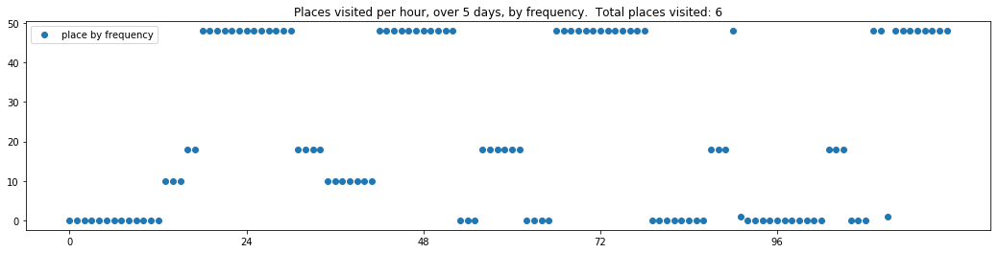

----- vector ----
prefix labels:  [335, 183]
[0, 0, 0, 0, 0, 0, 0, 183, 183, 183, 183, 183, 183, 183, 183, 183, 0, 335, 335, 335, 335, 335, 335, 335]
[335, 335, 335, 335, 335, 335, 335, 183, 183, 183, 183, 183, 183, 183, 183, 335, 335, 335, 335, 373, 373, 335, 335, 335]
[335, 335, 335, 335, 335, 335, 335, 335, 183, 183, 183, 183, 183, 183, 183, 335, 335, 335, 335, 335, 335, 335, 335, 335]
[335, 335, 335, 335, 335, 335, 335, 335, 335, 183, 183, 183, 183, 183, 183, 335, 335, 335, 335, 335, 335, 335, 335, 335]
[335, 335, 335, 335, 335, 335, 335, 335, 183, 183, 183, 183, 183, 183, 183, 183, 335, 335, 335, 335, 335, 335, 335, 335]


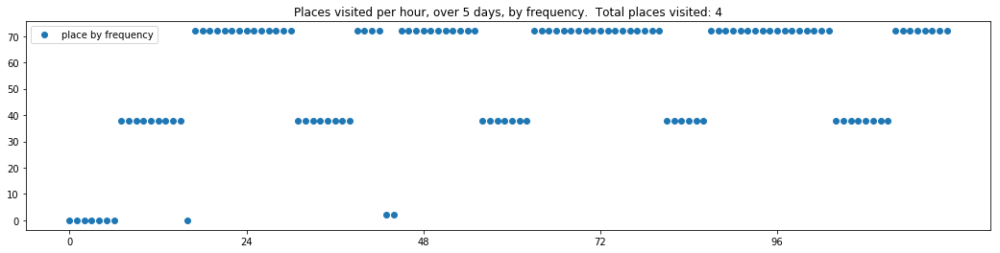

----- vector ----
prefix labels:  [162, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 70, 70, 70, 70, 70, 70, 70, 70, 0, 186, 186, 186, 186, 186, 186, 186, 186, 186]
[186, 186, 186, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 186, 186, 186, 186, 186, 186, 32, 186, 186]
[186, 186, 186, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 186]


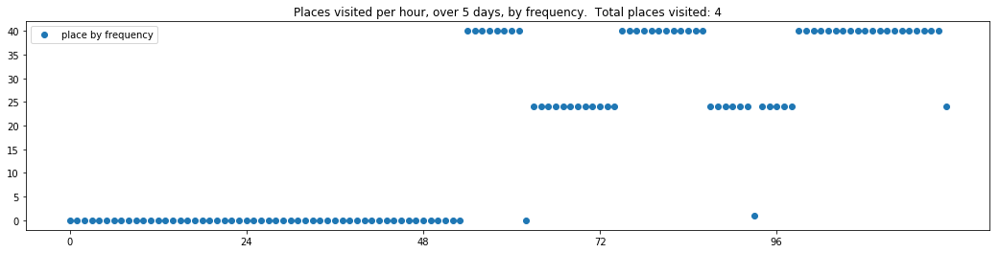

----- vector ----
prefix labels:  [79, 79]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 401, 401, 79, 79, 79, 79, 79, 79]
[79, 79, 79, 79, 79, 79, 79, 79, 79, 79, 79, 79, 79, 79, 79, 79, 79, 79, 6, 6, 79, 79, 79, 79]
[79, 79, 79, 79, 79, 79, 79, 79, 79, 79, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


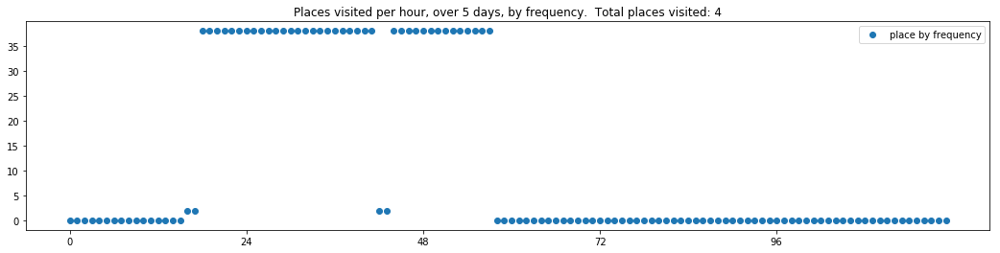

----- vector ----
prefix labels:  [237, 568]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 568, 568, 568, 247, 247, 247, 568, 568, 0, 237, 237, 237]
[237, 237, 237, 237, 237, 237, 237, 237, 237, 237, 237, 237, 568, 568, 568, 568, 568, 568, 568, 568, 0, 237, 237, 237]
[237, 237, 237, 237, 237, 237, 237, 237, 237, 237, 237, 237, 568, 247, 568, 546, 286, 0, 286, 147, 147, 147, 536, 536]
[237, 237, 237, 237, 237, 237, 237, 237, 237, 237, 237, 237, 568, 568, 568, 568, 568, 568, 568, 237, 237, 237, 237, 237]


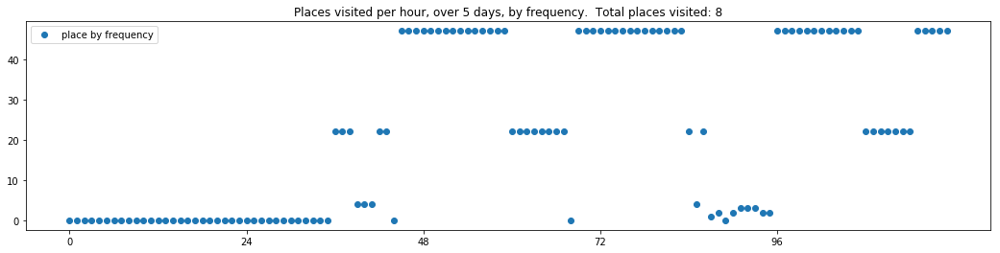

----- vector ----
prefix labels:  [102, 102]
[0, 0, 0, 0, 0, 0, 0, 102, 0, 390, 0, 0, 0, 0, 0, 0, 102, 102, 102, 102, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 102, 102, 102, 102, 102, 102, 102]
[102, 102, 102, 102, 102, 102, 0, 390, 390, 390, 390, 390, 390, 390, 0, 0, 102, 102, 102, 102, 102, 102, 102, 102]
[102, 102, 102, 102, 102, 102, 102, 0, 0, 0, 0, 0, 0, 0, 0, 0, 102, 102, 102, 102, 102, 102, 102, 102]
[102, 102, 102, 102, 102, 102, 102, 0, 0, 0, 0, 0, 0, 0, 0, 0, 102, 102, 102, 102, 102, 102, 102, 102]


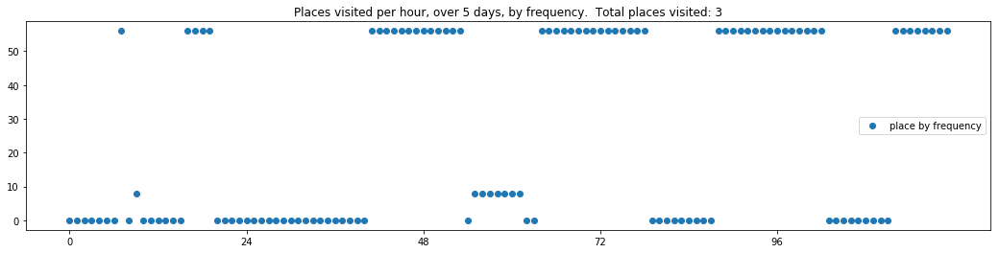

----- vector ----
prefix labels:  [21, 21]
[0, 0, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 8, 8, 8, 8, 21, 21]
[21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 21, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 21, 21, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


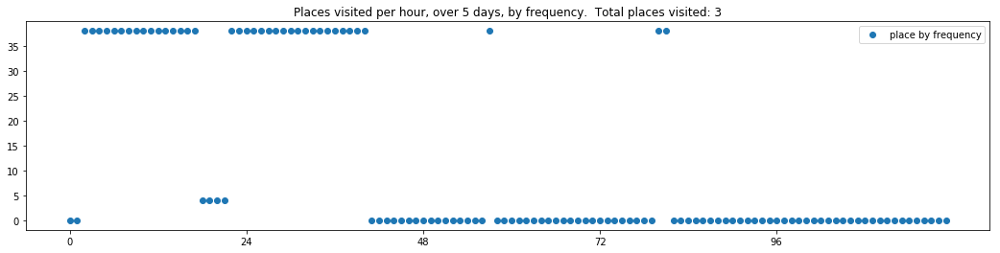

----- vector ----
prefix labels:  [289, 289]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 539, 289, 289, 289, 289, 289, 289, 289, 289, 289, 289, 289, 289]
[289, 289, 289, 289, 289, 289, 289, 289, 289, 289, 289, 289, 289, 289, 289, 289, 289, 0, 0, 0, 0, 289, 289, 289]
[289, 289, 289, 289, 289, 289, 289, 289, 289, 289, 289, 431, 431, 431, 431, 431, 431, 431, 431, 431, 289, 289, 289, 289]
[0, 0, 0, 0, 0, 0, 0, 367, 396, 396, 396, 513, 513, 513, 0, 0, 289, 289, 289, 289, 289, 289, 289, 289]
[289, 289, 289, 289, 289, 289, 289, 289, 289, 289, 289, 431, 431, 0, 0, 0, 431, 0, 0, 0, 289, 173, 289, 289]


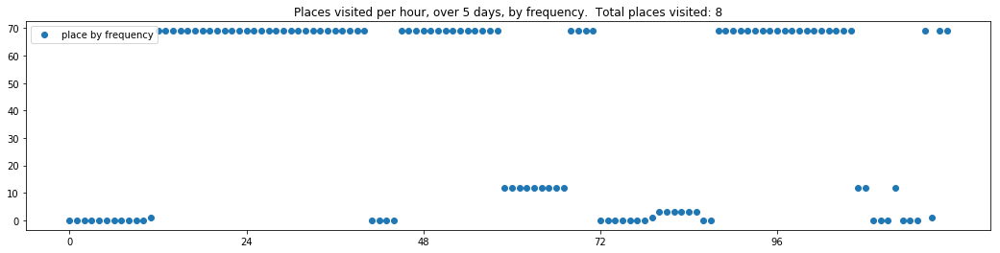

----- vector ----
prefix labels:  [615, 508]
[0, 0, 0, 0, 0, 0, 615, 615, 615, 615, 615, 615, 615, 615, 568, 568, 568, 568, 568, 0, 376, 376, 615, 615]
[615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 0, 479, 615, 615, 615, 615]
[615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 0, 162, 162, 162, 162, 162, 615, 479, 320, 320, 320]
[479, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 303, 479]
[479, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 454, 0, 162, 162, 162, 162, 59, 0, 479, 615, 615, 615]


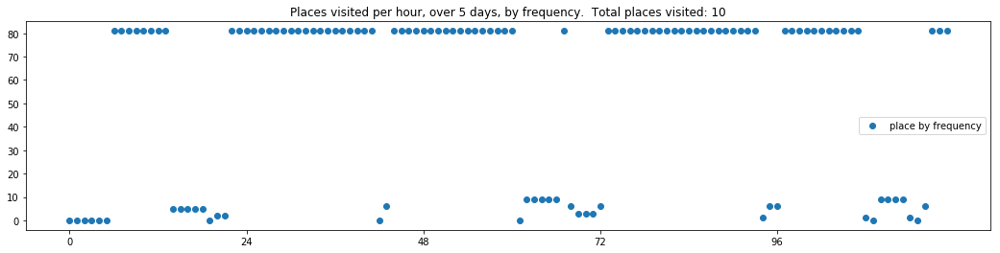

----- vector ----
prefix labels:  [474, 474]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 474, 474, 474, 474, 474]
[474, 474, 474, 474, 474, 474, 307, 307, 307, 69, 69, 74, 569, 21, 0, 0, 0, 0, 0, 307, 474, 474, 474, 474]
[474, 474, 474, 474, 474, 474, 0, 0, 98, 8, 474, 474, 21, 569, 474, 474, 474, 474, 474, 474, 474, 474, 474, 474]
[474, 474, 474, 474, 474, 474, 474, 0, 0, 8, 8, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 474, 474]
[474, 474, 474, 474, 474, 474, 474, 474, 307, 375, 375, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 474, 474, 474]


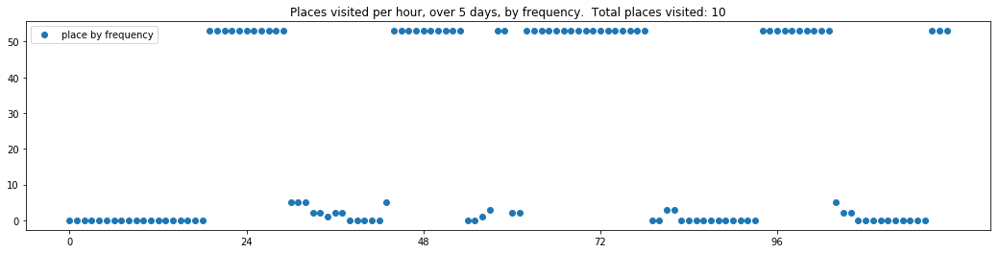

----- vector ----
prefix labels:  [22, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 22, 0, 22, 22]
[22, 0, 185, 185, 185, 185, 185, 185, 185, 185, 185, 185, 185, 185, 185, 0, 22, 22, 22, 22, 22, 22, 22, 22]
[22, 22, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22]
[22, 22, 22, 21, 21, 185, 185, 21, 21, 21, 21, 21, 21, 22, 0, 0, 22, 22, 22, 22, 22, 22, 22, 22]


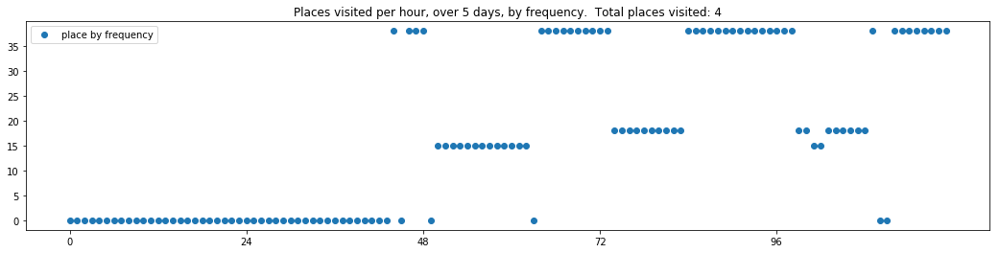

----- vector ----
prefix labels:  [232, 475]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 82, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 475, 475, 475, 475, 475, 475, 0, 0, 0, 0, 0, 232, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 475, 475, 475, 475, 0, 0, 0, 0, 0, 0, 0, 0, 518, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 475, 475, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 518, 187, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 518, 518, 0, 0, 0, 0]


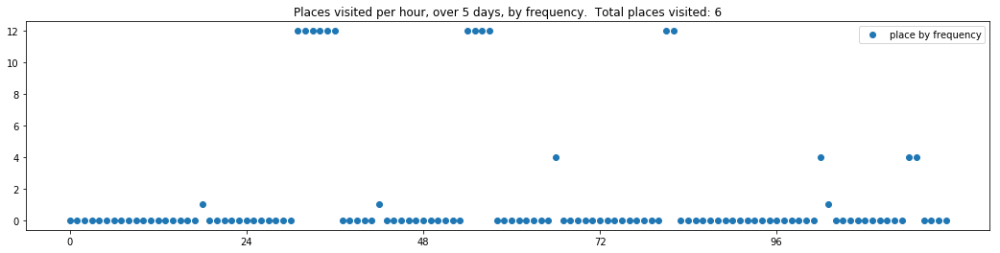

----- vector ----
prefix labels:  [25, 25]
[0, 0, 0, 0, 0, 0, 0, 25, 0, 0, 0, 0, 0, 25, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 25, 25, 25, 25]
[25, 25, 25, 25, 25, 25, 25, 25, 25, 0, 0, 0, 0, 0, 25, 25, 0, 0, 25, 25, 25, 25, 25, 25]
[25, 25, 25, 25, 25, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 25, 25, 25, 0, 0, 0, 0, 0, 25]
[25, 25, 25, 25, 25, 0, 0, 0, 0, 25, 25, 25, 25, 0, 0, 25, 25, 25, 25, 25, 25, 25, 25, 25]


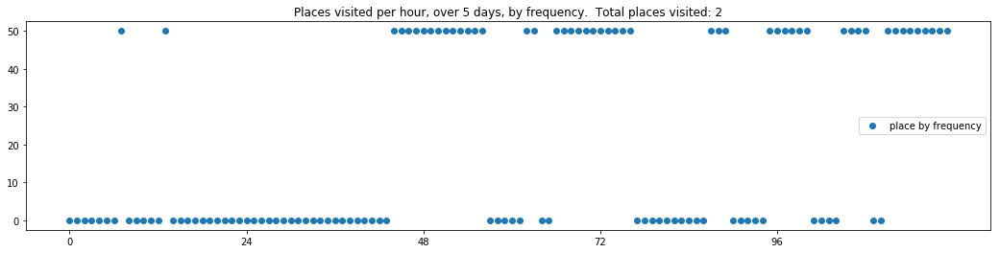

----- vector ----
prefix labels:  [358, 358]
[0, 0, 0, 0, 0, 0, 0, 0, 20, 20, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 358, 358, 358, 358, 247, 247, 87, 358, 358, 358, 358, 358, 358, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 358, 358, 357, 0, 0, 0, 255, 358, 358, 358, 358, 358, 358, 358, 116, 116, 358, 358, 358, 358]
[358, 358, 358, 358, 358, 0, 0, 0, 0, 0, 0, 0, 358, 358, 358, 358, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 358, 0, 0, 0, 429, 0, 358, 358, 358, 358, 0, 0, 0, 0, 0, 0, 0, 0]


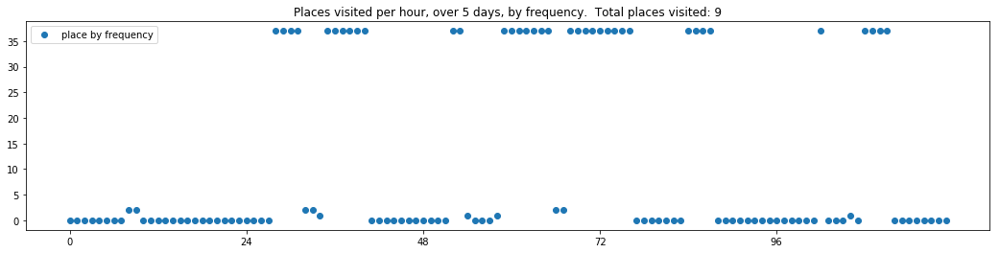

----- vector ----
prefix labels:  [457, 586]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 457, 457, 457]
[457, 457, 457, 457, 457, 457, 457, 0, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 0, 457]
[457, 457, 457, 457, 457, 457, 457, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 116, 2, 2]
[2, 401, 457, 457, 457, 457, 457, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 401, 2, 457]
[457, 457, 457, 457, 457, 457, 457, 457, 116, 116, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 2, 2, 2]


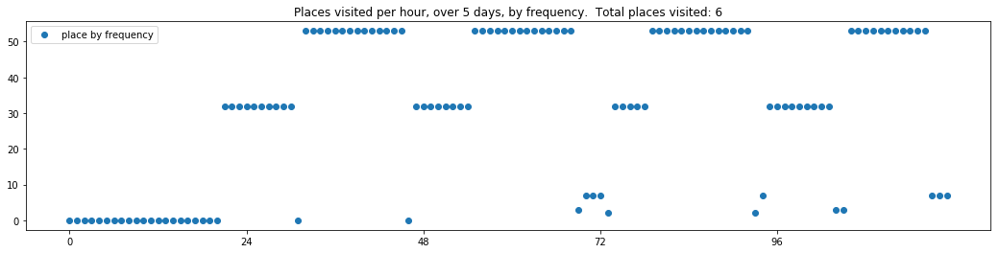

----- vector ----
prefix labels:  [289, 270]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 270, 270, 270, 270, 270, 270, 270, 270, 270, 289, 289, 289, 289, 289]
[289, 289, 289, 289, 289, 289, 289, 289, 289, 270, 270, 270, 270, 270, 270, 270, 270, 270, 289, 289, 289, 289, 289, 289]
[289, 289, 289, 289, 289, 289, 289, 289, 289, 270, 270, 270, 410, 163, 163, 163, 289, 289, 289, 289, 289, 0, 0, 289]
[289, 289, 289, 289, 289, 289, 289, 289, 289, 270, 270, 260, 260, 0, 0, 0, 0, 289, 289, 289, 289, 0, 0, 0]
[0, 0, 289, 289, 289, 289, 289, 289, 0, 387, 260, 260, 260, 260, 260, 0, 0, 289, 289, 289, 289, 289, 289, 289]


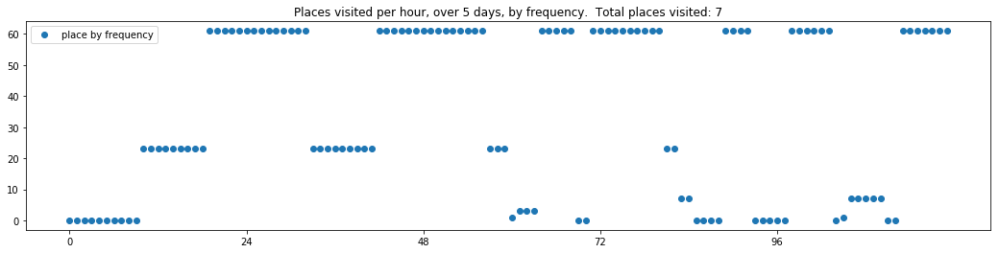

----- vector ----
prefix labels:  [50, 573]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 50, 50, 573, 573, 573, 573, 573, 50, 50, 50, 50, 50, 50, 50]
[50, 50, 50, 50, 50, 50, 50, 50, 50, 573, 573, 573, 573, 573, 573, 573, 573, 50, 50, 50, 50, 50, 50, 50]
[50, 50, 50, 50, 50, 50, 50, 50, 573, 573, 573, 573, 573, 573, 573, 573, 485, 485, 485, 485, 485, 485, 50, 50]
[50, 50, 50, 50, 50, 50, 50, 50, 50, 573, 573, 573, 573, 573, 573, 573, 485, 485, 485, 485, 485, 485, 50, 50]
[50, 50, 50, 50, 50, 50, 50, 50, 573, 573, 573, 573, 573, 573, 573, 573, 485, 485, 485, 485, 485, 485, 50, 50]


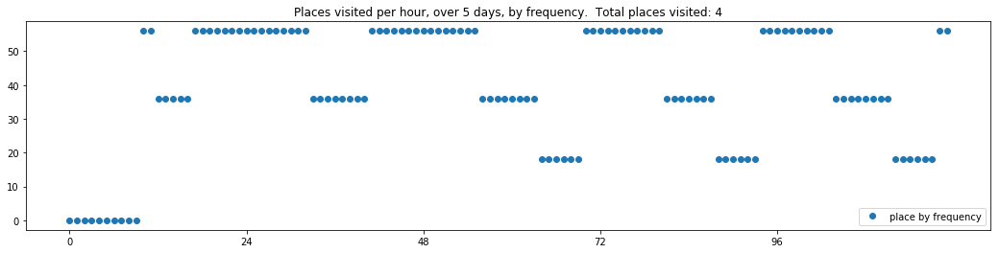

----- vector ----
prefix labels:  [39, 324]
[0, 0, 0, 0, 0, 0, 324, 324, 324, 324, 0, 0, 0, 0, 500, 500, 0, 39, 39, 39, 39, 39, 39, 39]
[39, 39, 39, 39, 39, 0, 324, 324, 324, 324, 324, 324, 0, 0, 0, 500, 39, 39, 39, 39, 39, 39, 39, 39]
[39, 39, 39, 39, 39, 324, 324, 324, 324, 0, 324, 324, 24, 0, 500, 500, 39, 39, 39, 39, 39, 39, 39, 39]
[39, 39, 39, 39, 39, 0, 324, 324, 324, 324, 324, 324, 0, 400, 500, 500, 0, 39, 39, 39, 39, 39, 39, 39]
[39, 39, 39, 39, 39, 0, 0, 0, 586, 586, 586, 324, 324, 324, 630, 630, 630, 39, 39, 39, 39, 39, 39, 39]


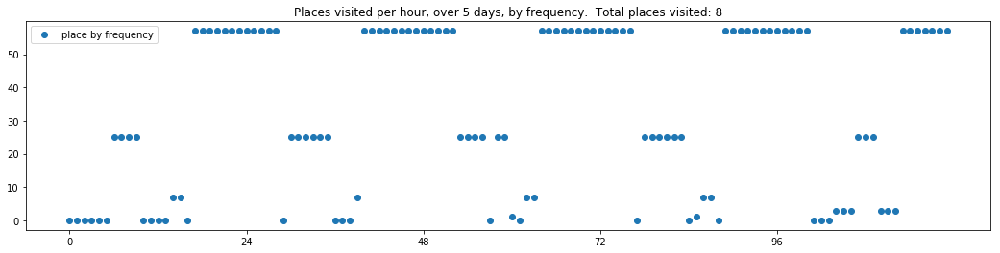

----- vector ----
prefix labels:  [134, 388]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 388, 388, 388, 388, 388, 388, 388, 388, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 150, 150, 150, 150, 150, 134, 134, 134]
[84, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 388, 388, 0, 0, 0, 388, 388, 388, 388, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 239, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 388, 388, 388, 0, 0, 0, 0]


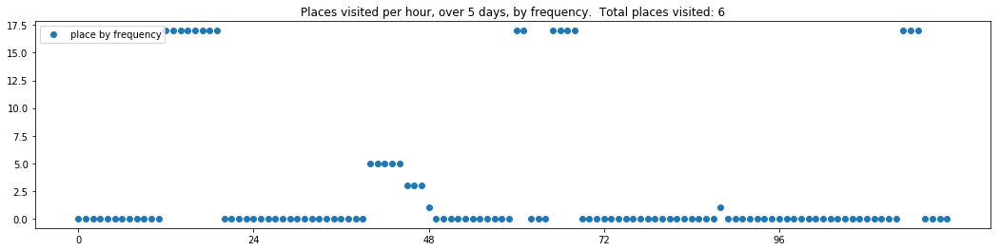

----- vector ----
prefix labels:  [599, 56]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 599, 599]
[599, 599, 599, 599, 0, 0, 56, 56, 56, 56, 56, 56, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 386, 56, 56, 386, 56, 56, 56, 56, 386, 386, 0, 0, 599, 599, 599, 599, 599]
[599, 599, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 599, 599, 599, 0]


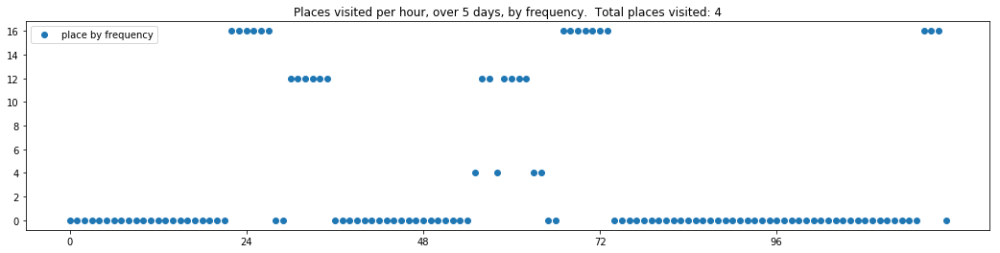

----- vector ----
prefix labels:  [419, 162]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 208, 162, 162, 162, 162, 0, 0, 0, 0, 0, 419, 419, 419, 419, 419]
[419, 419, 419, 419, 419, 419, 419, 419, 162, 162, 162, 162, 162, 162, 162, 162, 162, 162, 162, 162, 0, 0, 0, 0]
[0, 0, 0, 0, 419, 419, 419, 419, 419, 419, 0, 0, 0, 0, 0, 0, 22, 162, 162, 162, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 162, 0, 162, 162, 162, 162, 162, 162, 162, 162, 162, 162, 162, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 419, 419, 0, 0, 0, 162, 162, 162, 162, 162, 162, 162, 162, 162, 162, 162, 162, 162, 162]


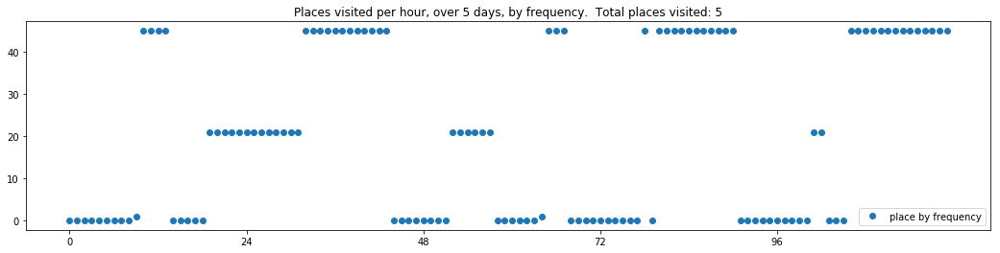

----- vector ----
prefix labels:  [206, 206]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 151, 0, 0, 0, 0, 206, 206, 206, 206, 206, 206, 206, 206, 206]
[206, 206, 206, 206, 206, 206, 206, 206, 206, 206, 206, 0, 206, 206, 206, 206, 206, 206, 206, 206, 206, 206, 206, 206]
[206, 206, 206, 206, 0, 0, 0, 0, 0, 420, 420, 420, 420, 420, 0, 206, 206, 206, 206, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 206, 186, 186, 186, 0, 0, 0, 0, 206, 206, 153, 153, 153, 153, 153, 153, 153, 153, 153]
[153, 153, 153, 153, 0, 0, 186, 186, 0, 186, 186, 186, 186, 206, 206, 0, 153, 153, 153, 153, 153, 153, 153, 153]


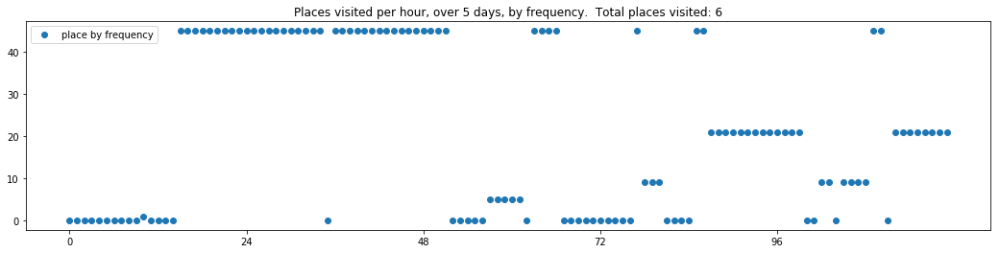

----- vector ----
prefix labels:  [480, 404]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 404, 404, 404, 404, 404, 404, 404, 404, 404, 404, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 404, 404, 404, 404, 404, 404, 404, 404, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 84, 404, 404, 404, 404, 404, 404, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


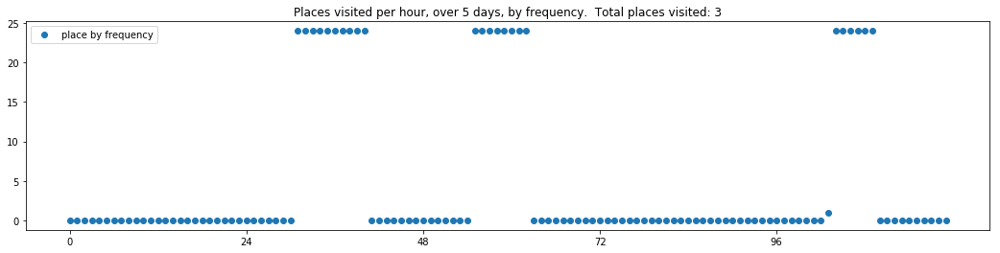

----- vector ----
prefix labels:  [332, 332]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 124, 332, 0, 0, 0, 526, 237, 0, 0, 0, 0, 332, 332, 332, 332]
[332, 332, 332, 332, 332, 332, 332, 332, 332, 332, 332, 332, 332, 332, 10, 0, 332, 332, 332, 0, 332, 332, 332, 332]
[332, 332, 332, 332, 332, 332, 332, 332, 332, 332, 332, 332, 332, 332, 332, 332, 332, 332, 332, 332, 332, 332, 332, 332]
[332, 332, 332, 332, 332, 332, 332, 332, 332, 332, 332, 332, 19, 19, 19, 19, 332, 332, 332, 332, 332, 332, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


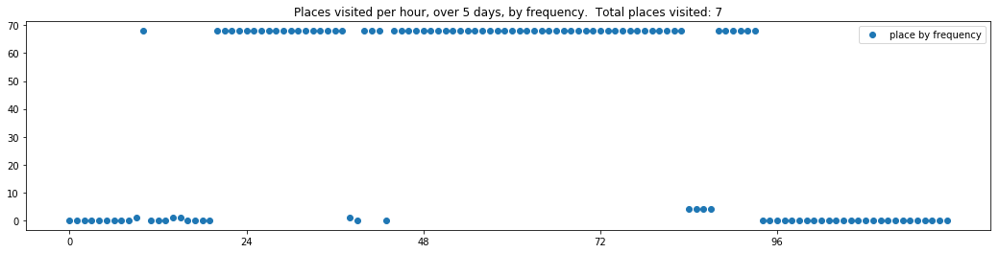

----- vector ----
prefix labels:  [275, 275]
[0, 0, 0, 0, 0, 0, 0, 0, 247, 247, 158, 158, 158, 158, 158, 158, 158, 597, 275, 275, 275, 275, 275, 275]
[275, 275, 275, 275, 275, 275, 275, 0, 0, 597, 597, 597, 597, 597, 597, 597, 597, 597, 275, 275, 275, 275, 275, 275]
[275, 275, 275, 275, 275, 275, 275, 275, 275, 118, 0, 597, 597, 597, 597, 597, 597, 275, 275, 275, 275, 275, 275, 275]
[275, 275, 275, 275, 275, 275, 275, 275, 275, 0, 0, 275, 0, 597, 275, 0, 0, 0, 0, 0, 275, 275, 275, 275]
[275, 275, 275, 275, 275, 275, 275, 275, 275, 275, 597, 597, 565, 0, 0, 0, 413, 275, 275, 0, 275, 275, 275, 0]


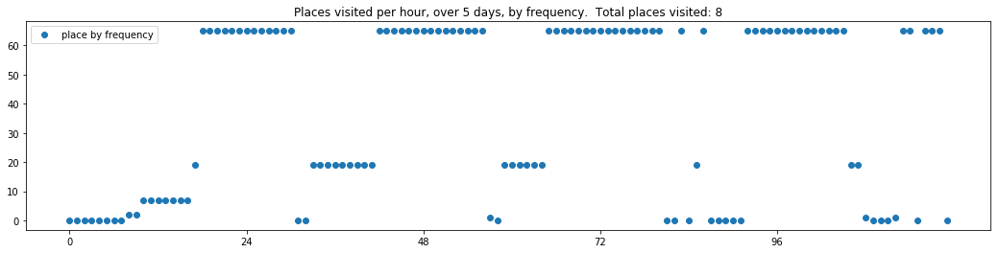

----- vector ----
prefix labels:  [590, 88]
[0, 0, 0, 0, 0, 0, 0, 0, 590, 88, 88, 88, 88, 88, 88, 88, 88, 329, 0, 0, 0, 0, 590, 590]
[590, 590, 590, 590, 590, 590, 590, 590, 88, 88, 88, 88, 88, 88, 88, 0, 0, 0, 0, 590, 590, 590, 590, 590]
[590, 590, 590, 590, 590, 590, 590, 590, 590, 0, 0, 0, 88, 0, 0, 88, 88, 88, 328, 590, 590, 590, 590, 590]
[590, 590, 590, 590, 590, 590, 590, 590, 88, 88, 88, 88, 88, 88, 88, 88, 88, 88, 88, 590, 590, 590, 590, 590]
[590, 590, 590, 590, 590, 590, 0, 0, 0, 0, 327, 327, 88, 88, 88, 0, 88, 88, 88, 590, 590, 590, 590, 590]


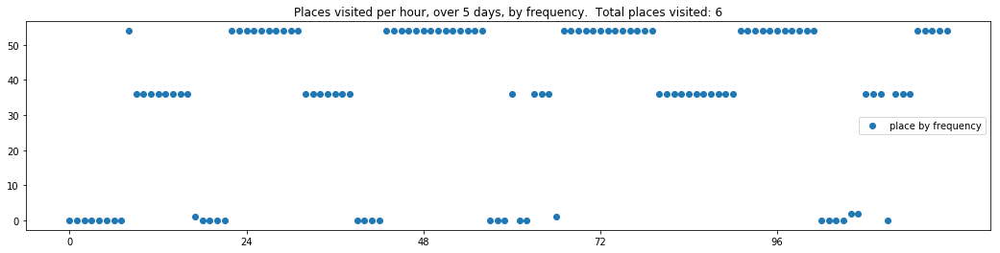

----- vector ----
prefix labels:  [341, 341]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 341, 341, 0, 0, 0, 0, 0, 0, 0, 0, 0, 341, 0, 341, 341, 341, 341]
[341, 341, 341, 341, 341, 341, 341, 341, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 341, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 341, 0, 341, 341, 341, 341, 620, 341, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 341, 341, 0, 341, 341, 341, 341, 341, 341, 341, 341, 341, 341, 0]


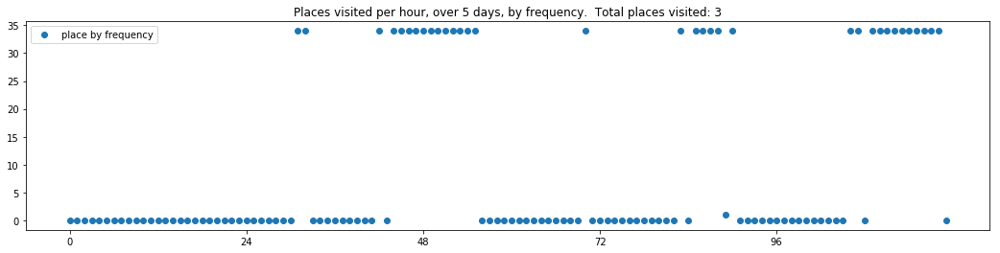

----- vector ----
prefix labels:  [84, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 177, 0, 84, 84]
[84, 84, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[84, 84, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 84, 84, 84, 84, 84, 84, 84, 84]
[84, 84, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 84, 84, 84, 84, 84, 84, 84, 84]


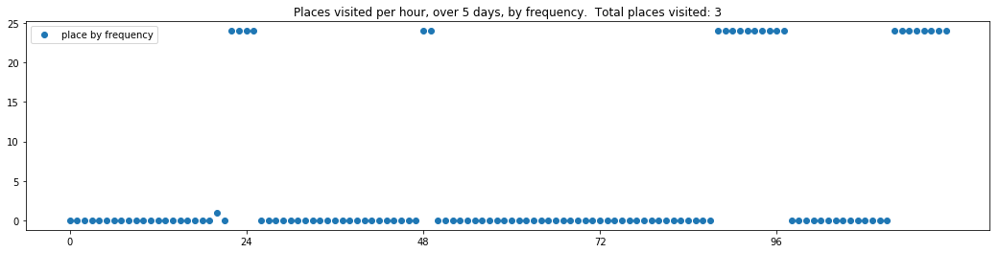

----- vector ----
prefix labels:  [164, 164]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 164, 164, 164, 164, 164, 164, 164, 164, 164, 164]
[164, 164, 164, 164, 164, 164, 164, 164, 0, 0, 0, 0, 0, 0, 0, 110, 110, 546, 164, 164, 164, 164, 164, 164]
[164, 164, 164, 164, 164, 164, 164, 164, 296, 296, 296, 296, 296, 296, 296, 296, 296, 296, 296, 296, 164, 164, 164, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 296, 296, 296, 296, 296, 296, 296, 0, 167, 0, 167, 164, 164, 164, 164, 164]
[164, 164, 164, 164, 164, 164, 164, 164, 296, 296, 296, 296, 296, 296, 296, 296, 296, 296, 296, 296, 296, 0, 164, 164]


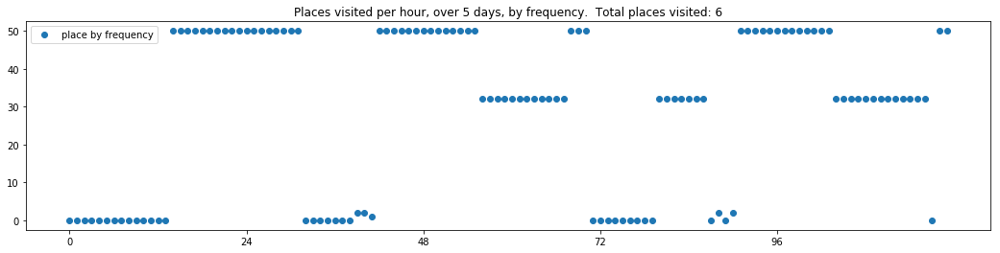

----- vector ----
prefix labels:  [31, 31]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 364, 364, 364, 0, 0, 0, 31, 31, 31, 31, 31, 31]
[31, 31, 31, 31, 31, 31, 31, 31, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 31, 31, 31, 31, 31, 31]
[31, 31, 31, 31, 31, 31, 0, 377, 0, 377, 0, 377, 0, 377, 377, 31, 31, 31, 31, 31, 31, 31, 31, 31]
[31, 31, 31, 31, 31, 31, 85, 85, 0, 0, 0, 0, 0, 0, 0, 0, 0, 31, 31, 31, 31, 31, 31, 31]
[31, 31, 31, 31, 31, 31, 31, 377, 377, 377, 0, 214, 214, 0, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31]


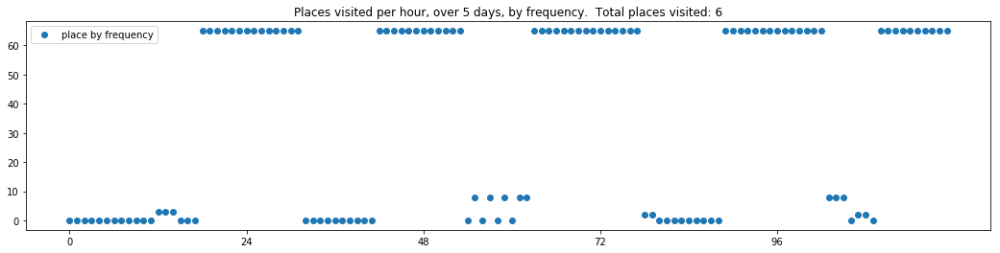

----- vector ----
prefix labels:  [458, 458]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 21]
[458, 458, 458, 458, 458, 458, 458, 458, 458, 458, 0, 458, 458, 0, 0, 0, 0, 458, 253, 0, 0, 458, 458, 458]
[0, 458, 458, 458, 458, 458, 458, 458, 458, 458, 458, 458, 458, 24, 400, 400, 0, 0, 0, 458, 458, 458, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 458, 458, 458, 0, 0, 0, 0, 0, 458, 458, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 458, 0, 400, 400, 0, 0, 0, 209, 248, 0, 0]


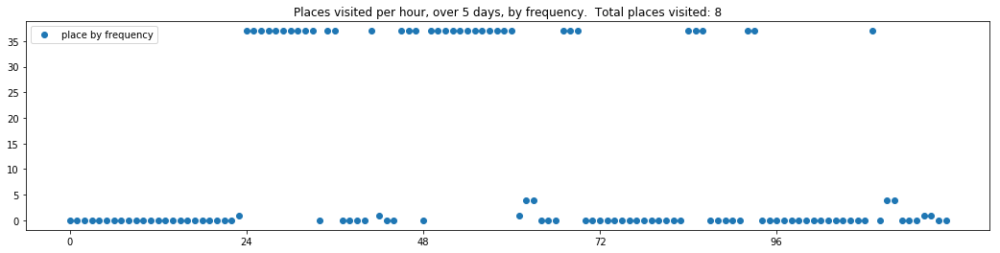

----- vector ----
prefix labels:  [340, 340]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 340, 340, 340, 340, 340, 340]
[340, 340, 340, 340, 340, 340, 340, 340, 0, 0, 0, 0, 0, 0, 0, 0, 0, 340, 0, 0, 0, 0, 340, 340]
[340, 340, 340, 340, 340, 340, 340, 340, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 340, 340]
[340, 340, 340, 340, 340, 340, 340, 340, 340, 340, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 340]
[340, 340, 340, 0, 340, 340, 340, 340, 340, 340, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 340]


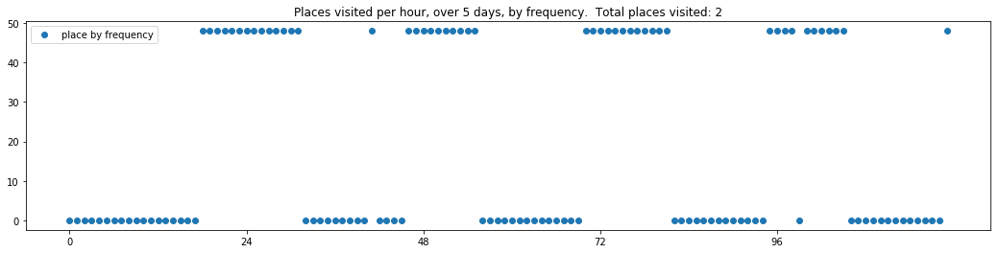

----- vector ----
prefix labels:  [47, 47]
[0, 0, 0, 0, 0, 0, 0, 47, 47, 47, 47, 47, 47, 47, 47, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 47, 47, 47, 47, 47, 47, 47, 47, 47, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 47, 47, 47, 47, 47, 47, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 47, 47, 47, 47, 47, 47, 47, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 44, 0, 0, 47, 0, 0, 47, 47, 47, 47, 47, 47, 47, 0, 0, 0, 0, 0, 0, 0, 0]


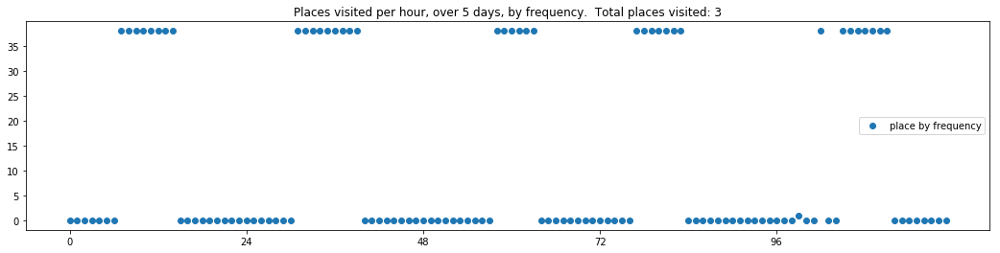

----- vector ----
prefix labels:  [73, 338]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 575, 575, 73, 73, 73, 73]
[73, 73, 73, 73, 73, 73, 73, 15, 420, 420, 261, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 73, 73]
[73, 73, 73, 73, 73, 73, 73, 73, 503, 503, 636, 73, 503, 503, 503, 503, 0, 0, 0, 0, 8, 8, 8, 73]
[73, 73, 73, 73, 73, 73, 73, 73, 503, 503, 420, 420, 503, 503, 503, 503, 8, 8, 8, 8, 8, 8, 8, 73]
[73, 73, 73, 73, 73, 73, 73, 73, 0, 83, 73, 319, 319, 503, 503, 503, 8, 8, 8, 8, 8, 8, 8, 73]


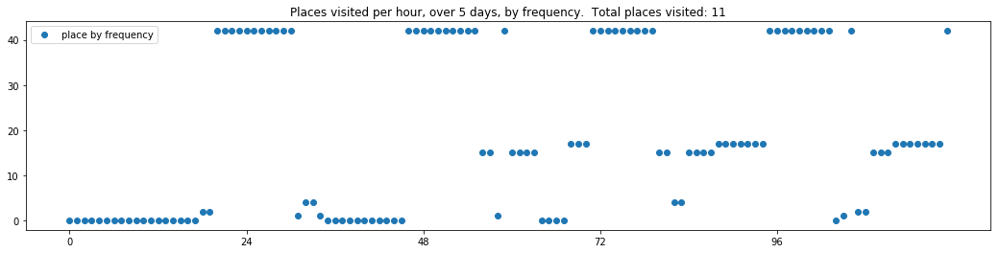

----- vector ----
prefix labels:  [134, 134]
[134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134]
[134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 0, 0, 0, 0, 0, 0, 0, 0, 404, 407, 331, 331, 0]
[0, 0, 0, 0, 134, 134, 134, 354, 354, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 8, 8, 8]
[8, 8, 8, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 84, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


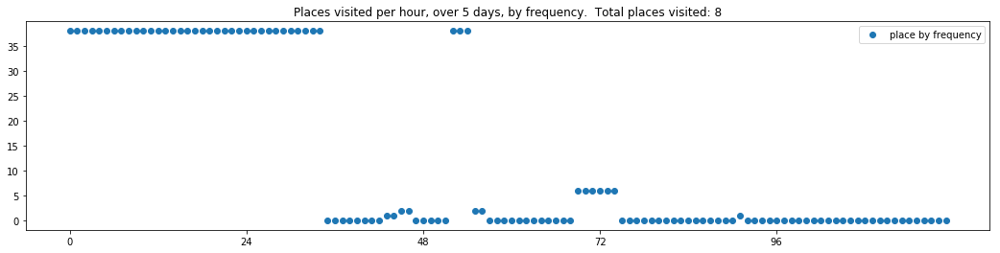

----- vector ----
prefix labels:  [171, 171]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 171, 171, 0, 269, 171, 171, 171, 171, 171, 171, 171, 171]
[171, 171, 171, 171, 171, 171, 545, 545, 0, 171, 171, 269, 0, 0, 0, 171, 171, 0, 0, 171, 171, 171, 171, 171]
[171, 171, 171, 171, 171, 171, 171, 171, 260, 260, 260, 171, 171, 0, 171, 0, 171, 171, 171, 171, 171, 171, 171, 171]
[171, 171, 171, 171, 0, 0, 0, 171, 171, 2, 2, 0, 2, 2, 0, 0, 171, 171, 171, 171, 171, 171, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 171, 0, 0, 0, 171, 171, 0, 171, 171, 171, 0, 0, 0, 0, 0, 0]


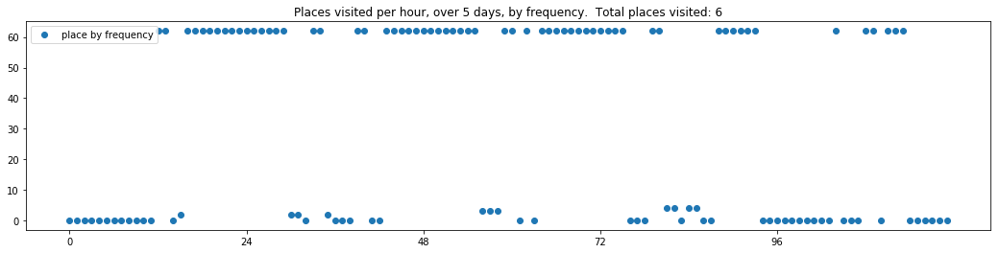

----- vector ----
prefix labels:  [637, 306]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 306, 0, 0, 306, 0, 0, 0, 306, 0, 0, 523, 523, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 306, 306, 0, 0, 0, 637, 637, 637]
[637, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 306, 306, 0, 306, 306, 306, 306, 0, 306, 306, 306, 306]
[306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 2, 2, 319, 0, 0, 0, 0, 0]
[301, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 116, 116, 116, 116, 116, 0, 0, 0]


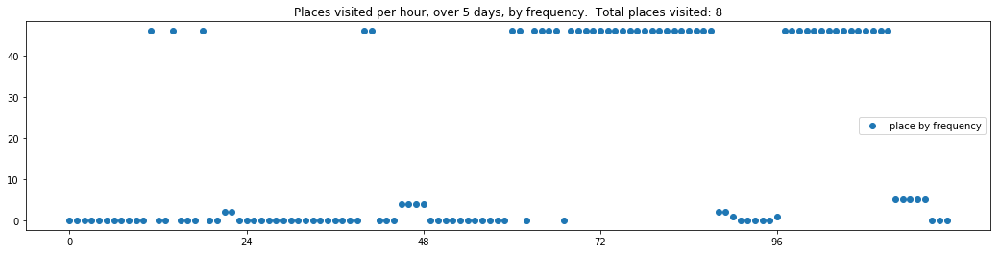

----- vector ----
prefix labels:  [568, 568]
[0, 0, 0, 0, 0, 0, 400, 22, 22, 22, 22, 22, 568, 568, 568, 568, 568, 568, 568, 568, 568, 568, 568, 568]
[568, 568, 568, 568, 568, 568, 568, 0, 0, 77, 0, 487, 487, 0, 0, 212, 0, 568, 568, 568, 568, 568, 568, 568]
[568, 568, 568, 568, 568, 568, 568, 43, 568, 568, 47, 568, 568, 568, 568, 568, 43, 568, 568, 568, 568, 568, 568, 568]
[568, 568, 568, 568, 568, 568, 565, 528, 568, 568, 568, 568, 0, 0, 562, 562, 568, 568, 568, 568, 568, 568, 568, 568]
[568, 568, 568, 568, 568, 568, 568, 568, 568, 568, 568, 0, 568, 568, 568, 568, 568, 568, 568, 568, 568, 568, 568, 568]


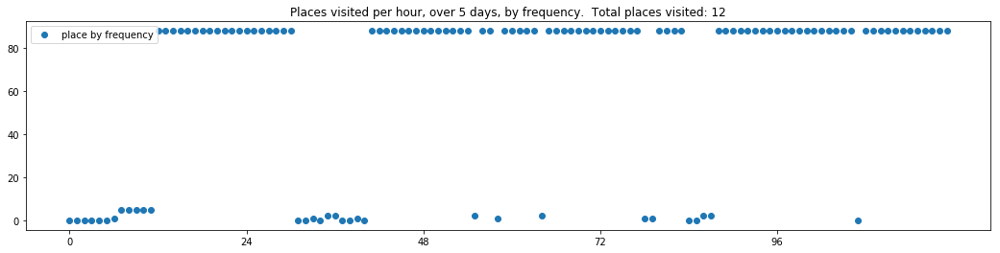

----- vector ----
prefix labels:  [308, 308]
[0, 308, 308, 0, 308, 308, 0, 308, 0, 0, 308, 308, 308, 308, 308, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 308, 308, 0]
[0, 0, 0, 308, 308, 0, 308, 308, 308, 0, 0, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 0, 0, 0]
[0, 0, 0, 308, 308, 0, 0, 0, 0, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308]
[308, 308, 308, 308, 0, 0, 0, 0, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308]


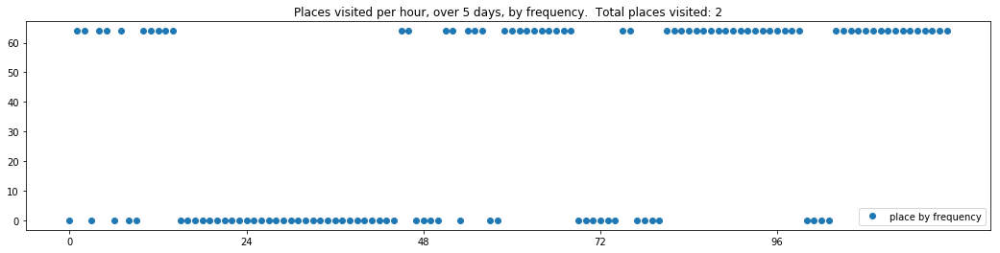

----- vector ----
prefix labels:  [252, 252]
[0, 0, 62, 62, 62, 62, 62, 62, 62, 38, 38, 38, 252, 252, 252, 252, 252, 0, 112, 112, 71, 252, 0, 0]
[0, 0, 0, 0, 0, 0, 112, 112, 154, 252, 252, 252, 252, 252, 252, 252, 252, 252, 252, 252, 252, 252, 252, 252]
[0, 0, 0, 0, 0, 0, 0, 0, 112, 252, 252, 252, 252, 252, 252, 252, 252, 252, 140, 252, 252, 0, 252, 0]
[0, 0, 0, 0, 0, 0, 112, 112, 112, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 252, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


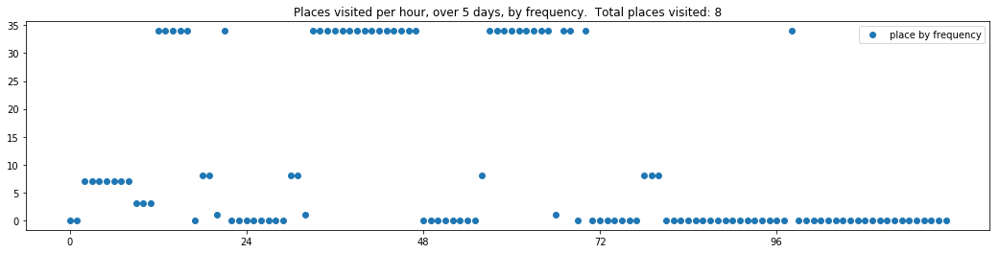

----- vector ----
prefix labels:  [8, 8]
[0, 0, 0, 0, 0, 8, 0, 8, 8, 8, 8, 8, 0, 8, 8, 8, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 8, 8, 8, 8, 55, 55, 55, 55, 55, 55, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


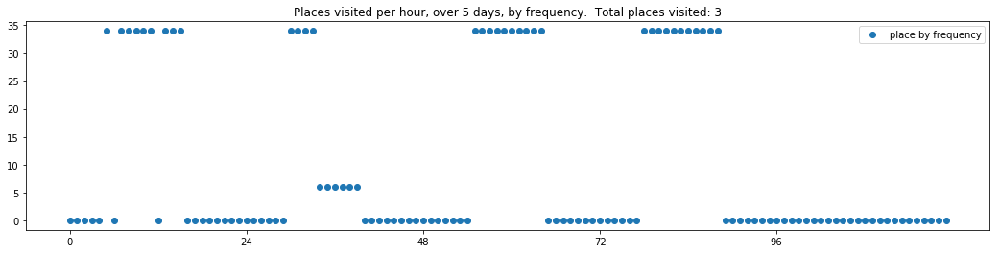

----- vector ----
prefix labels:  [6, 386]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 386, 386, 386, 386, 386, 386, 386, 386, 386, 386, 6, 6]
[6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 0, 386, 386, 386, 0, 386, 386, 386, 386, 261, 261, 6, 6]
[6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 0, 386, 386, 386, 386, 386, 386, 386, 386, 386, 0, 6]
[6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 386, 386, 386, 386, 386, 386, 386, 386, 386, 0, 6, 0, 0]
[0, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 386, 386, 386, 386, 386, 386, 386, 386, 0, 6, 6, 6]


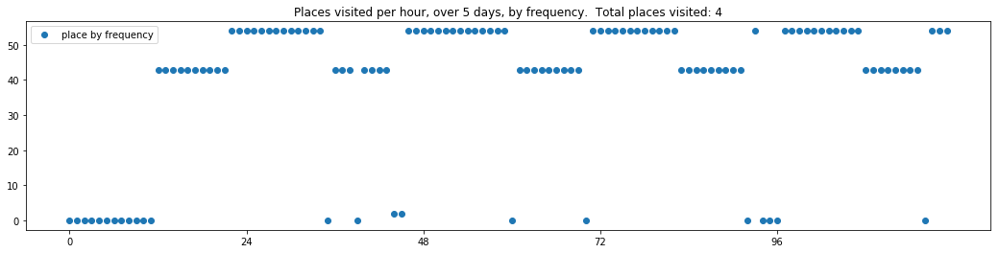

----- vector ----
prefix labels:  [92, 92]
[0, 0, 0, 0, 0, 0, 0, 0, 488, 223, 223, 223, 223, 223, 223, 223, 0, 92, 92, 92, 92, 92, 92, 92]
[92, 92, 92, 92, 92, 92, 92, 92, 0, 529, 0, 92, 92, 0, 0, 92, 92, 92, 92, 92, 92, 92, 92, 92]
[92, 92, 92, 92, 92, 92, 92, 92, 92, 0, 223, 223, 223, 223, 223, 0, 0, 92, 92, 92, 92, 92, 92, 92]
[92, 92, 92, 92, 92, 92, 0, 223, 223, 0, 223, 223, 223, 223, 223, 223, 0, 92, 92, 92, 92, 92, 92, 92]
[92, 92, 92, 92, 92, 92, 92, 92, 92, 92, 223, 223, 223, 223, 223, 223, 223, 92, 92, 92, 0, 0, 0, 0]


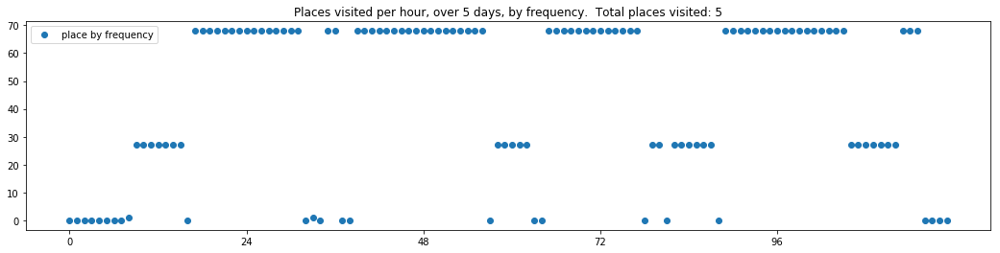

----- vector ----
prefix labels:  [391, 391]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 304, 304, 165, 311, 311]
[311, 311, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 391, 391, 164, 164, 391, 391, 391, 391]
[311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 0, 304, 304, 304, 304, 0, 0]
[311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 304, 304, 0, 0, 0, 304]
[311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 318, 0, 0, 0, 0]


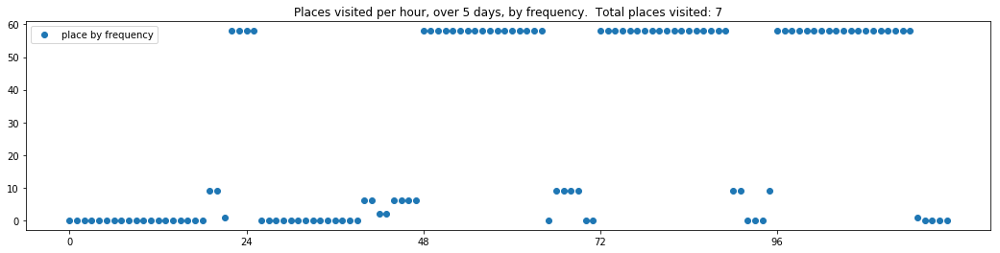

----- vector ----
prefix labels:  [536, 536]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 536, 536, 0, 0, 0, 0, 0, 0, 0, 0]
[536, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 536]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 536, 0, 0, 0, 0, 0, 0, 0, 0, 536]
[536, 409, 536, 536, 536, 536, 536, 536, 536, 536, 536, 536, 536, 536, 536, 536, 536, 536, 536, 536, 536, 536, 536, 536]
[536, 536, 496, 536, 536, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 536]


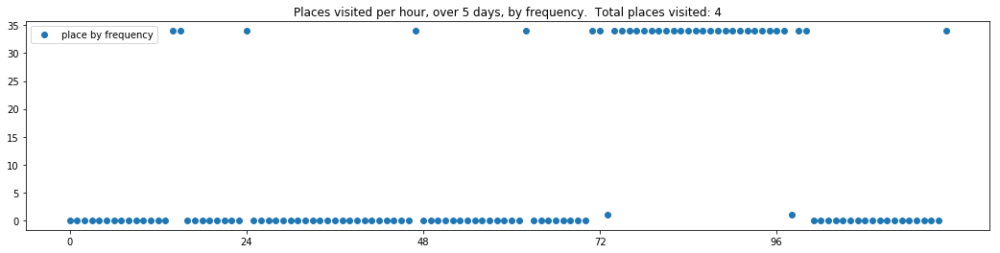

----- vector ----
prefix labels:  [7, 7]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 7, 353, 478, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 1, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 7, 7, 7, 7, 7, 7, 0, 0, 0, 0, 351, 0, 0, 0, 0, 0, 0]


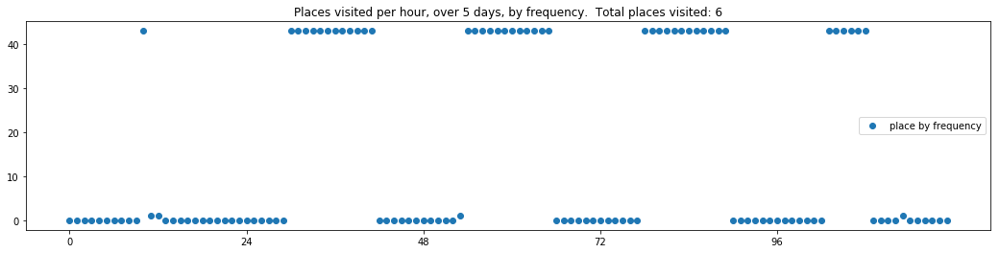

----- vector ----
prefix labels:  [120, 120]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 120, 120, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 120, 120, 120, 120, 120, 120, 120, 120, 120, 120, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 120, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 120, 120, 120, 120, 120, 120, 120, 120, 120, 120, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 120, 120, 120, 120, 120, 120, 120, 120, 120, 120, 120, 120, 0, 0, 0]


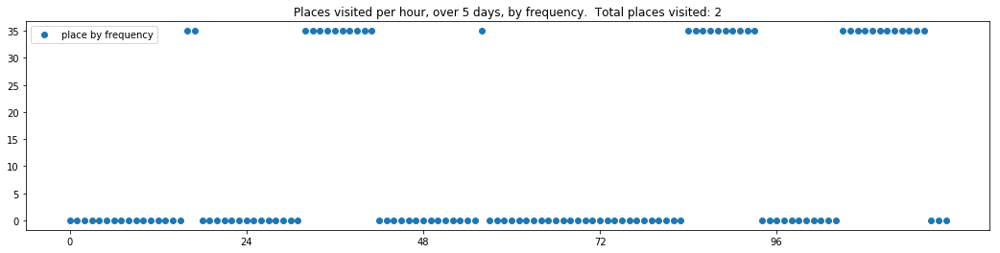

----- vector ----
prefix labels:  [195, 88]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 502, 502, 502, 502, 502, 502, 502, 502, 502, 502, 502, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 502, 502, 502, 502, 502, 502, 502, 502, 502, 502, 502, 502, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 502, 502, 502, 502, 502, 502, 502, 502, 502, 502, 502, 0, 0, 0, 0]


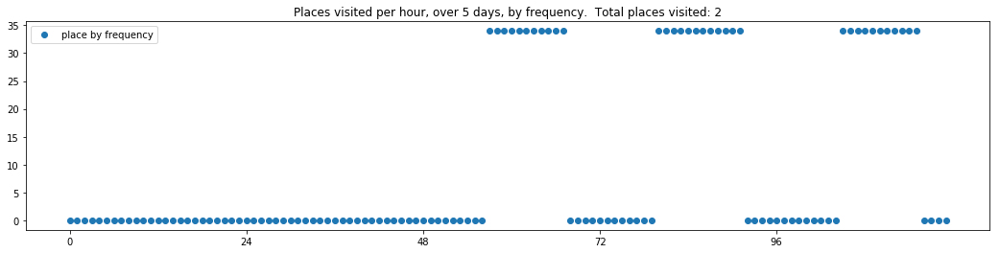

In [13]:
# These trajectories were generated randomly, without any prefix.  We inspect them to understand
# how the model replicated the data overall.

textgenrnn_all_trajectories_08_filename = '../textgenrnn_generator/output/generated-epochs:50:25-temperature:0.8-prefix:None-20191211.txt'
textgenrnn_all_trajectories_09_filename = '../textgenrnn_generator/output/generated-epochs:50:25-temperature:0.9-prefix:None-20191211.txt'
textgenrnn_all_trajectories_1_filename = '../textgenrnn_generator/output/generated-epochs:50:25-temperature:1.0-prefix:None-20191211.txt'

textgenrnn_all_trajectories_set = {
    0.8: read_trajectories_from_file(textgenrnn_all_trajectories_08_filename),
    0.9: read_trajectories_from_file(textgenrnn_all_trajectories_09_filename),
    1.0: read_trajectories_from_file(textgenrnn_all_trajectories_1_filename),
}

for (temp, trajectory_set) in textgenrnn_all_trajectories_set.items():
    print('showing sample of trajectories from output with temp %s' % temp)
    for tv in trajectory_set[:sample_size]:
        print_dwell_vector_by_days(tv)
        plot_trajectory_vector_frequencies(tv, by_frequency_order=False) 

In [14]:
# For these trajectories, we generated trajectories for each of the cambridge census tract areas as home labels.
# When comparing the real and generated output, only data with these home labels should be considered.

textgenrnn_cambridge_trajectories_08_filename = '../textgenrnn_generator/output/generated_trajectories_1_week_cambridge_temp_0.8.txt'
textgenrnn_cambridge_trajectories_09_filename = '../textgenrnn_generator/output/generated_trajectories_1_week_cambridge_temp_0.9.txt'
textgenrnn_cambridge_trajectories_1_filename = '../textgenrnn_generator/output/generated_trajectories_1_week_cambridge_temp_1.0.txt'

textgenrnn_cambridge_trajectories_set = {
    0.8: read_trajectories_from_file(textgenrnn_cambridge_trajectories_08_filename),
    0.9: read_trajectories_from_file(textgenrnn_cambridge_trajectories_09_filename),
    1.0: read_trajectories_from_file(textgenrnn_cambridge_trajectories_1_filename),
}

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]


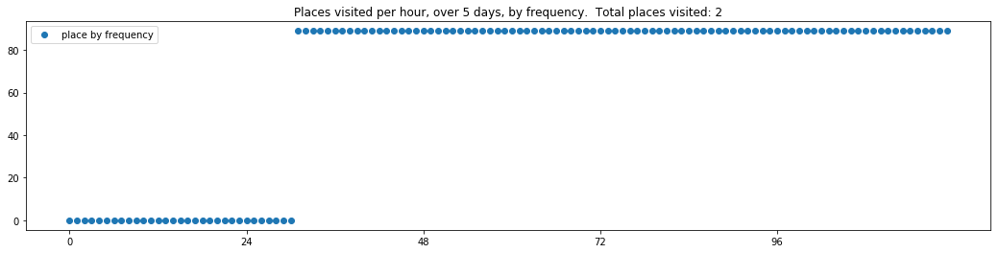

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 401, 401, 401, 401, 401, 401, 401, 401, 401]
[401, 401, 401, 401, 401, 401, 401, 0, 401, 401, 401, 248, 248, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401]
[401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401]


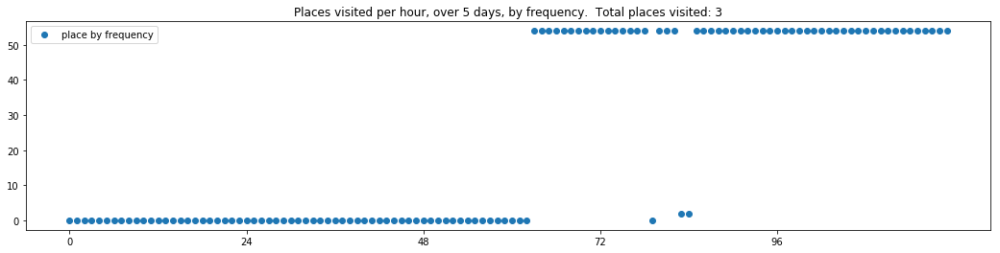

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 0, 558, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 386, 386, 386, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 386, 386, 386, 386]
[386, 386, 386, 386, 386, 386, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 386, 386, 386, 386]


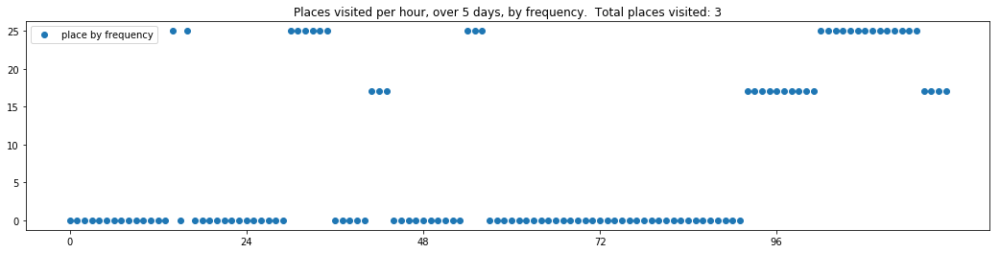

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]


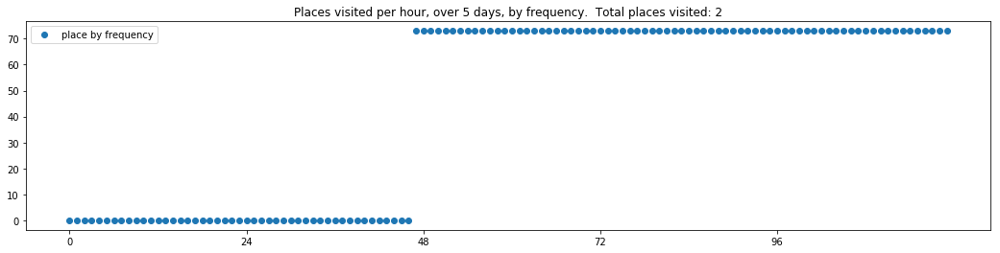

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 59, 10, 10, 0, 0, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 495, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


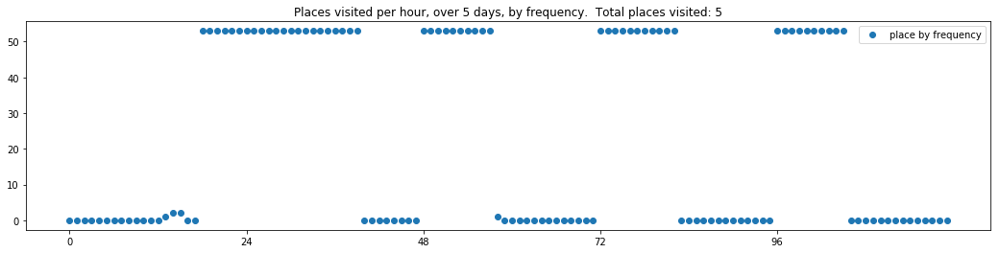

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558]
[558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558]


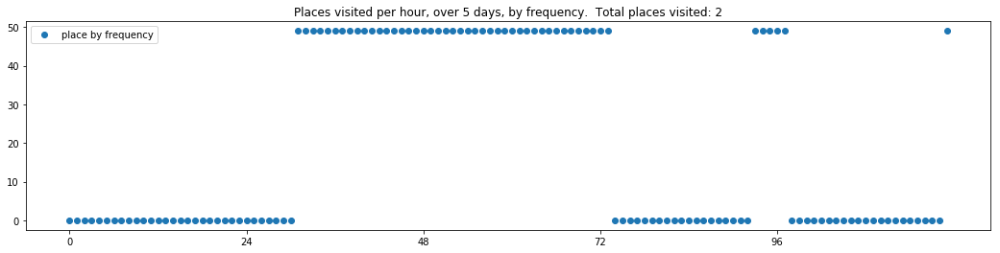

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


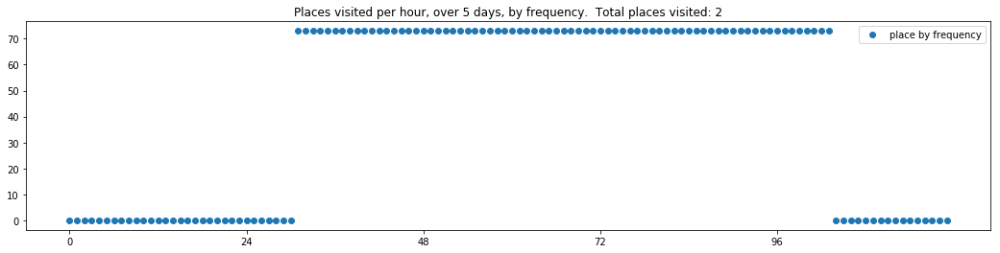

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]


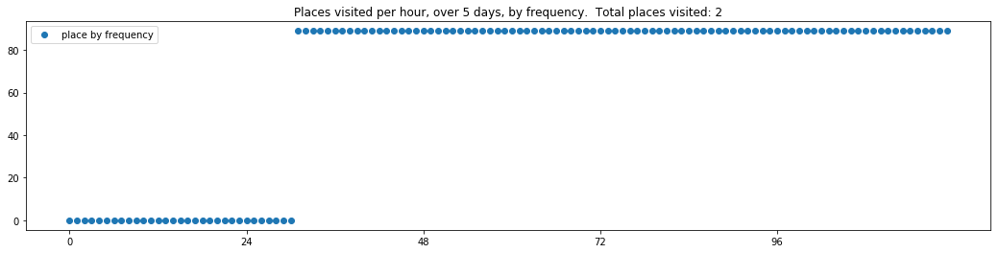

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]


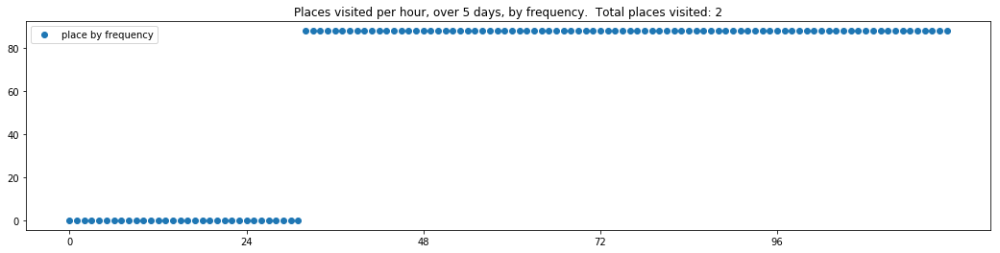

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 193, 461, 461, 461, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 558, 558, 450, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


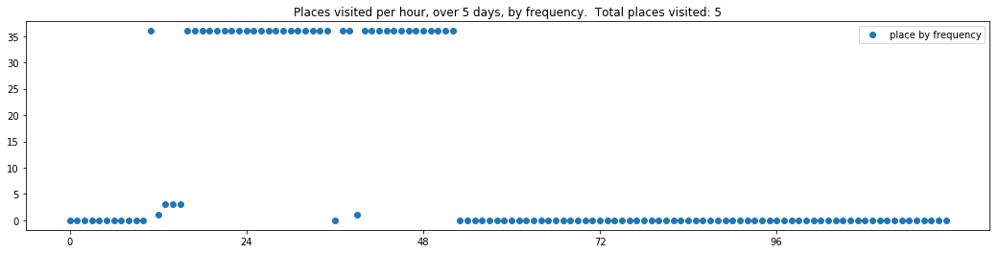

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


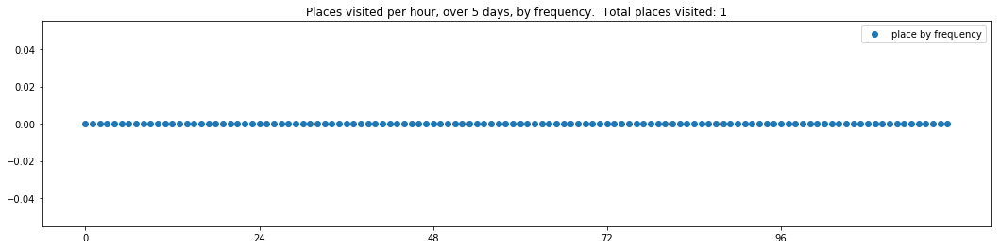

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]


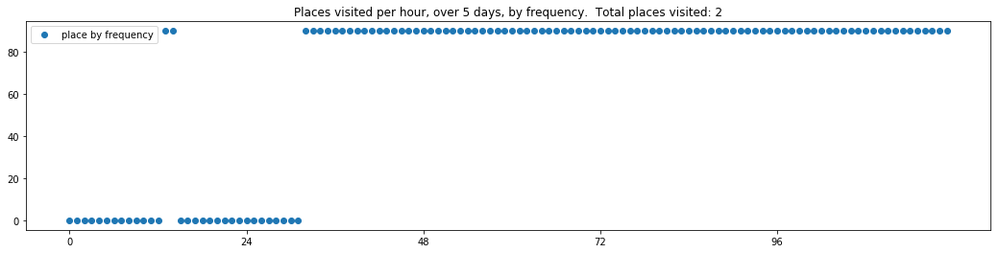

----- vector ----
prefix labels:  [558, 558]
[0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


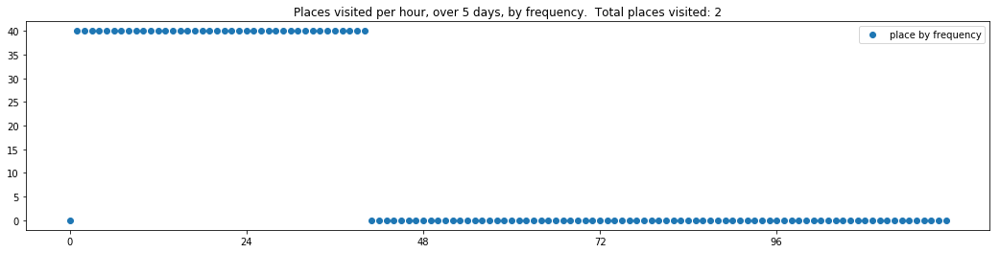

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 214]


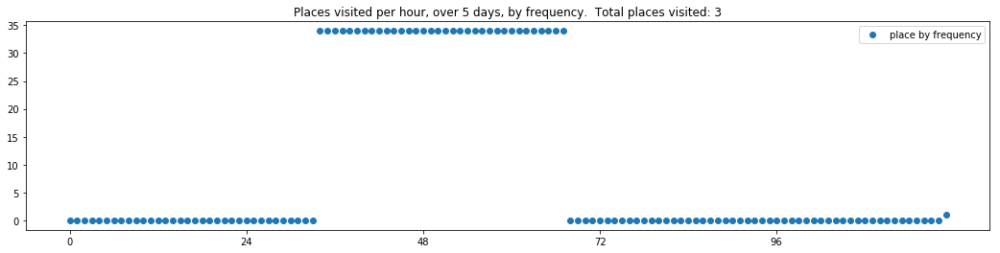

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 171, 171, 495, 558, 0, 373, 373, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 373, 373, 558, 558, 558, 558, 2, 2, 0, 0, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 2, 2, 2, 2]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0]


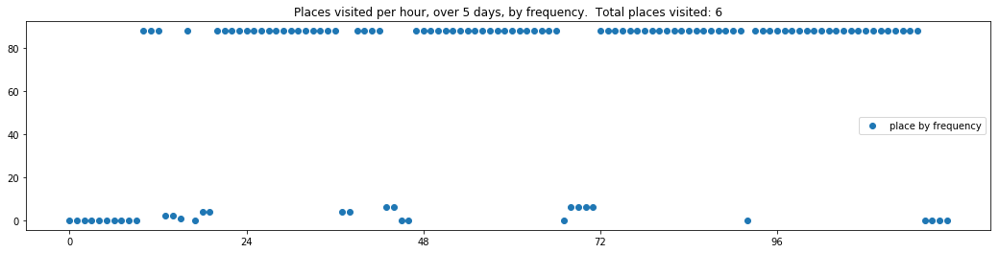

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 247, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 247, 0, 0, 0, 0, 0]


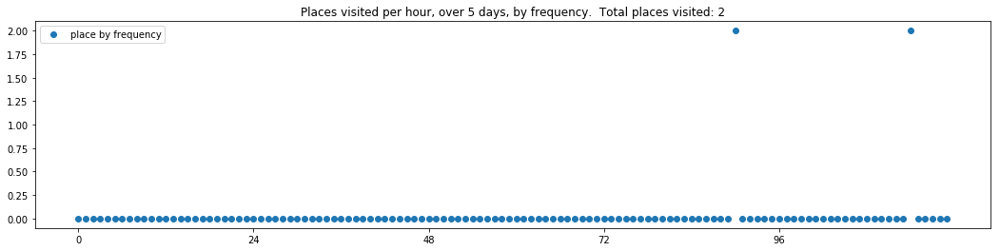

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0]


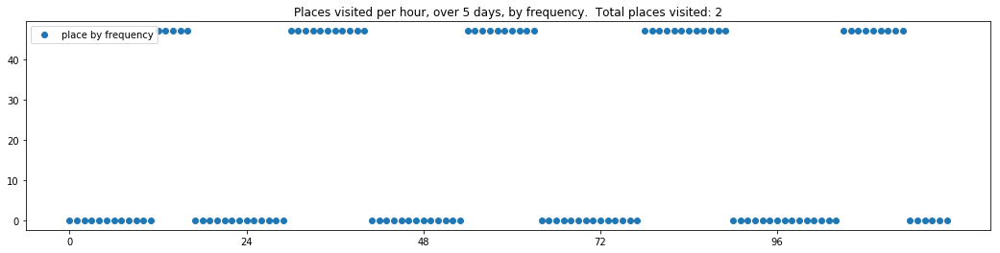

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]


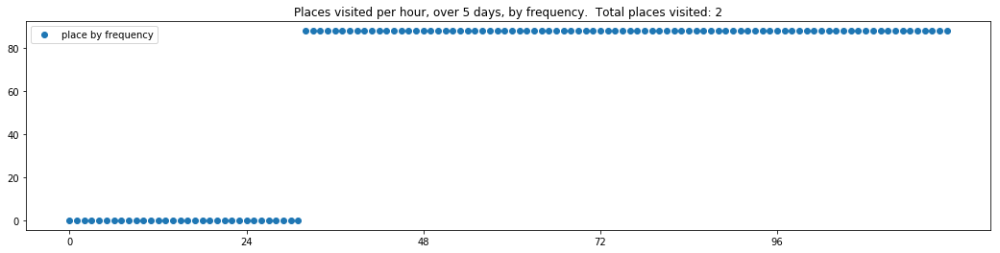

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 21, 21, 21, 21, 21, 21, 21, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 21, 21, 21, 21, 21, 21, 212, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 21, 21, 21, 21, 21, 21, 21, 21, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 21, 21, 21, 21, 21, 21, 21, 21, 21, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 485, 558, 558, 558, 558, 558, 184, 184, 184, 184, 184, 184, 558, 558]


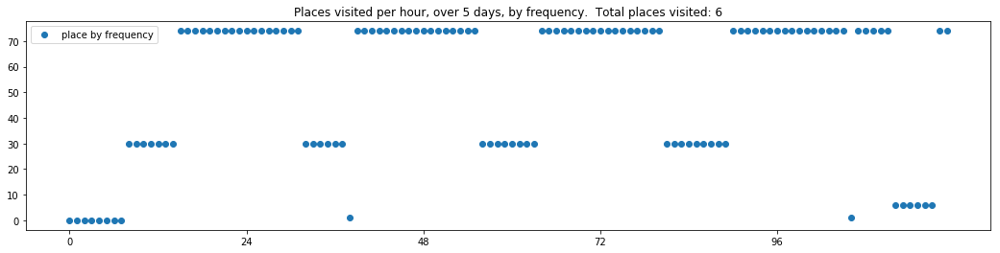

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 456, 0, 456]
[0, 0, 0, 0, 0, 0, 248, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 456, 456, 456, 0, 456]
[456, 456, 0, 456, 456, 535, 535, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 456, 456, 456, 456, 456]
[456, 456, 456, 456, 456, 456, 456, 456, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 456, 456, 456, 456, 456]
[456, 456, 456, 456, 456, 456, 456, 401, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 456, 456, 456, 456, 456, 456]


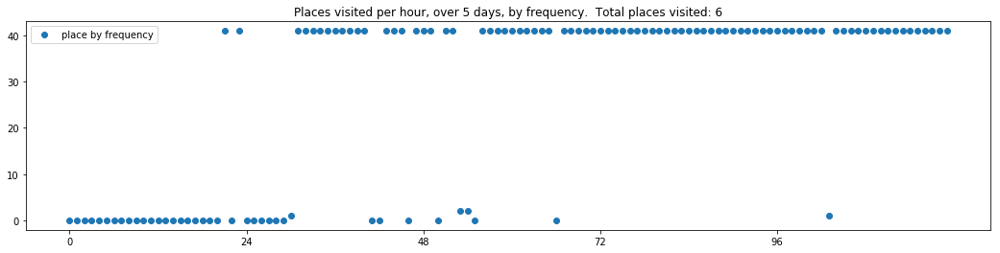

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 450, 450, 450, 450, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 450, 21, 21, 21, 0]
[21, 21, 21, 21, 21, 21, 21, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 21, 21, 21, 21, 21]
[21, 0, 0, 21, 21, 21, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 21, 21, 21, 21]


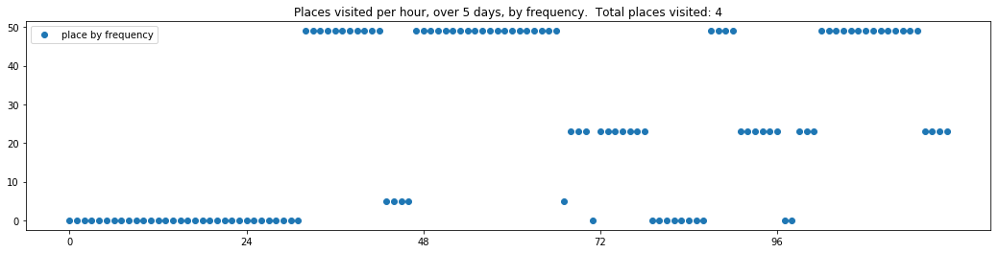

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 212, 212, 212, 212, 212, 212, 212, 212, 0, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558]


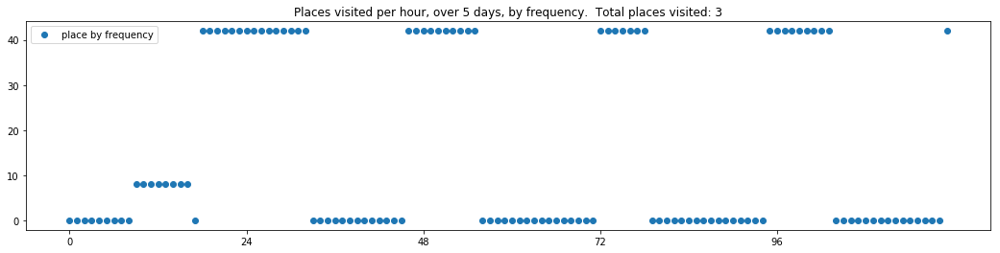

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 577, 577, 577, 577, 577, 577, 577, 577, 577, 577, 577, 577, 577, 577]


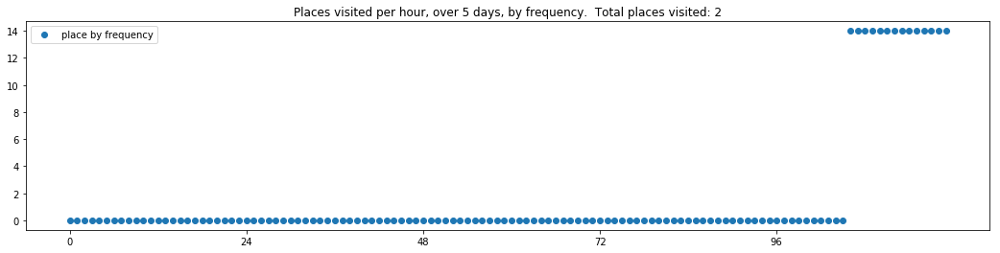

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 236, 236, 236, 558, 0, 0, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 269, 269, 545, 545, 269, 269, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 269, 269, 269, 558, 0, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]


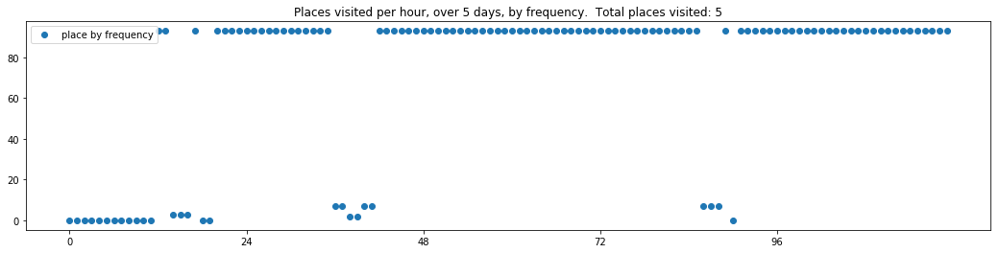

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 627, 0, 0, 0, 0, 558, 0, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 650, 650, 650, 650, 558, 558, 0, 558, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 8, 8, 0, 0, 0, 0, 0, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 8, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


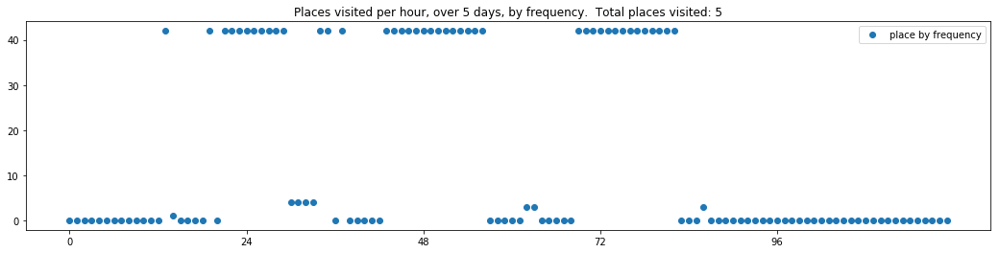

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 185, 185, 185, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 143, 267, 267, 267, 267, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 267, 267, 267, 450, 69, 185, 185, 450, 373, 373, 373, 558, 558, 558]
[558, 558, 558, 558, 558, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 558, 558, 558, 144, 382, 382, 267, 267]
[267, 267, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


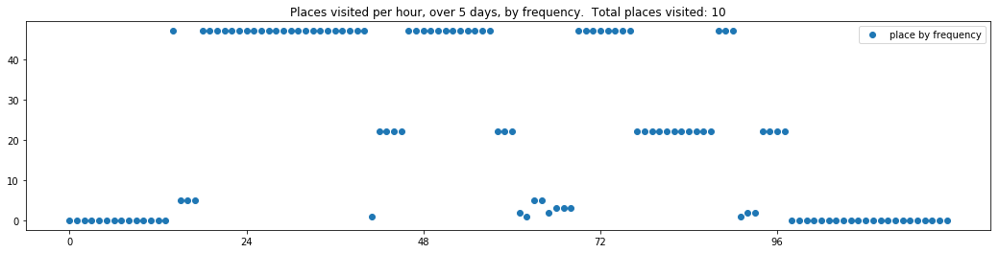

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0]


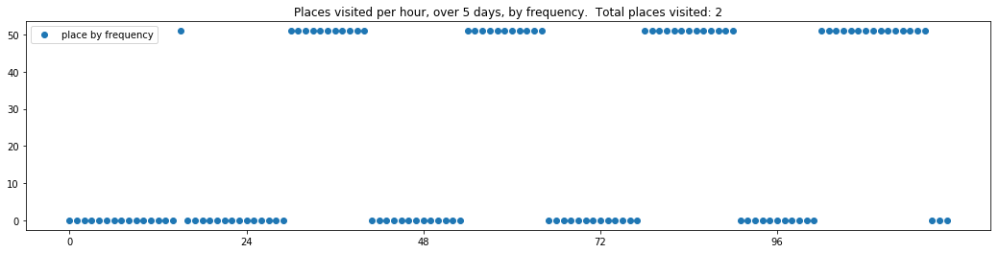

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 548, 548, 548, 548, 548, 548, 548, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 548, 0, 0, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 558, 558, 558, 558, 558, 558, 2, 2, 2, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 2, 2, 2, 558, 558, 558, 558]


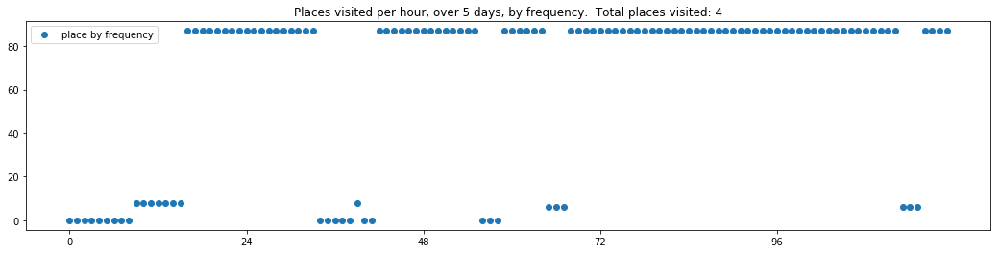

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0]


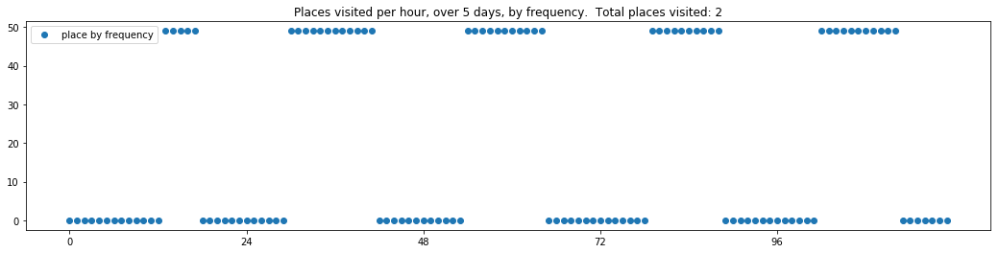

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 173, 0, 0]
[464, 464, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 464, 464, 464]
[464, 464, 464, 464, 0, 0, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 0, 464, 464, 464]
[464, 464, 464, 464, 464, 0, 384, 384, 384, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 464, 464, 464, 464]


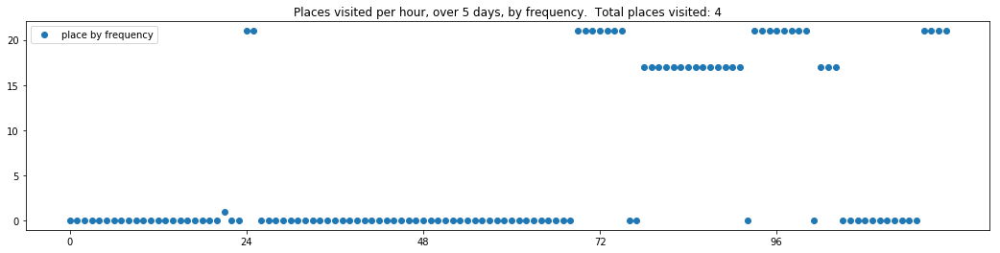

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 0, 0, 0, 0, 0, 42, 42, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 97, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 386, 386, 386, 386, 76, 0, 0, 0, 0, 0, 0, 0]


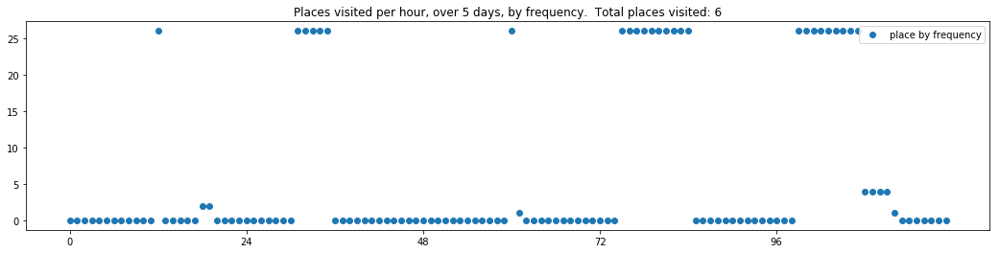

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 184, 184, 0, 0, 0, 0, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 50, 50, 50, 558, 558]
[558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 0, 0, 0, 0, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 2, 0, 0, 0, 558, 558, 558, 558]


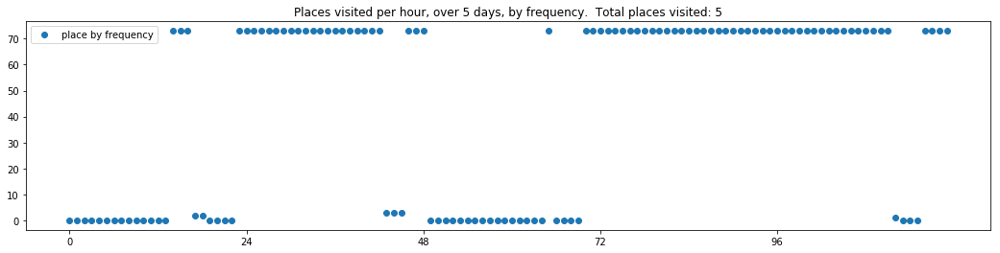

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


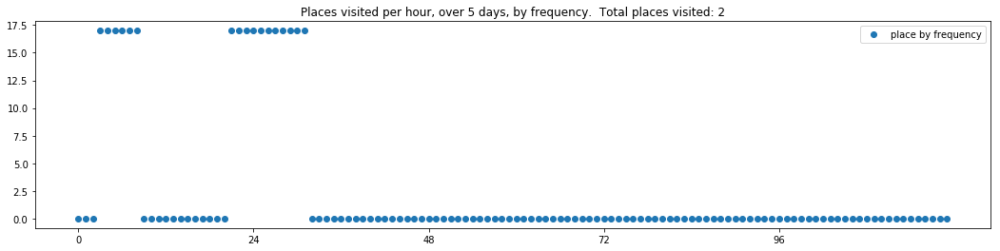

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]


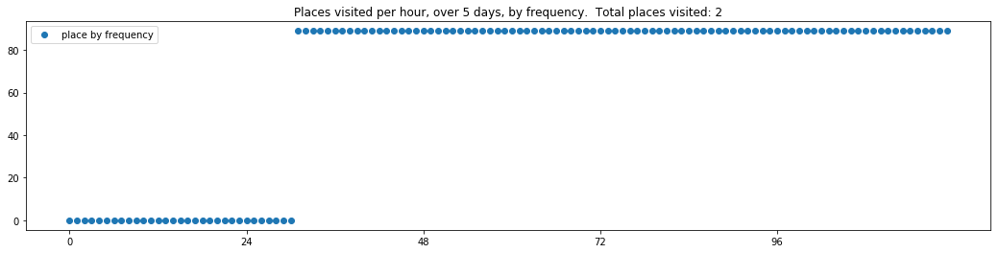

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20, 0, 0, 0, 558, 558, 558, 373, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 325, 325, 325, 325, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 274, 325, 498]


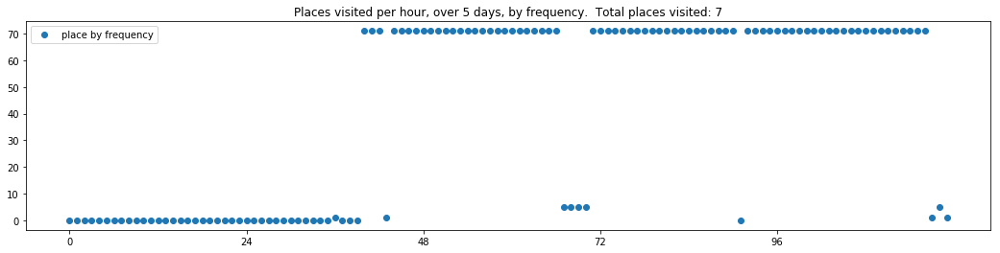

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 147, 0, 0]
[0, 0, 0, 0, 0, 0, 558, 0, 0, 558, 558, 0, 0, 0, 0, 0, 0, 0, 147, 147, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 644, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558]
[558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 644, 644, 644, 0, 0, 644, 644, 644, 644, 0, 0, 558, 558, 558]


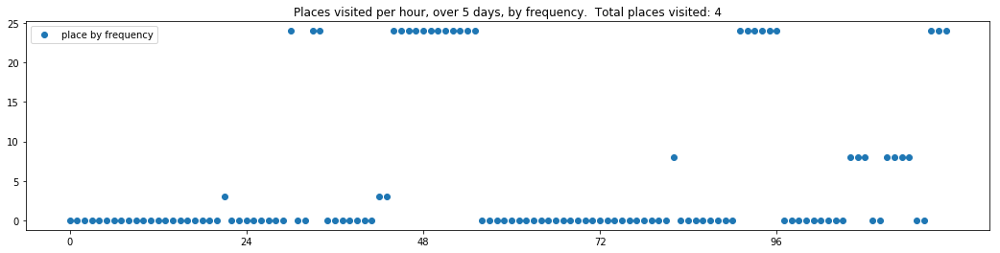

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]


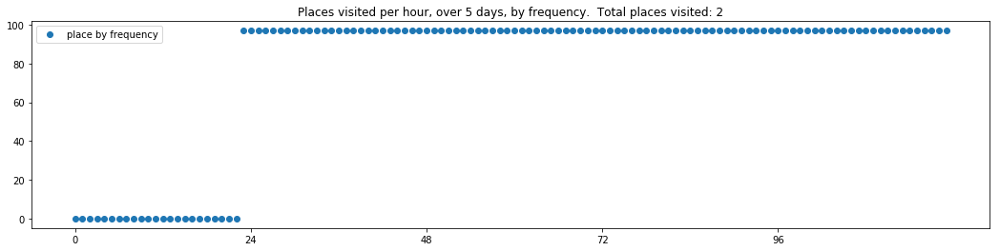

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]


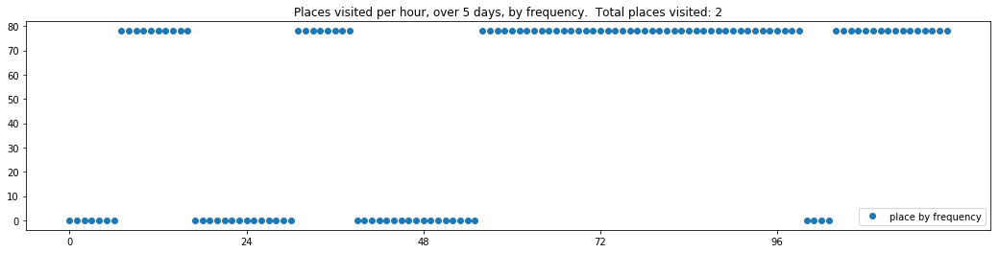

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 296, 296, 296, 296, 296]
[296, 296, 296, 296, 296, 296, 296, 296, 296, 296, 296, 0, 0, 0, 0, 296, 296, 296, 296, 296, 296, 296, 296, 296]
[296, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 296, 296, 296, 296, 296, 296, 296, 296]


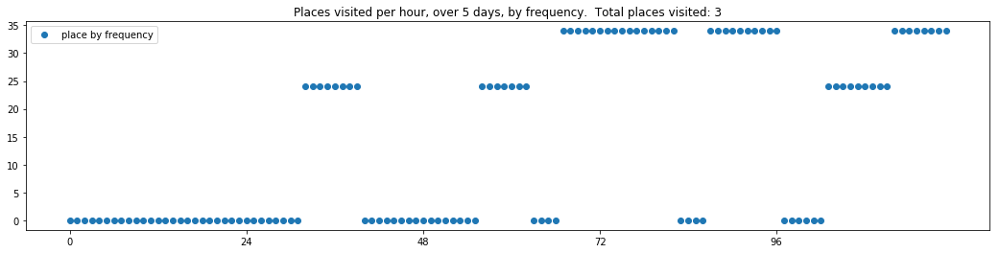

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 558, 0, 0, 0, 0, 0, 0, 0, 0, 558, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]


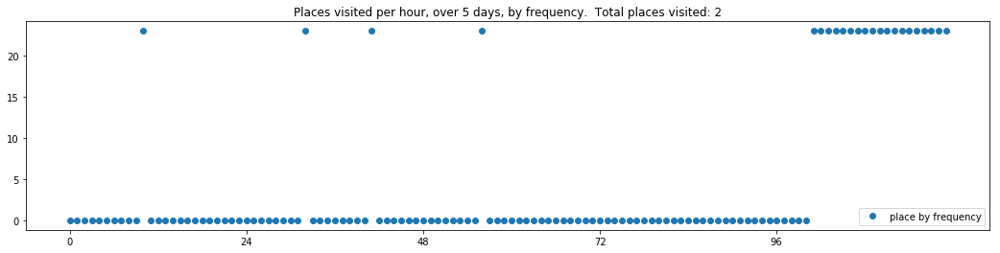

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 277, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558]


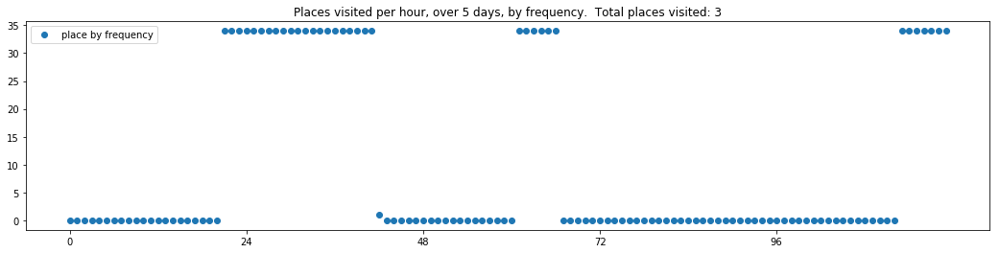

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 173, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]


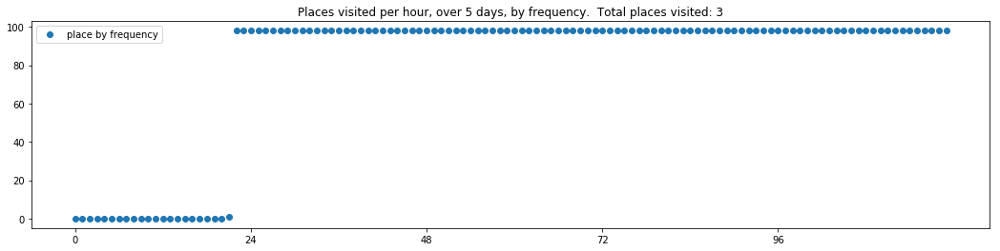

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0]


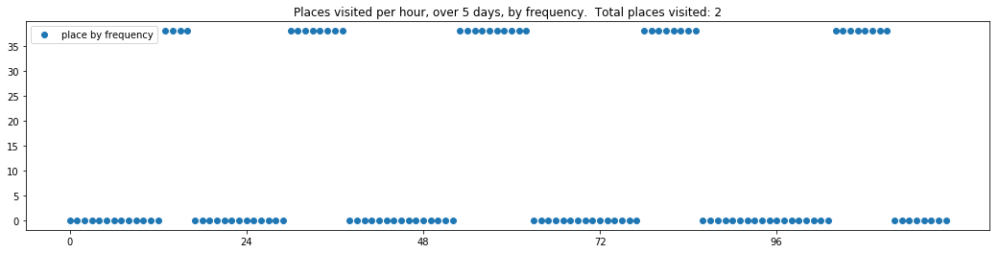

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 50, 50, 50, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 50, 50, 50, 50, 50, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


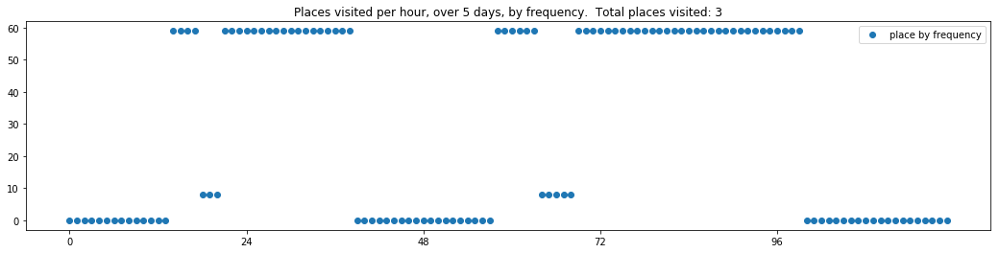

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 495, 495, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]


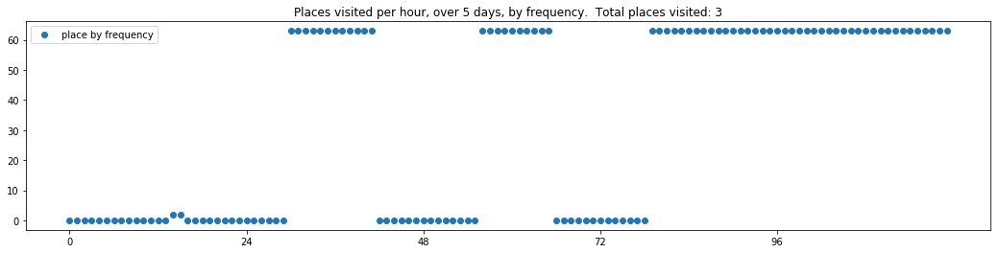

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0]


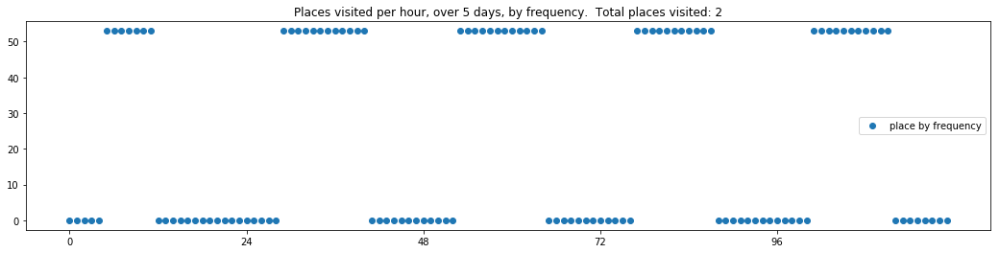

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


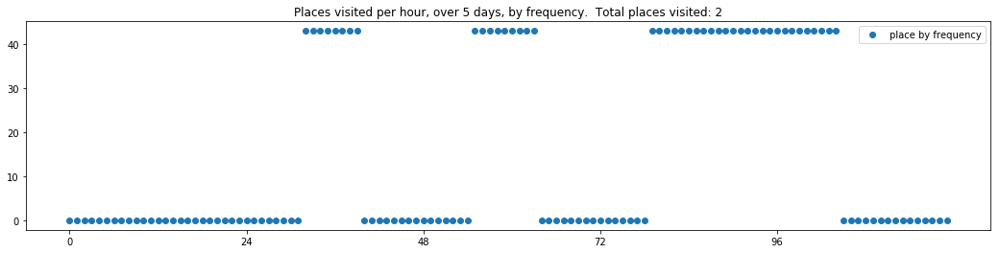

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


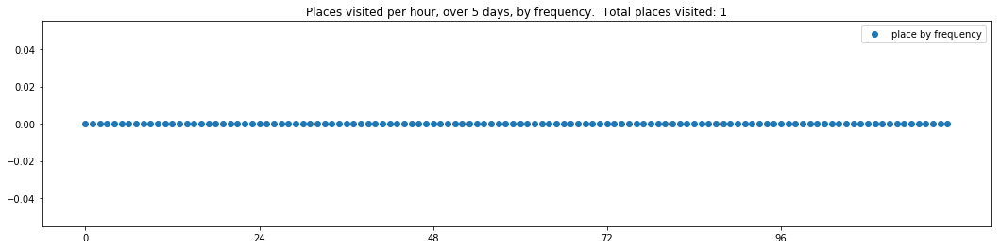

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]


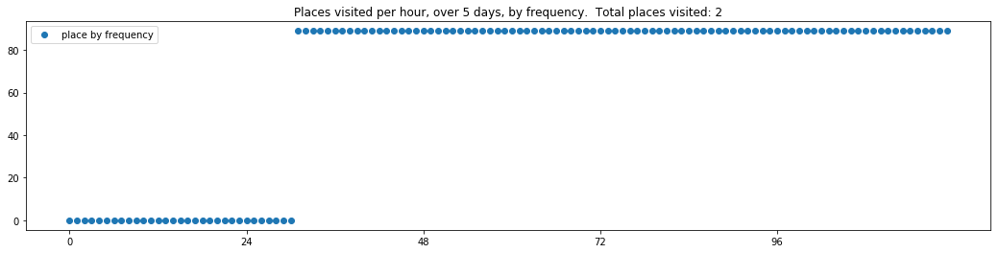

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


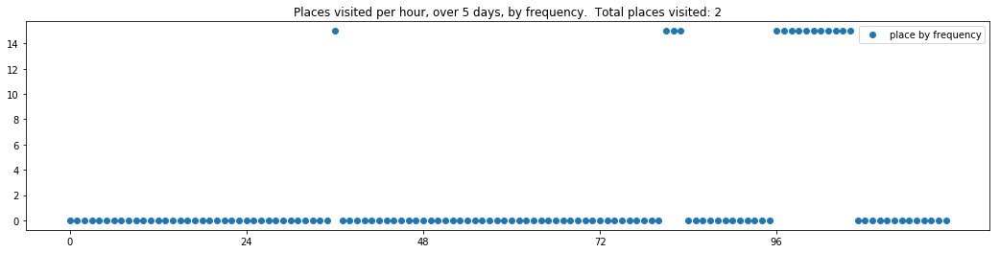

In [15]:
for tv in textgenrnn_cambridge_trajectories_set[0.8][:sample_size]:
    print_dwell_vector_by_days(tv)
    plot_trajectory_vector_frequencies(tv, by_frequency_order=False) 

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 8, 8, 21, 21, 21, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 450, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 267, 212, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 0, 0, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 558, 558, 558, 558, 558, 558, 558, 558, 558]


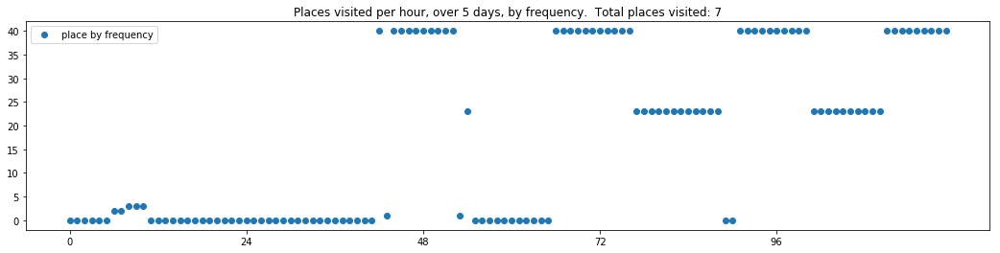

----- vector ----
prefix labels:  [558, 558]
[0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 558, 558, 0, 558, 558, 558, 558, 0, 0, 57]
[57, 57, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 558, 0, 558, 558, 0, 0, 0]
[0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 20, 20, 20, 0, 0, 0, 0, 637]
[637, 637, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


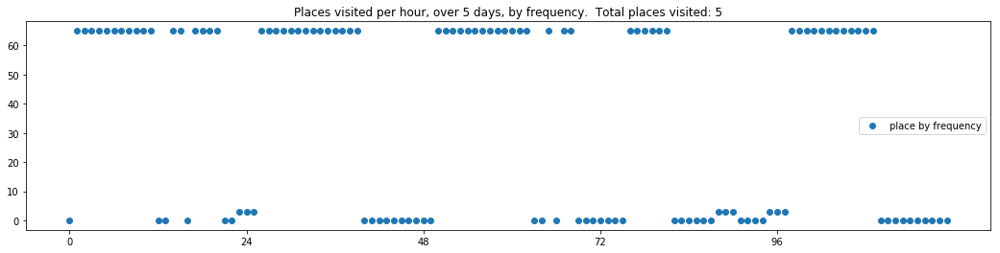

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 204, 204, 204, 151, 558, 558, 558, 558, 558, 448, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 497, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 0, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0]


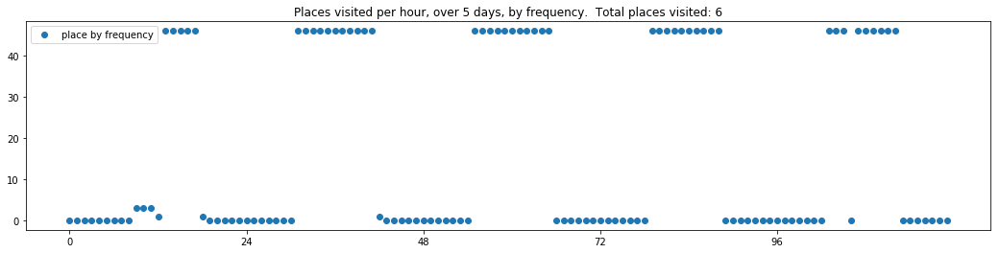

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 56, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


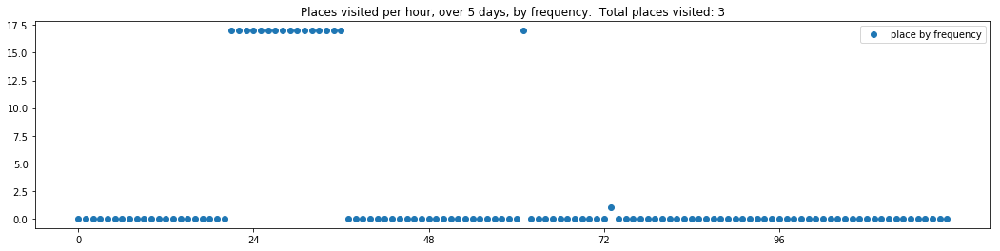

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 0, 0, 0, 558, 558, 558, 558, 132, 132, 373, 373, 373, 373, 373, 373]
[373, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 464, 464, 558, 558, 558, 0, 450, 450, 450, 450, 450, 0, 0]
[0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 558, 558, 637, 637, 558, 558, 558, 558, 450, 566, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 558, 473, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0]


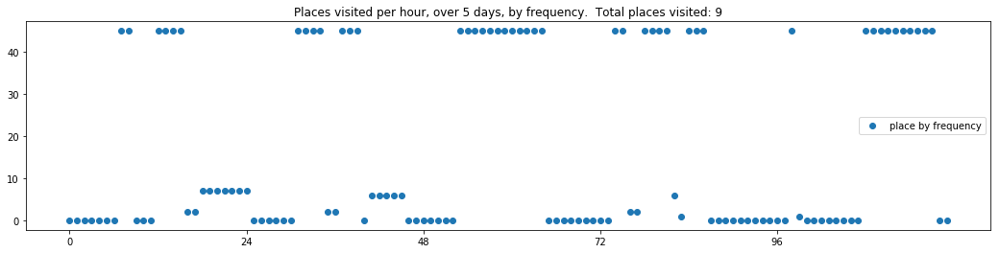

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 21, 21, 21, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 55, 55, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 55, 55, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


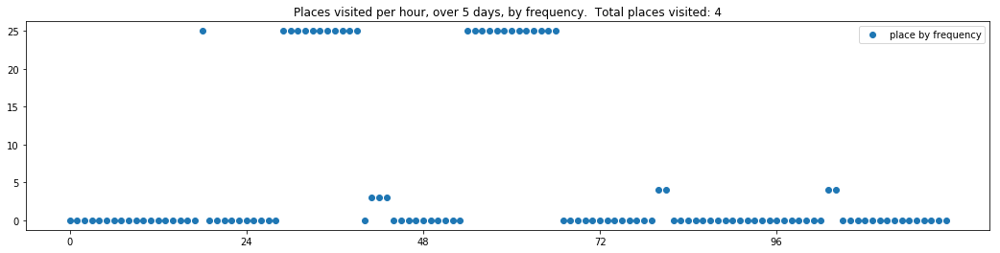

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 298, 298, 0, 0, 0, 0, 0, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 261, 373, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 97, 0, 473, 21, 97, 0, 0, 394, 495, 495, 495, 495, 0, 0, 0, 0, 0]
[558, 558, 558, 558, 558, 482, 558, 558, 558, 558, 558, 558, 228, 452, 452, 0, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 50, 50, 0, 0, 0, 495, 495, 495, 495, 495, 495, 558, 558, 558, 558]


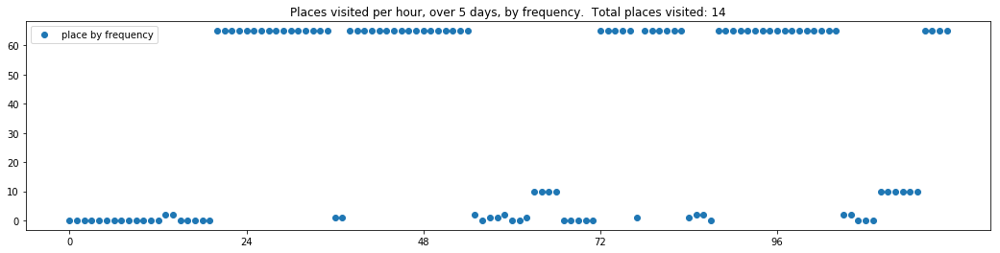

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 0, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 0, 0, 0, 0, 558, 558, 558, 0, 0, 0, 341, 341, 341, 0, 0]
[0, 0, 0, 341, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 341, 341, 341, 341, 341, 341, 341, 341, 341, 341, 341, 341, 341, 0, 522, 0, 0, 0, 0, 341, 341]
[341, 341, 341, 341, 341, 341, 341, 341, 341, 341, 341, 341, 341, 341, 341, 0, 0, 0, 0, 0, 0, 0, 341, 0]


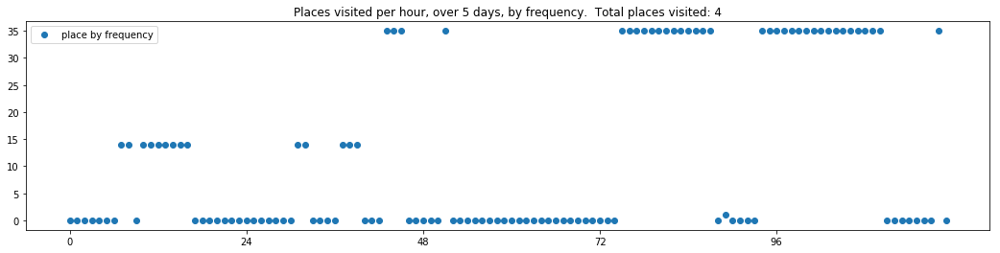

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 558, 450, 450, 450, 450, 450, 450, 450, 450, 558, 558, 558, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 558, 450, 450, 450, 450, 450, 450, 450, 450, 450, 450, 119, 119, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 119, 0, 0, 450, 450, 450, 450, 450, 450, 450, 450, 450, 119, 119, 119, 119, 119, 119, 119]
[119, 119, 119, 8, 8, 8, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 315, 315, 315, 0]
[119, 119, 119, 227, 119, 267, 267, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


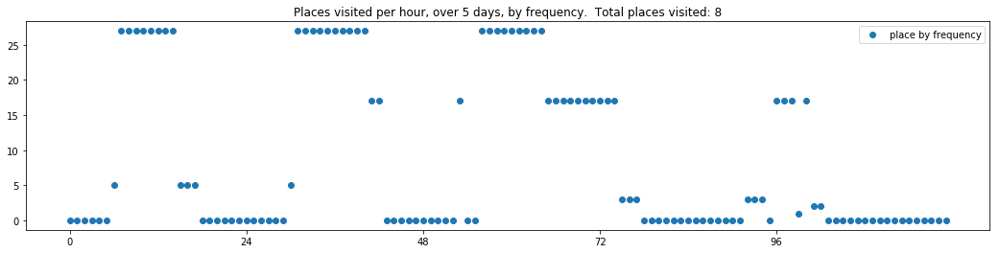

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 145, 576, 576, 576, 85, 0, 0]
[0, 0, 0, 0, 576, 576, 576, 576, 576, 576, 558, 558, 558, 558, 558, 558, 558, 558, 0, 576, 576, 85, 85, 0]


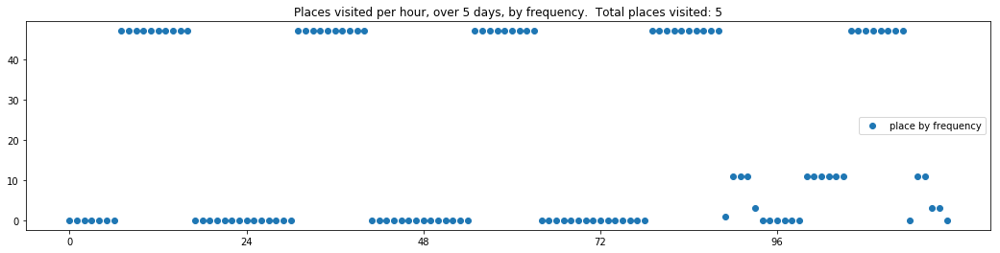

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 183, 183, 183, 0, 0, 0]
[0, 0, 0, 0, 0, 558, 0, 0, 0, 0, 21, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 78, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 151, 151, 78, 78, 78, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


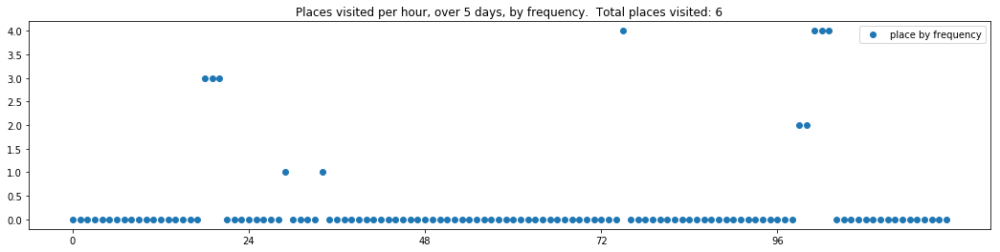

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 447, 447, 183, 183, 184, 184, 184, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 373, 373, 261, 558, 564, 57, 326, 326, 450, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 603, 485, 349, 558, 183, 183, 21, 21, 21, 430, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 274, 558, 558, 558, 558, 558, 558, 495, 495, 644]
[644, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 430, 558, 558, 558, 558, 558, 558, 430, 430, 495, 644]


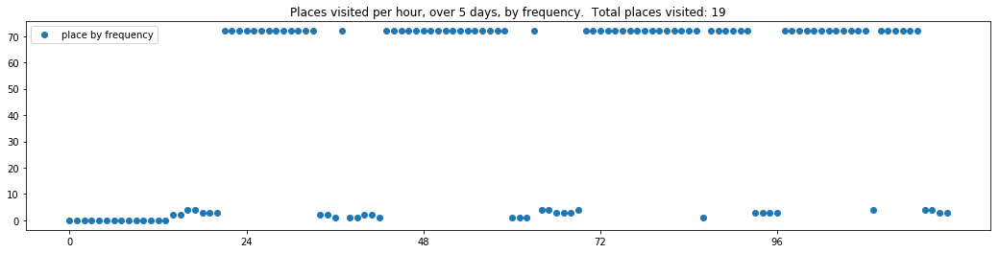

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 558, 0, 0, 558, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 33, 33, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558]
[558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 0, 0, 558, 558, 558, 558]


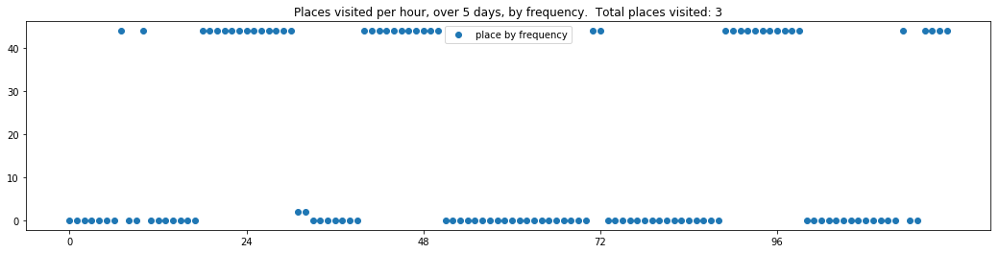

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 450, 0, 0, 0, 0, 0, 0, 558, 88, 0, 4, 0, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 0, 450, 450, 450, 0, 0, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 558, 0, 0, 0, 450, 450, 171, 171, 260, 0, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 450, 450, 450, 450, 450, 450, 450, 450, 450, 450, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 450, 450, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0]


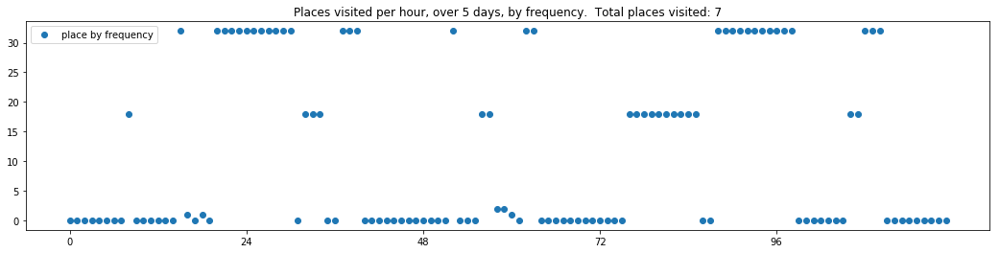

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 287, 287, 287, 558, 558, 287, 287, 287]
[287, 287, 287, 287, 287, 287, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[287, 287, 287, 287, 287, 287, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 287, 287, 287, 287, 287]
[287, 287, 287, 287, 287, 287, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 0, 0, 0, 0, 287, 287, 287, 287, 287, 287, 287, 287, 287, 287, 287, 287, 287, 287, 287, 287, 287, 287]


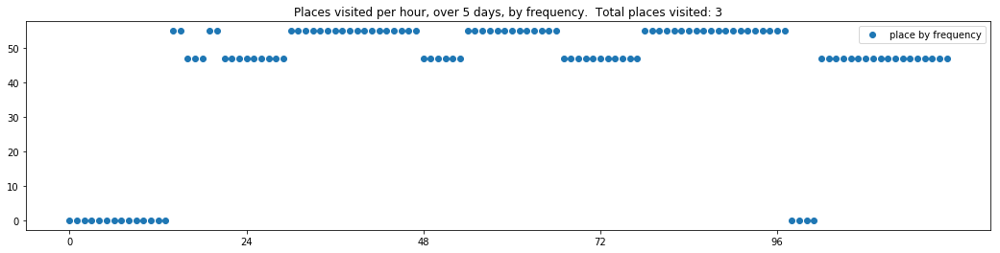

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 323, 323, 558, 76, 76, 558, 558, 373, 558, 558, 558, 267, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 464, 558, 558, 558, 373, 50, 558, 558, 0, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 74, 74, 100, 0, 235, 267, 386, 133, 558, 558, 558, 558, 450, 450, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 267, 267, 485, 485, 221, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 267, 267, 373, 373, 373, 373, 373, 373, 558, 558, 558, 558, 558, 558, 56, 56, 56, 56, 56, 56, 386]


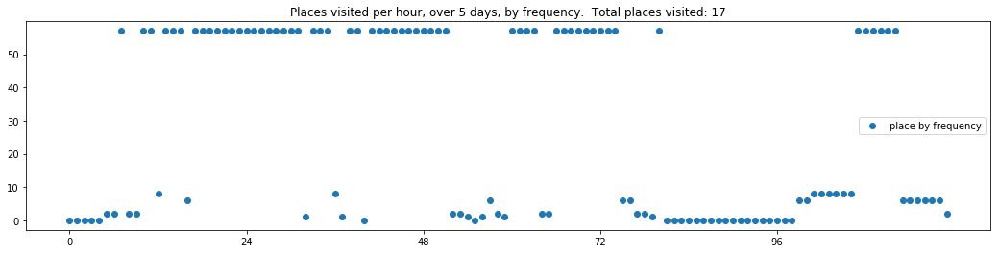

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 0, 0, 558, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 130, 130, 130, 130]


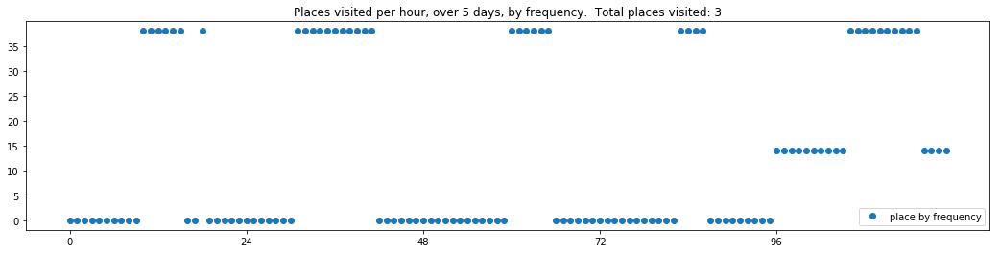

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 430, 326, 558, 558, 558, 558, 558, 430, 382, 276, 558, 450, 450, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 271, 271, 271, 271, 271, 22, 22, 22, 450, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 271, 271, 22, 22, 22, 22, 22, 22, 22, 162, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 349, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 396, 177, 329, 20, 0, 0, 22, 22, 22, 329, 558, 558, 558, 558]


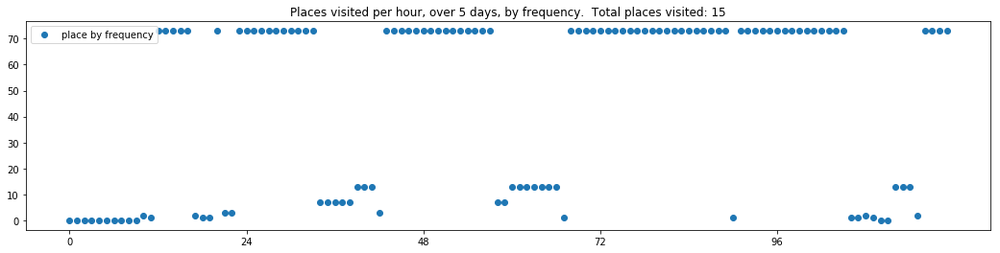

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 374, 42, 558, 558, 558, 558, 558, 558, 321, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 545, 545, 545, 369, 464, 558, 558, 0, 0, 0, 0]
[0, 0, 485, 373, 545, 0, 0, 0, 0, 0, 0, 0, 299, 299, 558, 558, 15, 15, 15, 15, 15, 15, 15, 15]
[15, 0, 0, 94, 94, 94, 0, 0, 0, 0, 0, 0, 373, 373, 573, 573, 261, 261, 0, 0, 0, 0, 0, 15]
[15, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 15, 15, 15, 15, 15, 15, 334]


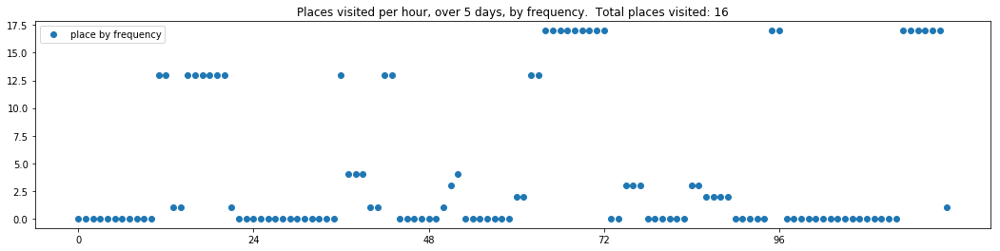

----- vector ----
prefix labels:  [558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 558, 558, 558, 558]
[558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 410, 0, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 69, 185, 171, 558, 558, 0, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 541, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 485, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 541, 541, 541, 0, 0, 0, 0, 541, 541, 20, 0, 541]


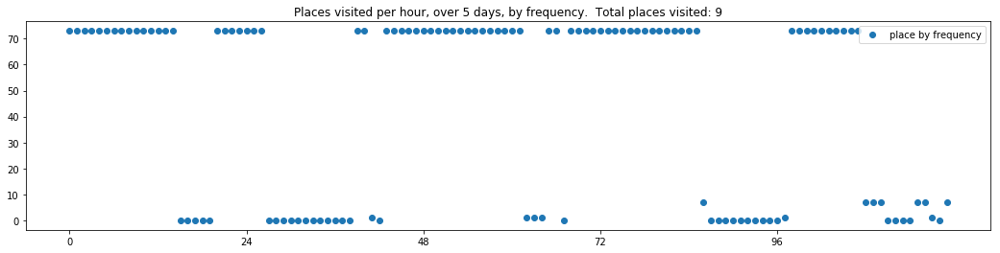

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 183, 183, 183, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 183, 183, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 0, 183, 183, 183, 183, 183, 183, 183, 183, 0, 0, 0, 0, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 386, 386, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]


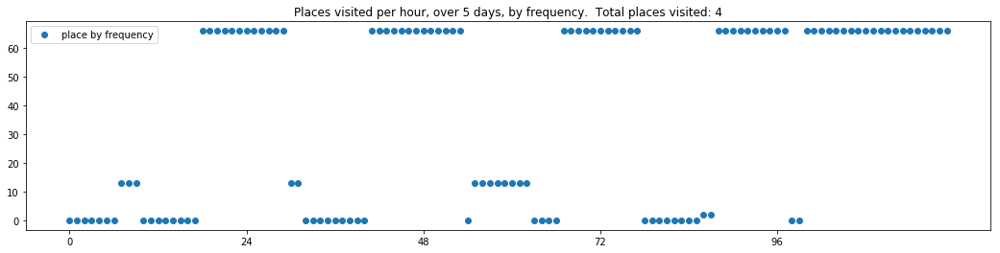

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 385, 20, 0, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20, 0, 0]
[20, 0, 0, 0, 0, 0, 0, 0, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 558, 558, 558, 558, 558, 558]


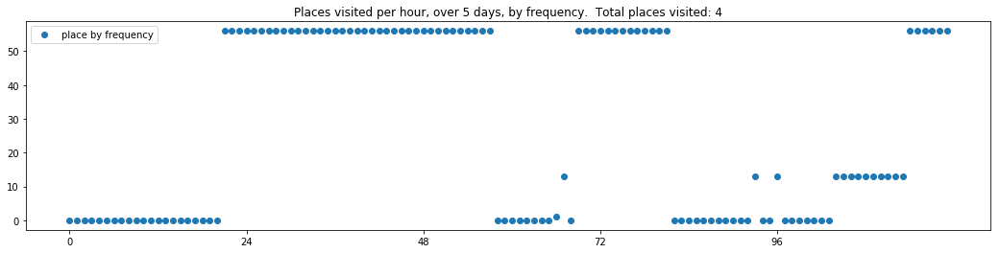

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 558, 0, 558, 0, 0, 0, 0, 0, 558, 0, 0, 558, 76, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 474, 0, 0, 0, 330, 330, 330, 558, 558, 558, 558, 558, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 290, 290, 290, 290, 290, 644, 290, 290, 0, 0, 288, 288, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 450, 450, 498, 498, 558, 558]
[558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 290, 290, 290, 290, 558, 0, 0, 0, 0, 0]


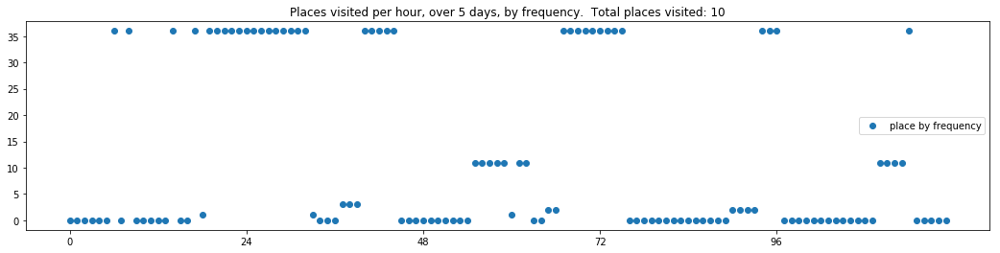

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 236, 236, 236, 236, 558, 558, 236, 236, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 236, 236, 236, 236, 236, 236, 236, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 236, 236, 236, 236, 0, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 545, 545, 545, 373, 236, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 76, 76, 76, 76, 76, 374, 386, 386, 573, 0, 0, 0, 0, 0]


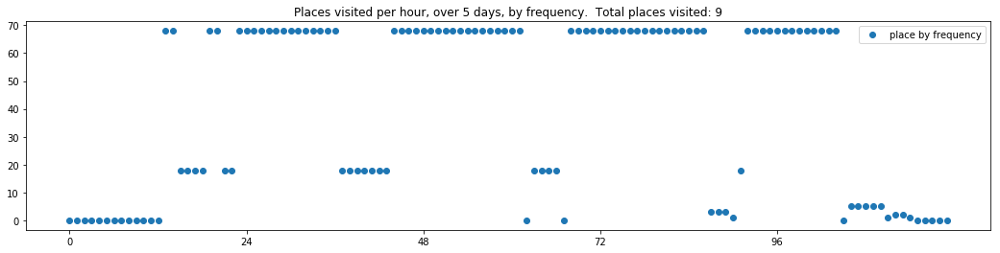

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0]
[0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 450, 373, 373, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 10, 10, 10, 10, 10, 558, 558, 558, 558, 558]


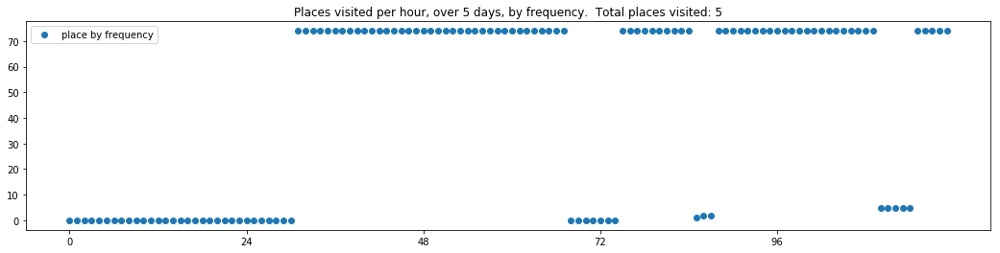

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 346, 132, 132, 132, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 4, 4, 4, 4, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 558, 558, 558]
[0, 0, 0, 0, 0, 317, 317, 317, 317, 317, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 0, 0, 0, 558, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0]


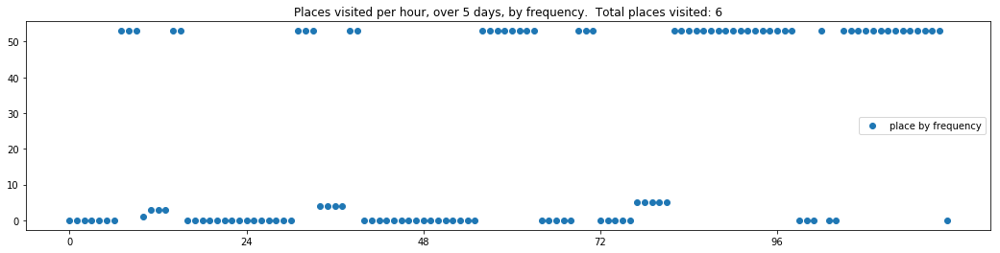

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 558, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]


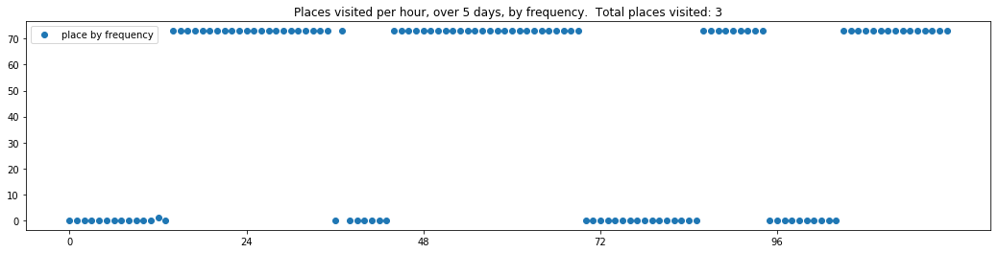

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 364, 364, 364, 0, 100, 100, 552, 21, 21, 21, 21, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558]
[558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[389, 389, 389, 389, 389, 389, 389, 389, 389, 389, 389, 389, 389, 389, 389, 389, 389, 0, 0, 0, 0, 0, 0, 0]


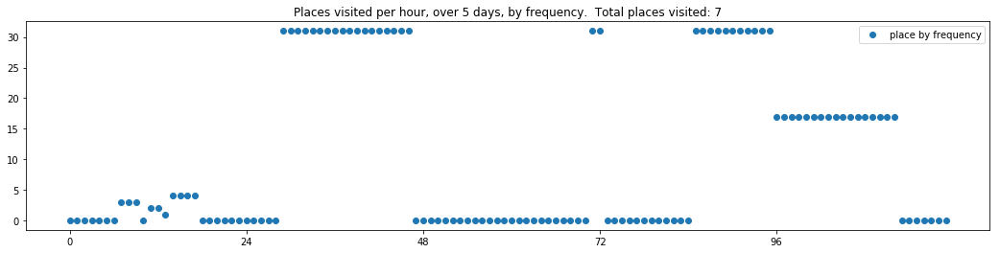

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0]


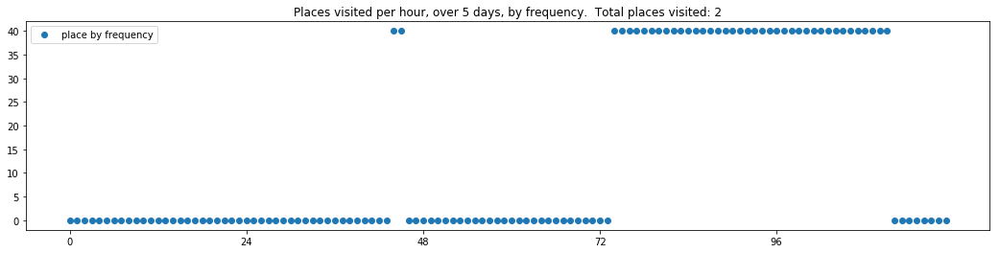

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 574, 558, 558, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 274, 0, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 558, 558, 558]
[0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 157, 432, 24, 24, 0, 558, 558, 558]


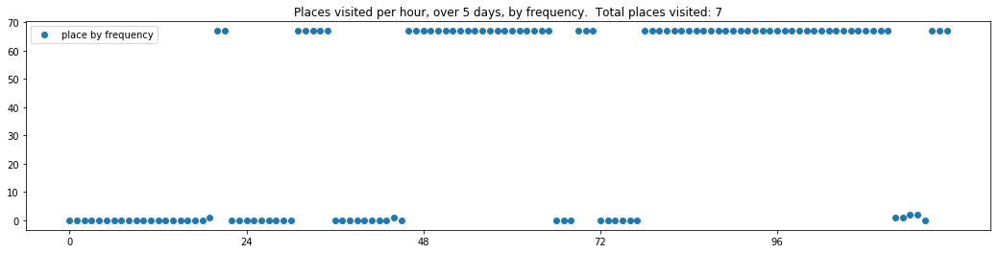

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 143, 143, 143, 143, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 430, 430, 430, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 430, 430, 430, 430, 430]
[430, 430, 430, 430, 430, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 430, 430, 430, 430, 430]
[430, 430, 430, 430, 430, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 430, 430, 430, 430]


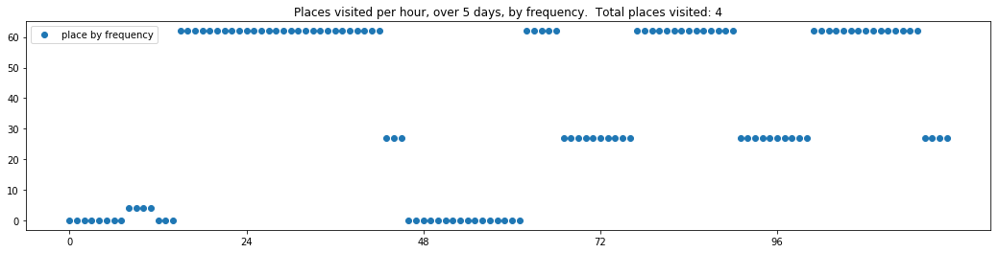

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 173, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 90, 90, 0, 0, 0, 0, 0, 0, 84, 84, 84, 84, 84, 20, 274, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 84, 84, 84, 84, 84, 84, 84, 84]
[84, 84, 458, 0, 0, 0, 90, 0, 122, 0, 0, 0, 84, 84, 84, 84, 84, 84, 84, 84, 84, 84, 84, 84]


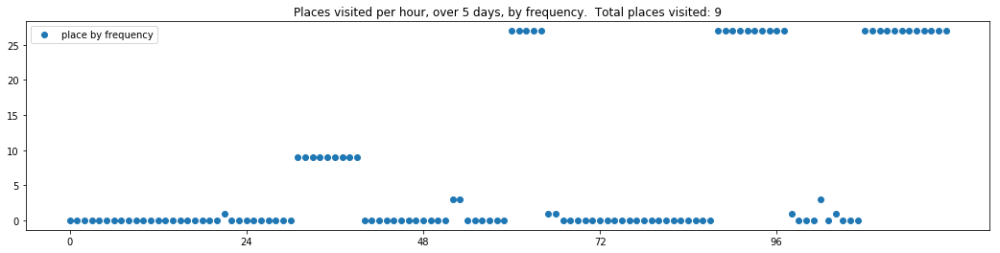

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 236, 236, 558, 558, 0, 0, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 558, 558, 558, 558, 184, 0, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 20, 20, 20, 20, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


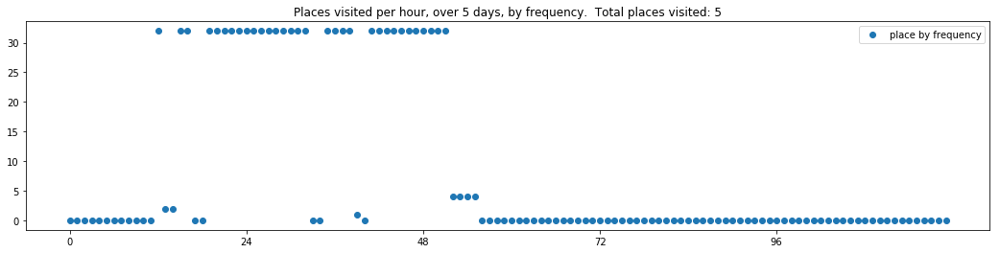

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]


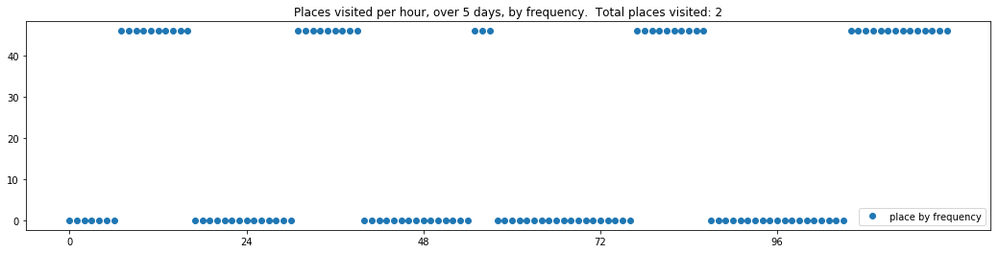

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 0, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558]


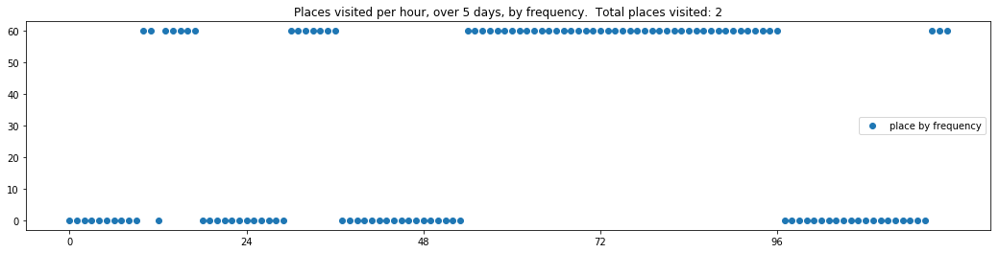

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 571, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 2, 2, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 337, 218, 218, 218, 0, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0]


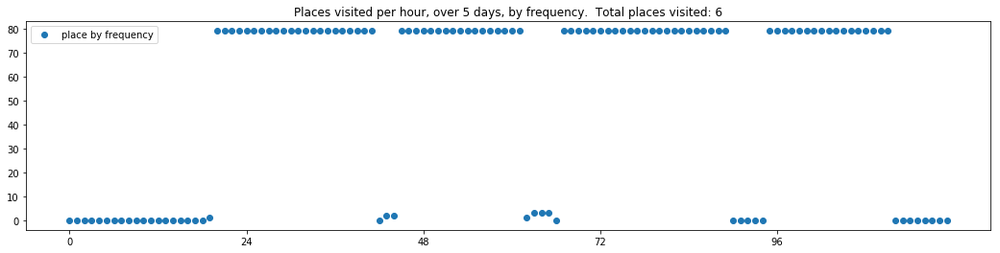

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 450, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 0, 450, 545, 545, 0, 0, 450, 450, 0, 558, 558, 558, 558, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 558, 450, 450, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 0, 0, 558, 558, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 450, 450, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0]


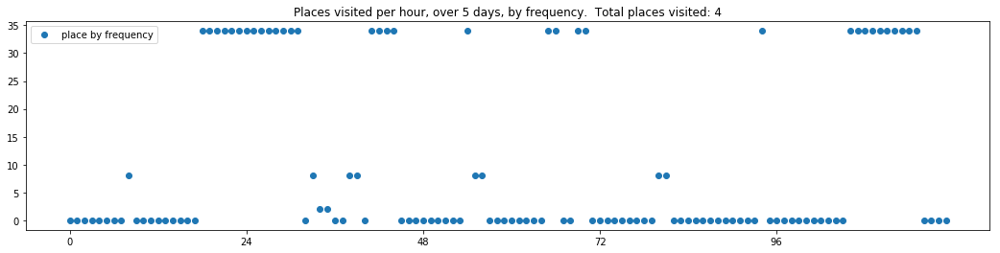

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 323, 495, 495, 495, 495, 603, 386, 386, 386, 386, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 162, 302, 495, 495, 495, 495, 495, 495, 495, 495, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 495, 495, 545, 545, 545, 162, 334, 334, 545, 545, 119, 450]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 519, 519, 571, 271, 545, 404, 447, 0, 0]


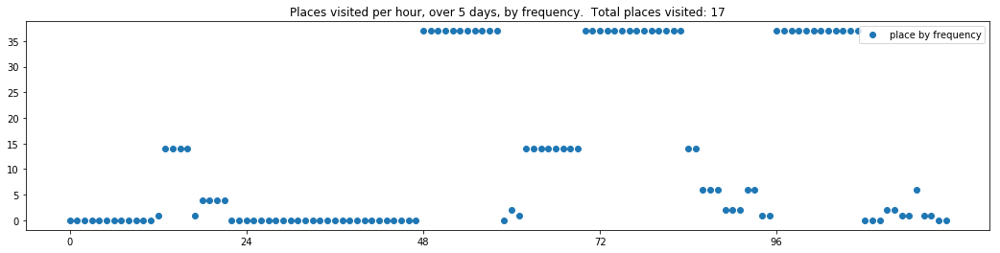

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 558, 373, 373, 373, 373, 373, 373, 373, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 373, 373, 373, 373, 373, 373, 373, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 146, 224]
[4, 4, 146, 146, 146, 146, 146, 146, 146, 146, 146, 146, 146, 146, 146, 146, 146, 146, 146, 146, 146, 146, 146, 4]


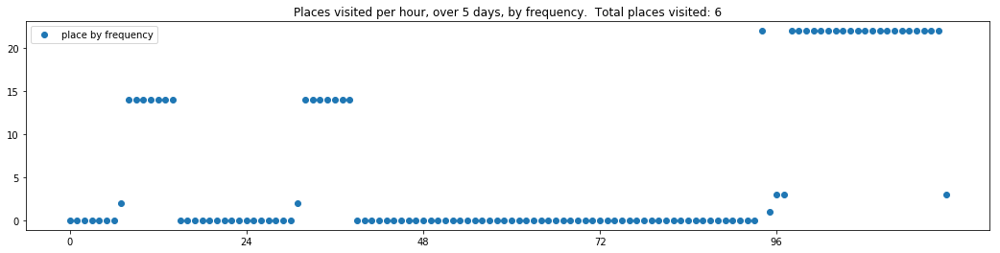

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 434, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 258]


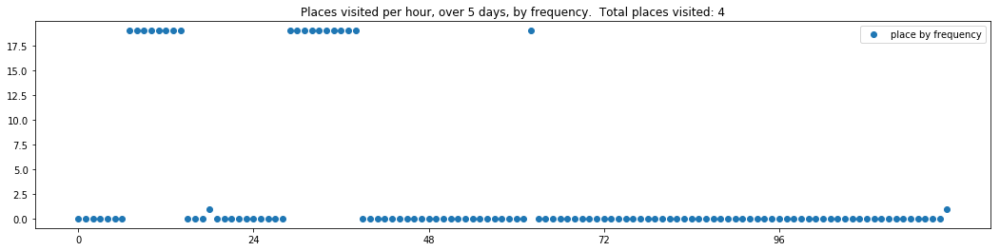

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 20, 20, 20, 20, 20, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 20, 20, 20, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 524, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


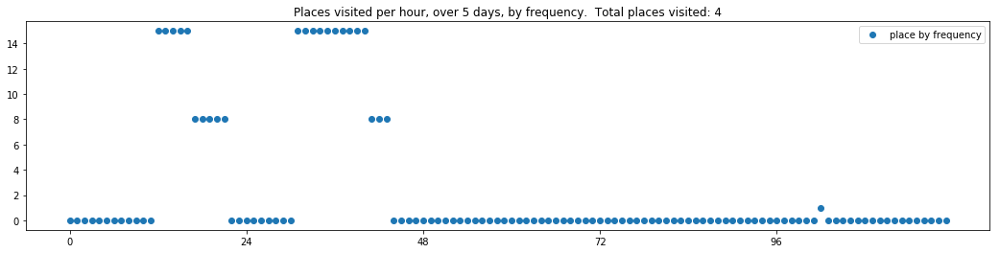

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 0, 558, 558, 558, 558]
[558, 558, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0]
[450, 0, 0, 0, 450, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 450, 450]
[450, 450, 450, 450, 450, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 450, 450, 50, 87]


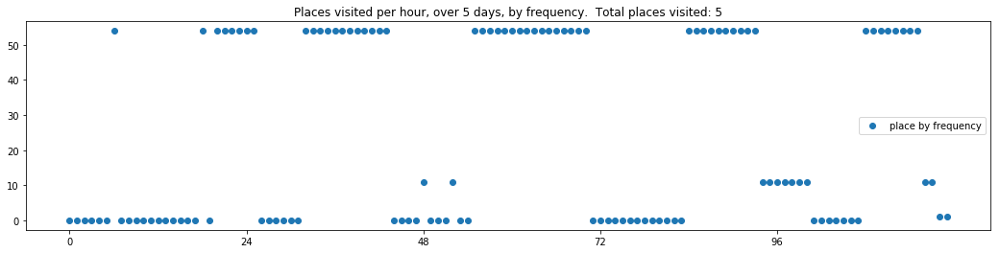

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 539, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 539, 558, 558, 558, 558, 558, 558, 558, 539, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 218, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


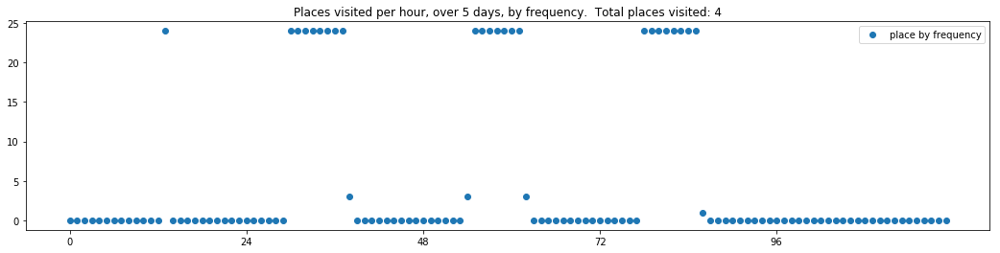

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 0, 558, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 283, 283, 283, 283, 283, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 231, 0, 62, 0, 0, 0, 0, 0, 0, 62, 0, 0, 0, 0, 0, 0]


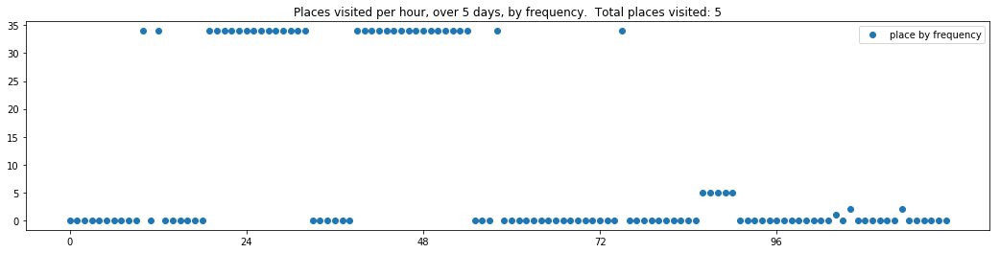

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]


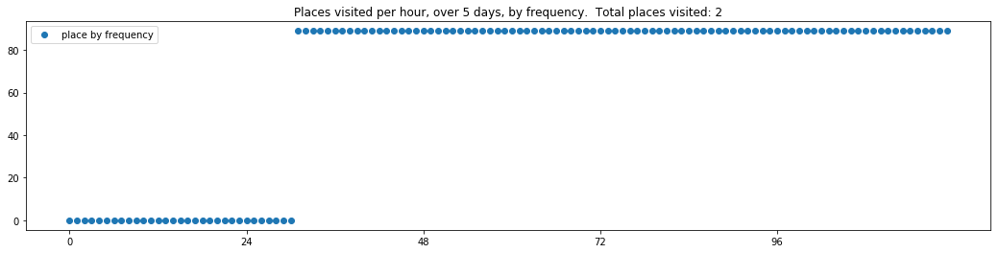

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 274, 236, 236, 236, 236, 485, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 185, 185, 284, 271, 495, 495, 0, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 373, 450, 450, 51, 495, 495, 495, 495, 495, 495, 558, 450, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 450, 373, 184, 76, 76, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 450, 56, 183, 545, 236, 236, 184, 184, 184, 184, 184, 558]


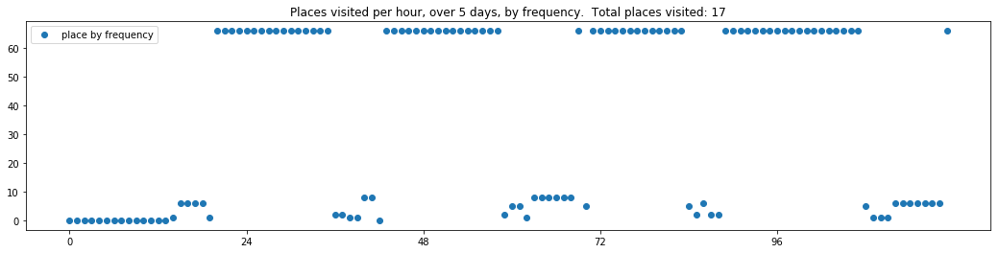

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 450, 450, 450, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 450, 450, 450, 236, 236]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 15, 15]
[15, 15, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 15]
[558, 558, 558, 15, 15, 15, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 579, 450, 558]


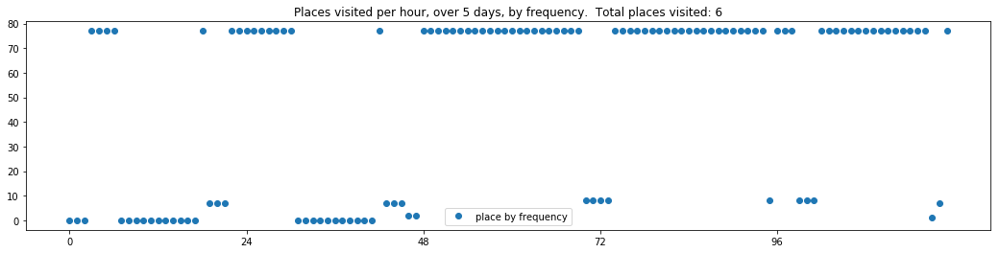

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 147, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 33, 0, 558, 558, 183, 0, 0]
[0, 0, 0, 0, 0, 147, 147, 0, 0, 0, 548, 147, 560, 0, 0, 0, 2, 0, 0, 558, 0, 0, 0, 0]
[0, 0, 0, 0, 147, 147, 147, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 0, 0, 0, 0]
[0, 0, 0, 0, 558, 147, 147, 147, 147, 147, 147, 147, 147, 147, 0, 0, 0, 0, 0, 558, 0, 0, 0, 0]
[0, 0, 558, 0, 147, 147, 147, 147, 147, 147, 147, 147, 147, 147, 147, 0, 558, 558, 0, 0, 0, 0, 0, 0]


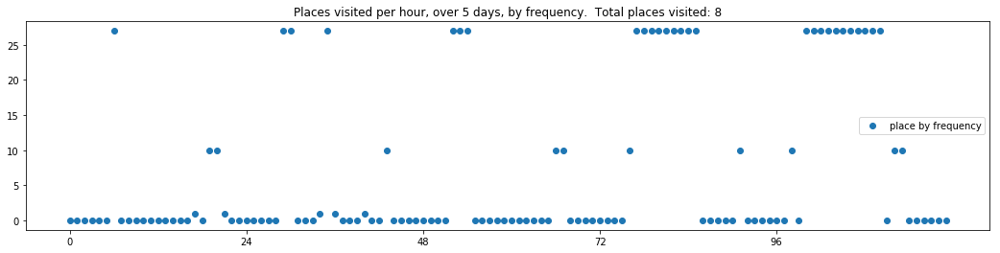

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 0, 0, 0, 558, 558, 558, 558]
[558, 558, 132, 132, 132, 132, 132, 132, 132, 132, 132, 132, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0]
[0, 132, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 0, 0, 0, 0, 0, 0]
[0, 0, 132, 132, 132, 132, 132, 132, 132, 132, 132, 132, 132, 132, 132, 132, 132, 132, 132, 132, 0, 0, 0, 0]


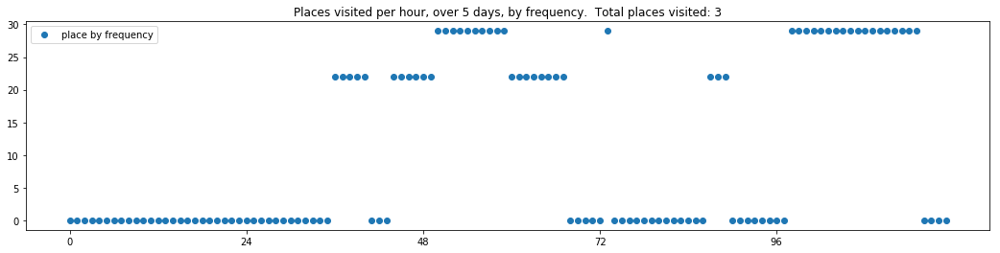

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 557, 0, 0, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 143, 267, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 552, 552, 552, 552]
[558, 558, 0, 0, 0, 0, 0, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558]


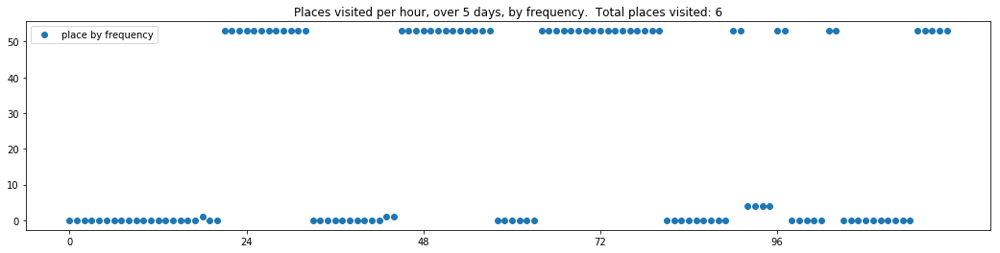

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 157, 157, 157, 0, 0, 0, 0, 0, 157, 0, 157, 0, 0, 0, 0]
[157, 157, 157, 157, 157, 157, 157, 157, 157, 0, 157, 157, 0, 0, 157, 157, 157, 0, 0, 0, 0, 0, 0, 157]
[157, 157, 157, 157, 157, 157, 157, 157, 157, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 157, 157]


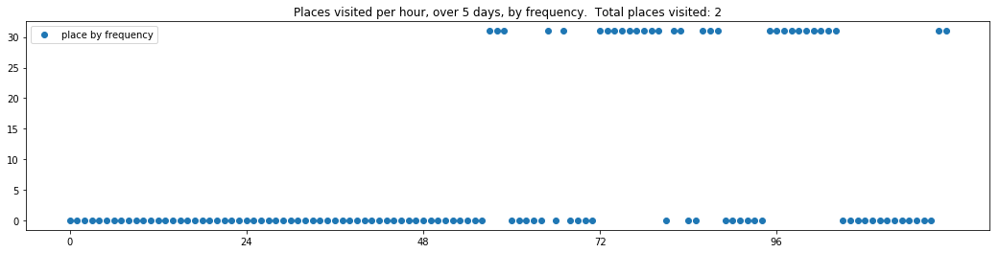

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0]
[558, 0, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0]


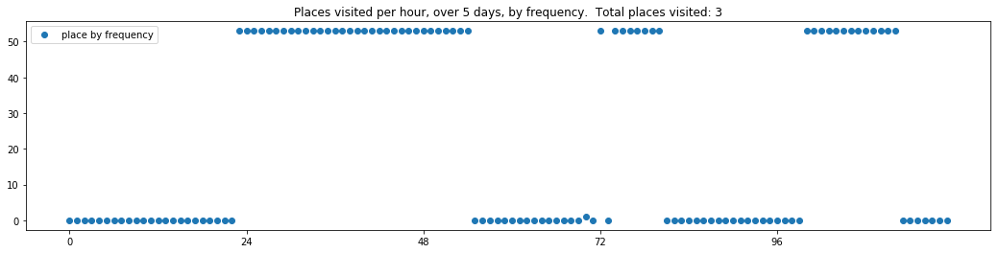

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184]
[184, 184, 184, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


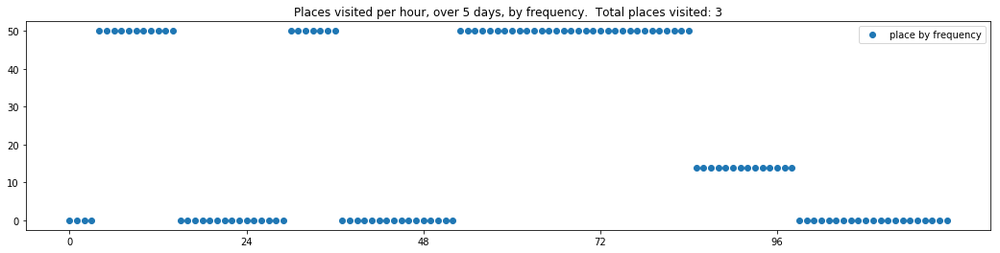

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 227, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 77, 240, 227, 227, 227, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 271, 271, 271, 271, 271, 271]


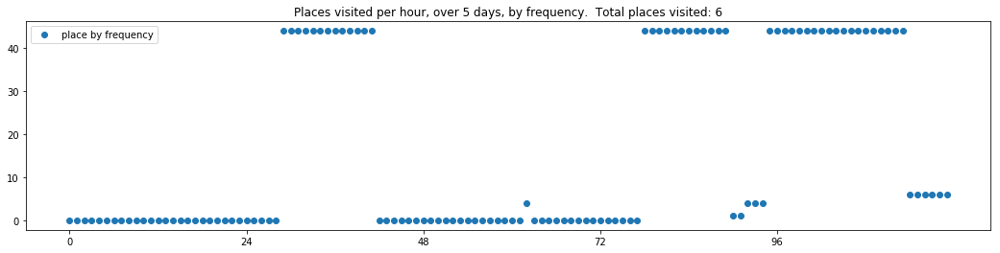

----- vector ----
prefix labels:  [558, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 604, 0, 604, 604, 0, 0, 0, 604, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 604, 604]
[604, 604, 604, 604, 604, 604, 604, 604, 604, 604, 0, 0, 0, 0, 0, 187, 187, 0, 0, 0, 0, 0, 0, 0]


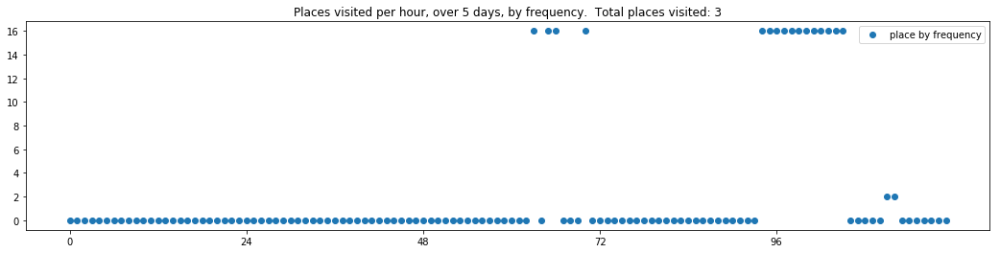

----- vector ----
prefix labels:  [558, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


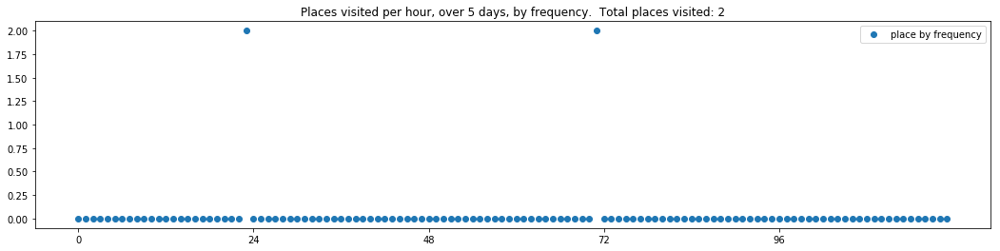

----- vector ----
prefix labels:  [558, 0]
[558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 374, 185, 185, 558, 0, 0]
[0, 0, 0, 0, 0, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 558, 558, 0, 0, 558, 0, 0, 386, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 0, 386, 386, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


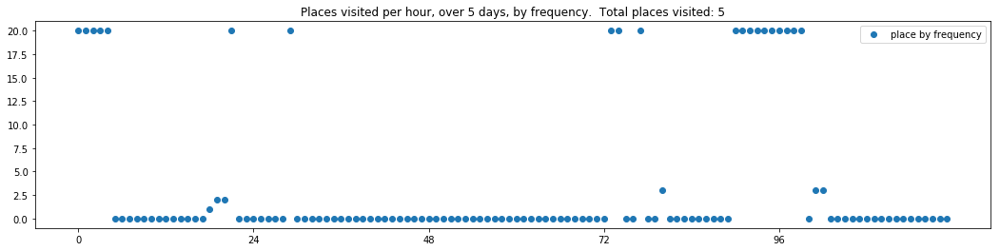

----- vector ----
prefix labels:  [558, 0]
[0, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558]
[558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558]
[558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558]
[558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 0, 0, 0]


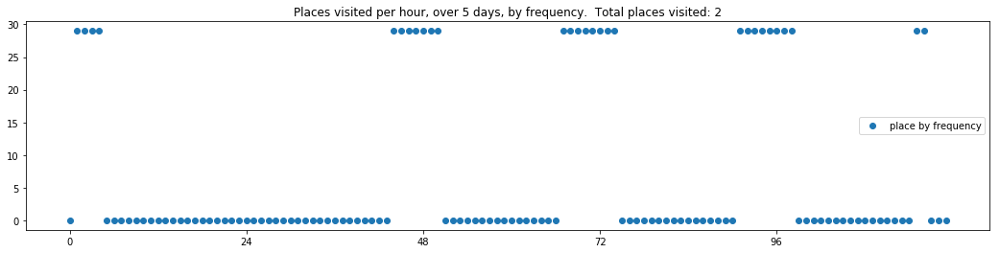

----- vector ----
prefix labels:  [558, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 184, 184, 0, 0, 0, 235, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 184, 184, 184, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 184, 184, 184, 184, 184, 76, 76, 76, 0, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184]


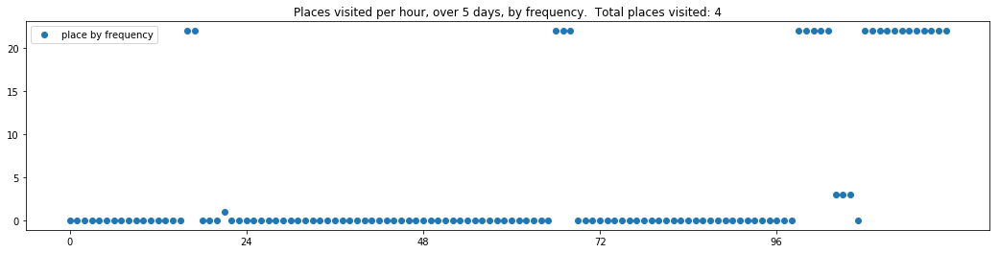

----- vector ----
prefix labels:  [558, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 22, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 636, 636, 636, 143, 558, 0, 0, 0, 0]


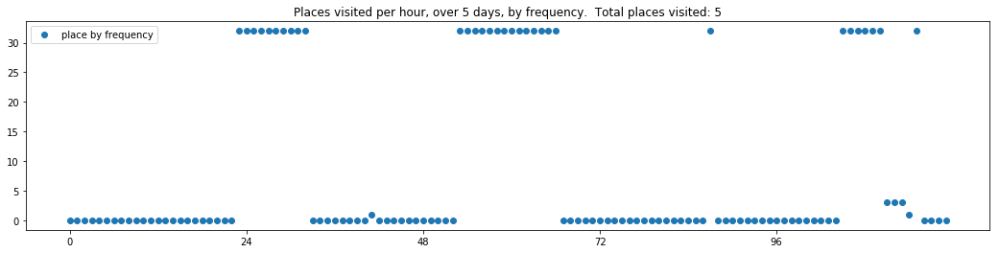

----- vector ----
prefix labels:  [558, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 42, 42, 42, 558, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 570, 570, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 388, 388, 388, 388, 0, 0, 0, 0, 0, 0, 0, 0, 570, 570, 0, 42, 42, 42, 42, 42, 0, 0, 0]


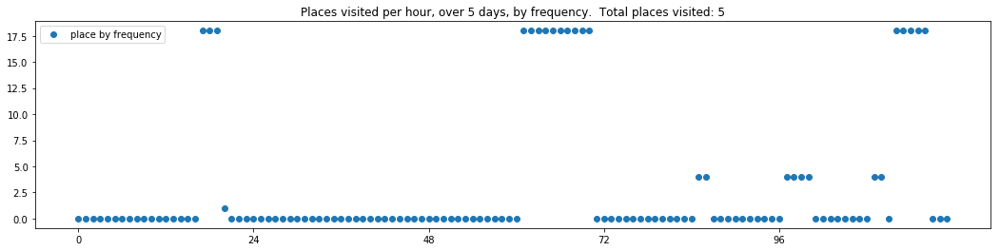

----- vector ----
prefix labels:  [558, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 425, 425, 558, 558, 184, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 474, 0, 0, 0, 0, 0, 0, 0, 330, 0, 0, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 0, 0, 288, 307, 0, 0, 0, 8, 8, 8, 8, 558, 0, 8, 8, 0, 558]
[558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 8, 8, 8, 8, 8, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 8, 8, 8, 8, 8, 393, 393, 393, 393, 393, 393]


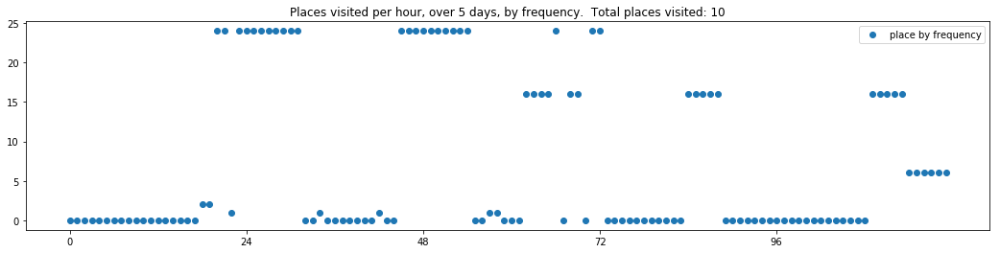

----- vector ----
prefix labels:  [558, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 98, 0, 558, 0, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 76, 76, 76, 76, 76, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 76, 76, 76, 0, 0, 0, 0, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 76, 76, 76, 76, 76, 76, 76, 76, 558, 558]


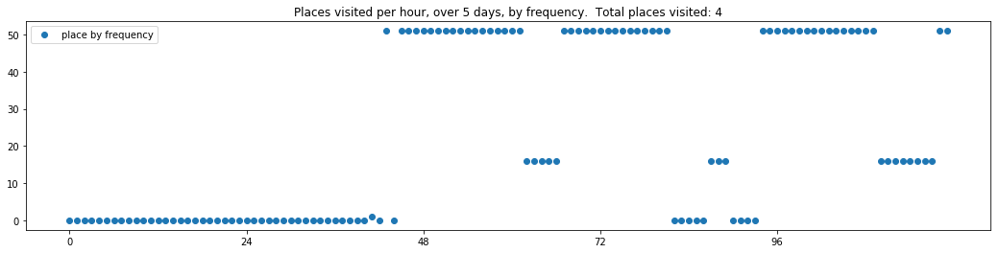

----- vector ----
prefix labels:  [558, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 495, 495, 495, 558, 558]
[558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 373, 373, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 558, 558, 558, 558, 558, 558, 373, 373, 373, 369, 369, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 558, 558, 558, 558, 373, 373, 373, 373, 373, 369, 369, 369, 369, 369, 369, 369, 369, 369, 369, 369, 369, 369, 369]


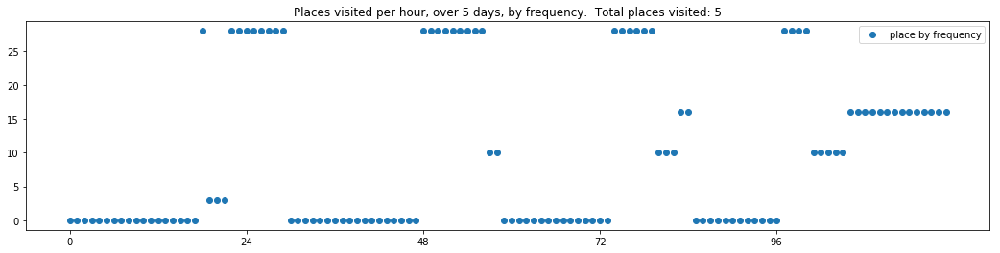

----- vector ----
prefix labels:  [558, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 450, 450, 450, 558, 558, 558]
[558, 558, 374, 566, 566, 566, 566, 566, 566, 566, 566, 566, 566, 566, 566, 566, 566, 357, 357, 357, 357, 357, 357, 357]
[357, 357, 357, 360, 498, 498, 498, 566, 566, 566, 566, 566, 566, 566, 566, 566, 566, 566, 0, 450, 298, 298, 298, 298]
[298, 298, 298, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 357, 357]


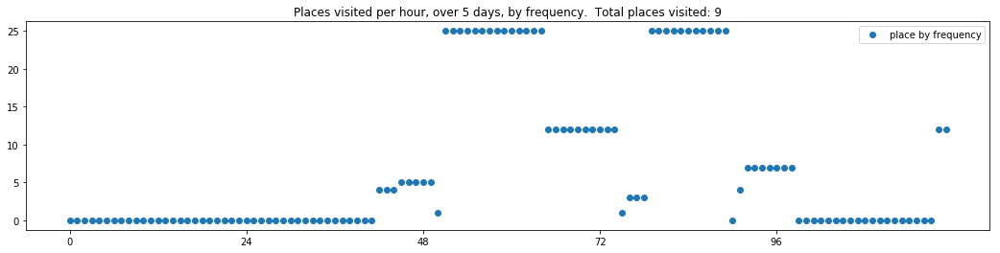

----- vector ----
prefix labels:  [558, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 50, 0, 0, 558, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 184, 184, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 499, 267, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 269, 269, 0, 0, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184]


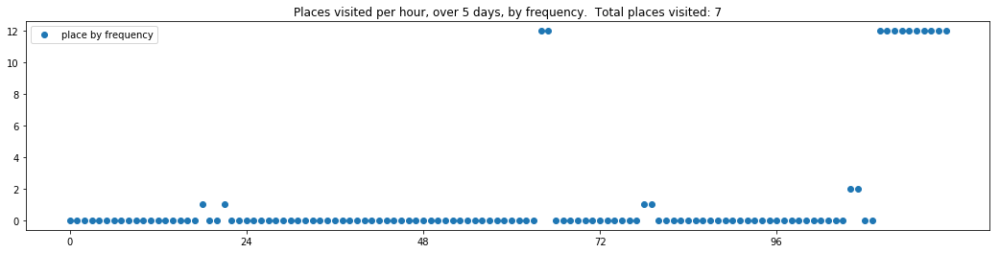

----- vector ----
prefix labels:  [558, 373]
[0, 0, 0, 0, 0, 0, 0, 0, 21, 21, 21, 21, 240, 21, 21, 21, 21, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 21, 21, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 21, 21, 21, 21, 21, 21, 21, 21, 21, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 21, 21, 0, 0, 21, 8, 0, 55, 55, 55, 0, 0, 0, 0, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55, 0]


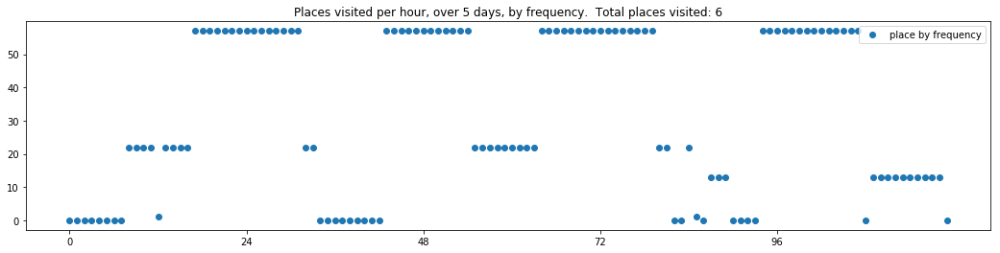

----- vector ----
prefix labels:  [558, 373]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 485, 485, 464, 373, 373, 373, 0, 373, 373, 373, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 373, 485, 485, 485, 485, 485, 485, 373, 373, 373, 373, 558, 0]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 373, 373, 373, 373, 373, 373, 0, 0, 0, 0, 0, 558, 0]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 373, 373, 373, 373, 373, 373, 641, 373, 450, 373, 373, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 373, 373, 373, 373, 373, 373, 369, 274, 274, 0, 0, 0, 0]


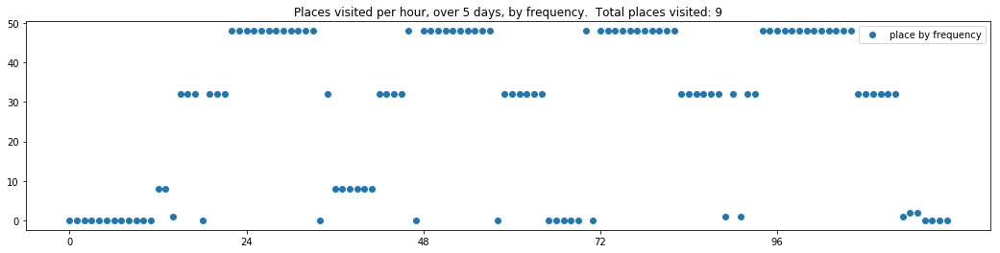

----- vector ----
prefix labels:  [558, 98]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 98, 98, 98, 98, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 0, 0, 0, 0, 0, 0, 0, 98, 98, 98, 0, 0, 98, 0, 69, 69]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 98, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 0, 0, 0, 0, 0, 8, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 22, 0, 0, 98, 98, 0, 0, 0, 0, 0, 0, 0, 0, 0]


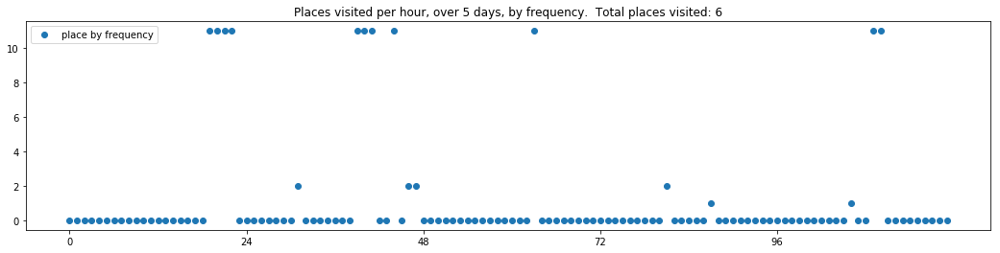

----- vector ----
prefix labels:  [558, 98]
[0, 0, 0, 0, 0, 0, 0, 558, 98, 98, 98, 98, 98, 98, 98, 98, 98, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 0, 0, 0]
[0, 171, 0, 0, 0, 0, 473, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 98, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 98, 98, 0, 0, 98, 98, 98, 98, 98, 98, 98, 98, 98, 0, 98, 98, 0, 525, 525]


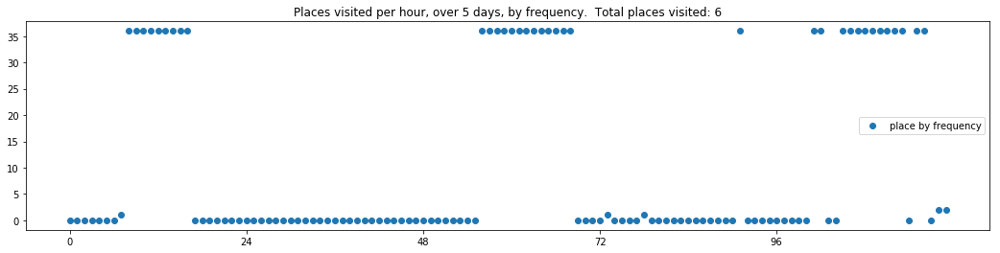

----- vector ----
prefix labels:  [558, 119]
[0, 0, 0, 0, 0, 0, 0, 119, 119, 119, 119, 119, 119, 119, 119, 0, 0, 0, 0, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 0, 119, 119, 119, 119, 119, 119, 119, 119, 0, 0, 558, 558, 574, 574, 574, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 119, 119, 119, 0, 0, 0, 0, 0, 0, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]


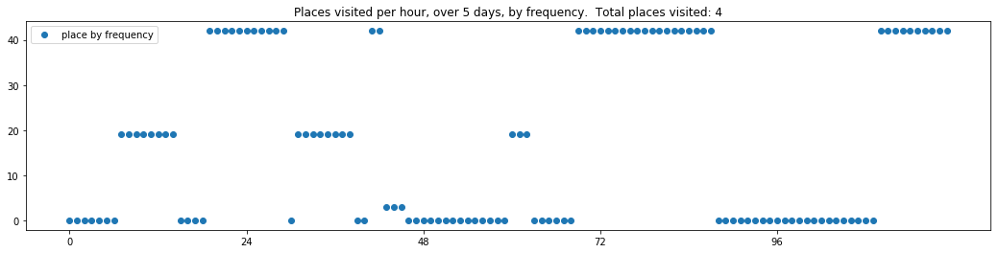

----- vector ----
prefix labels:  [558, 119]
[0, 0, 0, 0, 0, 0, 0, 119, 119, 119, 119, 119, 119, 119, 119, 119, 119, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 119, 119, 119, 119, 119, 119, 119, 119, 119, 119, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 119, 119, 119, 119, 558, 558, 558, 558, 558, 558, 0, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 119, 119, 119, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 119, 55, 55, 55, 55]


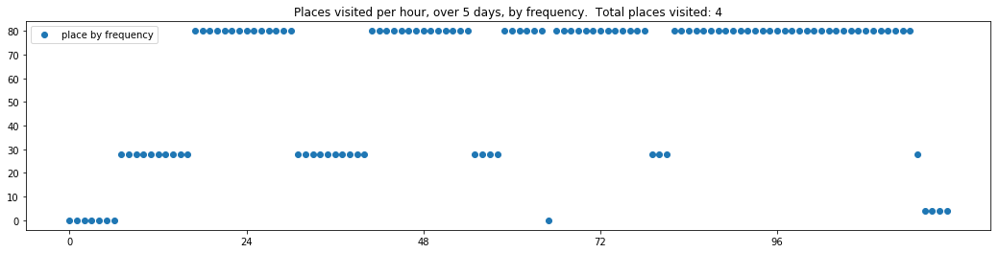

----- vector ----
prefix labels:  [558, 119]
[0, 0, 0, 0, 0, 0, 119, 119, 119, 119, 119, 119, 119, 119, 119, 119, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 119, 119, 119, 119, 119, 119, 119, 119, 119, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 573, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 373, 185, 185, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0]


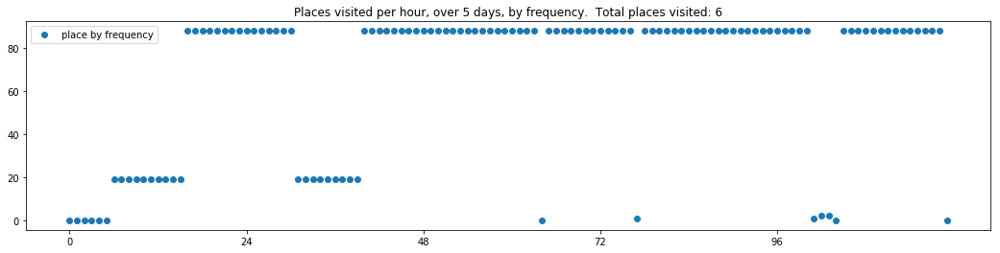

----- vector ----
prefix labels:  [558, 119]
[0, 0, 0, 0, 0, 0, 0, 558, 119, 119, 119, 119, 119, 119, 119, 119, 119, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 0, 119, 119, 119, 119, 119, 119, 119, 119, 119, 119, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 119, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 119, 119, 119, 119, 119, 119, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 119, 119, 119, 119, 119, 119, 119, 558, 558, 558, 558, 558, 558, 558]


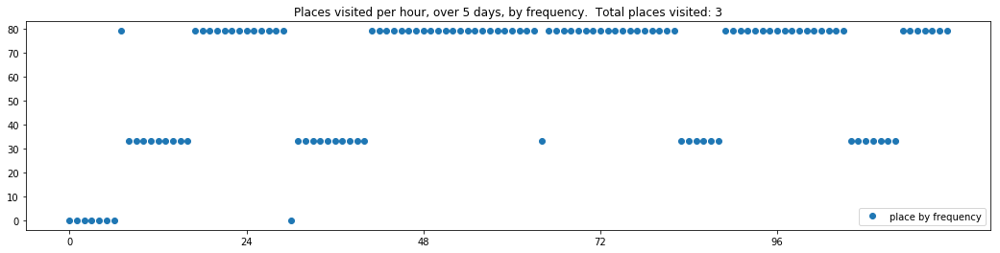

----- vector ----
prefix labels:  [558, 21]
[0, 0, 0, 0, 0, 0, 0, 0, 558, 21, 21, 21, 21, 21, 21, 21, 21, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 21, 21, 21, 21, 21, 21, 21, 21, 21, 558, 558, 558, 558, 558, 558, 558]


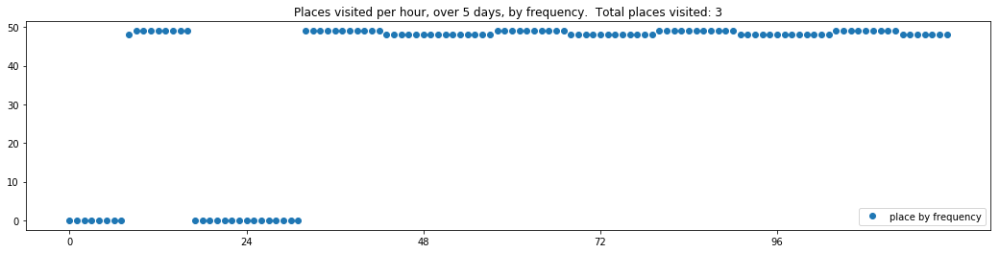

----- vector ----
prefix labels:  [558, 21]
[0, 0, 0, 0, 0, 0, 558, 21, 21, 21, 21, 21, 21, 21, 21, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 88, 88, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 88, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


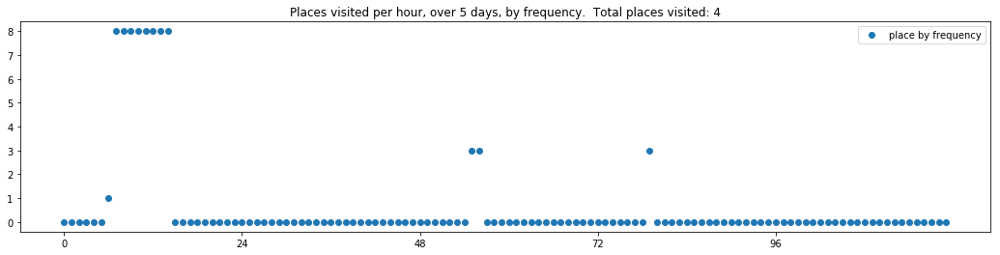

----- vector ----
prefix labels:  [558, 21]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 0, 558, 0, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 56, 21, 21, 0, 495, 21, 21, 21, 21, 0, 0, 0, 0, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 21, 76, 0, 0, 236, 236, 558, 558, 558, 558, 99, 99, 99, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 373, 0, 184, 184, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 494, 184, 184, 545, 334, 558, 558, 558, 99, 99, 558, 558, 558]


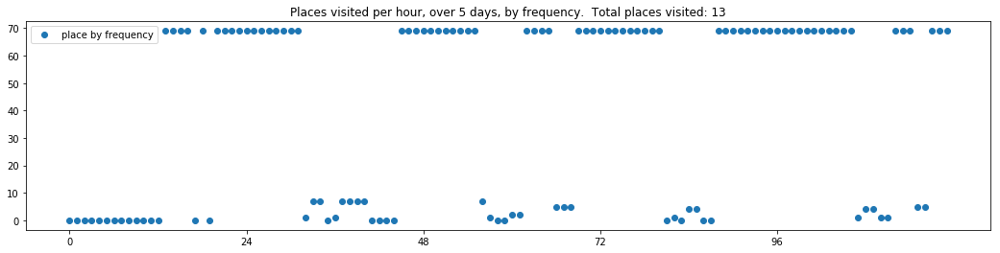

----- vector ----
prefix labels:  [558, 21]
[0, 0, 0, 0, 0, 0, 0, 558, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 21, 21, 21, 21, 21, 21, 21, 21, 21, 558, 558, 373, 373, 373, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 21, 21, 21, 21, 21, 21, 21, 21, 21, 558, 558, 373, 373, 373, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 21, 21, 21, 21, 21, 21, 21, 21, 448, 448, 558, 558, 558, 558, 558]


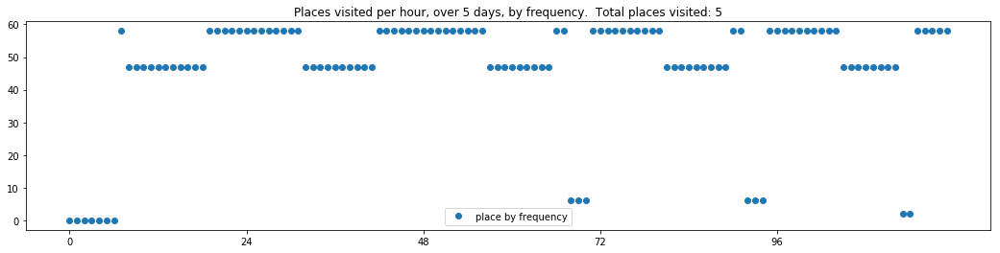

----- vector ----
prefix labels:  [558, 21]
[0, 0, 0, 0, 0, 0, 0, 0, 55, 21, 21, 21, 21, 21, 21, 21, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 21, 21, 21, 21, 21, 21, 21, 21, 21, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 362, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 537, 537, 537, 537]


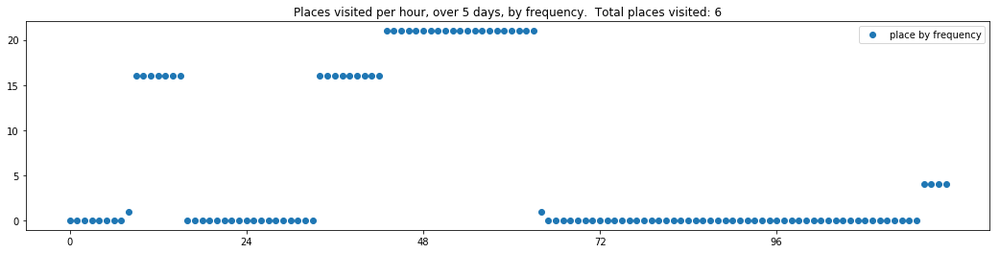

----- vector ----
prefix labels:  [558, 21]
[0, 0, 0, 0, 0, 0, 558, 558, 21, 21, 21, 21, 21, 21, 21, 21, 0, 0, 0, 558, 0, 0, 558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 21, 21, 21, 0, 21, 21, 21, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 0, 21, 21, 21, 21, 21]
[21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 0, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21]


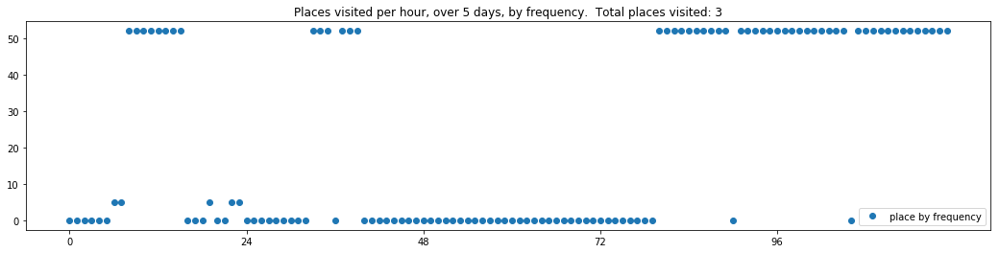

----- vector ----
prefix labels:  [558, 267]
[0, 0, 0, 0, 0, 0, 0, 267, 267, 267, 267, 267, 267, 267, 267, 558, 558, 558, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 267, 267, 558, 558, 558, 558, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 406, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 69, 267, 267, 267, 267, 373, 450, 267, 267, 119, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 267, 267, 267, 267, 267, 267, 267, 267, 267, 551, 551, 558, 558, 558, 558, 558, 558, 558, 558]


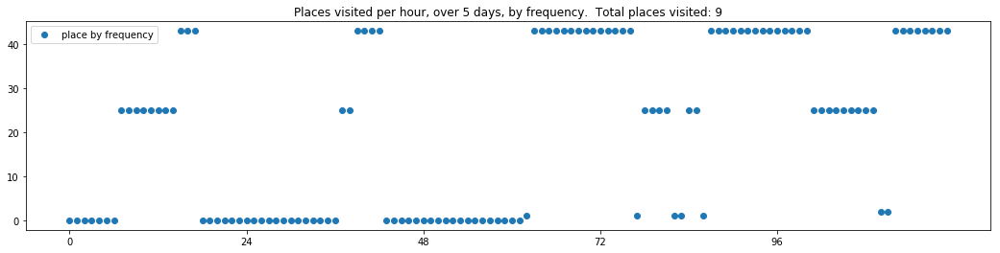

----- vector ----
prefix labels:  [558, 267]
[0, 0, 0, 0, 0, 0, 20, 0, 0, 267, 267, 267, 0, 0, 0, 0, 267, 267, 267, 558, 558, 558, 0, 0]
[0, 0, 0, 0, 0, 267, 0, 0, 267, 267, 267, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 267, 267, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 267, 267, 0, 0, 0, 267, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 267, 267, 267, 143, 0, 0, 0, 0, 0, 0, 0, 0, 0, 267]


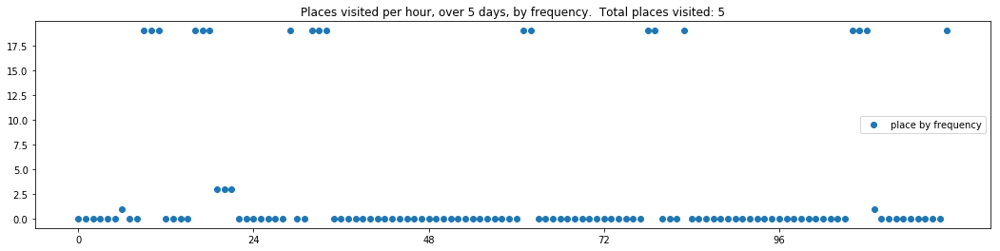

----- vector ----
prefix labels:  [558, 94]
[0, 0, 0, 0, 0, 0, 0, 0, 432, 480, 480, 0, 450, 450, 450, 0, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 389, 389, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 389, 389, 0, 0, 0, 389, 389, 389, 389, 389]
[389, 389, 389, 389, 389, 389, 389, 0, 389, 389, 389, 389, 389, 389, 389, 389, 389, 389, 389, 389, 389, 389, 389, 389]


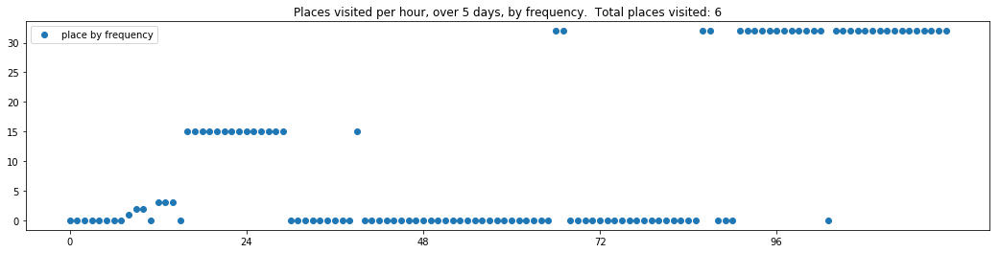

----- vector ----
prefix labels:  [558, 94]
[0, 0, 0, 0, 0, 0, 0, 0, 94, 94, 94, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 94, 94, 94, 94, 94, 94, 94, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 94, 94, 94, 94, 94, 94, 94, 94, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 94, 94, 94, 94, 94, 94, 94, 94, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


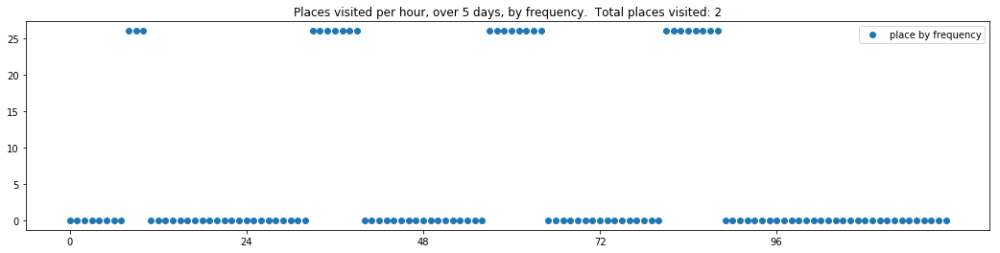

----- vector ----
prefix labels:  [558, 450]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 450, 450, 450, 236, 236, 236, 236, 450, 450, 495, 495, 495, 0, 558]
[558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 558, 450, 450, 450, 450, 236, 236, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 236, 236, 236, 236, 236, 236, 236, 236, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 267, 287, 287, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 558, 558, 558, 558, 558, 267, 287, 287, 267, 450, 236, 236, 236, 236, 236, 236, 236, 236, 236, 236, 0]


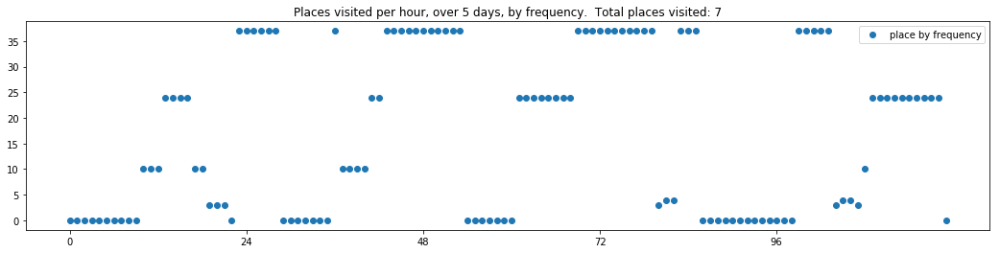

----- vector ----
prefix labels:  [558, 450]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 450, 450, 450, 450, 450, 450, 450, 450, 450, 450, 450, 450, 450, 558, 558]
[558, 558, 0, 0, 450, 450, 450, 450, 450, 450, 450, 450, 450, 450, 450, 450, 450, 450, 450, 450, 450, 450, 450, 573]
[573, 573, 450, 450, 450, 450, 450, 450, 450, 450, 450, 450, 450, 450, 450, 450, 450, 450, 450, 0, 450, 450, 558, 558]
[558, 558, 558, 450, 450, 450, 450, 450, 450, 450, 450, 450, 450, 450, 450, 450, 450, 0, 0, 0, 0, 0, 0, 0]


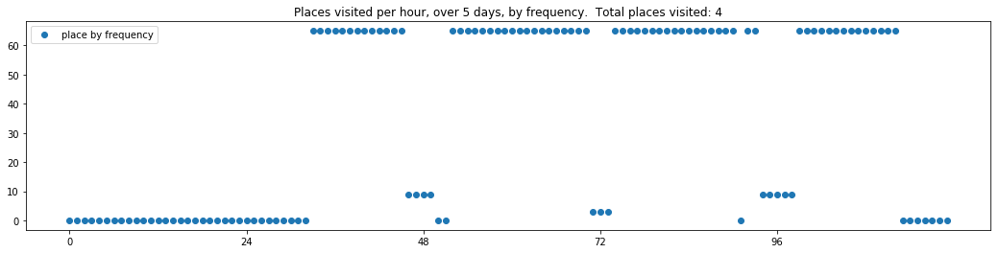

----- vector ----
prefix labels:  [558, 450]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 448, 448, 448, 55, 448, 0, 0, 0, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 448, 448, 448, 448, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558]
[558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558]


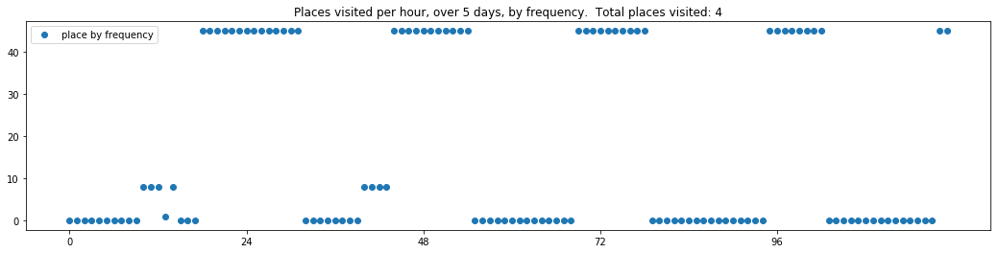

----- vector ----
prefix labels:  [558, 450]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 450, 464, 558, 558, 558, 573, 573, 573, 573, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 450, 450, 0, 0, 0, 638, 450, 373, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 450, 450, 88, 88, 0, 450, 485, 485, 450, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 573, 450, 450, 558, 558, 450, 450, 558, 0, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 4, 4, 4, 4, 4, 4, 4, 558, 558, 558, 0, 0, 558, 558, 558, 558]


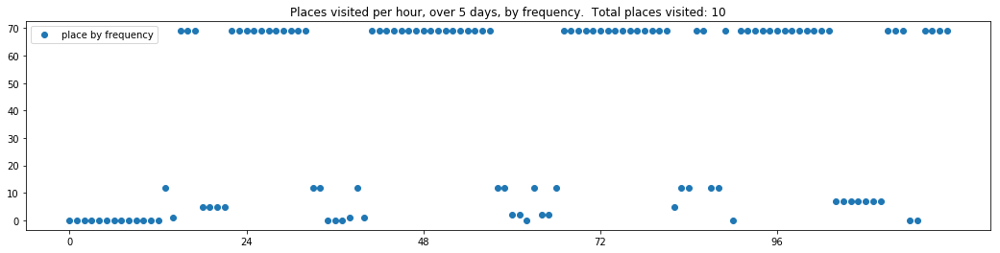

----- vector ----
prefix labels:  [558, 184]
[0, 0, 0, 0, 0, 0, 0, 558, 184, 184, 184, 184, 184, 184, 184, 184, 184, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 184, 184, 184, 184, 184, 184, 184, 184, 186, 186, 186, 186, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 184, 184, 184, 184, 184, 184, 184, 184, 184, 183, 183, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 184, 184, 184, 184, 184, 184, 184, 76, 184, 184, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 184, 184, 76, 184, 184, 184, 184, 184, 184, 184, 558, 558, 558, 558, 558, 558, 558]


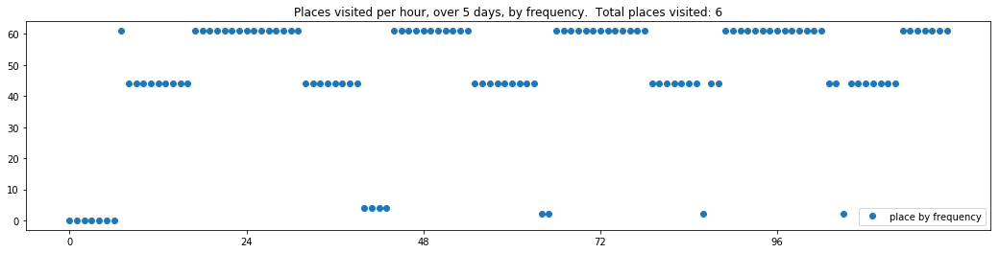

----- vector ----
prefix labels:  [558, 184]
[0, 0, 0, 0, 0, 0, 0, 0, 558, 184, 184, 184, 184, 184, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 184, 184, 184, 184, 184, 184, 184, 184, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 0, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 184, 184, 184, 184, 0, 0, 0, 0, 184, 184, 0, 558, 558, 558, 558, 558]


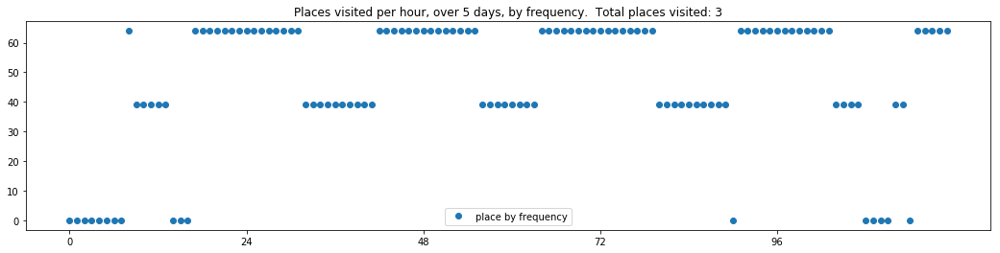

----- vector ----
prefix labels:  [558, 76]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558]
[558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 76, 76, 558, 558, 558, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 236, 261, 261, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558]


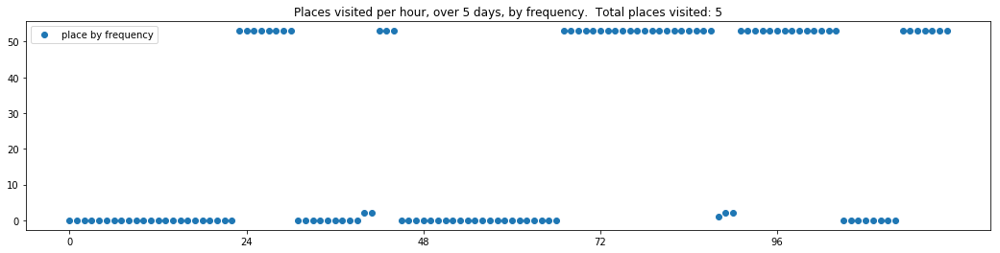

----- vector ----
prefix labels:  [558, 76]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 76, 76, 76, 76, 76, 76, 76, 76, 76, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 76, 76, 76, 76, 76, 76, 76, 0, 0, 0, 0, 0, 0, 0, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 269, 269, 20, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


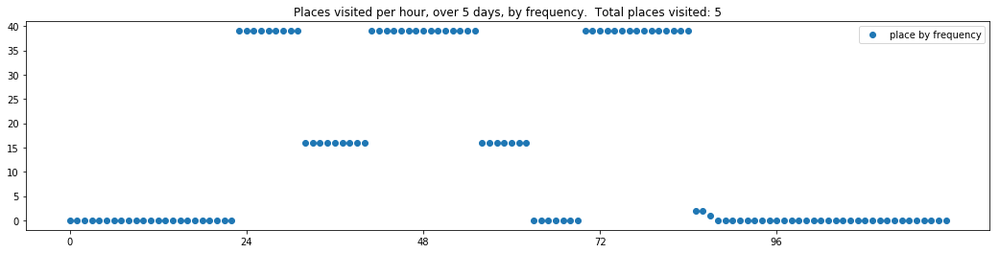

----- vector ----
prefix labels:  [558, 76]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 603, 485, 485, 603, 603, 0, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 637, 637, 76, 76, 76, 76, 76, 76, 76, 76, 0, 0, 558, 558, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 76, 76, 76, 76, 603, 603, 0, 558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 76, 76, 76, 76, 76, 76, 76, 76, 184, 184, 184, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 386, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


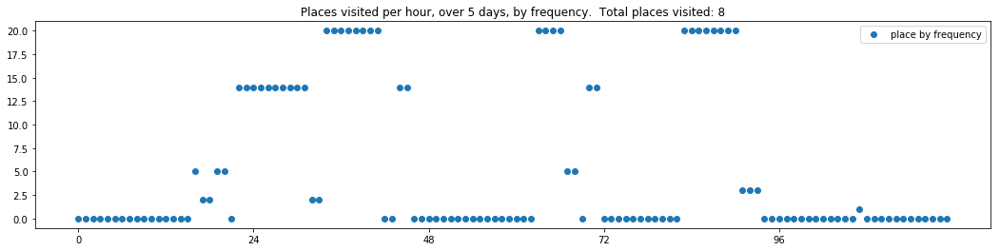

----- vector ----
prefix labels:  [558, 76]
[0, 0, 0, 0, 0, 0, 0, 0, 76, 76, 76, 76, 76, 76, 76, 76, 76, 558, 558, 450, 450, 450, 450, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 76, 76, 76, 76, 76, 76, 76, 76, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 0, 76, 76, 76, 375, 76, 76, 76, 76, 558, 558, 450, 450, 450, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 97, 76, 76, 76, 76, 76, 76, 0, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


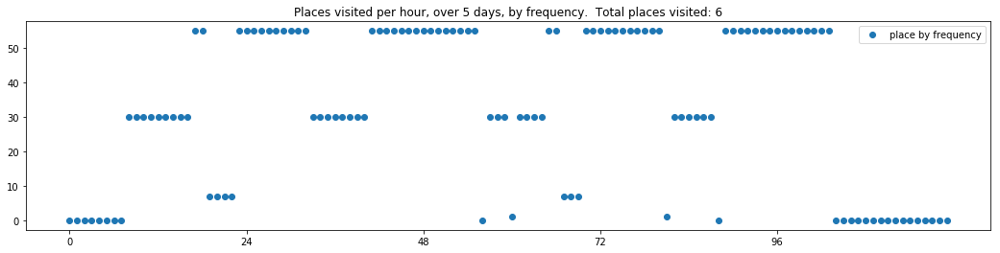

----- vector ----
prefix labels:  [558, 571]
[0, 0, 0, 0, 0, 0, 0, 0, 571, 571, 571, 571, 571, 571, 571, 571, 0, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 571, 571, 571, 571, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 571, 571, 571, 571, 571, 571, 571, 571, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 638, 560, 560, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 450, 0, 180, 180, 558, 558]


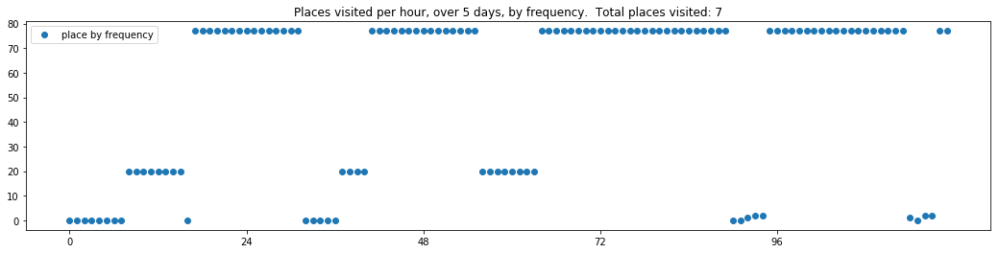

----- vector ----
prefix labels:  [558, 571]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 571, 571, 571, 571, 374, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 21, 0, 0, 0, 0, 0, 0, 0, 0, 571, 571, 571, 571, 571, 571, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 374, 571, 571, 571, 571, 571, 571, 571, 571]
[571, 571, 571, 571, 97, 50, 21, 644, 571, 571, 571, 498, 571, 571, 571, 571, 571, 571, 571, 571, 571, 571, 571, 571]


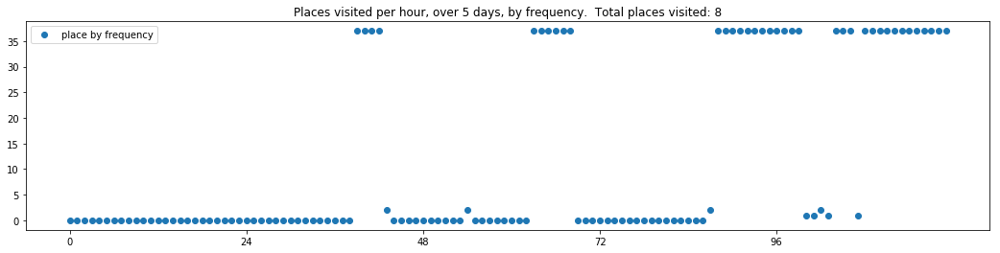

----- vector ----
prefix labels:  [558, 278]
[0, 0, 0, 0, 0, 0, 558, 119, 119, 119, 119, 0, 185, 0, 84, 84, 558, 464, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 119, 119, 119, 119, 49, 49, 430, 430, 178, 178, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 119, 119, 119, 119, 119, 119, 84, 573, 84, 180, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 119, 119, 119, 269, 0, 0, 560, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 560, 636, 636, 87, 558, 558, 558, 558, 558, 558, 558, 558]


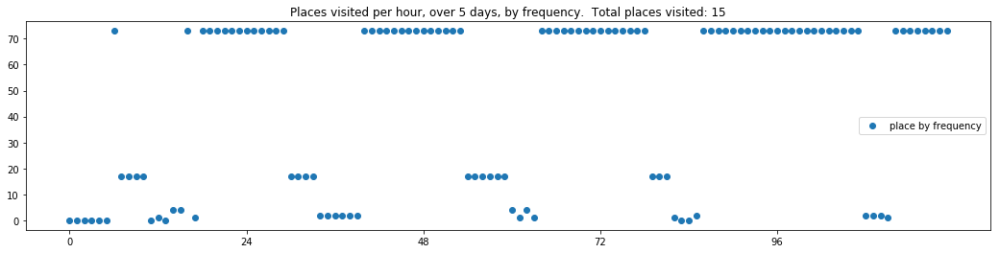

----- vector ----
prefix labels:  [558, 278]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 299, 299, 299, 558, 558, 558, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 299, 0, 268, 268, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 66, 66, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 268, 0, 0, 268, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


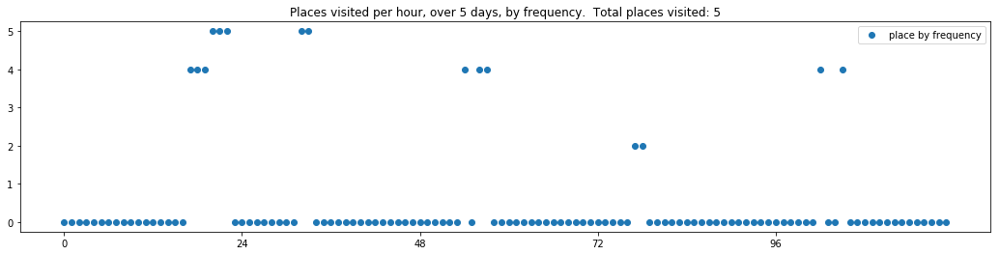

----- vector ----
prefix labels:  [558, 222]
[0, 0, 0, 0, 0, 0, 0, 0, 374, 374, 0, 0, 0, 222, 222, 323, 323, 558, 558, 558, 274, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 287, 0, 222, 222, 222, 222, 222, 222, 222, 222, 222, 146, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 0, 0, 222, 222, 222, 222, 222, 222, 222, 222, 222, 222, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 222, 222, 222, 222, 222, 222, 222, 222, 222, 222, 222, 222, 0, 558, 558, 558]
[558, 558, 558, 0, 558, 558, 558, 558, 558, 222, 222, 222, 222, 222, 222, 222, 222, 222, 222, 558, 558, 558, 558, 558]


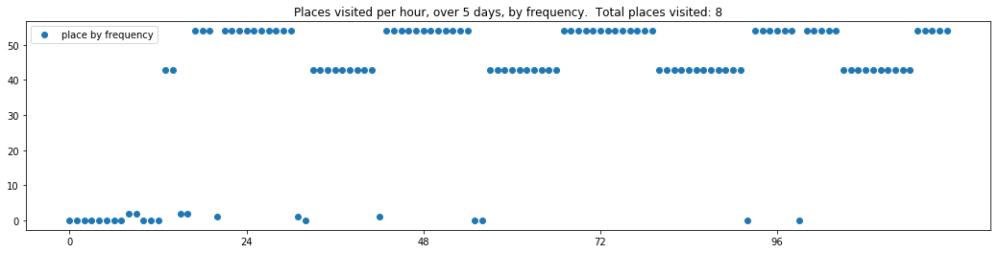

----- vector ----
prefix labels:  [558, 222]
[0, 0, 0, 0, 0, 0, 0, 0, 222, 222, 222, 222, 222, 222, 222, 222, 450, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 0, 0, 222, 222, 222, 222, 222, 222, 222, 0, 0, 0, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 222, 222, 222, 222, 222, 222, 222, 222, 222, 222, 0, 0, 222, 222, 222, 222, 558, 558, 558]
[558, 558, 558, 558, 558, 0, 0, 0, 0, 222, 222, 222, 222, 222, 222, 222, 0, 0, 0, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 222, 222, 222, 222, 222, 222, 222, 222, 222, 222, 222, 222, 222, 222, 558, 558, 558, 558, 558]


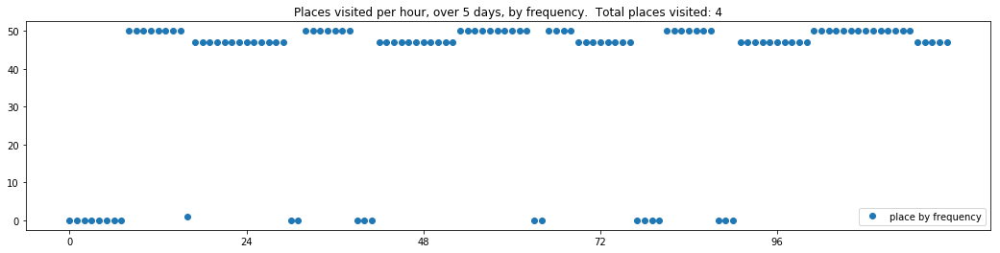

In [16]:
for tv in textgenrnn_cambridge_trajectories_set[1.0][:2*sample_size]:
    print_dwell_vector_by_days(tv)
    plot_trajectory_vector_frequencies(tv, by_frequency_order=False) 

## Evaluators

### check that fake users do not travel impossibly far

We check that between two consecutive time intervals, synthetic users don’t travel impossibly far; that is, they don’t suddenly go from one census area to another that is too far away to have been traveled within that time interval.  We can do this by looking at the geographic locations of the centroids or the boundaries of census areas.  We consider two consecutive stay locations in a stay vector sequence as a bigram, and must verify that each bigram is sensible. It is possible for sensible bigrams in the generated data to occur that have not been seen in the training data. However, instead of verifying that all such bigrams are sensible, we have a shortcut due to how well our RNN models are fit to our training data.  We are able to collect the set of bigrams in the real sequences, and the set of bigrams in the synthetic sequences, and check whether only bigrams from the real sequences occur in the synthetic sequences.  If so, all the bigrams in our generated data must be sensible.


In [26]:
from evaluators import get_unseen_bigrams, get_bigrams_for_trajectory_vectors


def check_unseen_bigrams(real_trajectories, generated_trajectories, with_skip=False):
    """
    Compares the bigrams from the generated trajectories against the bigrams of the real trajectories.
    When with_skip is true, the bigrams from the real trajectories are collected allowing a skip of one interval.
    """
    # get bigrams for the real trajectories
    real_bigram_set = get_bigrams_for_trajectory_vectors(real_trajectories, with_skip=with_skip)
    # get bigrams for generated trajectories (for counting)
    generated_bigram_set = get_bigrams_for_trajectory_vectors(generated_trajectories)
    # find the bigrams in the generated trajectories that do not occur in the real trajectories
    # get mapping of {unseen bigrams --> count}
    #    where count is number of times the unseen bigram occurs in the generated trajectories
    unseen_bigram_to_count = get_unseen_bigrams(real_bigram_set, generated_trajectories)
    # count the distinct unseen bigrams
    distinct_unseen_bigrams_count = len(unseen_bigram_to_count)
    # count the total number of times an unseeen bigram occurs
    total_unseen_bigrams_count = sum(unseen_bigram_to_count.values())
    
    print('number of distinct unseen bigrams: ', distinct_unseen_bigrams_count)
    print('number of total unseen bigrams: ', total_unseen_bigrams_count)
    portion_distinct_unseen_bigrams = distinct_unseen_bigrams_count / len(generated_bigram_set)
    print('portion of distinct unseen generated bigrams vs all distinct generated bigrams \n= (# unseen distinct generated bigrams)/(# total distinct generated bigrams)\n= %s/%s\n = %s' \
          % (distinct_unseen_bigrams_count, len(generated_bigram_set), portion_distinct_unseen_bigrams))
    total_generated_bigrams_count = (len(generated_trajectories)*len(generated_trajectories[0]))
    portion_unseen_total_bigrams = total_unseen_bigrams_count / total_generated_bigrams_count
    print('portion of unseen bigrams vs all generated bigrams \n= (# unseen generated bigrams)/(# total generated bigrams)\n= %s/%s\n = %s\n' \
          % (total_unseen_bigrams_count, total_generated_bigrams_count, portion_unseen_total_bigrams))
    return unseen_bigram_to_count

print('for real vs real:')
unseen_bigrams = check_unseen_bigrams(real_trajectories, real_trajectories)
assert(len(unseen_bigrams) == 0)

for real vs real:
number of distinct unseen bigrams:  0
number of total unseen bigrams:  0
portion of distinct unseen generated bigrams vs all distinct generated bigrams 
= (# unseen distinct generated bigrams)/(# total distinct generated bigrams)
= 0/53110
 = 0.0
portion of unseen bigrams vs all generated bigrams 
= (# unseen generated bigrams)/(# total generated bigrams)
= 0/2769888
 = 0.0



In [27]:
unseen_cambridge_bigrams_08 = check_unseen_bigrams(real_trajectories, textgenrnn_cambridge_trajectories_set[0.8])
unseen_cambridge_bigrams_09 = check_unseen_bigrams(real_trajectories, textgenrnn_cambridge_trajectories_set[0.9])
unseen_cambridge_bigrams_1 = check_unseen_bigrams(real_trajectories, textgenrnn_cambridge_trajectories_set[1.0])

number of distinct unseen bigrams:  206
number of total unseen bigrams:  300
portion of distinct unseen generated bigrams vs all distinct generated bigrams 
= (# unseen distinct generated bigrams)/(# total distinct generated bigrams)
= 206/1996
 = 0.10320641282565131
portion of unseen bigrams vs all generated bigrams 
= (# unseen generated bigrams)/(# total generated bigrams)
= 300/161772
 = 0.001854461835175432

number of distinct unseen bigrams:  489
number of total unseen bigrams:  622
portion of distinct unseen generated bigrams vs all distinct generated bigrams 
= (# unseen distinct generated bigrams)/(# total distinct generated bigrams)
= 489/3015
 = 0.16218905472636816
portion of unseen bigrams vs all generated bigrams 
= (# unseen generated bigrams)/(# total generated bigrams)
= 622/161772
 = 0.0038449175382637294

number of distinct unseen bigrams:  913
number of total unseen bigrams:  1102
portion of distinct unseen generated bigrams vs all distinct generated bigrams 
= (# un

There are unseen bigrams.  So check something else:
Fake users do not travel anywhere within 1 hour that real users did not travel within 2 hours.

i.e. Get the bigrams that include skips over 1 hour at a time from the real user trajectories.  A sequence of "A B C D" will then produce bigrams (A, B), (A, C), (B, C), (B, D), (C, D).

Compare this to the set of bigrams from the synthetic data that do not include skips.
Check if this set of bigrams from real data with 1 hour skips contains the set of bigrams from synthetic data without skips.

In [28]:
for (temperature, generated_trajectory_set) in textgenrnn_cambridge_trajectories_set.items():
    print('\nchecking for cambridge generated trajectories with temperature %s' % temperature)
    check_unseen_bigrams(real_trajectories, generated_trajectory_set, with_skip=True)


checking for cambridge generated trajectories with temperature 0.8
number of distinct unseen bigrams:  174
number of total unseen bigrams:  245
portion of distinct unseen generated bigrams vs all distinct generated bigrams 
= (# unseen distinct generated bigrams)/(# total distinct generated bigrams)
= 174/1996
 = 0.0871743486973948
portion of unseen bigrams vs all generated bigrams 
= (# unseen generated bigrams)/(# total generated bigrams)
= 245/161772
 = 0.0015144771653932696


checking for cambridge generated trajectories with temperature 0.9
number of distinct unseen bigrams:  419
number of total unseen bigrams:  519
portion of distinct unseen generated bigrams vs all distinct generated bigrams 
= (# unseen distinct generated bigrams)/(# total distinct generated bigrams)
= 419/3015
 = 0.13897180762852404
portion of unseen bigrams vs all generated bigrams 
= (# unseen generated bigrams)/(# total generated bigrams)
= 519/161772
 = 0.0032082189748534975


checking for cambridge gener

In [29]:
for (temperature, generated_trajectory_set) in textgenrnn_all_trajectories_set.items():
    print('\nchecking for all generated trajectories with temperature %s' % temperature)
    check_unseen_bigrams(real_trajectories, generated_trajectory_set, with_skip=True)


checking for all generated trajectories with temperature 0.8
number of distinct unseen bigrams:  93
number of total unseen bigrams:  134
portion of distinct unseen generated bigrams vs all distinct generated bigrams 
= (# unseen distinct generated bigrams)/(# total distinct generated bigrams)
= 93/1845
 = 0.05040650406504065
portion of unseen bigrams vs all generated bigrams 
= (# unseen generated bigrams)/(# total generated bigrams)
= 134/66612
 = 0.002011649552633159


checking for all generated trajectories with temperature 0.9
number of distinct unseen bigrams:  134
number of total unseen bigrams:  178
portion of distinct unseen generated bigrams vs all distinct generated bigrams 
= (# unseen distinct generated bigrams)/(# total distinct generated bigrams)
= 134/2223
 = 0.06027890238416554
portion of unseen bigrams vs all generated bigrams 
= (# unseen generated bigrams)/(# total generated bigrams)
= 178/53314
 = 0.003338710282477398


checking for all generated trajectories with 

### Check that home labels match generated vector data

The generated stay vectors are prefixed by home and work labels that act as conditions for generation.  For evaluation, we then check that we are able to infer the same home census area (using the same f_home function used in preprocessing) as the home prefix label we condition on. That is, if we condition on generating a synthetic stay vector for a person living in census area A, then by applying our f_home function on that generated vector, we should expect area A to be returned.

In [30]:
import os
import sys
module_path = os.path.abspath(os.path.join('../..'))
if module_path not in sys.path:
    sys.path.append(module_path)
from trajectory_transformers import get_trajectory_home_label


# Assume we have giant set of vectors,
# not necessarily divided by their home prefix labels, but this could be done later
# in order to better understand the distribution input data necessary for the generator
# to produce good output.

def vectors_without_matching_home_prefixes(prefixed_vectors):
    vectors_with_matching_home_prefix = []
    vectors_without_matching_home_prefix = []

    for prefixed_v in prefixed_vectors:
        prefix, v = break_prefix(prefixed_v, days=TIME_PERIOD_DAYS, hours=HOURS_PER_DAY)
        home_label_prefix = prefix[0]
        inferred_home_label = get_trajectory_home_label(v)
        if inferred_home_label == home_label_prefix:
            vectors_with_matching_home_prefix.append(prefixed_v)
        else:
            vectors_without_matching_home_prefix.append(prefixed_v)
            
    portion_matching = len(vectors_with_matching_home_prefix)/len(prefixed_vectors)
    print('Portion of vectors with matching home prefix: \n= (# vectors with matching home prefix)/(# total vectors) \n= (%s)/(%s)\n= %s' \
          % (len(vectors_with_matching_home_prefix), len(prefixed_vectors), portion_matching))

    return vectors_without_matching_home_prefix


real_vectors_without_matching_home_prefixes = vectors_without_matching_home_prefixes(real_trajectories)
assert(len(real_vectors_without_matching_home_prefixes) == 0)


Portion of vectors with matching home prefix: 
= (# vectors with matching home prefix)/(# total vectors) 
= (22704)/(22704)
= 1.0


In [32]:
for (temperature, generated_trajectory_set) in textgenrnn_cambridge_trajectories_set.items():
    print('\nchecking home labels for cambridge generated trajectories with temperature %s' % temperature)
    generated_vectors_without_matching_home_prefixes = vectors_without_matching_home_prefixes(generated_trajectory_set)


checking home labels for cambridge generated trajectories with temperature 0.8
Portion of vectors with matching home prefix: 
= (# vectors with matching home prefix)/(# total vectors) 
= (1043)/(1326)
= 0.7865761689291101

checking home labels for cambridge generated trajectories with temperature 0.9
Portion of vectors with matching home prefix: 
= (# vectors with matching home prefix)/(# total vectors) 
= (1040)/(1326)
= 0.7843137254901961

checking home labels for cambridge generated trajectories with temperature 1.0
Portion of vectors with matching home prefix: 
= (# vectors with matching home prefix)/(# total vectors) 
= (1012)/(1326)
= 0.7631975867269984


In [68]:
for (temperature, generated_trajectory_set) in textgenrnn_all_trajectories_set.items():
    print('\nchecking home labels for all generated trajectories with temperature %s' % temperature)
    generated_vectors_without_matching_home_prefixes = vectors_without_matching_home_prefixes(generated_trajectory_set)


checking home labels for all generated trajectories with temperature 0.8
Portion of vectors with matching home prefix: 
= (# vectors with matching home prefix)/(# total vectors) 
= (441)/(546)
= 0.8076923076923077

checking home labels for all generated trajectories with temperature 0.9
Portion of vectors with matching home prefix: 
= (# vectors with matching home prefix)/(# total vectors) 
= (362)/(437)
= 0.8283752860411899

checking home labels for all generated trajectories with temperature 1.0
Portion of vectors with matching home prefix: 
= (# vectors with matching home prefix)/(# total vectors) 
= (340)/(407)
= 0.8353808353808354


### Check that distribution of where people spend their time is consistent

We evaluate that in aggregate, the distribution of where users spend their time is consistent (between real and fake trajectory vectors) within some margin of error.
Or we can look at the correlation between real and synthetic data, in terms of the portion of time spent in each area.

We can do this for the entire time period, or for specific times.
For example, at a given time t, is the proportion of users with stay locations in census area A the same between the collection of synthetically generated users and true users within a small margin?


In [33]:
def get_unprefixed_vectors(prefixed_vectors):
    unprefixed_vectors = []
    for pv in prefixed_vectors:
        _p, v = break_prefix(pv, days=TIME_PERIOD_DAYS, hours=HOURS_PER_DAY)
        unprefixed_vectors.append(v)
    return unprefixed_vectors

plotting all real trajectories vs half of all real trajectories
Correlation between proportions of time spent in each area: all vs half
          area       all      half
area  1.000000 -0.316640 -0.304526
all  -0.316640  1.000000  0.981909
half -0.304526  0.981909  1.000000


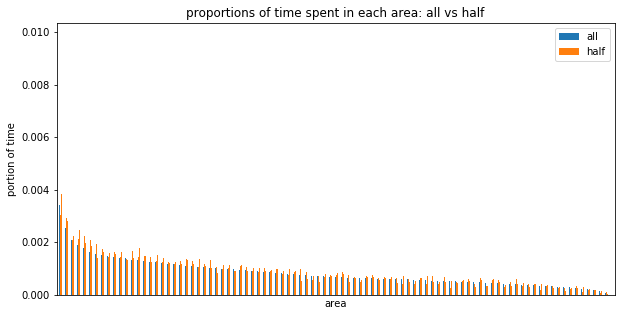

In [109]:

def get_area_to_time_spent(vectors):
    """
    Returns a dictionary mapping place to the portion of time spend in that place, 
    for all of the vectors in the vector set.

    i.e. {area: portion of time spent in area for each area seen in the vectors}
    
    """
    if not len(vectors):
        return {}
    vectors = get_unprefixed_vectors(vectors)
    vector_length = HOURS_PER_DAY * TIME_PERIOD_DAYS
    # assert that vectors do not have prefix
    assert(len(vectors[0]) == vector_length)
    
    area_to_total_time_dict = {}  #{area: total time in area}
    for v in vectors:
        for area in v:
            if area not in area_to_total_time_dict:
                area_to_total_time_dict[area] = 0
            area_to_total_time_dict[area] += 1
    # transform total time dict into time portion dict
    total_time = vector_length * len(vectors) # total hours per vector x number of vectors
    area_to_portion_of_time_dict = {a:t/total_time for a, t in area_to_total_time_dict.items()}
    return area_to_portion_of_time_dict


# Make the area to time spent dictionaries for the two sets of vectors we want to compare.
# We then take their difference.

def get_dictionary_difference(dict1, dict2):
    """
    Returns {area: v1-v2 for each v1, v2 value for v1 in dict1 and v2 in dict2}
    """
    all_areas = set(dict1.keys())
    all_areas.update(dict2.keys())
    difference_dict = {}
    for area in all_areas:
        v1 = dict1[area] if area in dict1 else 0
        v2 = dict2[area] if area in dict2 else 0
        difference_dict[area] = (v1 - v2)
    return difference_dict

from pylab import rcParams
rcParams['figure.figsize'] = 10, 5

def compare_time_spent(time_spent_d1, time_spent_d2,
                        d1_name='agg. time portion (1)',  d2_name='agg. time portion (2)'):
    # Make a dataframe with columns: area, aggregate time portion (1), aggregate time portion (2)
    # In order to compare and check the correlation the in where people spent aggregate time for
    # specific areas between (1) and (2), where (1) could be real data, and (2) could be synthetic data.
    
    # areas are union of two areas sets, without the null place
    area_set = (set(time_spent_d1.keys()) | set(time_spent_d2.keys())) - set({0})
    area_key = 'area'
    agg_time_key_1 = d1_name
    agg_time_key_2 = d2_name
    data = {area_key: [], agg_time_key_1: [], agg_time_key_2: []}
    for area in area_set:
        data[area_key].append(area)
        agg_time_1 = time_spent_d1[area] if area in time_spent_d1 else 0
        agg_time_2 = time_spent_d2[area] if area in time_spent_d2 else 0
        data[agg_time_key_1].append(agg_time_1)
        data[agg_time_key_2].append(agg_time_2)
    df = pd.DataFrame.from_dict(data)
    # order it by how much time is spent in area by d1 (e.g. real users)
    df.sort_values(agg_time_key_1, inplace=True, ascending=False)
    title = 'proportions of time spent in each area: %s vs %s' % (d1_name, d2_name)
    print('Correlation between ' + title)
    print(df.corr())
    ax = df.set_index('area').plot.bar(title=title)
    ax.set_ylabel('portion of time')
    plt.xticks([])
    
    return df

print('plotting all real trajectories vs half of all real trajectories')

real_vectors = real_trajectories
real_vectors_half = real_vectors[:len(real_vectors)//2]

real_area_to_time_spent = get_area_to_time_spent(real_vectors)
real_area_to_time_spent_half = get_area_to_time_spent(real_vectors_half)
# plot_time_spent_comparison(real_area_to_time_spent, real_area_to_time_spent_half)
df = compare_time_spent(real_area_to_time_spent, real_area_to_time_spent_half, d1_name='all', d2_name='half')


checking distribution of where time spent for real vs synthetic cambridge trajectories with temperature 0.8
Correlation between proportions of time spent in each area: real vs synthetic
               area      real  synthetic
area       1.000000  0.000302  -0.006076
real       0.000302  1.000000   0.995325
synthetic -0.006076  0.995325   1.000000

checking distribution of where time spent for real vs synthetic cambridge trajectories with temperature 0.9
Correlation between proportions of time spent in each area: real vs synthetic
               area      real  synthetic
area       1.000000  0.005237  -0.003266
real       0.005237  1.000000   0.994779
synthetic -0.003266  0.994779   1.000000

checking distribution of where time spent for real vs synthetic cambridge trajectories with temperature 1.0
Correlation between proportions of time spent in each area: real vs synthetic
               area      real  synthetic
area       1.000000 -0.004855  -0.005638
real      -0.004855  1.000000

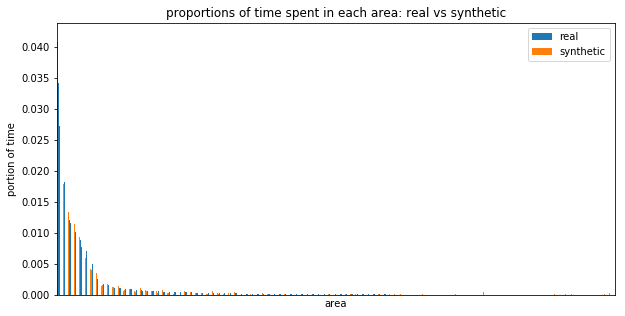

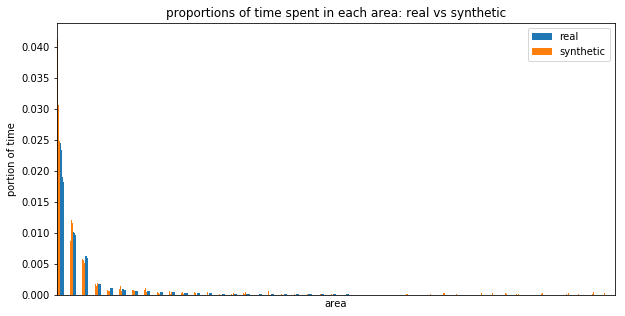

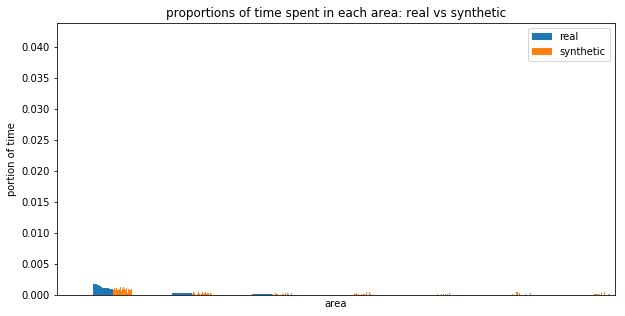

In [106]:
# Compare for generated cambridge trajectories.
# to do so, limit the real trajectories to those with cambridge prefixes.

for (temperature, generated_trajectories) in textgenrnn_cambridge_trajectories_set.items():
    print('\nchecking distribution of where time spent for real vs synthetic cambridge trajectories with temperature %s' % temperature)
    
    cambridge_prefixes = {tv[0] for tv in generated_trajectories}
    real_trajectories_cambridge = [tv for tv in real_trajectories if tv[0] in cambridge_prefixes]

    textgenrnn_cambridge_area_to_time_spent = get_area_to_time_spent(generated_trajectories)
    real_cambridge_area_to_time_spent = get_area_to_time_spent(real_trajectories_cambridge)

    df = compare_time_spent(real_cambridge_area_to_time_spent, textgenrnn_cambridge_area_to_time_spent,
                       d1_name='real', d2_name='synthetic')

comparing portions of time spent in all areas between real data and generated data with temperature 0.8


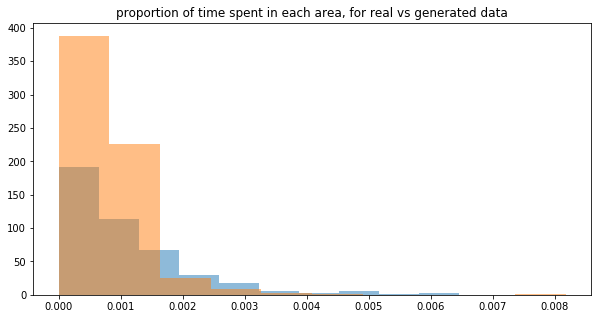

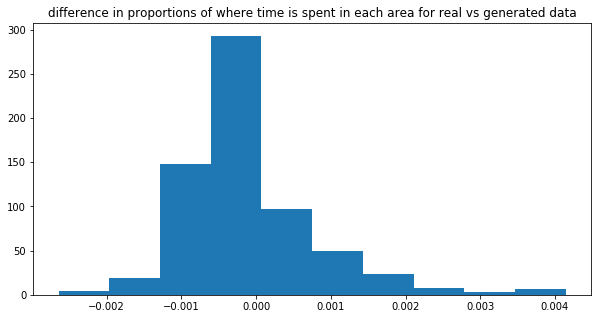

comparing portions of time spent in all areas between real data and generated data with temperature 0.9


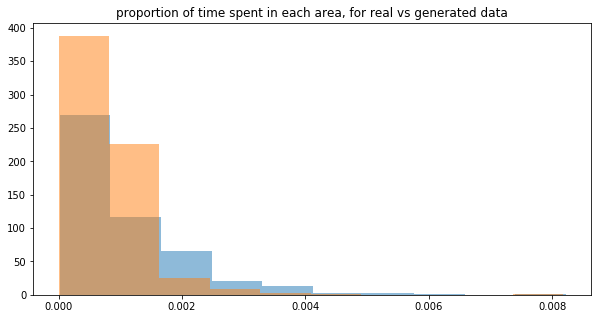

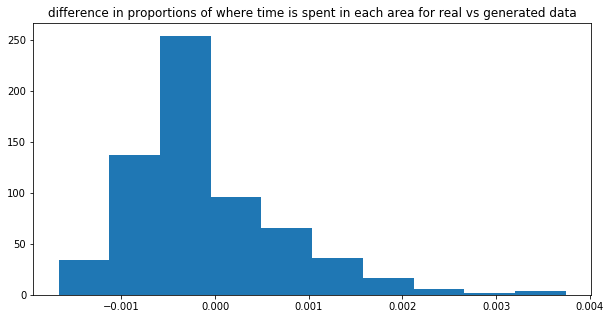

comparing portions of time spent in all areas between real data and generated data with temperature 1.0


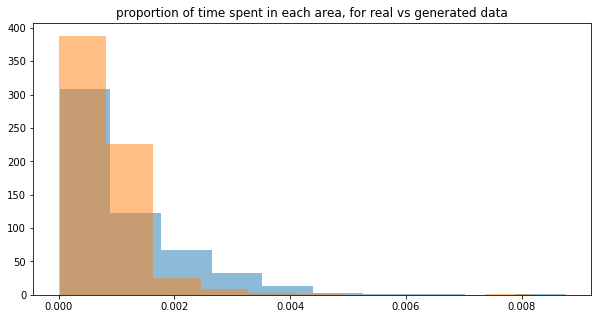

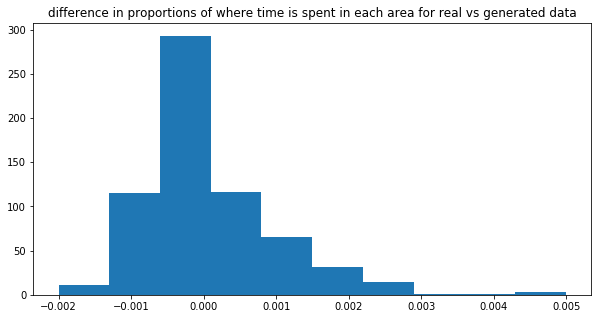

In [105]:
# Compare for generated all trajectories, for the varying temperatures.
for (temperature, generated_trajectory_set) in textgenrnn_all_trajectories_set.items():
    print('comparing portions of time spent in all areas between real data and generated data with temperature %s' % temperature)
    generated_area_to_time_spent = get_area_to_time_spent(generated_trajectory_set)
    real_area_to_time_spent = get_area_to_time_spent(real_trajectories)
    plot_time_spent_comparison(generated_area_to_time_spent, real_area_to_time_spent)

### Measure how closely the distribution of the number of distinct places visited by each synthetic user resembles distribution from real data

Plot two graphs showing the distributions of the number of distinct places visited by each user, one for the real dataset and another for the synthetic dataset.

In [106]:
def get_distinct_places_distribution(vectors):
    """
    Get the distribution of number of distinct places visited by each user.
    
    Returns a list of length matching number of user data vectors, 
    where each element corresponds to the number of distinct places visited by that user.
    """
    distinct_places_counts_per_user = []
    for vector in vectors:
        # get the number of distinct places visited by that user
        distinct_places = set()
        for area in vector:
            if area not in distinct_places:
                distinct_places.add(area)
        # append the number of distinct places visited by that user
        distinct_places_counts_per_user.append(len(distinct_places))
    return distinct_places_counts_per_user

comparing distinct number of places spent between real and generated cambridge trajectories


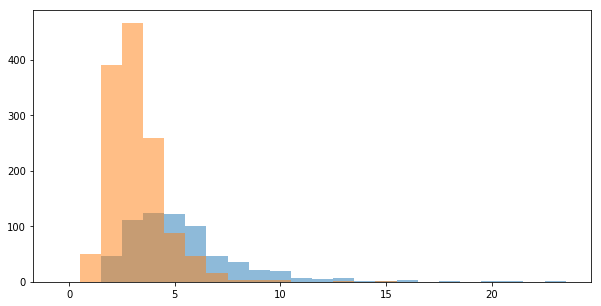

In [107]:
print('comparing distinct number of places spent between real and generated cambridge trajectories')

unprefixed_real_vectors = get_unprefixed_vectors(real_trajectories_cambridge)
unprefixed_generated_vectors = get_unprefixed_vectors(textgenrnn_cambridge_trajectories_08)

distinct_places_counts_per_user_real = get_distinct_places_distribution(unprefixed_real_vectors)
distinct_places_counts_per_user_generated = get_distinct_places_distribution(unprefixed_generated_vectors)

n_bins = 40
plt.hist(distinct_places_counts_per_user_real, bins=np.arange(25)-0.5, alpha=0.5)
plt.hist(distinct_places_counts_per_user_generated, bins=np.arange(25)-0.5, alpha=0.5)
plt.show()

comparing distributions of distinct number of areas visited between real data and generated data with temperature 0.8


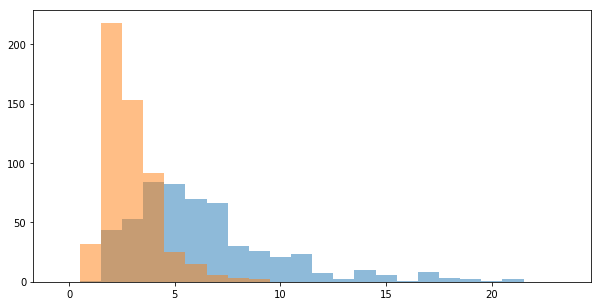

comparing distributions of distinct number of areas visited between real data and generated data with temperature 0.9


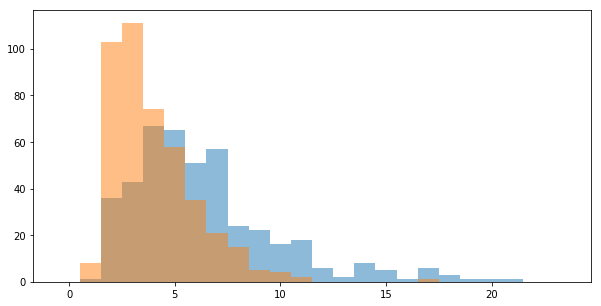

comparing distributions of distinct number of areas visited between real data and generated data with temperature 1.0


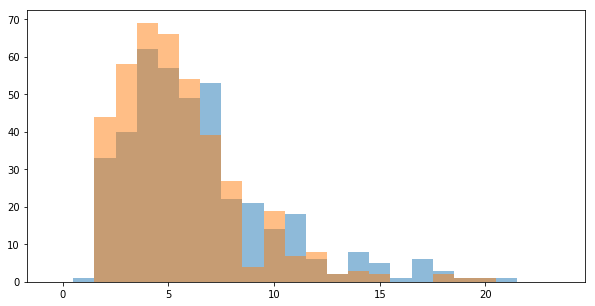

In [108]:
# Compare for generated all trajectories, for the varying temperatures.
for (temperature, generated_trajectory_set) in textgenrnn_all_trajectories_set.items():
    print('comparing distributions of distinct number of areas visited between real data and generated data with temperature %s' % temperature)
    unprefixed_real_vectors = get_unprefixed_vectors(real_trajectories[:len(generated_trajectory_set)])
    unprefixed_generated_vectors = get_unprefixed_vectors(generated_trajectory_set)

    distinct_places_counts_per_user_real = get_distinct_places_distribution(unprefixed_real_vectors)
    distinct_places_counts_per_user_generated = get_distinct_places_distribution(unprefixed_generated_vectors)

    n_bins = 40
    plt.hist(distinct_places_counts_per_user_real, bins=np.arange(25)-0.5, alpha=0.5)
    plt.hist(distinct_places_counts_per_user_generated, bins=np.arange(25)-0.5, alpha=0.5)
    plt.show()

### Evaluate how much privacy was retained vs lost

TODO

Develop a metric to compute the degree to which the generated vectors match real vectors.

For a given home label there are 3 quantities:
- Total number of *real* vectors with that home label
- Total number of *fake* vectors with that home label (we may generate N times the number of real vectors)
- Number of fake vectors that exactly match a real vector


For now we just measure number of fake vectors matching real vectors...